# LSTM(年齢予測)

## import ライブラリー

In [1]:
"""%%bash
python3 -m pip install --user torch
python3 -m pip install --user scikit-learn"""

'%%bash\npython3 -m pip install --user torch\npython3 -m pip install --user scikit-learn'

In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold

from scipy.stats import pearsonr
import math

import torch
import torch.nn as nn

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.cuda.device_count()
#torch.set_default_tensor_type('torch.cuda.FloatTensor')

1

In [3]:
device

device(type='cuda')

## Data定義

In [16]:
%%time
#6分ぐらいかかる
df_aal = pd.read_csv('../02_data_analysis/roi_timeseries/timeseries_aal.csv')
df_ho = pd.read_csv('../02_data_analysis/roi_timeseries/timeseries_ho.csv')

#df_dynamic_aal = pd.read_csv('../02_data_analysis/dynamic_FC/dynamic_aal.csv')
#df_dynamic_ho = pd.read_csv('../02_data_analysis/dynamic_FC/dynamic_ho.csv')

df_subjects_info = pd.read_csv('../02_data_analysis/subjects_info/subjects_info.csv')

CPU times: user 3.1 s, sys: 132 ms, total: 3.23 s
Wall time: 3.23 s


In [17]:
def make_info_data(df = df_subjects_info,col = ['Age','Sex','やる気スコア(Apathy scale)']):
    subID = np.array(df.subID)
    subjects_info_list = []
    for ID in subID:
        data = np.array(df[df.subID == ID][col])[0]
        if 'Sex' in col:
            idx_sex = col.index('Sex')
            if data[idx_sex] == '男':
                data[idx_sex] = 0
            else:
                data[idx_sex] = 1
        
        subjects_info_list.append(data)
    subjects_info = np.array(subjects_info_list)
    
    if 'Age' in col:
        idx_age = col.index('Age')
    for i in range(len(col)):
        if i == idx_age:
            subjects_info[:,i] = (subjects_info[:,i] - \
                                  np.mean(subjects_info[:,i]))/np.std(subjects_info[:,i])
    return subjects_info.astype(np.float)

def make_data(df, subID = df_subjects_info.subID ,remove_list = ['time','subID']):
    data_list = []
    df_cols = list(df.columns)
    for r in remove_list:
        try:
            df_cols.remove(r)
        except:
            pass
    for ID in df_subjects_info.subID:
        data = df[df.subID == ID][df_cols]
        data = np.array(data)
        data_list.append(data)
    data = np.array(data_list)
    return data

In [18]:
%%time
data_label = make_info_data()
data_aal = make_data(df_aal)
data_ho = make_data(df_ho)

age_mean = df_subjects_info.Age.mean()
age_std = df_subjects_info.Age.std()

CPU times: user 10 s, sys: 26.6 ms, total: 10.1 s
Wall time: 10.1 s


In [19]:
data_label.shape
data_aal.shape
data_ho.shape

(615, 3)

(615, 140, 116)

(615, 140, 110)

In [8]:
#30秒ぐらいかかる
#data_dynamic_aal = make_data(df_dynamic_aal)
#data_dynamic_ho = make_data(df_dynamic_ho)

#data_dynamic_aal.shape
#data_dynamic_ho.shape

## Model作成

In [21]:
class Model(nn.Module):    
    def __init__(self,
                 input_dim,
                 hidden_dim,
                 num_layers,
                 time_len,
                 fc_drop,
                 bidirectional
                ):
        super(Model, self).__init__()
        self.fc0  = nn.Linear(input_dim,hidden_dim)
        self.lstm = nn.LSTM(input_size  = hidden_dim,
                            hidden_size = hidden_dim,
                            num_layers = num_layers,
                            batch_first = True,
                            bidirectional = bidirectional,
                            dropout = 0.1)
        if bidirectional:
            self.fc1  = nn.Linear(hidden_dim*2,1)
        else:
            self.fc1  = nn.Linear(hidden_dim,1)
        self.fc2  = nn.Linear(time_len,1)
        self.drop  = nn.Dropout(fc_drop)
        self.time_len = time_len
        
    def forward(self,x):
        x = self.fc0(x)
        x,_ = self.lstm(x)
        x = self.fc1(x)
        x = self.drop(x)
        x = torch.reshape(x, (-1, self.time_len))
        x = self.fc2(x)
        return x

In [22]:
class MyDataset(torch.utils.data.Dataset):
    def __init__(self, data, label=None):
        self.data = data
        self.label = label
        self.test = label is None
        self.length = data.shape[0]
    def __len__(self):
        return self.length
    def __getitem__(self,idx):
        if self.test:
            data = torch.tensor(self.data[idx])
            return data
        else:
            data = torch.tensor(self.data[idx])
            label = torch.tensor(self.label[idx])
            return data, label

In [23]:
def compute_loss(y, t):
    criterion = nn.MSELoss()
    return criterion(y, t)

def train_step(x,t,model,optimizer):
    model.train()
    preds = model(x)
    loss = compute_loss(preds, t)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    return loss, preds

def val_step(x,t,model):
    model.eval()
    preds = model(x)
    loss = compute_loss(preds, t)    
    return loss, preds

def test_step(x,model):
    model.eval()
    preds = model(x)
    return preds

def seed_worker(seed=0):
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

In [24]:
class EarlyStopping:
    '''
    早期終了 (early stopping)
    '''
    def __init__(self, patience=0, verbose=0, mode='loss'):
        self._step = 0
        self.patience = patience
        self.verbose = verbose
        
        self.mode = mode
        
        if self.mode == 'loss':
            self._loss = float('inf')
        elif self.mode == 'score':
            self._score = 0.
        else:
            raise Exception('error')

    def __call__(self, value):
        if self.mode == 'loss':
            if self._loss < value:
                self._step += 1
                if self._step > self.patience:
                    if self.verbose:
                        print('early stopping')
                    return True
            else:
                self._step = 0
                self._loss = value

            return False
        
        elif self.mode == 'score':
            if self._score > value:
                self._step += 1
                if self._step > self.patience:
                    if self.verbose:
                        print('early stopping')
                    return True
            else:
                self._step = 0
                self._score = value

            return False

In [25]:
def train_model(data,
                label,
                train_idx,
                test_idx,
                n_splits,
                bidirectional,
                epochs     = 750,
                hidden_dim = 128,
                num_layers = 2,
                fc_drop = 0.1,
                title = ''
                ):
    
    epochs = epochs
    seed_worker()
    label = np.array([label[:,0]]).T
    
    train_all = data[train_idx]
    test  = data[test_idx]
    
    train_label_all = label[train_idx]
    test_label  = label[test_idx]
    
    input_dim  = data.shape[2]
    time_len   = data.shape[1]
    hidden_dim = hidden_dim
    num_layers = num_layers
    bidirectional = bidirectional
    fc_drop = fc_drop
    
    model_path = '../02_data_analysis/model/model_lstm.pth'
    
    if torch.cuda.device_count() > 1:
        batch_size = 32 * torch.cuda.device_count()
    else:
        batch_size = 32
    
    test_dataset = MyDataset(test)
    test_dataloader = torch.utils.data.DataLoader(test_dataset,
                                                  batch_size=batch_size,
                                                  num_workers=8,
                                                  persistent_workers=True)
    
    kf = KFold(n_splits=n_splits,shuffle=False)
    test_pred_all = []
    test_pred_all_corrected = []
    
    for n_fold, (train_index, val_index) in enumerate(kf.split(train_all)):
        save_epochs = 0
        train_loss_plot = []
        val_loss_plot = []
        
        train, train_label = train_all[train_index], train_label_all[train_index]
        val,   val_label   = train_all[val_index],   train_label_all[val_index]
        
        
        train_dataset    = MyDataset(train,train_label)
        train_dataloader = torch.utils.data.DataLoader(train_dataset,
                                                       batch_size=batch_size,
                                                       shuffle=True,
                                                       num_workers=8,
                                                       persistent_workers=True)
    

        val_dataset      = MyDataset(val,val_label)
        val_dataloader   = torch.utils.data.DataLoader(val_dataset,
                                                       batch_size=batch_size,
                                                       num_workers=8,
                                                       persistent_workers=True)
        model = Model(input_dim = input_dim,
                      hidden_dim = hidden_dim,
                      time_len = time_len,
                      num_layers = num_layers,
                      fc_drop = fc_drop,
                      bidirectional = bidirectional
                     )
        
        if torch.cuda.device_count() > 1:
            print("Let's use", torch.cuda.device_count(), "GPUs!")
            # dim = 0 [30, xxx] -> [10, ...], [10, ...], [10, ...] on 3 GPUs
            model = nn.DataParallel(model)

        model.to(device)
        
        optimizer = torch.optim.AdamW(model.parameters(),lr=1e-4)
        
        es = EarlyStopping(patience=200, verbose=1, mode='loss')
        best_val_loss = 1e5
        
        for epoch in range(epochs):
            train_loss = 0.
            val_loss = 0.

            for (x, t) in train_dataloader:
                x, t = x.to(device), t.to(device)
                x = x.float()
                t = t.float()
                loss, preds = train_step(x,t,model,optimizer)
                train_loss += loss.item()
            train_loss /= len(train_dataloader)
            
            for (x, t) in val_dataloader:
                x, t = x.to(device), t.to(device)
                x = x.float()
                t = t.float()
                loss, preds = val_step(x,t,model)
                val_loss += loss.item()
            val_loss /= len(val_dataloader)
            
            if (epoch+1) % 100 == 0:
                print(f'Kfold: {n_fold+1} ::: epoch: {epoch+1}, loss: {train_loss}, val loss: {val_loss}')
                
            #early stopping
            if epoch <=200:
                pass
            elif es(val_loss):
                break

            # modelの保存
            if epoch <=200:
                pass
            elif val_loss < best_val_loss:
                save_epochs = epoch+1
                best_val_loss = val_loss
                torch.save(model.state_dict(), model_path)
        
            train_loss_plot.append(train_loss)
            val_loss_plot.append(val_loss)
        
        model.load_state_dict(torch.load(model_path))
        print(f'save_epochs:{save_epochs}')
        print(f'best val loss:{best_val_loss}')
        
        train_loss_plot = np.array(train_loss_plot)
        val_loss_plot   = np.array(val_loss_plot)
        x               = np.linspace(0, len(train_loss_plot), len(train_loss_plot))
        
        plt.figure(figsize=(6, 4), dpi=80)
        plt.plot(x, train_loss_plot, label="train loss")
        plt.plot(x, val_loss_plot, label="val loss")
        plt.title('Loss Curves' + ' ' + title, fontsize=14)   # 図のタイトル
        plt.xlabel('Epochs',fontsize=14) # x軸のラベル
        plt.ylabel('MSELoss',fontsize=14) # y軸のラベル
        plt.legend(fontsize=10.5)
        plt.grid()
        plt.show()
        
        train_pred = []
        train_label = []
        
        for (x, t) in train_dataloader:
            x, t = x.to(device), t.to(device)
            x = x.float()
            t = t.float()
            loss, preds = val_step(x,t,model)
            train_pred.append(preds)
            train_label.append(t)
        
        val_pred = []
        for (x, t) in val_dataloader:
            x, t = x.to(device), t.to(device)
            x = x.float()
            t = t.float()
            loss, preds = val_step(x,t,model)
            val_pred.append(preds)
        
        train_pred = torch.cat(train_pred)
        train_pred = train_pred.to('cpu').detach().numpy().copy()
        
        train_label = torch.cat(train_label)
        train_label = train_label.to('cpu').detach().numpy().copy()
        
        val_pred = torch.cat(val_pred)
        val_pred = val_pred.to('cpu').detach().numpy().copy()
        
        new_line = '\n'
        
        corr,p = pearsonr(train_label[:,0],np.array(train_pred[:,0]))
        
        plt.figure(figsize=(6, 6), dpi=80)
        plt.scatter((train_label[:,0]*age_std)+age_mean,(np.array(train_pred[:,0])*age_std)+age_mean,
                   label = f'corrcoef : {corr:.3f}{new_line}p value : {p}')
        plt.title(title + ' ' + 'scatter train', fontsize=14)   # 図のタイトル
        plt.xlabel('chronological age', fontsize=14) # x軸のラベル
        plt.ylabel('predicted age', fontsize=14) # y軸のラベル
        plt.legend(fontsize=10.5)
        plt.grid()
        plt.show()
        print('r^2 train data: ', r2_score(train_label[:,0],np.array(train_pred[:,0])))
        
        corr,p = pearsonr(val_label[:,0],np.array(val_pred[:,0]))
        
        plt.figure(figsize=(6, 6), dpi=80)
        plt.scatter((val_label[:,0]*age_std)+age_mean,(np.array(val_pred[:,0])*age_std)+age_mean,
                   label = f'corrcoef : {corr:.3f}{new_line}p value : {p}')
        plt.title(title + ' ' + 'scatter val', fontsize=14)   # 図のタイトル
        plt.xlabel('chronological age', fontsize=14) # x軸のラベル
        plt.ylabel('predicted age', fontsize=14) # y軸のラベル
        plt.legend(fontsize=10.5)
        plt.grid()
        plt.show()
        print('r^2 val data: ', r2_score(val_label[:,0],np.array(val_pred[:,0])))
        
        lr = LinearRegression()
        lr.fit(val_label*age_std+age_mean,val_pred[:,0]*age_std+age_mean)
        
        plt.figure(figsize=(6, 6), dpi=80)
        plt.scatter(val_label[:,0]*age_std+age_mean,val_pred[:,0]*age_std+age_mean,
                   label = f'corrcoef : {corr:.3f}{new_line}p value : {p}')#散布図をプロット
        plt.plot(val_label[:,0]*age_std + age_mean,
                 lr.predict(val_label*age_std+age_mean), color = 'red',
                label = f'y = {lr.coef_[0]:.3f}x + {lr.intercept_:.3f}')#回帰直線をプロット
        
        plt.title(title + ' ' + 'val', fontsize=14)  # 図のタイトル
        plt.xlabel('chronological age', fontsize=14) # x軸のラベル
        plt.ylabel('predicted age', fontsize=14) # y軸のラベル
        plt.legend(fontsize=10.5)
        plt.grid()  # グリッド線を表示
        plt.show()  # 図の表示
        print('切片:', lr.intercept_)
        print('傾き:', lr.coef_[0])
                
        test_pred = []
        for x in test_dataloader:
            x = x.to(device)
            x = x.float()
            preds = test_step(x,model)
            test_pred.append(preds)
        test_pred = torch.cat(test_pred)
        test_pred = test_pred.to('cpu').detach().numpy().copy()
        test_pred_corrected = (test_pred*age_std+age_mean - lr.intercept_)/ lr.coef_[0]
        test_pred_corrected = (test_pred_corrected-age_mean) / age_std
        if lr.coef_[0] > 0.25:
            test_pred_all.append(test_pred)
            test_pred_all_corrected.append(test_pred_corrected)
        
    return np.array(test_pred_all),np.array(test_pred_all_corrected),test_label

In [26]:
n_splits = 5

## 学習(AAL)

### ROI 1

Nested Kfold ::: 1
Kfold: 1 ::: epoch: 100, loss: 0.013223398530569214, val loss: 0.5899783223867416
Kfold: 1 ::: epoch: 200, loss: 0.008865535080146331, val loss: 0.5956906899809837
Kfold: 1 ::: epoch: 300, loss: 0.00840430624353198, val loss: 0.5884103253483772
Kfold: 1 ::: epoch: 400, loss: 0.004723928331469114, val loss: 0.5589073747396469
Kfold: 1 ::: epoch: 500, loss: 0.0044551936622995595, val loss: 0.5606677308678627
Kfold: 1 ::: epoch: 600, loss: 0.003826588177337096, val loss: 0.5491048395633698
Kfold: 1 ::: epoch: 700, loss: 0.0030199292724808822, val loss: 0.5412065014243126
Kfold: 1 ::: epoch: 800, loss: 0.0030639474369728793, val loss: 0.5402831062674522
Kfold: 1 ::: epoch: 900, loss: 0.0024658185698521826, val loss: 0.52317875623703
Kfold: 1 ::: epoch: 1000, loss: 0.0030719847776568853, val loss: 0.5193109810352325
save_epochs:988
best val loss:0.5021234415471554


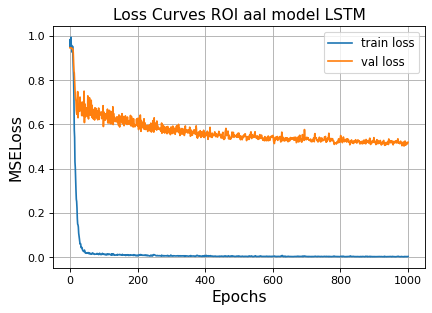

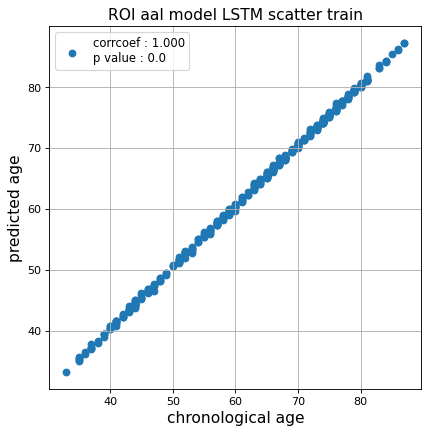

r^2 train data:  0.9981145306940931


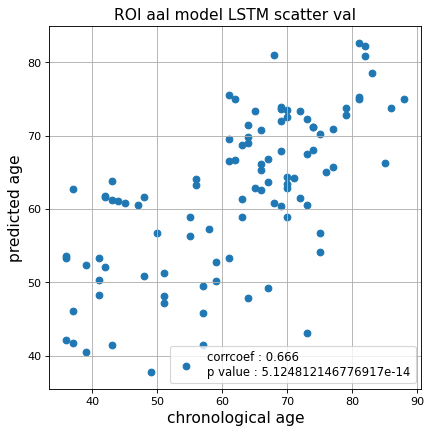

r^2 val data:  0.43350894097420034


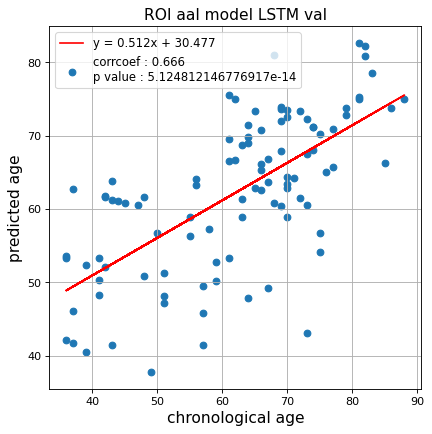

切片: 30.477292191626844
傾き: 0.5116994080638194
Kfold: 2 ::: epoch: 100, loss: 0.017929677923138324, val loss: 0.9124184399843216
Kfold: 2 ::: epoch: 200, loss: 0.013979364258165542, val loss: 0.8496778011322021
Kfold: 2 ::: epoch: 300, loss: 0.008076349327054162, val loss: 0.7831849902868271
Kfold: 2 ::: epoch: 400, loss: 0.006892147868012006, val loss: 0.7468509674072266
Kfold: 2 ::: epoch: 500, loss: 0.005103944872434323, val loss: 0.7231286019086838
Kfold: 2 ::: epoch: 600, loss: 0.004277747276668938, val loss: 0.7009232044219971
Kfold: 2 ::: epoch: 700, loss: 0.006492611647655184, val loss: 0.676091842353344
Kfold: 2 ::: epoch: 800, loss: 0.003563641391407985, val loss: 0.6600239723920822
Kfold: 2 ::: epoch: 900, loss: 0.003589792911393138, val loss: 0.6528507173061371
Kfold: 2 ::: epoch: 1000, loss: 0.003715713956178381, val loss: 0.6288650333881378
save_epochs:918
best val loss:0.6281550750136375


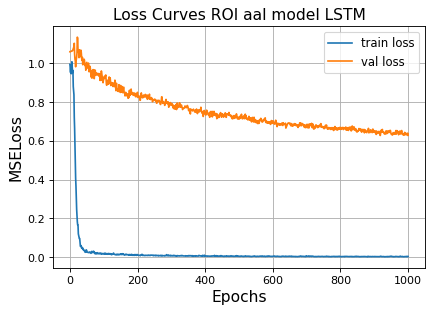

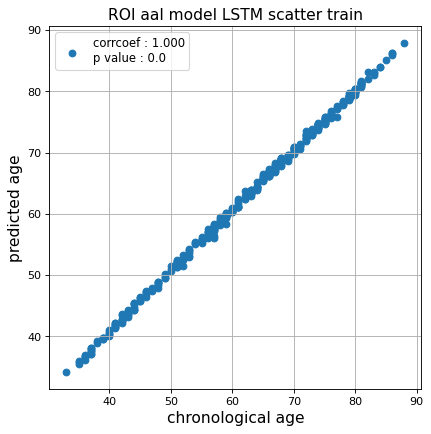

r^2 train data:  0.9971170512356499


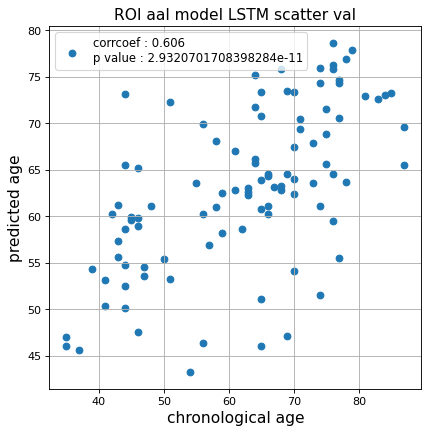

r^2 val data:  0.3619387665236642


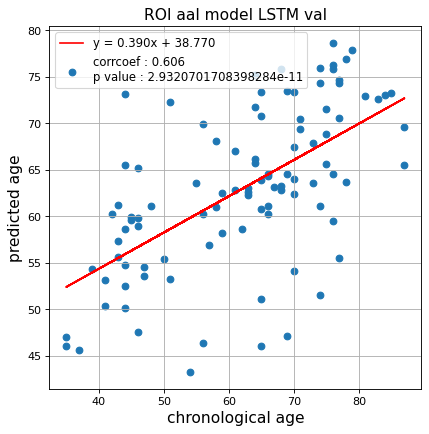

切片: 38.77009195074613
傾き: 0.38989721858129495
Kfold: 3 ::: epoch: 100, loss: 0.018592974099402245, val loss: 1.2607251405715942
Kfold: 3 ::: epoch: 200, loss: 0.010919211539798059, val loss: 1.2043447643518448
Kfold: 3 ::: epoch: 300, loss: 0.00878586140103065, val loss: 1.166355475783348
Kfold: 3 ::: epoch: 400, loss: 0.0068806179512578705, val loss: 1.1803517639636993
Kfold: 3 ::: epoch: 500, loss: 0.004993041171334111, val loss: 1.1555080860853195
Kfold: 3 ::: epoch: 600, loss: 0.005227177063576304, val loss: 1.1540749371051788
early stopping
save_epochs:426
best val loss:1.0797422677278519


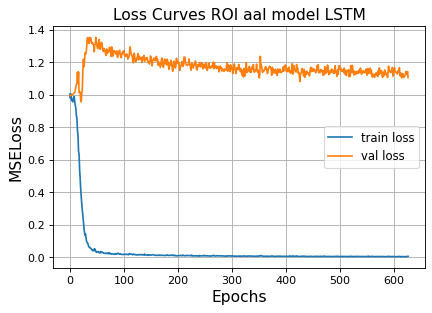

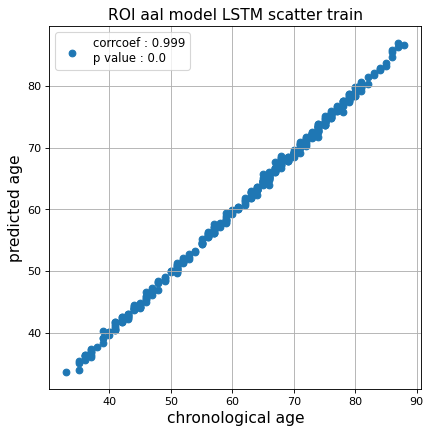

r^2 train data:  0.9965303814797091


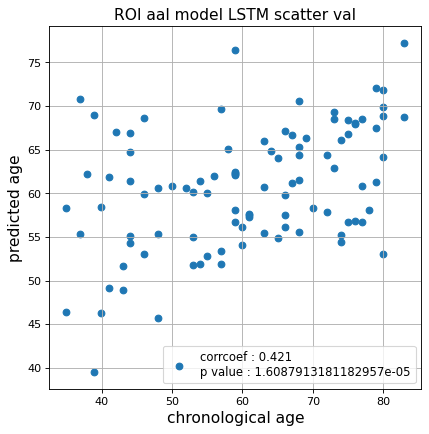

r^2 val data:  0.16858407101741146


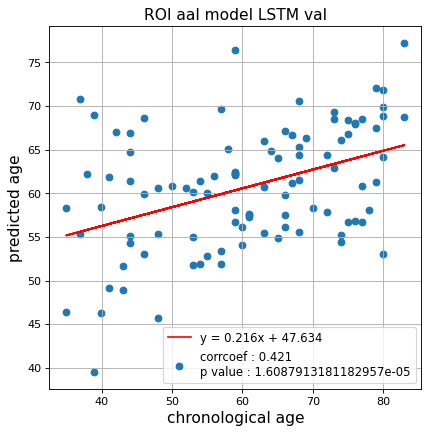

切片: 47.63389377226396
傾き: 0.21550338511945263
Kfold: 4 ::: epoch: 100, loss: 0.023470112265875705, val loss: 1.8836448192596436
Kfold: 4 ::: epoch: 200, loss: 0.015144157939805435, val loss: 1.7037946432828903
Kfold: 4 ::: epoch: 300, loss: 0.011829208116978407, val loss: 1.5485941469669342
Kfold: 4 ::: epoch: 400, loss: 0.0076155665760430005, val loss: 1.5097675174474716
Kfold: 4 ::: epoch: 500, loss: 0.005016360682650254, val loss: 1.550317108631134
Kfold: 4 ::: epoch: 600, loss: 0.0054098006087140394, val loss: 1.514690786600113
Kfold: 4 ::: epoch: 700, loss: 0.004320577879507954, val loss: 1.512215942144394
Kfold: 4 ::: epoch: 800, loss: 0.004292463024075215, val loss: 1.5148747861385345
Kfold: 4 ::: epoch: 900, loss: 0.004000970466922109, val loss: 1.4967498630285263
Kfold: 4 ::: epoch: 1000, loss: 0.0035614086529956413, val loss: 1.504739671945572
early stopping
save_epochs:799
best val loss:1.4548858404159546


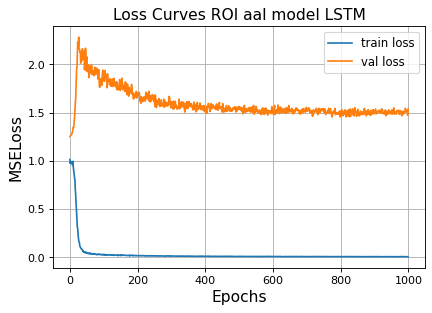

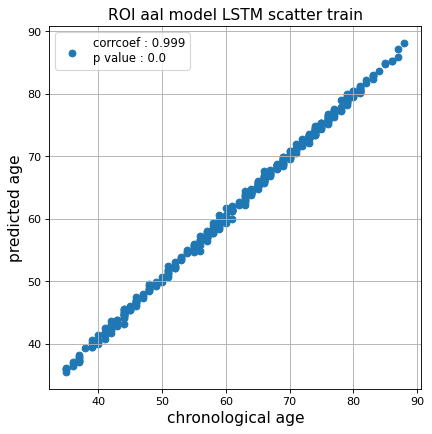

r^2 train data:  0.9978902603791576


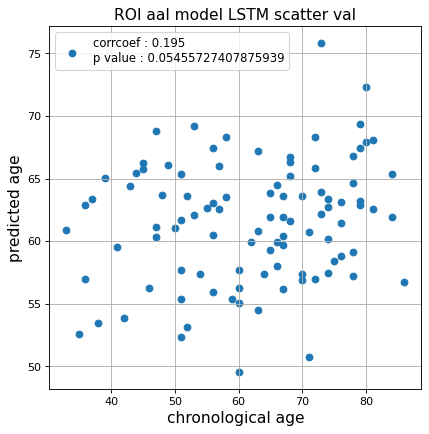

r^2 val data:  0.008900786247616255


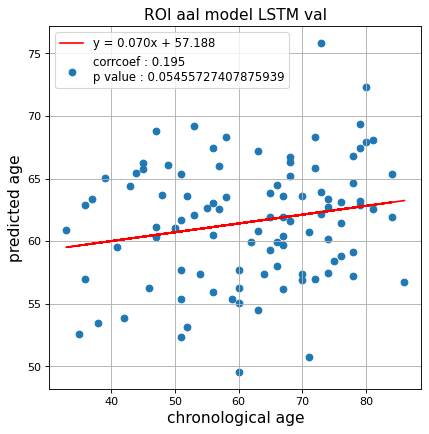

切片: 57.18770529771632
傾き: 0.07039682719118871
Kfold: 5 ::: epoch: 100, loss: 0.018338436905581217, val loss: 1.2780711501836777
Kfold: 5 ::: epoch: 200, loss: 0.013623089099732729, val loss: 1.1375678777694702
Kfold: 5 ::: epoch: 300, loss: 0.009101894863236409, val loss: 0.995725229382515
Kfold: 5 ::: epoch: 400, loss: 0.006810032225285585, val loss: 0.9512379318475723
Kfold: 5 ::: epoch: 500, loss: 0.004789251601323485, val loss: 0.9069416373968124
Kfold: 5 ::: epoch: 600, loss: 0.0038087690750566814, val loss: 0.9047877490520477
Kfold: 5 ::: epoch: 700, loss: 0.0031712593313736413, val loss: 0.9017581045627594
Kfold: 5 ::: epoch: 800, loss: 0.002545065407712872, val loss: 0.8777938634157181
Kfold: 5 ::: epoch: 900, loss: 0.0022228724735144237, val loss: 0.8778044581413269
early stopping
save_epochs:748
best val loss:0.8604810684919357


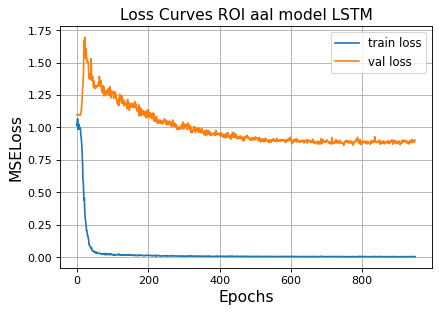

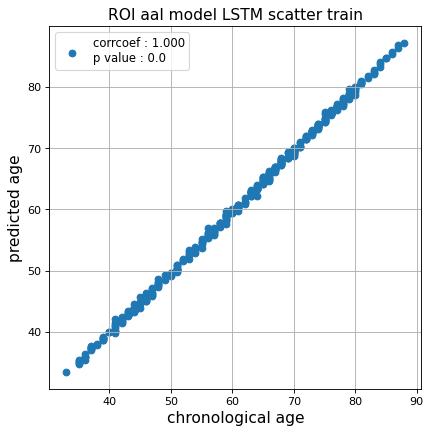

r^2 train data:  0.9985281107832431


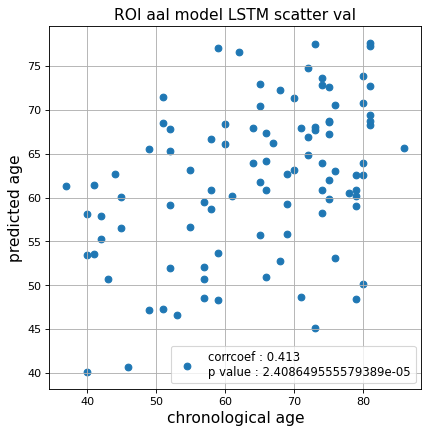

r^2 val data:  0.05891630410493487


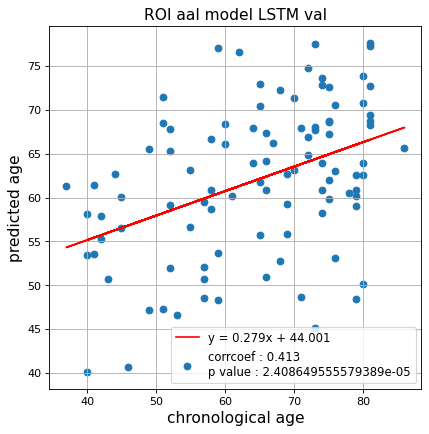

切片: 44.00144864682838
傾き: 0.27876064853958643
Nested Kfold ::: 2
Kfold: 1 ::: epoch: 100, loss: 0.015671234398793716, val loss: 1.074412003159523
Kfold: 1 ::: epoch: 200, loss: 0.006941814620334368, val loss: 1.0402766317129135
Kfold: 1 ::: epoch: 300, loss: 0.0046713737985835625, val loss: 0.9843561202287674
Kfold: 1 ::: epoch: 400, loss: 0.004925296247865145, val loss: 1.0038739144802094
Kfold: 1 ::: epoch: 500, loss: 0.0034203620788712916, val loss: 0.9758769869804382
Kfold: 1 ::: epoch: 600, loss: 0.0038124277937011076, val loss: 1.0085473507642746
Kfold: 1 ::: epoch: 700, loss: 0.002562415409976473, val loss: 0.9751781672239304
Kfold: 1 ::: epoch: 800, loss: 0.0020767439362736275, val loss: 0.9643770009279251
Kfold: 1 ::: epoch: 900, loss: 0.0021861887742908527, val loss: 0.9223684668540955
Kfold: 1 ::: epoch: 1000, loss: 0.0022076508567596856, val loss: 0.9289519041776657
save_epochs:992
best val loss:0.8981113433837891


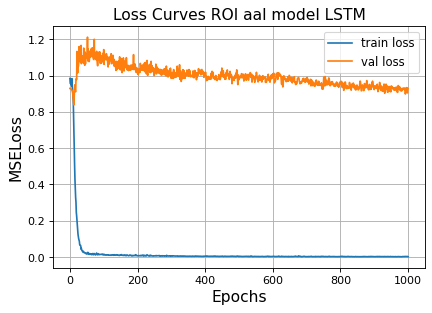

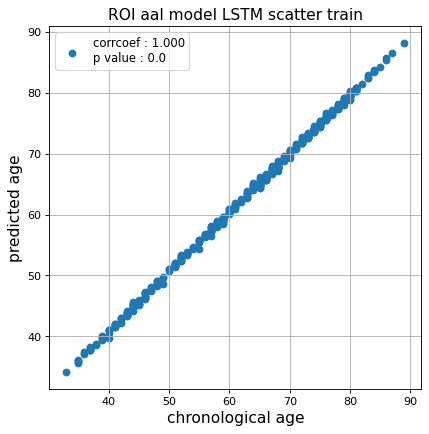

r^2 train data:  0.9980694340825993


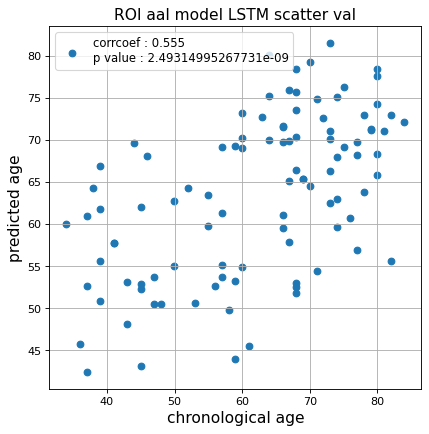

r^2 val data:  0.2765328089353505


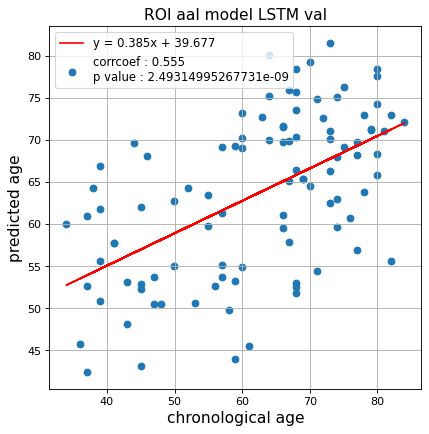

切片: 39.6772594993128
傾き: 0.3848227215422147
Kfold: 2 ::: epoch: 100, loss: 0.01992382710942855, val loss: 1.2836756706237793
Kfold: 2 ::: epoch: 200, loss: 0.016176121309399605, val loss: 1.2167347520589828
Kfold: 2 ::: epoch: 300, loss: 0.007546577638444992, val loss: 1.1296797692775726
Kfold: 2 ::: epoch: 400, loss: 0.007448294683574484, val loss: 1.1308650821447372
Kfold: 2 ::: epoch: 500, loss: 0.005841750597867828, val loss: 1.0881300270557404
Kfold: 2 ::: epoch: 600, loss: 0.0051067247807693025, val loss: 1.0716182589530945
Kfold: 2 ::: epoch: 700, loss: 0.005236519697623758, val loss: 1.0554144531488419
Kfold: 2 ::: epoch: 800, loss: 0.003971174072760802, val loss: 1.0331519693136215
Kfold: 2 ::: epoch: 900, loss: 0.005288672382728412, val loss: 1.0547350198030472
Kfold: 2 ::: epoch: 1000, loss: 0.004710759878015289, val loss: 1.057906836271286
save_epochs:907
best val loss:1.0177881121635437


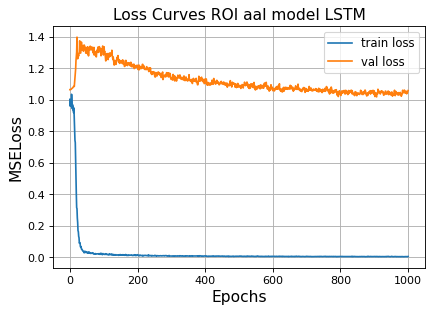

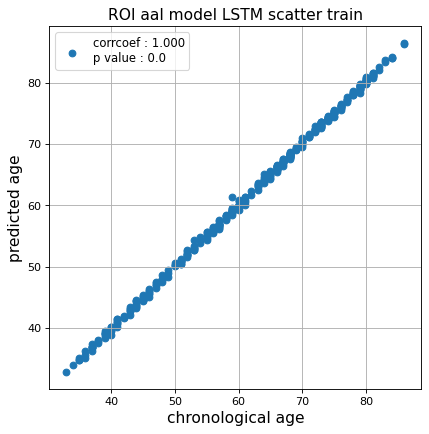

r^2 train data:  0.9990845617295295


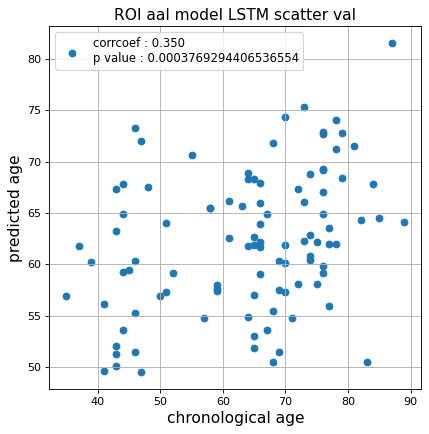

r^2 val data:  0.08327573498434682


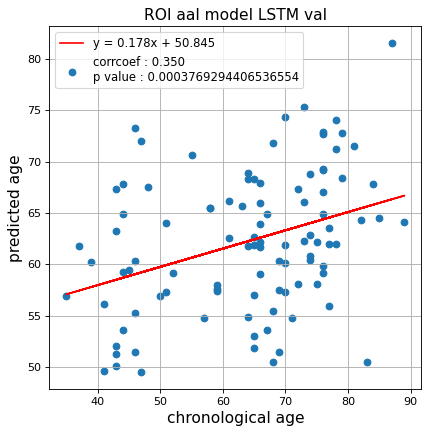

切片: 50.84535228395275
傾き: 0.17789769262880012
Kfold: 3 ::: epoch: 100, loss: 0.01945891360250803, val loss: 0.6230589151382446
Kfold: 3 ::: epoch: 200, loss: 0.014124269597232342, val loss: 0.6507267206907272
Kfold: 3 ::: epoch: 300, loss: 0.009325105840196976, val loss: 0.6851056814193726
Kfold: 3 ::: epoch: 400, loss: 0.005895383226183744, val loss: 0.6775923073291779
Kfold: 3 ::: epoch: 500, loss: 0.005008999867221484, val loss: 0.6762728691101074
early stopping
save_epochs:369
best val loss:0.6423183679580688


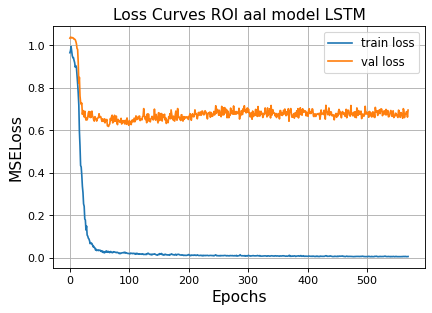

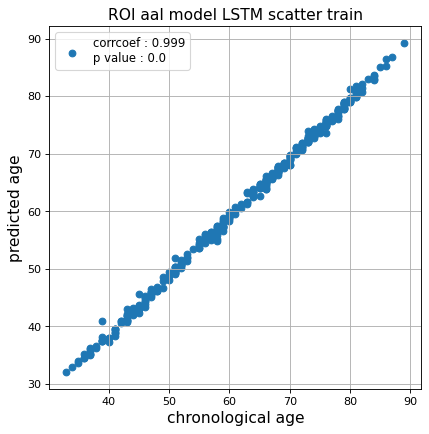

r^2 train data:  0.9928418403126187


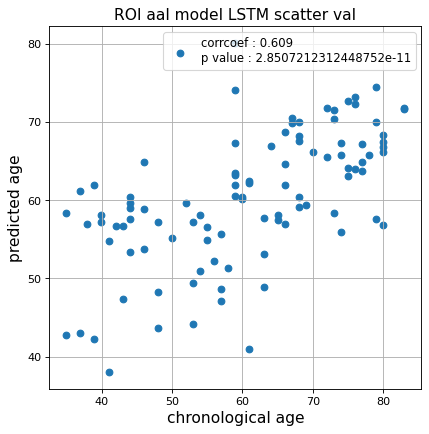

r^2 val data:  0.36994996875511355


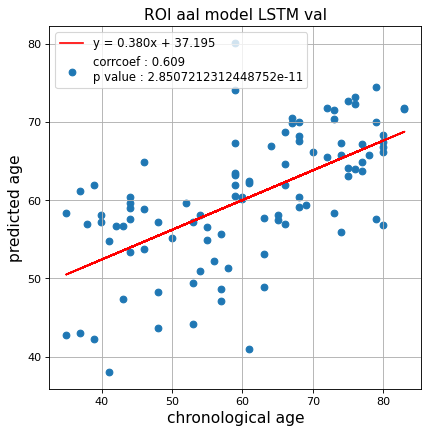

切片: 37.195334287063915
傾き: 0.3804362414277228
Kfold: 4 ::: epoch: 100, loss: 0.01945922151207924, val loss: 1.0872036069631577
Kfold: 4 ::: epoch: 200, loss: 0.010333760784795651, val loss: 1.0777378380298615
Kfold: 4 ::: epoch: 300, loss: 0.008056979698057357, val loss: 1.0365158021450043
Kfold: 4 ::: epoch: 400, loss: 0.006604166629795845, val loss: 1.0029339492321014
early stopping
save_epochs:241
best val loss:0.9900824576616287


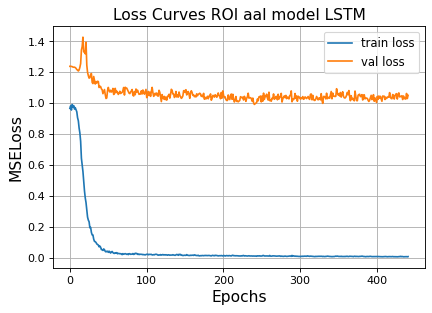

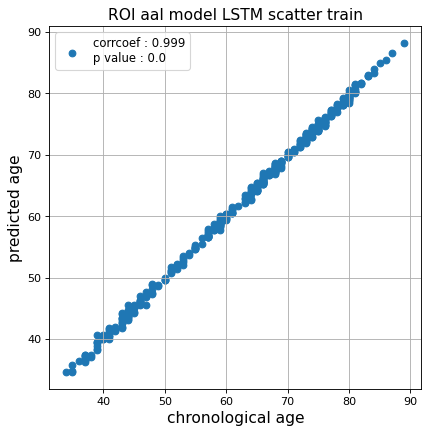

r^2 train data:  0.9983693999746622


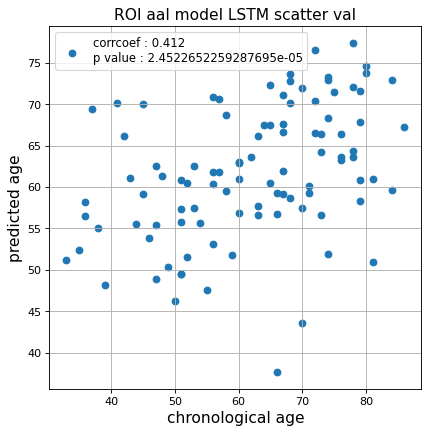

r^2 val data:  0.13306571830708258


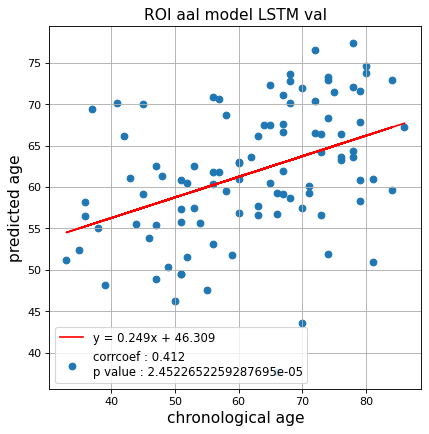

切片: 46.309403418024196
傾き: 0.24881265044823472
Kfold: 5 ::: epoch: 100, loss: 0.015393995894835545, val loss: 0.936573326587677
Kfold: 5 ::: epoch: 200, loss: 0.01230688769227037, val loss: 0.8607358783483505
Kfold: 5 ::: epoch: 300, loss: 0.007428730551439982, val loss: 0.8222874999046326
Kfold: 5 ::: epoch: 400, loss: 0.007231942001873484, val loss: 0.78810615837574
Kfold: 5 ::: epoch: 500, loss: 0.004138348731570519, val loss: 0.7535002827644348
Kfold: 5 ::: epoch: 600, loss: 0.004296015715226531, val loss: 0.7466894835233688
Kfold: 5 ::: epoch: 700, loss: 0.0027802576257202486, val loss: 0.7298618257045746
Kfold: 5 ::: epoch: 800, loss: 0.003335863548832444, val loss: 0.7180989757180214
Kfold: 5 ::: epoch: 900, loss: 0.002937876753723965, val loss: 0.7077312171459198
Kfold: 5 ::: epoch: 1000, loss: 0.0035218211392370555, val loss: 0.707932136952877
save_epochs:904
best val loss:0.699530303478241


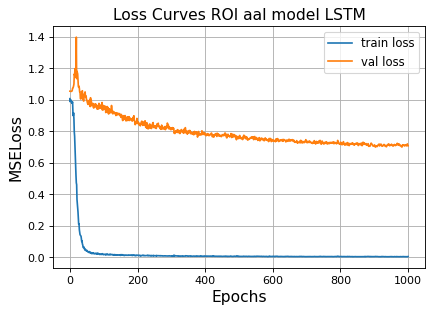

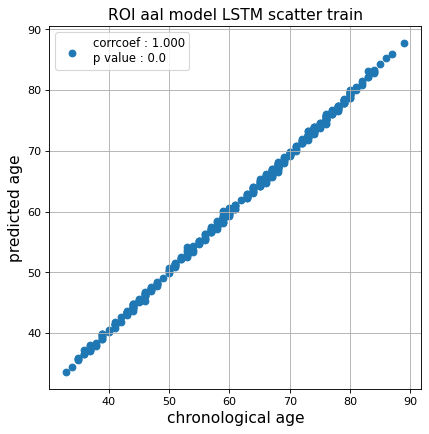

r^2 train data:  0.9979894404599974


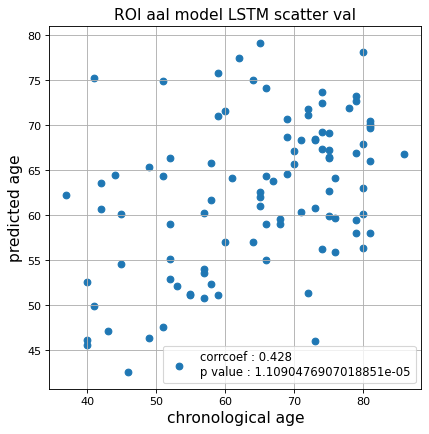

r^2 val data:  0.1004213641599705


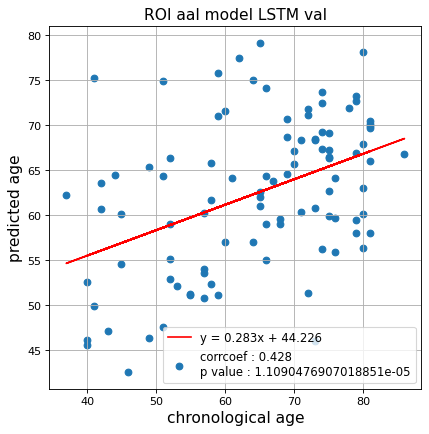

切片: 44.225738179361514
傾き: 0.2825094363422025
Nested Kfold ::: 3
Kfold: 1 ::: epoch: 100, loss: 0.012881110350673016, val loss: 1.0074660629034042
Kfold: 1 ::: epoch: 200, loss: 0.008114594393051587, val loss: 0.9356505870819092
Kfold: 1 ::: epoch: 300, loss: 0.004304286311917867, val loss: 0.9426777511835098
Kfold: 1 ::: epoch: 400, loss: 0.004873518384276674, val loss: 0.9243610203266144
Kfold: 1 ::: epoch: 500, loss: 0.0033087786824370804, val loss: 0.9369198828935623
Kfold: 1 ::: epoch: 600, loss: 0.003986567115554443, val loss: 0.9257588088512421
Kfold: 1 ::: epoch: 700, loss: 0.002991684882615048, val loss: 0.9143674969673157
Kfold: 1 ::: epoch: 800, loss: 0.0022402753104240848, val loss: 0.9226248413324356
Kfold: 1 ::: epoch: 900, loss: 0.002240868325595959, val loss: 0.9081169813871384
Kfold: 1 ::: epoch: 1000, loss: 0.0026921055619963086, val loss: 0.8911527842283249
save_epochs:939
best val loss:0.8680511265993118


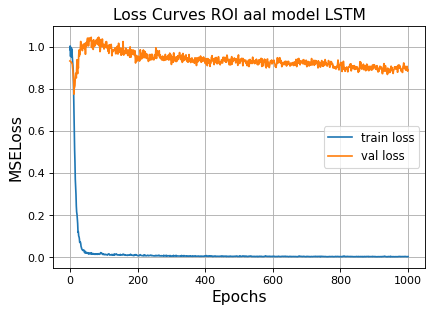

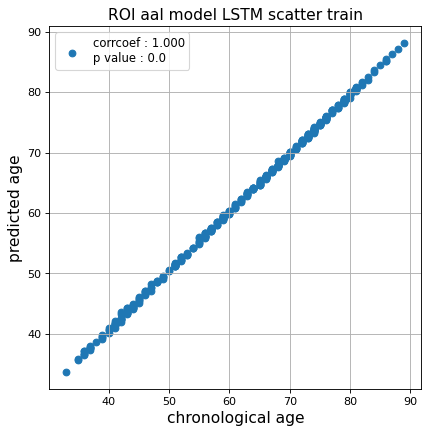

r^2 train data:  0.9988232163110189


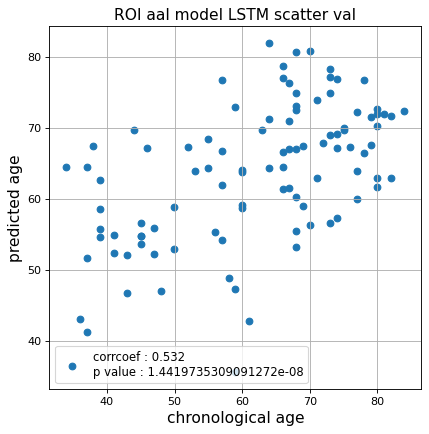

r^2 val data:  0.23873902583541395


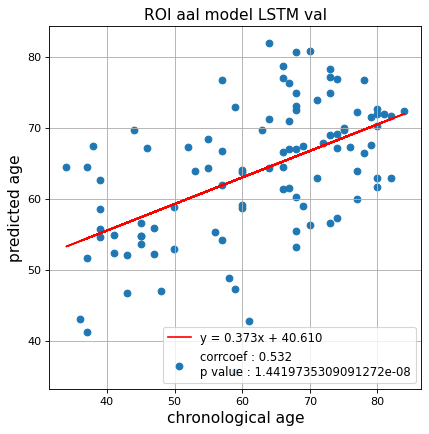

切片: 40.60952300863754
傾き: 0.3730247110260914
Kfold: 2 ::: epoch: 100, loss: 0.023036597941357356, val loss: 1.0307651162147522
Kfold: 2 ::: epoch: 200, loss: 0.014803958053772267, val loss: 0.9769662767648697
Kfold: 2 ::: epoch: 300, loss: 0.008748146418768626, val loss: 0.9077434465289116
Kfold: 2 ::: epoch: 400, loss: 0.006806070522333567, val loss: 0.8560528978705406
Kfold: 2 ::: epoch: 500, loss: 0.005301271251832636, val loss: 0.8562650978565216
Kfold: 2 ::: epoch: 600, loss: 0.005764192077689446, val loss: 0.8436282128095627
Kfold: 2 ::: epoch: 700, loss: 0.004842404132852187, val loss: 0.8411083221435547
Kfold: 2 ::: epoch: 800, loss: 0.004199582940110793, val loss: 0.8601321838796139
Kfold: 2 ::: epoch: 900, loss: 0.004735727937748799, val loss: 0.880578201264143
early stopping
save_epochs:719
best val loss:0.8340506218373775


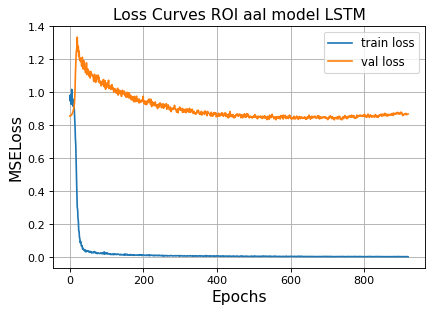

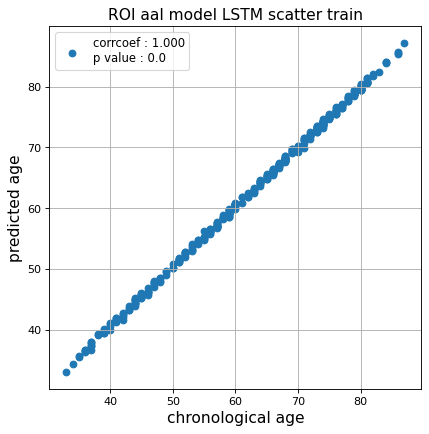

r^2 train data:  0.9987427669981276


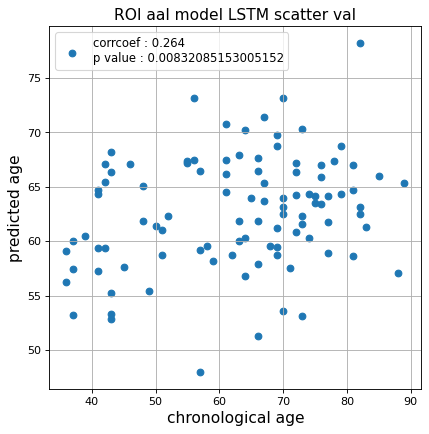

r^2 val data:  0.05880936189208108


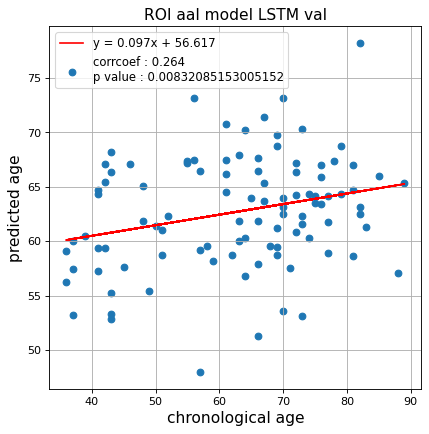

切片: 56.61718399198114
傾き: 0.09701232219644497
Kfold: 3 ::: epoch: 100, loss: 0.014635990588710858, val loss: 0.795348733663559
Kfold: 3 ::: epoch: 200, loss: 0.008764300208825331, val loss: 0.7492979466915131
Kfold: 3 ::: epoch: 300, loss: 0.005549173479756484, val loss: 0.7508475482463837


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/apps/t3/sles12sp4/free/jupyterlab/3.0.9/gcc4.8.5/python3.6.5/lib/python3.6/site-packages/IPython/core/magics/execution.py", line 1315, in time
    exec(code, glob, local_ns)
  File "<timed exec>", line 20, in <module>
  File "<ipython-input-25-836879236609>", line 87, in train_model
    loss, preds = train_step(x,t,model,optimizer)
  File "<ipython-input-23-f9cfbefa010c>", line 10, in train_step
    loss.backward()
  File "/home/1/16B14626/.local/lib/python3.6/site-packages/torch/_tensor.py", line 255, in backward
    torch.autograd.backward(self, gradient, retain_graph, create_graph, inputs=inputs)
  File "/home/1/16B14626/.local/lib/python3.6/site-packages/torch/autograd/__init__.py", line 149, in backward
    allow_unreachable=True, accumulate_grad=True)  # allow_unreachable flag
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/apps/t3/sles12sp4/free/jupyter

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/apps/t3/sles12sp4/free/jupyterlab/3.0.9/gcc4.8.5/python3.6.5/lib/python3.6/site-packages/IPython/core/magics/execution.py", line 1315, in time
    exec(code, glob, local_ns)
  File "<timed exec>", line 20, in <module>
  File "<ipython-input-25-836879236609>", line 87, in train_model
    loss, preds = train_step(x,t,model,optimizer)
  File "<ipython-input-23-f9cfbefa010c>", line 10, in train_step
    loss.backward()
  File "/home/1/16B14626/.local/lib/python3.6/site-packages/torch/_tensor.py", line 255, in backward
    torch.autograd.backward(self, gradient, retain_graph, create_graph, inputs=inputs)
  File "/home/1/16B14626/.local/lib/python3.6/site-packages/torch/autograd/__init__.py", line 149, in backward
    allow_unreachable=True, accumulate_grad=True)  # allow_unreachable flag
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/apps/t3/sles12sp4/free/jupyter

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/apps/t3/sles12sp4/free/jupyterlab/3.0.9/gcc4.8.5/python3.6.5/lib/python3.6/site-packages/IPython/core/magics/execution.py", line 1315, in time
    exec(code, glob, local_ns)
  File "<timed exec>", line 20, in <module>
  File "<ipython-input-25-836879236609>", line 87, in train_model
    loss, preds = train_step(x,t,model,optimizer)
  File "<ipython-input-23-f9cfbefa010c>", line 10, in train_step
    loss.backward()
  File "/home/1/16B14626/.local/lib/python3.6/site-packages/torch/_tensor.py", line 255, in backward
    torch.autograd.backward(self, gradient, retain_graph, create_graph, inputs=inputs)
  File "/home/1/16B14626/.local/lib/python3.6/site-packages/torch/autograd/__init__.py", line 149, in backward
    allow_unreachable=True, accumulate_grad=True)  # allow_unreachable flag
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/apps/t3/sles12sp4/free/jupyter

In [ ]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_aal_1  = []
test_pred_aal_corrected_1  = []
test_label_aal_1 = []
test_idx_aal_1   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_aal)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_aal,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1000,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 128,
                                                           num_layers = 2,
                                                           fc_drop = 0.1,
                                                           bidirectional = False,
                                                           title = 'ROI aal model LSTM'
                                                          )
    
    test_pred_aal_1.append(test_pred)
    test_pred_aal_corrected_1.append(test_pred_corrected)
    test_label_aal_1.append(test_label)
    test_idx_aal_1.append(test_idx)

### ROI 2

In [27]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_aal_2  = []
test_pred_aal_corrected_2  = []
test_label_aal_2 = []
test_idx_aal_2   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_aal)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_aal,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1000,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 128,
                                                           num_layers = 2,
                                                           fc_drop = 0.1,
                                                           bidirectional = True,
                                                           title = 'ROI aal model BI LSTM'
                                                          )
    
    test_pred_aal_2.append(test_pred)
    test_pred_aal_corrected_2.append(test_pred_corrected)
    test_label_aal_2.append(test_label)
    test_idx_aal_2.append(test_idx)

Nested Kfold ::: 1
ERROR! Session/line number was not unique in database. History logging moved to new session 496


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/apps/t3/sles12sp4/free/jupyterlab/3.0.9/gcc4.8.5/python3.6.5/lib/python3.6/site-packages/IPython/core/magics/execution.py", line 1315, in time
    exec(code, glob, local_ns)
  File "<timed exec>", line 20, in <module>
  File "<ipython-input-25-836879236609>", line 84, in train_model
    x, t = x.to(device), t.to(device)
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/apps/t3/sles12sp4/free/jupyterlab/3.0.9/gcc4.8.5/python3.6.5/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2044, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'KeyboardInterrupt' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/apps/t3/sles12sp4/free/jupyterlab/3.0.9/gcc4.8.5/python3.6.5/lib/python3.6/site-packages/IPython/core/ultratb.py", lin

TypeError: object of type 'NoneType' has no len()

### データ保存

In [ ]:
!python GPU.py LSTM_ROI_AAL

In [ ]:
test_pred_aal_1 = np.array(test_pred_aal_1, dtype=object)
test_pred_aal_corrected_1 = np.array(test_pred_aal_corrected_1, dtype=object)

test_pred_aal_2 = np.array(test_pred_aal_2, dtype=object)
test_pred_aal_corrected_2 = np.array(test_pred_aal_corrected_2, dtype=object)

In [ ]:
np.savez('../02_data_analysis/temp/aal_lstm',
         test_pred_aal_1,
         test_pred_aal_corrected_1,
         test_label_aal_1,
         test_idx_aal_1)
np.savez('../02_data_analysis/temp/aal_lstm_bi',
         test_pred_aal_2,
         test_pred_aal_corrected_2,
         test_label_aal_2,
         test_idx_aal_2)

### Data定義(dynamic FC)

In [18]:
%%time
df_dynamic_aal = pd.read_csv('../02_data_analysis/dynamic_FC/dynamic_aal.csv')
data_dynamic_aal = make_data(df_dynamic_aal)
print(data_dynamic_aal.shape)

(615, 123, 6670)
CPU times: user 3min 1s, sys: 5.19 s, total: 3min 7s
Wall time: 3min 7s


### Dynamic FC 1

Nested Kfold ::: 1
Kfold: 1 ::: epoch: 100, loss: 0.008143656564733157, val loss: 0.5312853418290615
Kfold: 1 ::: epoch: 200, loss: 0.007096982614781994, val loss: 0.517687488347292
Kfold: 1 ::: epoch: 300, loss: 0.004296075266141158, val loss: 0.5013261921703815
Kfold: 1 ::: epoch: 400, loss: 0.003288328450602981, val loss: 0.5229276679456234
Kfold: 1 ::: epoch: 500, loss: 0.0021407813586008092, val loss: 0.5278800390660763
early stopping
save_epochs:300
best val loss:0.5013261921703815


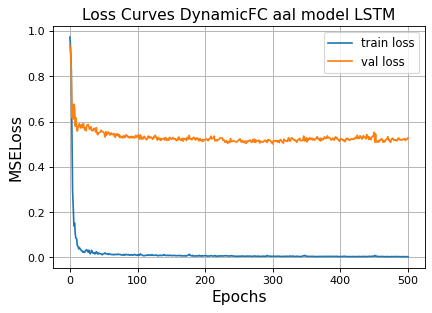

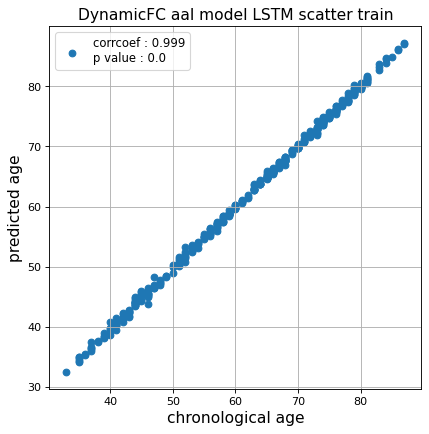

r^2 train data:  0.998803729149407


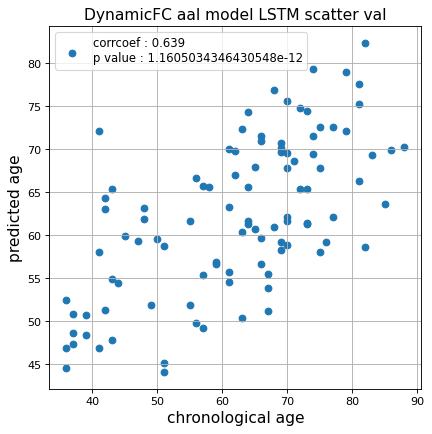

r^2 val data:  0.4070912975790082


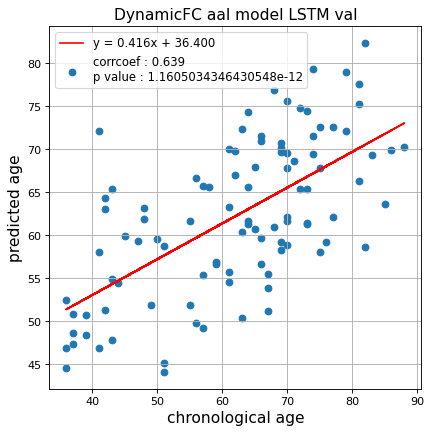

切片: 36.40012749782262
傾き: 0.4164516371217883
Kfold: 2 ::: epoch: 100, loss: 0.012932644655498175, val loss: 0.7896382063627243
Kfold: 2 ::: epoch: 200, loss: 0.007201995593137466, val loss: 0.719576045870781
Kfold: 2 ::: epoch: 300, loss: 0.006252556716879973, val loss: 0.7256891131401062
Kfold: 2 ::: epoch: 400, loss: 0.00370274602363889, val loss: 0.6484341770410538
Kfold: 2 ::: epoch: 500, loss: 0.0036760564589013276, val loss: 0.6353947818279266
Kfold: 2 ::: epoch: 600, loss: 0.0028336498832616666, val loss: 0.6441444605588913
Kfold: 2 ::: epoch: 700, loss: 0.0027750782632770445, val loss: 0.6269153505563736
save_epochs:610
best val loss:0.5729155391454697


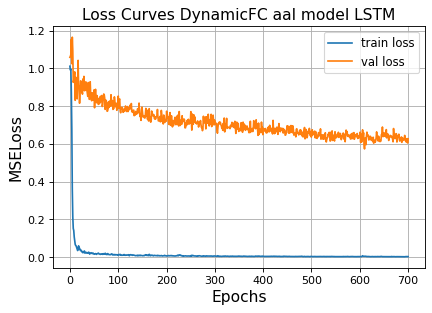

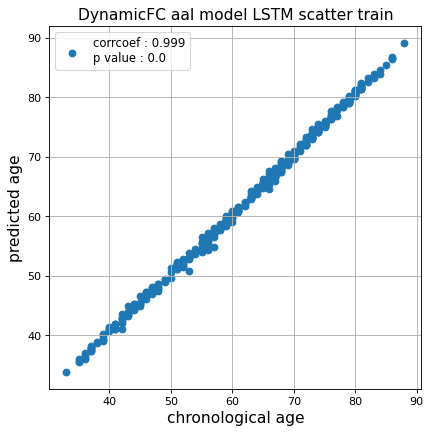

r^2 train data:  0.9971965466027587


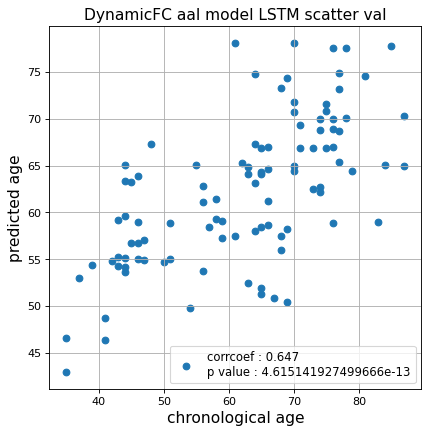

r^2 val data:  0.4141742724164734


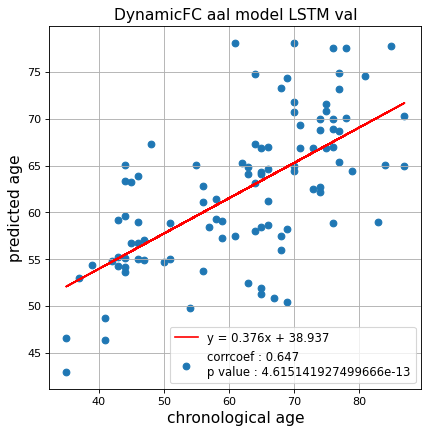

切片: 38.93734384283758
傾き: 0.3761698897459866
Kfold: 3 ::: epoch: 100, loss: 0.013459863982951412, val loss: 0.6664084196090698
Kfold: 3 ::: epoch: 200, loss: 0.006231186123421559, val loss: 0.742628663778305
Kfold: 3 ::: epoch: 300, loss: 0.004987058605855474, val loss: 0.6557085812091827
Kfold: 3 ::: epoch: 400, loss: 0.0039029496614463055, val loss: 0.7162901610136032
Kfold: 3 ::: epoch: 500, loss: 0.0029346942006108854, val loss: 0.7225599884986877
Kfold: 3 ::: epoch: 600, loss: 0.002815657384836903, val loss: 0.6936860233545303
Kfold: 3 ::: epoch: 700, loss: 0.0023095003562048078, val loss: 0.7306361645460129
save_epochs:624
best val loss:0.6015496924519539


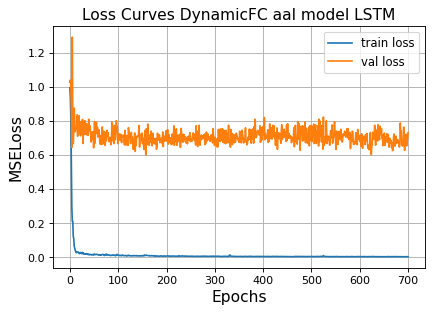

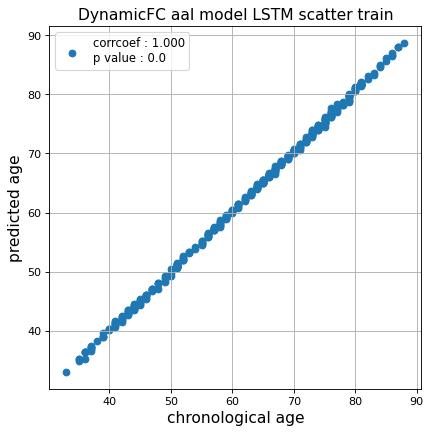

r^2 train data:  0.9987592099184458


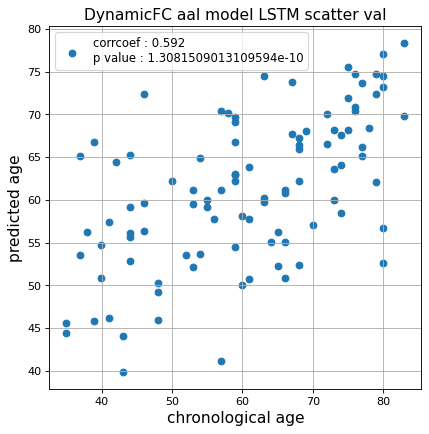

r^2 val data:  0.3460269961998297


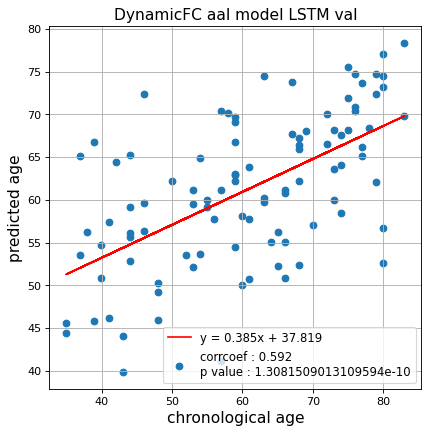

切片: 37.818674461257956
傾き: 0.3852643909789795
Kfold: 4 ::: epoch: 100, loss: 0.012985479552298784, val loss: 1.2802883088588715
Kfold: 4 ::: epoch: 200, loss: 0.009207765571773052, val loss: 1.3392693549394608
Kfold: 4 ::: epoch: 300, loss: 0.0048197143209668305, val loss: 1.2612483948469162
Kfold: 4 ::: epoch: 400, loss: 0.004784072588126247, val loss: 1.3041026890277863
Kfold: 4 ::: epoch: 500, loss: 0.005501290425085104, val loss: 1.211943805217743
Kfold: 4 ::: epoch: 600, loss: 0.004203511410965943, val loss: 1.2451594173908234
Kfold: 4 ::: epoch: 700, loss: 0.0027996621882686247, val loss: 1.2465799897909164
save_epochs:653
best val loss:1.1087676733732224


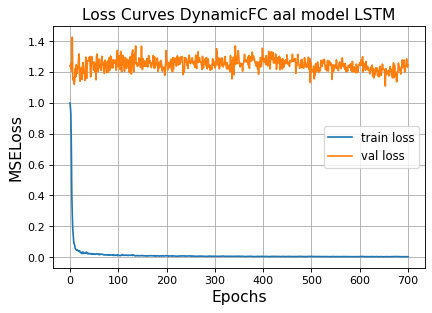

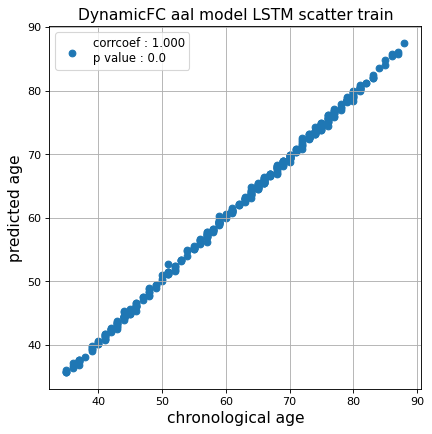

r^2 train data:  0.9985032711532396


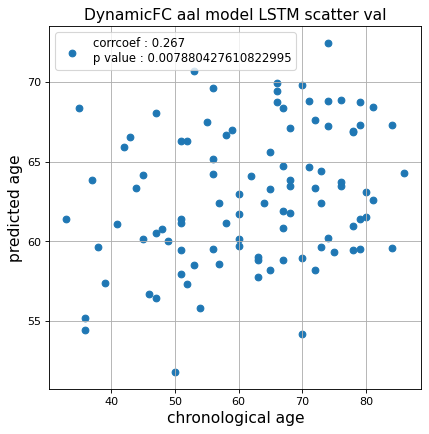

r^2 val data:  0.06461880106042317


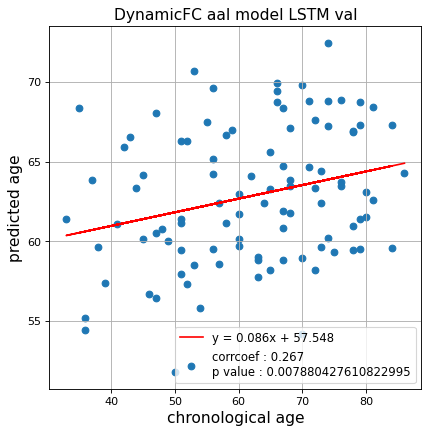

切片: 57.54765965001763
傾き: 0.08557941192376112
Kfold: 5 ::: epoch: 100, loss: 0.01130847679451108, val loss: 0.847167044878006
Kfold: 5 ::: epoch: 200, loss: 0.007897048866233, val loss: 0.845463439822197
Kfold: 5 ::: epoch: 300, loss: 0.005251689796121075, val loss: 0.8355739861726761
Kfold: 5 ::: epoch: 400, loss: 0.004629984820404878, val loss: 0.8541166633367538
Kfold: 5 ::: epoch: 500, loss: 0.003354175849101291, val loss: 0.8665525168180466
early stopping
save_epochs:301
best val loss:0.8144658803939819


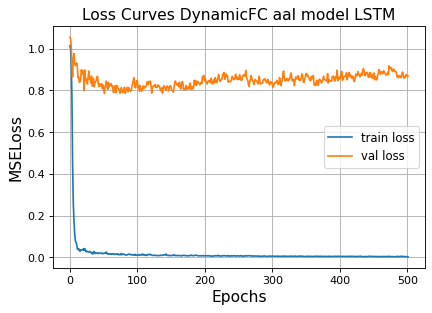

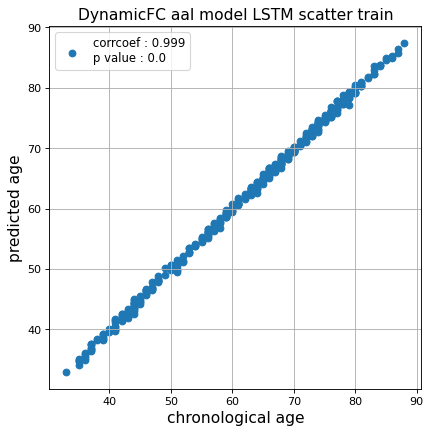

r^2 train data:  0.998606570712041


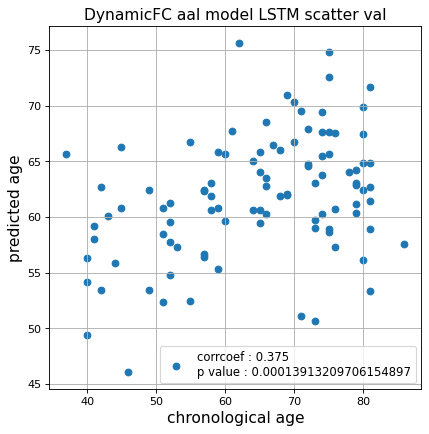

r^2 val data:  0.09069646236412643


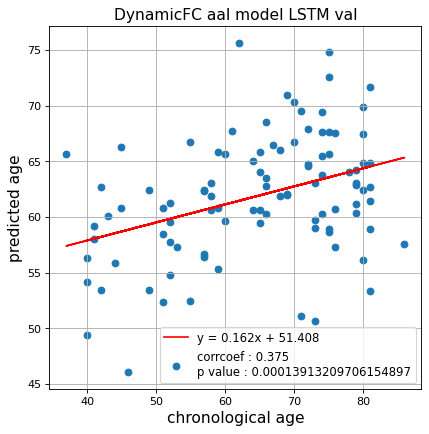

切片: 51.40826872703366
傾き: 0.16197447332934137
Nested Kfold ::: 2
Kfold: 1 ::: epoch: 100, loss: 0.008845088376591984, val loss: 0.6787653714418411
Kfold: 1 ::: epoch: 200, loss: 0.007184791020475901, val loss: 0.6438197121024132
Kfold: 1 ::: epoch: 300, loss: 0.00534687193038945, val loss: 0.6451037302613258
Kfold: 1 ::: epoch: 400, loss: 0.0030294878390402747, val loss: 0.6069145947694778
Kfold: 1 ::: epoch: 500, loss: 0.0020789547035327326, val loss: 0.6709029823541641
early stopping
save_epochs:338
best val loss:0.5925048813223839


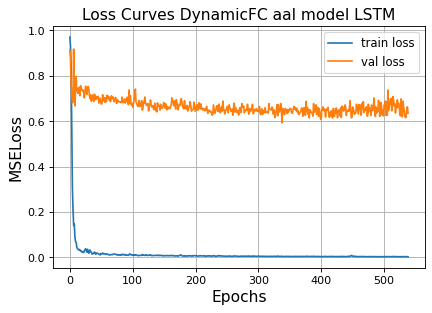

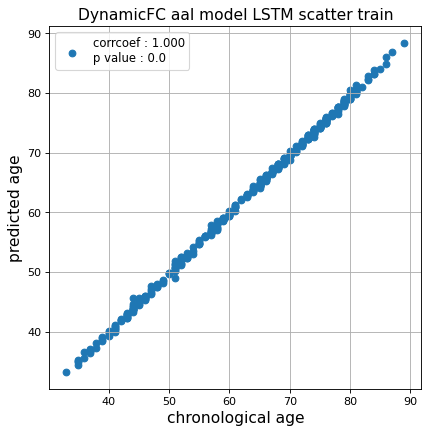

r^2 train data:  0.9985459943688397


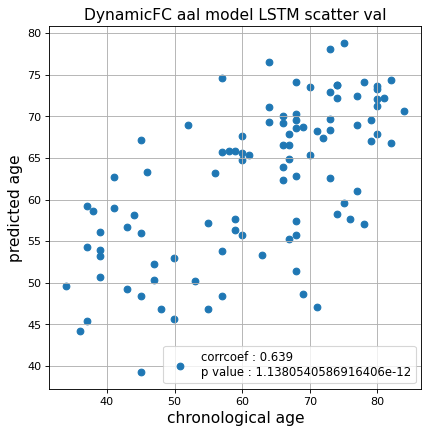

r^2 val data:  0.40671696166422244


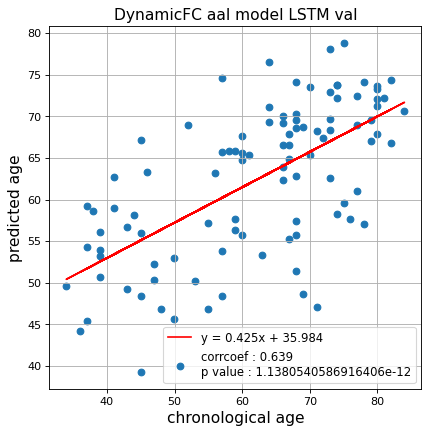

切片: 35.98383871709869
傾き: 0.4247973936414278
Kfold: 2 ::: epoch: 100, loss: 0.008730571905079369, val loss: 0.6787958741188049
Kfold: 2 ::: epoch: 200, loss: 0.006367621244862676, val loss: 0.658819854259491
Kfold: 2 ::: epoch: 300, loss: 0.003654896532400296, val loss: 0.6397411897778511
Kfold: 2 ::: epoch: 400, loss: 0.0030788742364026033, val loss: 0.6397911757230759
Kfold: 2 ::: epoch: 500, loss: 0.003272274750857972, val loss: 0.6231494098901749
Kfold: 2 ::: epoch: 600, loss: 0.0025467059324280573, val loss: 0.6171126514673233
early stopping
save_epochs:474
best val loss:0.5939376130700111


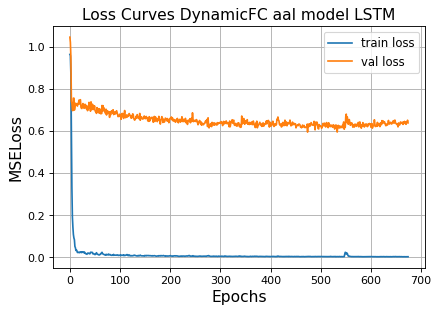

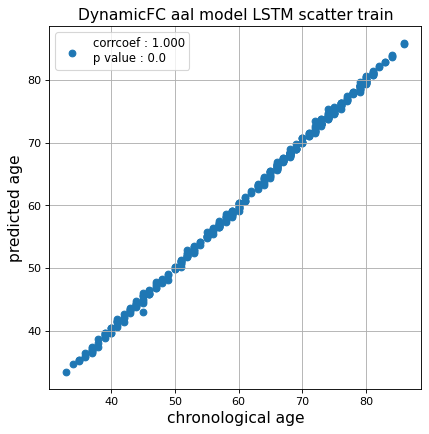

r^2 train data:  0.9991918892851769


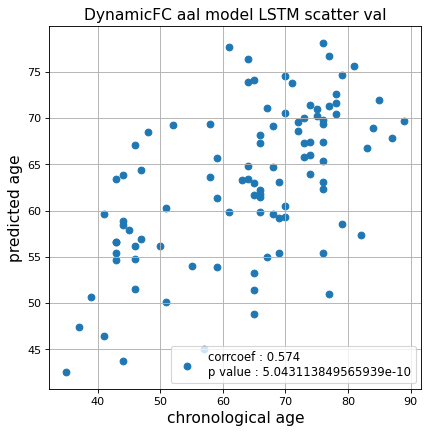

r^2 val data:  0.3253761823008495


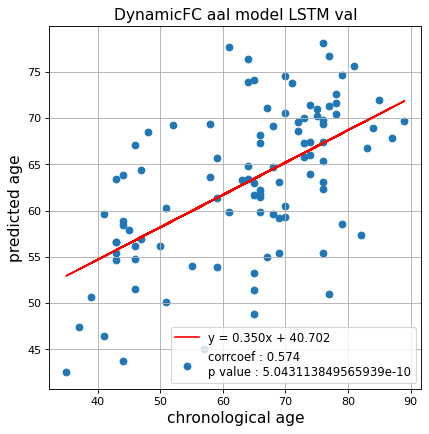

切片: 40.701920435281146
傾き: 0.34991301048344997
Kfold: 3 ::: epoch: 100, loss: 0.011598394431460362, val loss: 1.160920262336731
Kfold: 3 ::: epoch: 200, loss: 0.00638874236924144, val loss: 1.1093935370445251
Kfold: 3 ::: epoch: 300, loss: 0.005132370234395449, val loss: 1.1201747059822083
Kfold: 3 ::: epoch: 400, loss: 0.004991027544467495, val loss: 1.1376379430294037
early stopping
save_epochs:238
best val loss:1.052684873342514


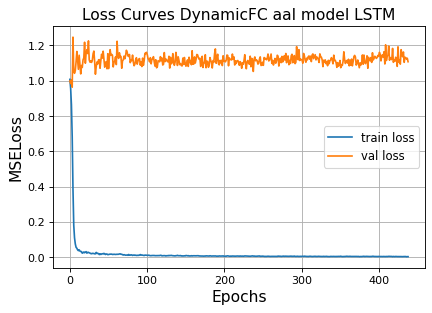

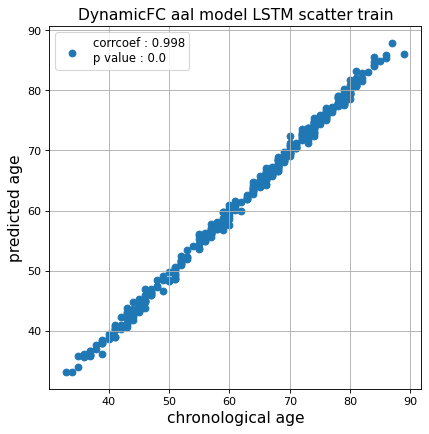

r^2 train data:  0.9955332971832005


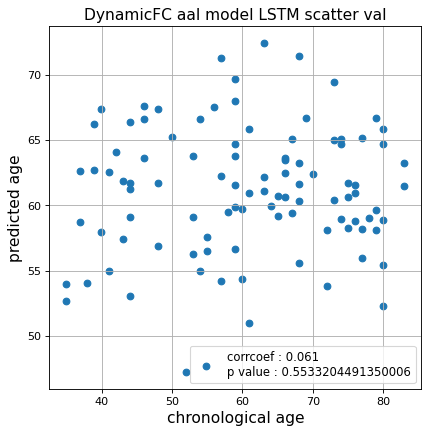

r^2 val data:  -0.08317742086550539


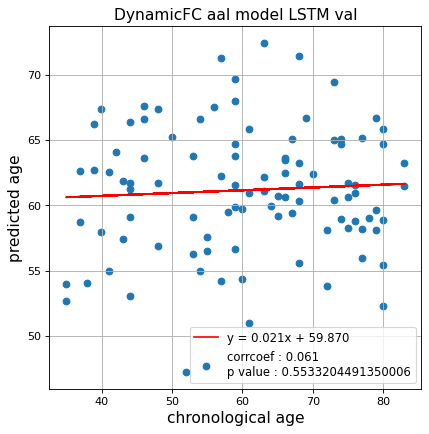

切片: 59.869823603105665
傾き: 0.021371129737663367
Kfold: 4 ::: epoch: 100, loss: 0.009916234009254437, val loss: 1.0125392526388168
Kfold: 4 ::: epoch: 200, loss: 0.007044236892117904, val loss: 0.97484290599823
Kfold: 4 ::: epoch: 300, loss: 0.004562888151177993, val loss: 0.9194604158401489
Kfold: 4 ::: epoch: 400, loss: 0.0041620427957521034, val loss: 0.9292573928833008
early stopping
save_epochs:247
best val loss:0.8969114124774933


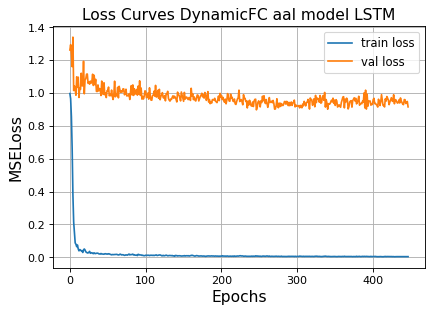

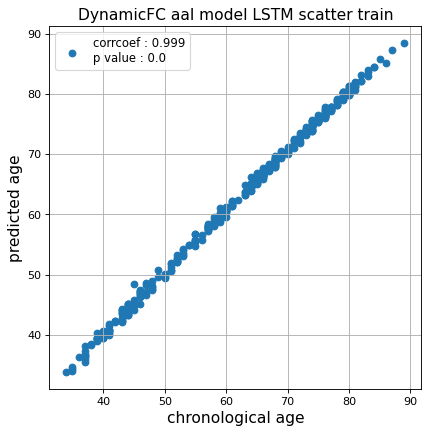

r^2 train data:  0.9961016961092987


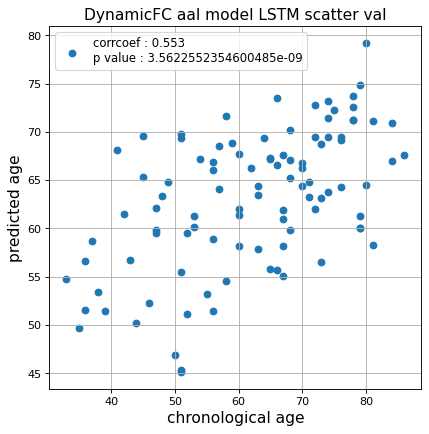

r^2 val data:  0.299126126784483


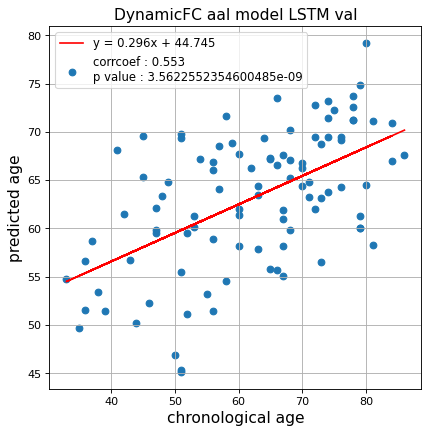

切片: 44.74518456514728
傾き: 0.2957288572987482
Kfold: 5 ::: epoch: 100, loss: 0.009404375038754482, val loss: 0.7915888428688049
Kfold: 5 ::: epoch: 200, loss: 0.006922168979564538, val loss: 0.7742200195789337
Kfold: 5 ::: epoch: 300, loss: 0.004592432443482371, val loss: 0.7469298243522644
Kfold: 5 ::: epoch: 400, loss: 0.005210231720971374, val loss: 0.7692692428827286
Kfold: 5 ::: epoch: 500, loss: 0.002687657126583732, val loss: 0.7467422336339951
Kfold: 5 ::: epoch: 600, loss: 0.002882953607835449, val loss: 0.7330710887908936
early stopping
save_epochs:458
best val loss:0.6504247039556503


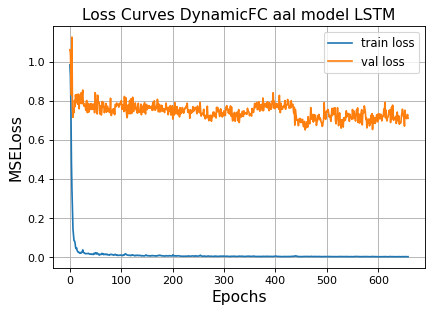

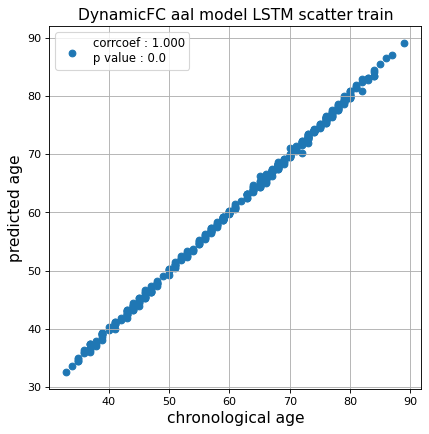

r^2 train data:  0.9992240782005638


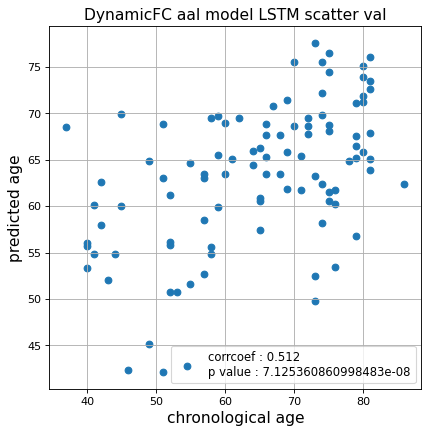

r^2 val data:  0.2471908090379521


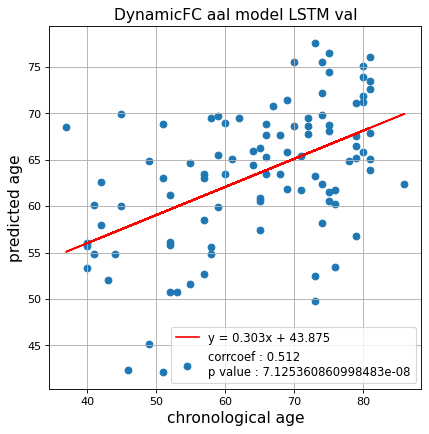

切片: 43.87506555383919
傾き: 0.3031601707962229
Nested Kfold ::: 3
Kfold: 1 ::: epoch: 100, loss: 0.012108986409237752, val loss: 0.7435683757066727
Kfold: 1 ::: epoch: 200, loss: 0.006583253638102458, val loss: 0.6811051815748215
Kfold: 1 ::: epoch: 300, loss: 0.0042789378919853615, val loss: 0.6995673030614853
Kfold: 1 ::: epoch: 400, loss: 0.0030937420580392848, val loss: 0.6910016238689423
early stopping
save_epochs:231
best val loss:0.6658163517713547


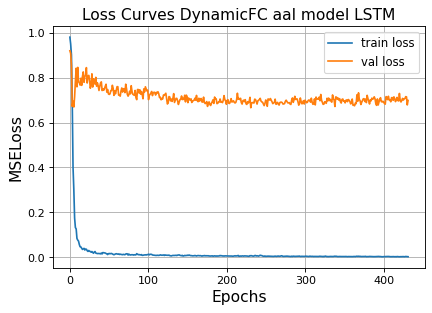

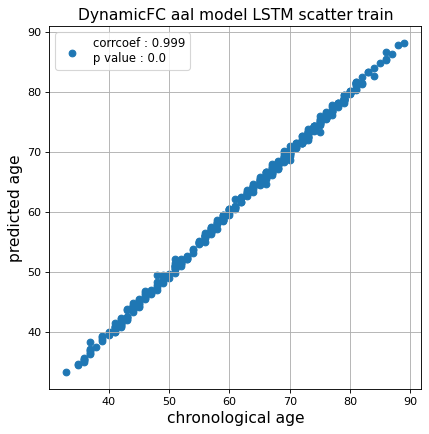

r^2 train data:  0.9986454812555718


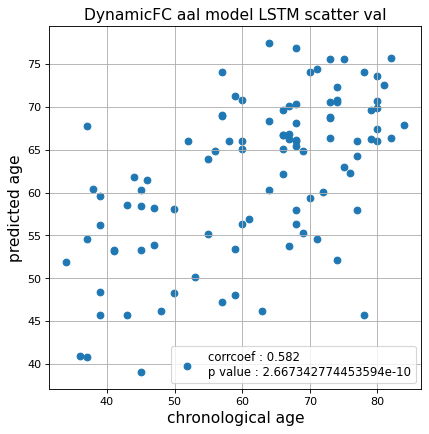

r^2 val data:  0.33214787878525953


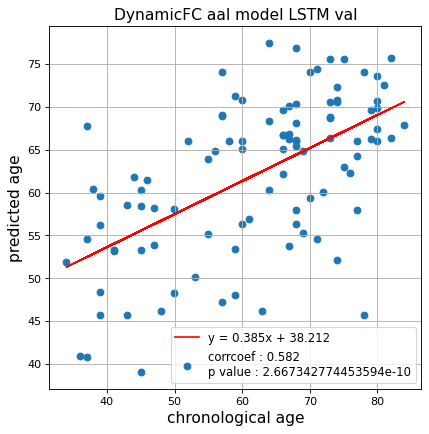

切片: 38.212079687674226
傾き: 0.38530816809265295
Kfold: 2 ::: epoch: 100, loss: 0.00881079613016202, val loss: 0.6795907467603683
Kfold: 2 ::: epoch: 200, loss: 0.006661326624453068, val loss: 0.640759602189064
Kfold: 2 ::: epoch: 300, loss: 0.004807349957095889, val loss: 0.6369310691952705
Kfold: 2 ::: epoch: 400, loss: 0.0026294684279351854, val loss: 0.6330108791589737
Kfold: 2 ::: epoch: 500, loss: 0.0023080153534045587, val loss: 0.6343080401420593
Kfold: 2 ::: epoch: 600, loss: 0.0021272978046908975, val loss: 0.6250630579888821
Kfold: 2 ::: epoch: 700, loss: 0.0018819830237099757, val loss: 0.6197092644870281
save_epochs:687
best val loss:0.603472750633955


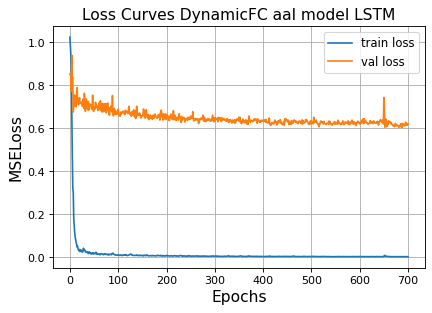

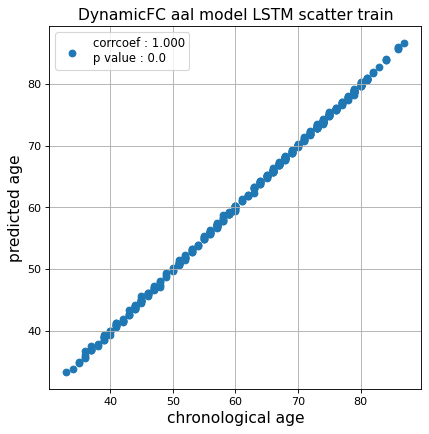

r^2 train data:  0.9996989042131913


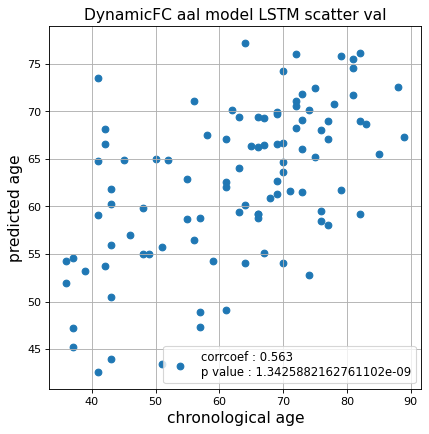

r^2 val data:  0.3165410757693934


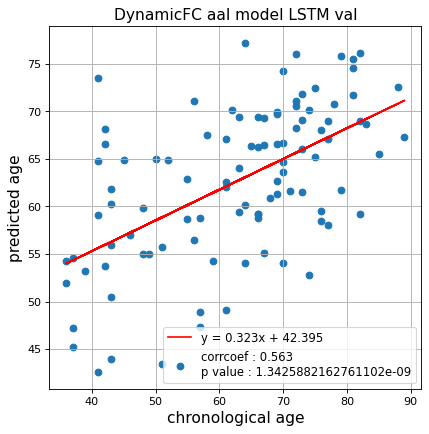

切片: 42.39535240057725
傾き: 0.322793017861859
Kfold: 3 ::: epoch: 100, loss: 0.011713043894045629, val loss: 0.9141293466091156
Kfold: 3 ::: epoch: 200, loss: 0.006760676821263937, val loss: 1.000514656305313
Kfold: 3 ::: epoch: 300, loss: 0.005488103398909936, val loss: 1.0435321480035782
Kfold: 3 ::: epoch: 400, loss: 0.00421907536040705, val loss: 1.0451537072658539
Kfold: 3 ::: epoch: 500, loss: 0.003561537408341582, val loss: 0.9924552887678146
early stopping
save_epochs:346
best val loss:0.7905275821685791


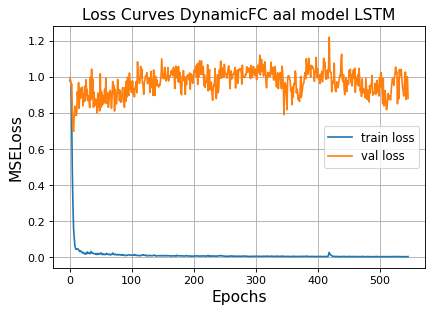

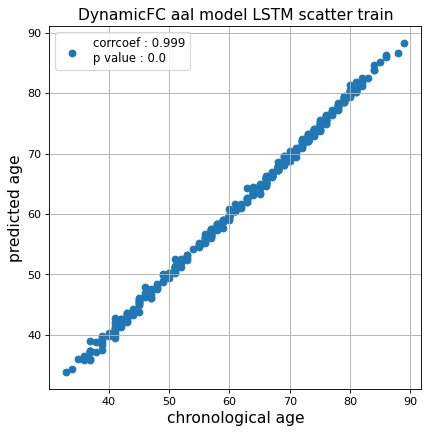

r^2 train data:  0.9980877793159698


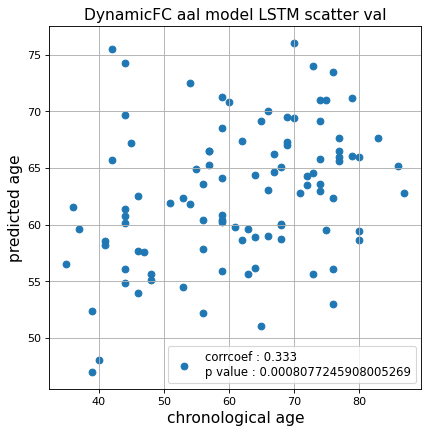

r^2 val data:  0.08537855795634386


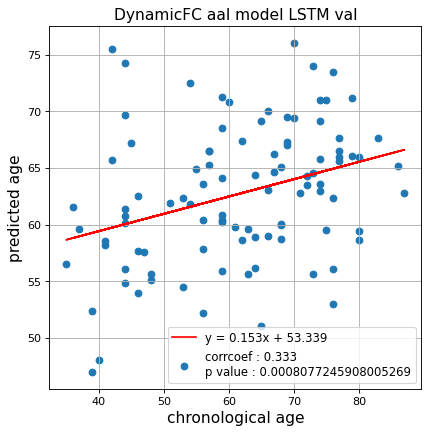

切片: 53.33919475700684
傾き: 0.15262688534939736
Kfold: 4 ::: epoch: 100, loss: 0.00967672632004206, val loss: 0.789467990398407
Kfold: 4 ::: epoch: 200, loss: 0.005678659806457849, val loss: 0.8068440109491348
Kfold: 4 ::: epoch: 300, loss: 0.004687147250828834, val loss: 0.7980903387069702
Kfold: 4 ::: epoch: 400, loss: 0.004528152774303005, val loss: 0.7917383015155792
early stopping
save_epochs:276
best val loss:0.75279101729393


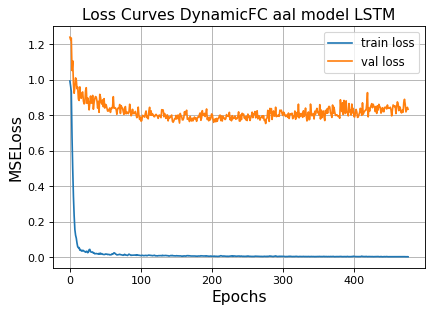

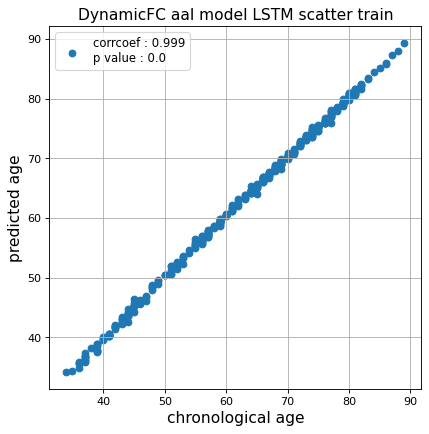

r^2 train data:  0.9985649146792996


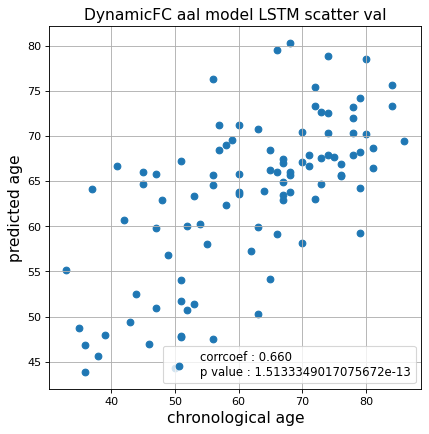

r^2 val data:  0.4230736508637435


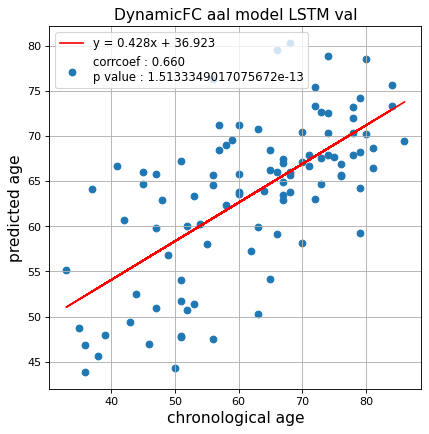

切片: 36.92340905783911
傾き: 0.4282513704685958
Kfold: 5 ::: epoch: 100, loss: 0.012477596684430655, val loss: 0.8499226197600365
Kfold: 5 ::: epoch: 200, loss: 0.00800302130385087, val loss: 0.7679154872894287
Kfold: 5 ::: epoch: 300, loss: 0.003672577440738678, val loss: 0.7317570224404335
Kfold: 5 ::: epoch: 400, loss: 0.00413003836113673, val loss: 0.7243497371673584
Kfold: 5 ::: epoch: 500, loss: 0.0026972300480478085, val loss: 0.6892086118459702
Kfold: 5 ::: epoch: 600, loss: 0.0031128423019813802, val loss: 0.697242371737957
Kfold: 5 ::: epoch: 700, loss: 0.0018725056075849212, val loss: 0.6972270160913467
save_epochs:535
best val loss:0.6701391786336899


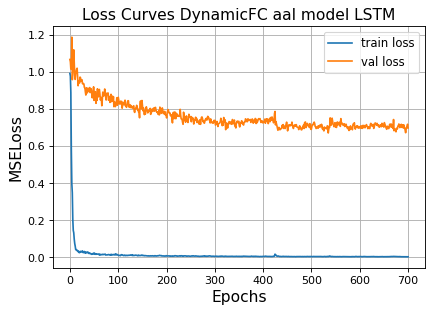

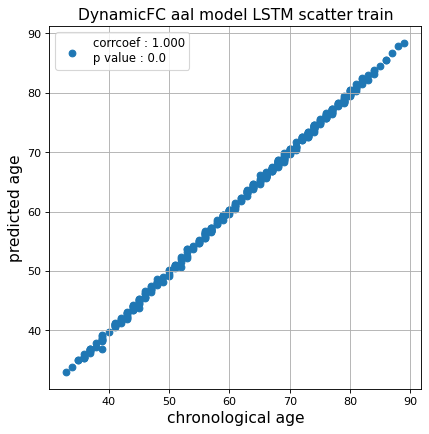

r^2 train data:  0.9991951153782133


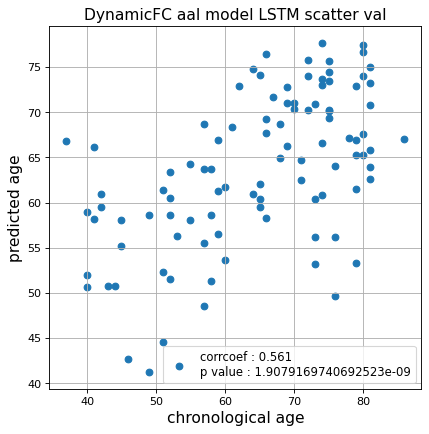

r^2 val data:  0.2999378025373245


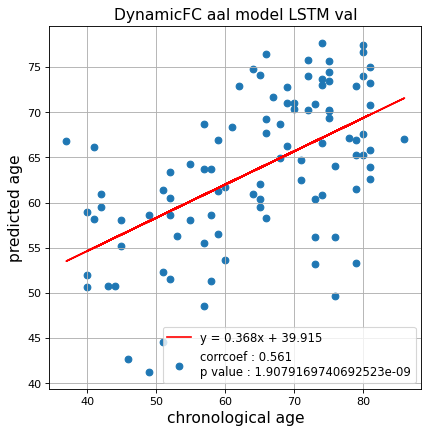

切片: 39.91450733401921
傾き: 0.36805051352815066
Nested Kfold ::: 4
Kfold: 1 ::: epoch: 100, loss: 0.012180218902918009, val loss: 0.6325157135725021
Kfold: 1 ::: epoch: 200, loss: 0.007289606289794812, val loss: 0.6131345629692078
Kfold: 1 ::: epoch: 300, loss: 0.004811483005491586, val loss: 0.6236070692539215
Kfold: 1 ::: epoch: 400, loss: 0.004043601578674638, val loss: 0.6010898351669312
Kfold: 1 ::: epoch: 500, loss: 0.0029566514646061338, val loss: 0.5973572283983231
Kfold: 1 ::: epoch: 600, loss: 0.0021894952962891413, val loss: 0.6083545535802841
Kfold: 1 ::: epoch: 700, loss: 0.002658780449284957, val loss: 0.5995252877473831
save_epochs:695
best val loss:0.5790519267320633


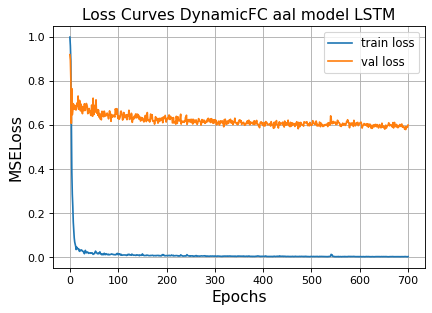

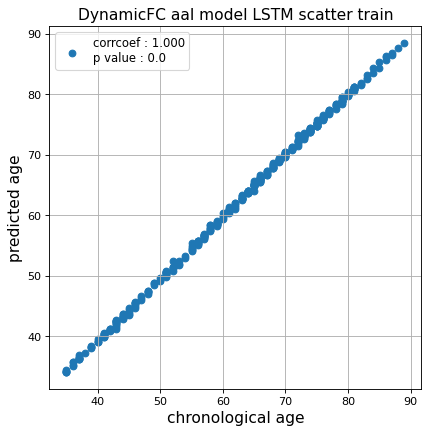

r^2 train data:  0.9986951485945079


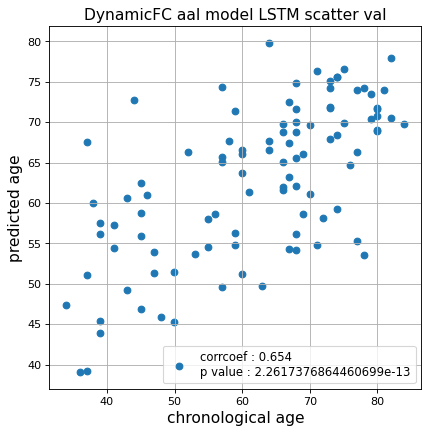

r^2 val data:  0.4225429570147956


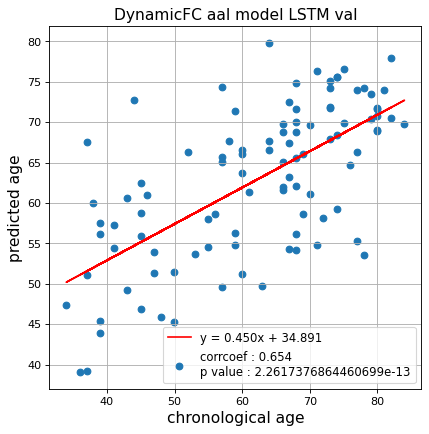

切片: 34.890866500128155
傾き: 0.45006919342998664
Kfold: 2 ::: epoch: 100, loss: 0.009851239836559845, val loss: 0.8062698394060135
Kfold: 2 ::: epoch: 200, loss: 0.0076094621147673866, val loss: 0.7947924584150314
Kfold: 2 ::: epoch: 300, loss: 0.005298887074996646, val loss: 0.76838818192482
Kfold: 2 ::: epoch: 400, loss: 0.003284436659529232, val loss: 0.7443018481135368
Kfold: 2 ::: epoch: 500, loss: 0.0033003446207238506, val loss: 0.7317922711372375
Kfold: 2 ::: epoch: 600, loss: 0.003565744026743162, val loss: 0.730526328086853
Kfold: 2 ::: epoch: 700, loss: 0.0023690916132181883, val loss: 0.7322980910539627
save_epochs:689
best val loss:0.7022661492228508


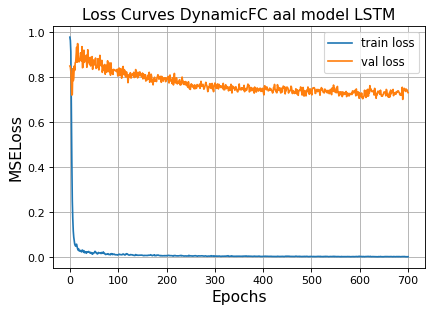

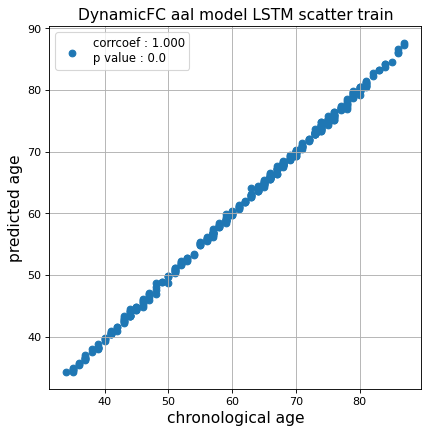

r^2 train data:  0.9991435542833568


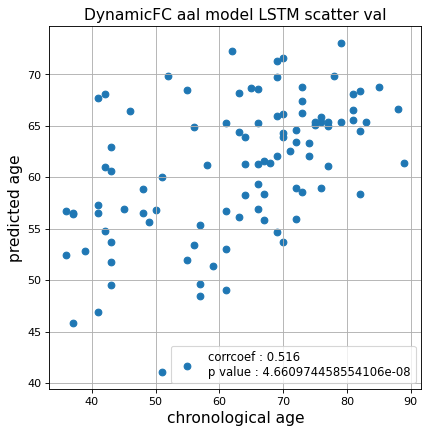

r^2 val data:  0.24898965143912355


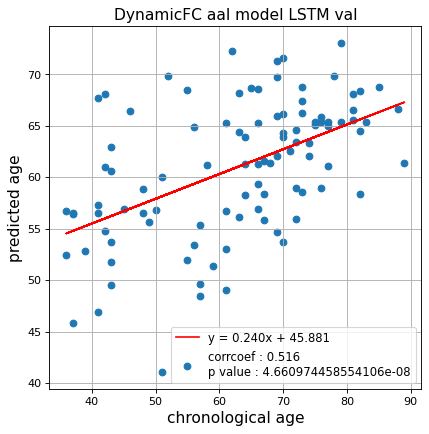

切片: 45.88109194826241
傾き: 0.24043118186937018
Kfold: 3 ::: epoch: 100, loss: 0.01136245377934896, val loss: 0.8373191393911839
Kfold: 3 ::: epoch: 200, loss: 0.008192458351214345, val loss: 0.8217152208089828
Kfold: 3 ::: epoch: 300, loss: 0.005885279880693326, val loss: 0.8185795219615102
Kfold: 3 ::: epoch: 400, loss: 0.005042178493637878, val loss: 0.8110130466520786
Kfold: 3 ::: epoch: 500, loss: 0.004062179941684008, val loss: 0.7943767756223679
Kfold: 3 ::: epoch: 600, loss: 0.0032753782669225563, val loss: 0.8084250781685114
early stopping
save_epochs:462
best val loss:0.7824521213769913


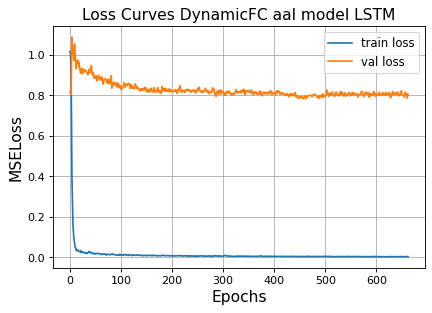

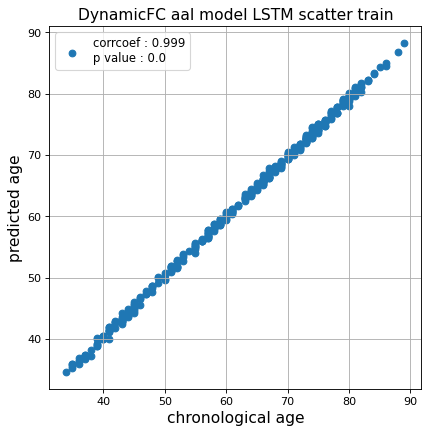

r^2 train data:  0.9981993182643809


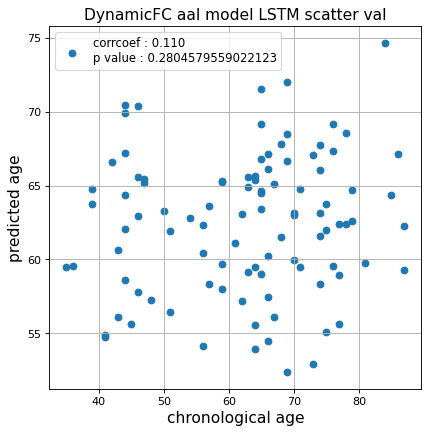

r^2 val data:  -0.049340226541450205


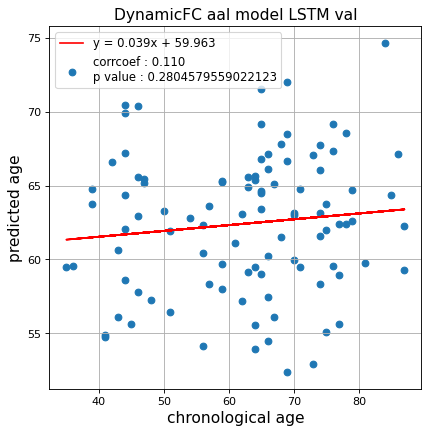

切片: 59.96336578496984
傾き: 0.03942024330745122
Kfold: 4 ::: epoch: 100, loss: 0.009693853843670625, val loss: 1.3696683645248413
Kfold: 4 ::: epoch: 200, loss: 0.010265595154263653, val loss: 1.3127469718456268
Kfold: 4 ::: epoch: 300, loss: 0.004821173255690015, val loss: 1.3107244968414307
Kfold: 4 ::: epoch: 400, loss: 0.003959434912898219, val loss: 1.251735433936119
Kfold: 4 ::: epoch: 500, loss: 0.0035705539362075236, val loss: 1.242035299539566
Kfold: 4 ::: epoch: 600, loss: 0.002818646804931072, val loss: 1.2517448216676712
early stopping
save_epochs:420
best val loss:1.2093922942876816


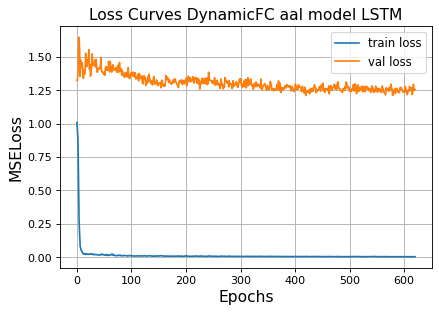

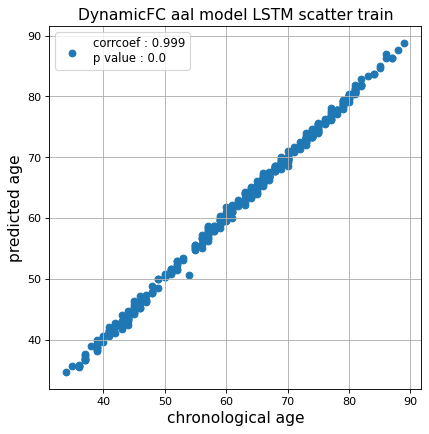

r^2 train data:  0.9981075531019512


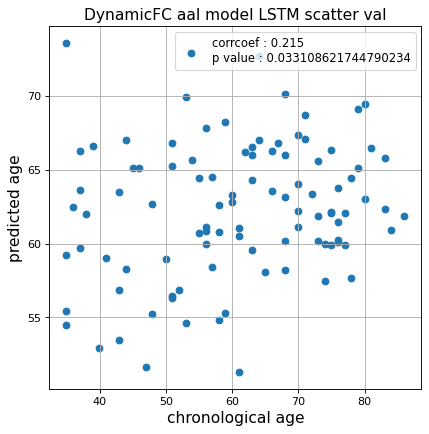

r^2 val data:  0.02383176312710833


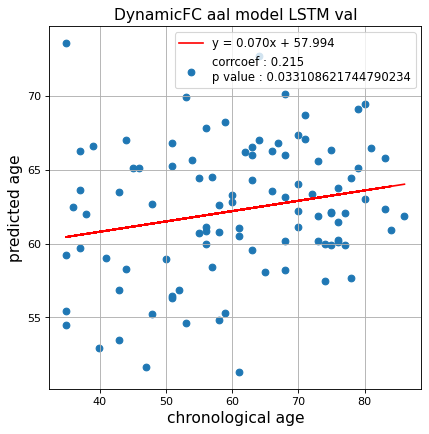

切片: 57.9940175555764
傾き: 0.0700640526551713
Kfold: 5 ::: epoch: 100, loss: 0.010718013589771895, val loss: 0.9506940990686417
Kfold: 5 ::: epoch: 200, loss: 0.007910173565435868, val loss: 0.9165414720773697
Kfold: 5 ::: epoch: 300, loss: 0.005374999573597541, val loss: 0.8910438716411591
Kfold: 5 ::: epoch: 400, loss: 0.004290208704053209, val loss: 0.826583668589592
Kfold: 5 ::: epoch: 500, loss: 0.0036724753176363614, val loss: 0.8520153760910034
Kfold: 5 ::: epoch: 600, loss: 0.0040240427747798655, val loss: 0.8556499034166336
Kfold: 5 ::: epoch: 700, loss: 0.004580071984002223, val loss: 0.8049482554197311
save_epochs:562
best val loss:0.7817191630601883


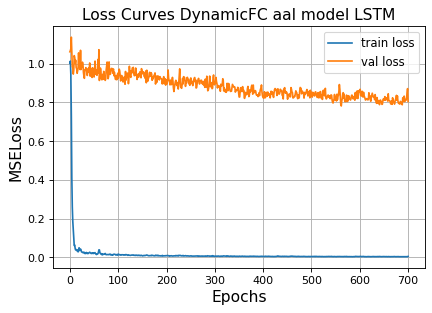

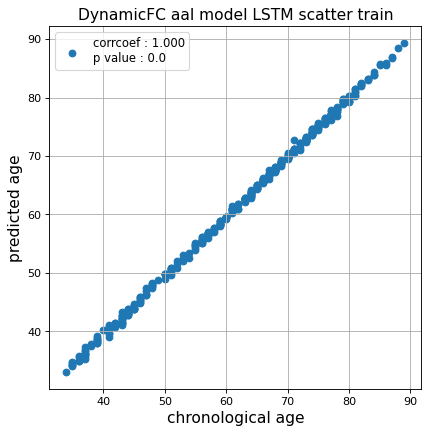

r^2 train data:  0.9983383341218754


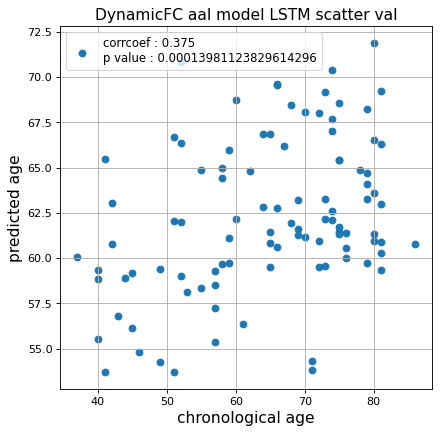

r^2 val data:  0.10494303965654761


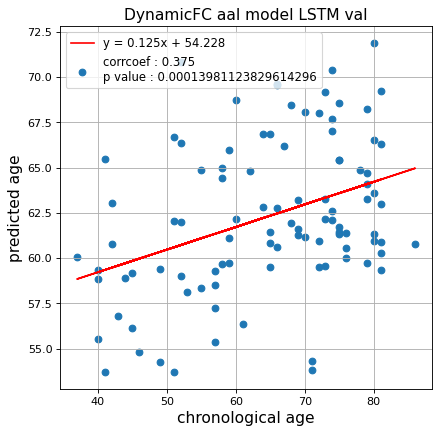

切片: 54.22750583143274
傾き: 0.12476170450854643
Nested Kfold ::: 5
Kfold: 1 ::: epoch: 100, loss: 0.0112997405230999, val loss: 0.7746411859989166
Kfold: 1 ::: epoch: 200, loss: 0.009175886937345449, val loss: 0.7191450297832489
Kfold: 1 ::: epoch: 300, loss: 0.004571981137045301, val loss: 0.7341887652873993
Kfold: 1 ::: epoch: 400, loss: 0.004140091952509605, val loss: 0.7065387815237045
Kfold: 1 ::: epoch: 500, loss: 0.002519371355167375, val loss: 0.733761802315712
Kfold: 1 ::: epoch: 600, loss: 0.0024466743119634115, val loss: 0.754549965262413
Kfold: 1 ::: epoch: 700, loss: 0.0030498875018495778, val loss: 0.6997846364974976
save_epochs:651
best val loss:0.6321142613887787


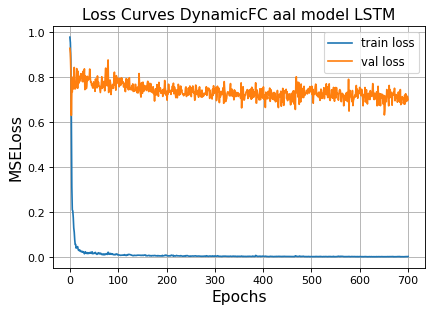

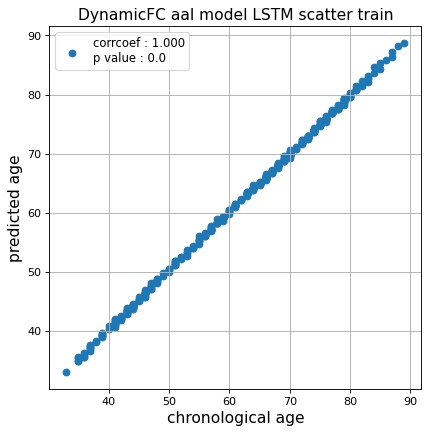

r^2 train data:  0.999369133464993


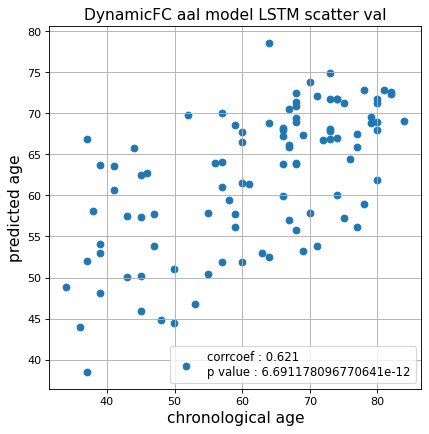

r^2 val data:  0.38588261815364744


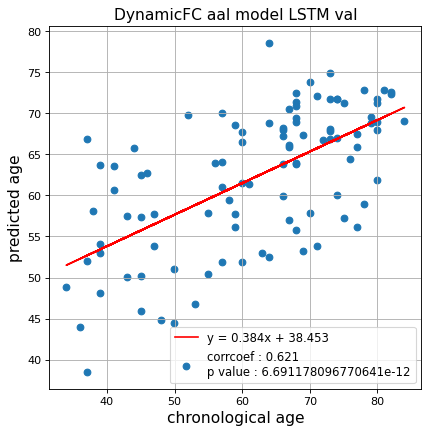

切片: 38.45259754221069
傾き: 0.384043634554554
Kfold: 2 ::: epoch: 100, loss: 0.010430636600806164, val loss: 0.7229335755109787
Kfold: 2 ::: epoch: 200, loss: 0.005656090350105212, val loss: 0.7198707237839699
Kfold: 2 ::: epoch: 300, loss: 0.004725177432052218, val loss: 0.7169545441865921
Kfold: 2 ::: epoch: 400, loss: 0.003204511621823678, val loss: 0.6931606531143188
Kfold: 2 ::: epoch: 500, loss: 0.0028438443819490764, val loss: 0.7130470052361488
Kfold: 2 ::: epoch: 600, loss: 0.003308363420029099, val loss: 0.7114322185516357
Kfold: 2 ::: epoch: 700, loss: 0.002577966652237452, val loss: 0.6958631277084351
save_epochs:532
best val loss:0.6762735992670059


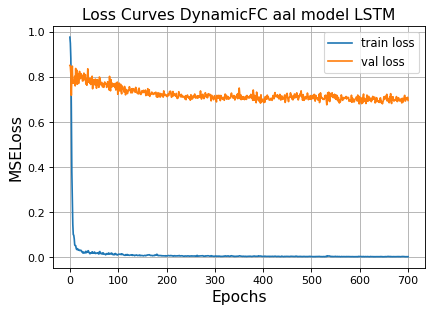

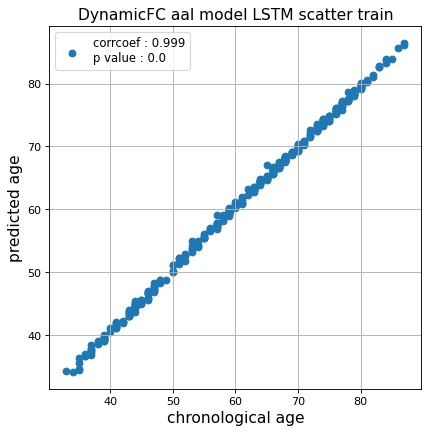

r^2 train data:  0.9980641679257962


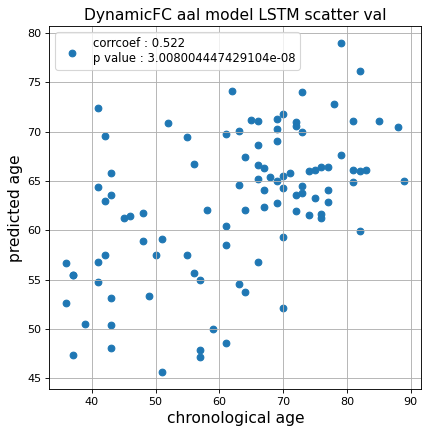

r^2 val data:  0.272369905075291


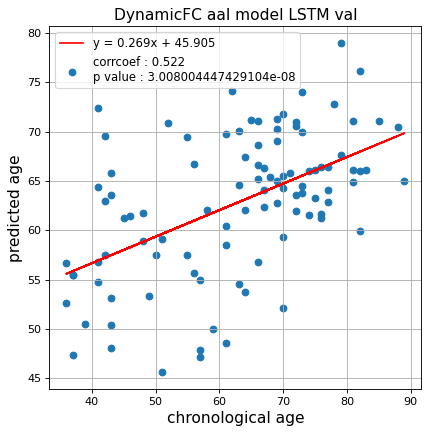

切片: 45.905315020741796
傾き: 0.26885064994502617
Kfold: 3 ::: epoch: 100, loss: 0.010388051732801475, val loss: 0.8979220762848854
Kfold: 3 ::: epoch: 200, loss: 0.00745465370038381, val loss: 0.9165381863713264
Kfold: 3 ::: epoch: 300, loss: 0.00576775329402433, val loss: 0.9264490753412247
Kfold: 3 ::: epoch: 400, loss: 0.004008321091532707, val loss: 0.9411261528730392
early stopping
save_epochs:293
best val loss:0.8890307582914829


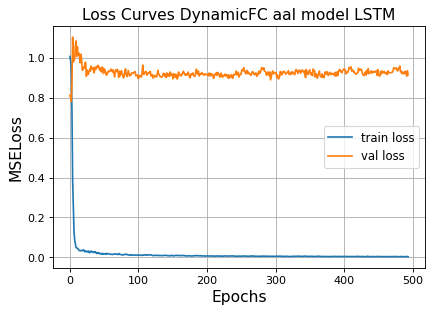

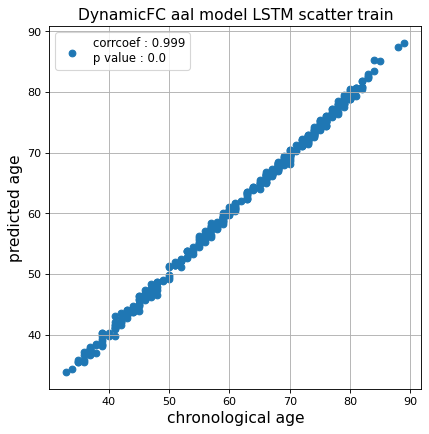

r^2 train data:  0.9975491383290616


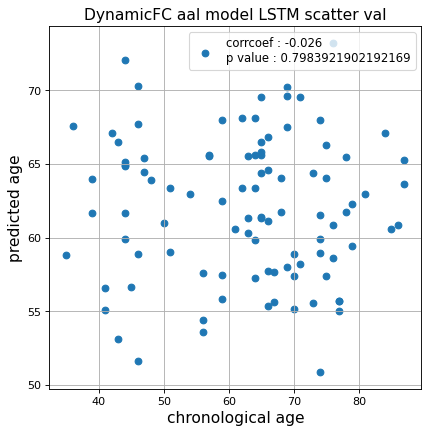

r^2 val data:  -0.1535597367476491


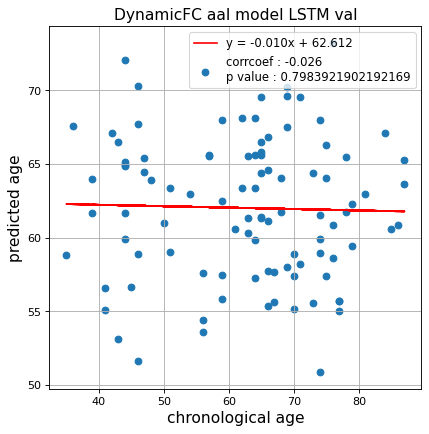

切片: 62.61233940916946
傾き: -0.009545963921457139
Kfold: 4 ::: epoch: 100, loss: 0.012863794413323585, val loss: 1.0287462621927261
Kfold: 4 ::: epoch: 200, loss: 0.008549354289873289, val loss: 1.0165842026472092
Kfold: 4 ::: epoch: 300, loss: 0.007381556931739816, val loss: 0.9418454170227051
Kfold: 4 ::: epoch: 400, loss: 0.005180133864856684, val loss: 0.9647049307823181
Kfold: 4 ::: epoch: 500, loss: 0.0044907516298385766, val loss: 0.9564183503389359
Kfold: 4 ::: epoch: 600, loss: 0.003162411059467838, val loss: 0.9268830269575119
Kfold: 4 ::: epoch: 700, loss: 0.0034728963286257707, val loss: 0.8860022872686386
save_epochs:646
best val loss:0.8634989112615585


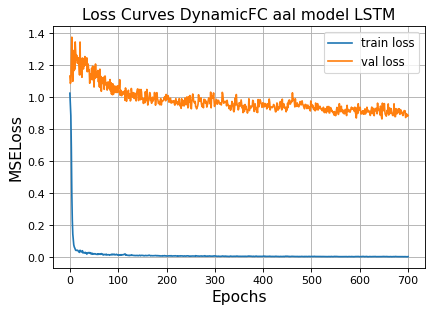

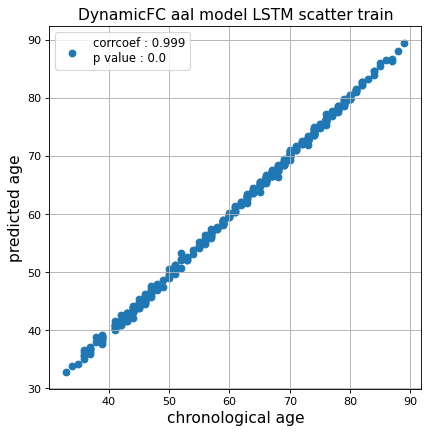

r^2 train data:  0.9985334334073991


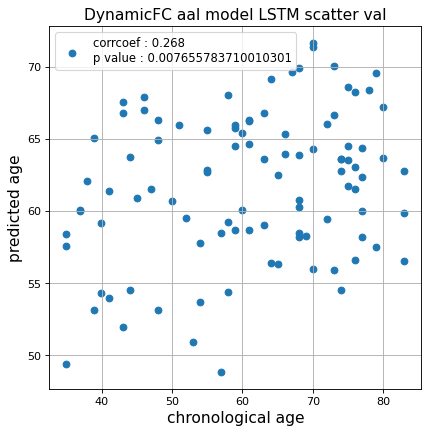

r^2 val data:  0.057872290577442254


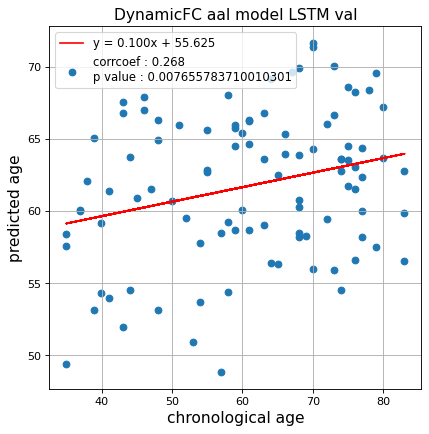

切片: 55.62527402864698
傾き: 0.10048365830614843
Kfold: 5 ::: epoch: 100, loss: 0.01121404910316834, val loss: 1.370180368423462
Kfold: 5 ::: epoch: 200, loss: 0.007122123452763145, val loss: 1.4110882580280304
Kfold: 5 ::: epoch: 300, loss: 0.005350035848096013, val loss: 1.3086569607257843
Kfold: 5 ::: epoch: 400, loss: 0.004605876568418283, val loss: 1.3576860278844833
Kfold: 5 ::: epoch: 500, loss: 0.003989541634487418, val loss: 1.4711278229951859
Kfold: 5 ::: epoch: 600, loss: 0.003986965023124447, val loss: 1.3972910642623901
early stopping
save_epochs:489
best val loss:1.1853881776332855


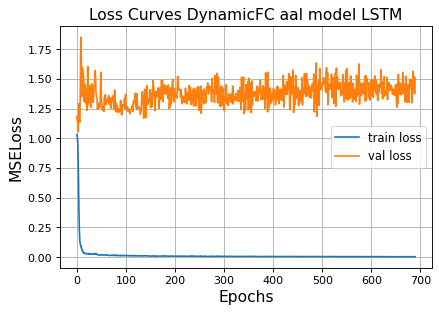

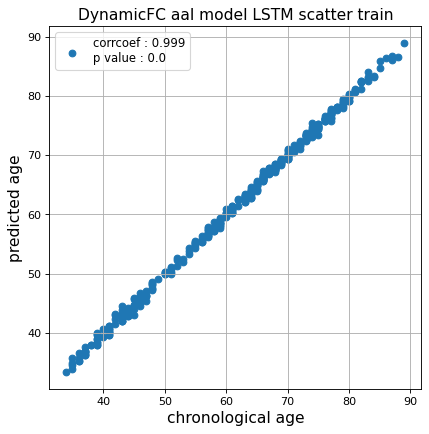

r^2 train data:  0.9983100825810204


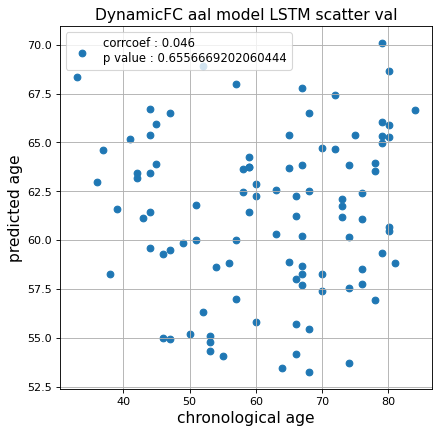

r^2 val data:  -0.06929904206930892


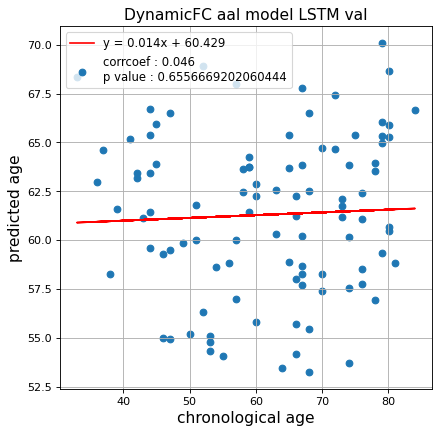

切片: 60.428775499351644
傾き: 0.014138243990559036
CPU times: user 1d 1h 41min 31s, sys: 3min 51s, total: 1d 1h 45min 22s
Wall time: 4h 2min 17s


In [19]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_aal_dynamic_1  = []
test_pred_aal_dynamic_corrected_1  = []
test_label_aal_dynamic_1 = []
test_idx_aal_dynamic_1   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_aal)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_dynamic_aal,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 700,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 128,
                                                           num_layers = 2,
                                                           fc_drop = 0.1,
                                                           bidirectional = False,
                                                           title = 'DynamicFC aal model LSTM'
                                                          )
    
    test_pred_aal_dynamic_1.append(test_pred)
    test_pred_aal_dynamic_corrected_1.append(test_pred_corrected)
    test_label_aal_dynamic_1.append(test_label)
    test_idx_aal_dynamic_1.append(test_idx)

### Dynamic FC 2

Nested Kfold ::: 1
Kfold: 1 ::: epoch: 100, loss: 0.008443951785850983, val loss: 0.5092872492969036
Kfold: 1 ::: epoch: 200, loss: 0.007293218388580359, val loss: 0.48776174150407314
Kfold: 1 ::: epoch: 300, loss: 0.0035326434657550775, val loss: 0.490053316578269
Kfold: 1 ::: epoch: 400, loss: 0.003211228517242349, val loss: 0.4895898178219795
Kfold: 1 ::: epoch: 500, loss: 0.002736045101370949, val loss: 0.5161854438483715
early stopping
save_epochs:342
best val loss:0.4768003933131695


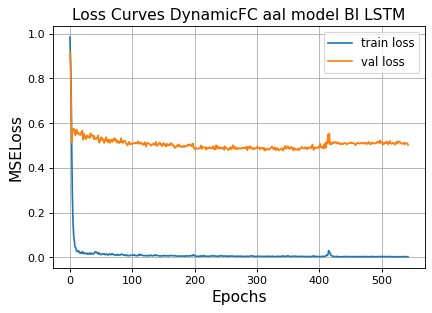

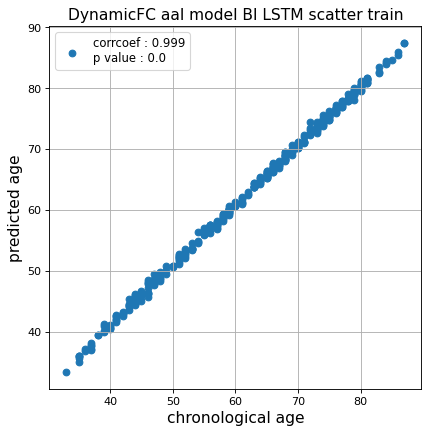

r^2 train data:  0.9947348433907367


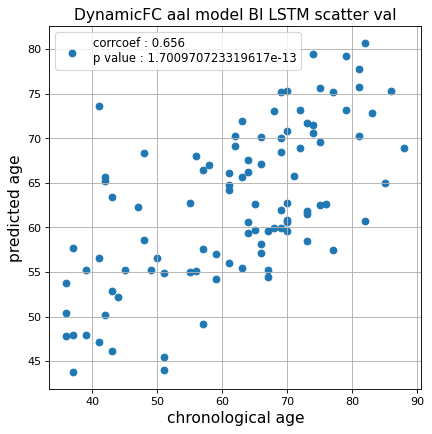

r^2 val data:  0.42753775931818105


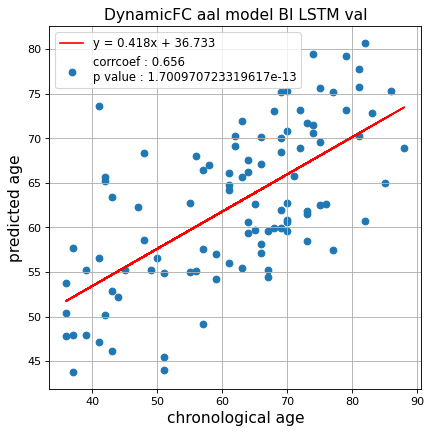

切片: 36.73266761991208
傾き: 0.4175863268137981
Kfold: 2 ::: epoch: 100, loss: 0.009513576944860129, val loss: 0.571505069732666
Kfold: 2 ::: epoch: 200, loss: 0.005751027618176662, val loss: 0.5598272159695625
Kfold: 2 ::: epoch: 300, loss: 0.005785468446377378, val loss: 0.5648968517780304
Kfold: 2 ::: epoch: 400, loss: 0.0033776919903735127, val loss: 0.5684630572795868
Kfold: 2 ::: epoch: 500, loss: 0.004318224534822198, val loss: 0.5573793649673462
Kfold: 2 ::: epoch: 600, loss: 0.0028614917358096978, val loss: 0.5565602481365204
early stopping
save_epochs:494
best val loss:0.534852422773838


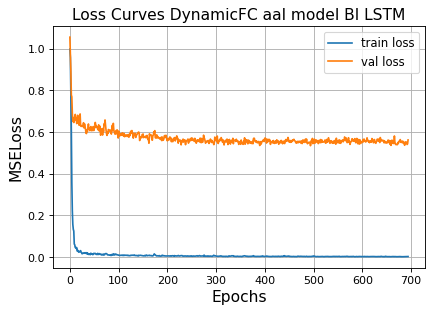

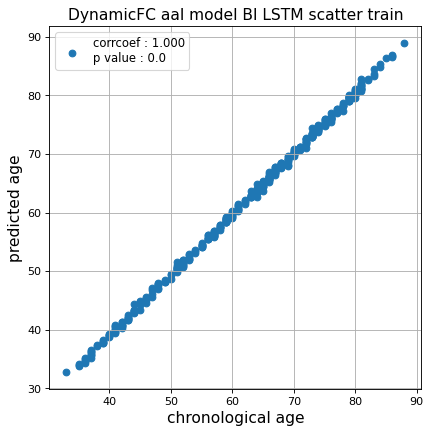

r^2 train data:  0.9976453995972614


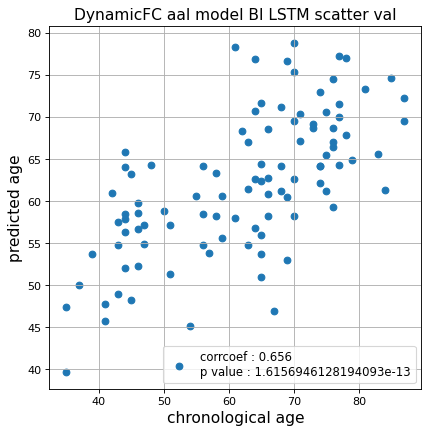

r^2 val data:  0.4297614030396266


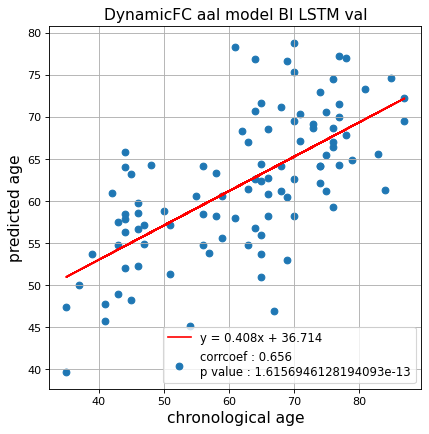

切片: 36.713687583989966
傾き: 0.40818484565262764
Kfold: 3 ::: epoch: 100, loss: 0.014400722960440012, val loss: 0.6736728847026825
Kfold: 3 ::: epoch: 200, loss: 0.006871939780047307, val loss: 0.633738324046135
Kfold: 3 ::: epoch: 300, loss: 0.004635147660827408, val loss: 0.5639093890786171
Kfold: 3 ::: epoch: 400, loss: 0.005138954085011322, val loss: 0.5448634326457977
Kfold: 3 ::: epoch: 500, loss: 0.0032816142685568104, val loss: 0.5593401417136192
Kfold: 3 ::: epoch: 600, loss: 0.003254575995155252, val loss: 0.5650565475225449
Kfold: 3 ::: epoch: 700, loss: 0.00213571132805485, val loss: 0.6119016855955124
save_epochs:626
best val loss:0.5181209594011307


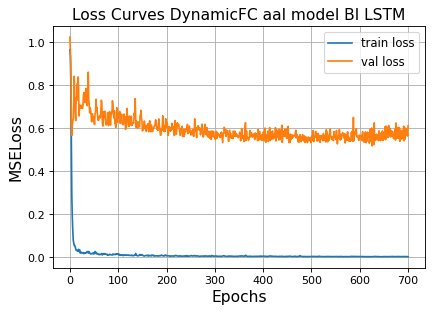

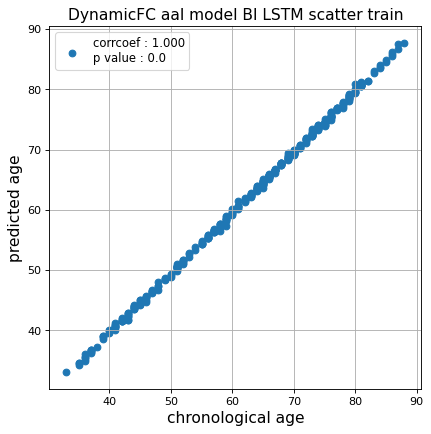

r^2 train data:  0.9984989074176701


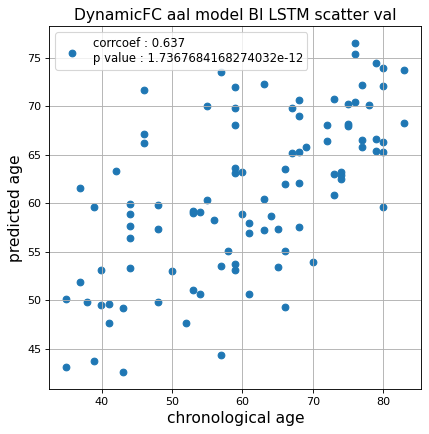

r^2 val data:  0.4047030849802632


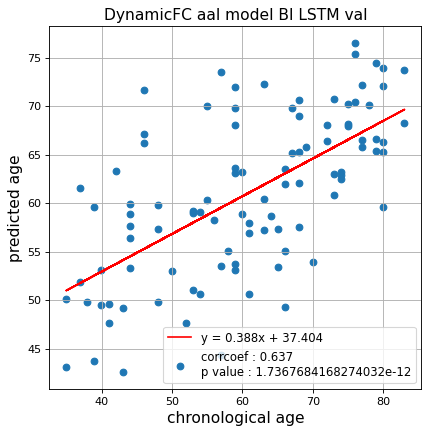

切片: 37.403548286945465
傾き: 0.38837536093052616
Kfold: 4 ::: epoch: 100, loss: 0.011836681120957319, val loss: 0.8523165285587311
Kfold: 4 ::: epoch: 200, loss: 0.008417026605457067, val loss: 0.7940500229597092
Kfold: 4 ::: epoch: 300, loss: 0.007147393565481672, val loss: 0.7854010164737701
Kfold: 4 ::: epoch: 400, loss: 0.004826889498732411, val loss: 0.7531882971525192
Kfold: 4 ::: epoch: 500, loss: 0.003109710613408914, val loss: 0.7708115726709366
Kfold: 4 ::: epoch: 600, loss: 0.003312552759710413, val loss: 0.7062337771058083
Kfold: 4 ::: epoch: 700, loss: 0.0023146360002171537, val loss: 0.8291765078902245
save_epochs:583
best val loss:0.6815118491649628


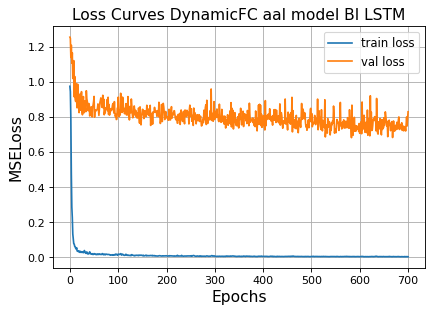

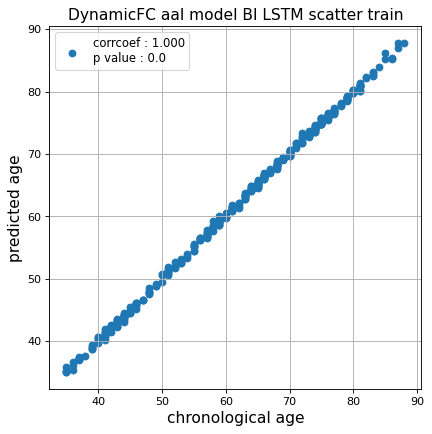

r^2 train data:  0.9991236035479886


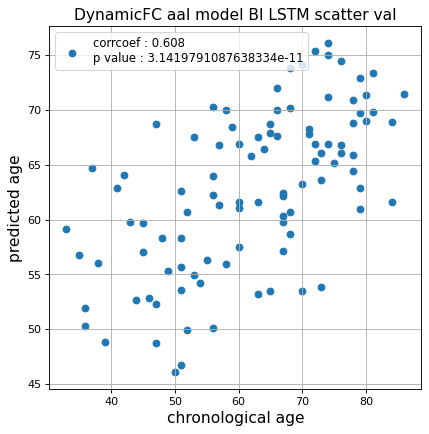

r^2 val data:  0.36359651920795755


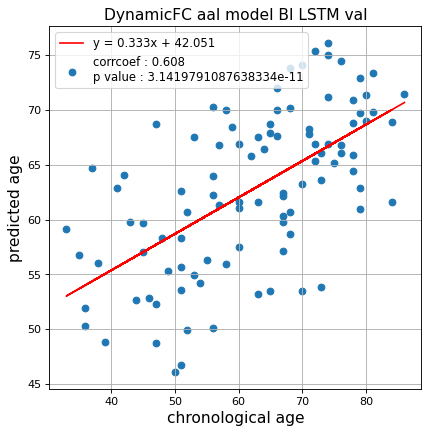

切片: 42.05066501506478
傾き: 0.3326839116826229
Kfold: 5 ::: epoch: 100, loss: 0.010854853317141533, val loss: 0.9211211800575256
Kfold: 5 ::: epoch: 200, loss: 0.00691254589205178, val loss: 0.8282275199890137
Kfold: 5 ::: epoch: 300, loss: 0.0070564269016568475, val loss: 0.7879577875137329
Kfold: 5 ::: epoch: 400, loss: 0.005042388909854568, val loss: 0.8132484704256058
Kfold: 5 ::: epoch: 500, loss: 0.004146204580767796, val loss: 0.7653046697378159
Kfold: 5 ::: epoch: 600, loss: 0.0032905000441062907, val loss: 0.7654344588518143
Kfold: 5 ::: epoch: 700, loss: 0.0033640800885712872, val loss: 0.768151730298996
save_epochs:611
best val loss:0.7137753814458847


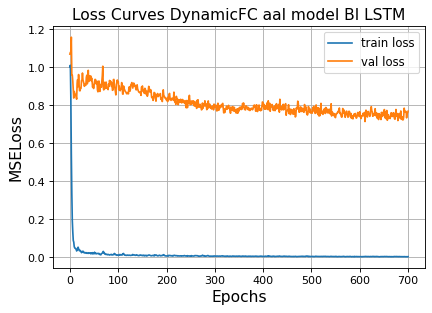

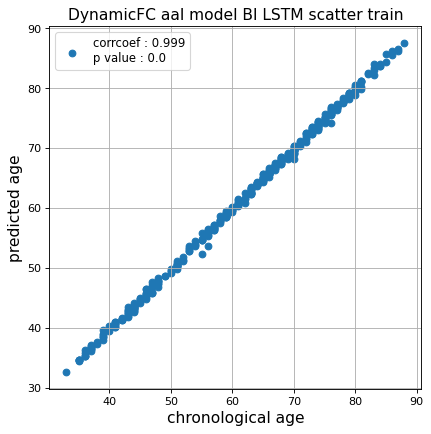

r^2 train data:  0.9985271363878702


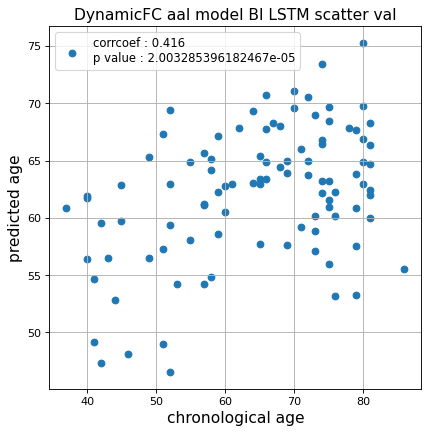

r^2 val data:  0.1352105463872909


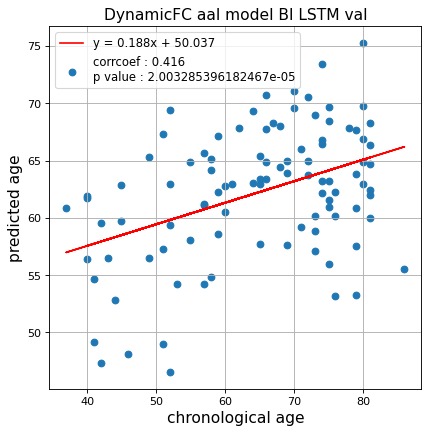

切片: 50.03671086764763
傾き: 0.18812052838160376
Nested Kfold ::: 2
Kfold: 1 ::: epoch: 100, loss: 0.01143142212039003, val loss: 0.657835066318512
Kfold: 1 ::: epoch: 200, loss: 0.005431626887562184, val loss: 0.6699764430522919
Kfold: 1 ::: epoch: 300, loss: 0.0038873903238429474, val loss: 0.6642992198467255
Kfold: 1 ::: epoch: 400, loss: 0.0029595459793479396, val loss: 0.6708613634109497
Kfold: 1 ::: epoch: 500, loss: 0.0026959367454625093, val loss: 0.655691385269165
Kfold: 1 ::: epoch: 600, loss: 0.004590391664980696, val loss: 0.6291944161057472
early stopping
save_epochs:407
best val loss:0.567298024892807


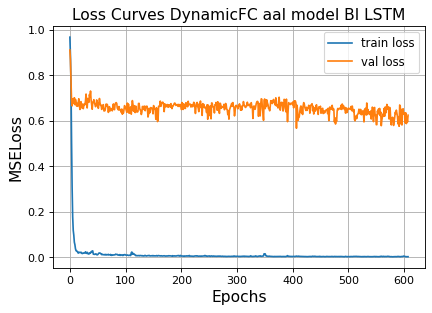

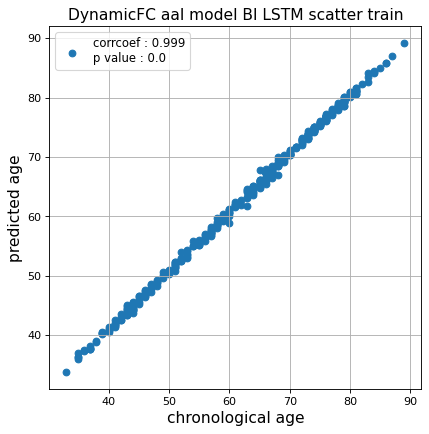

r^2 train data:  0.9957755577113068


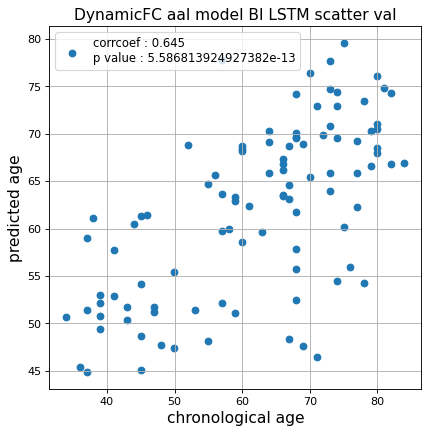

r^2 val data:  0.41622544118027593


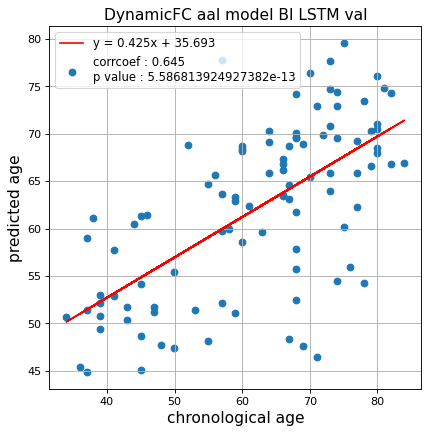

切片: 35.69297399981856
傾き: 0.4253506297099912
Kfold: 2 ::: epoch: 100, loss: 0.009717873136441294, val loss: 0.5893224775791168
Kfold: 2 ::: epoch: 200, loss: 0.008009092344974097, val loss: 0.5666190758347511
Kfold: 2 ::: epoch: 300, loss: 0.005291536683216691, val loss: 0.5906031280755997
Kfold: 2 ::: epoch: 400, loss: 0.0034076648119550487, val loss: 0.5495980009436607
Kfold: 2 ::: epoch: 500, loss: 0.002664925817113656, val loss: 0.575988881289959
early stopping
save_epochs:373
best val loss:0.5333300232887268


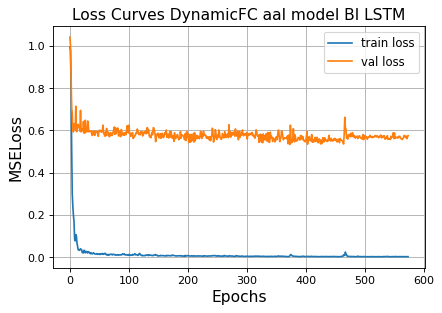

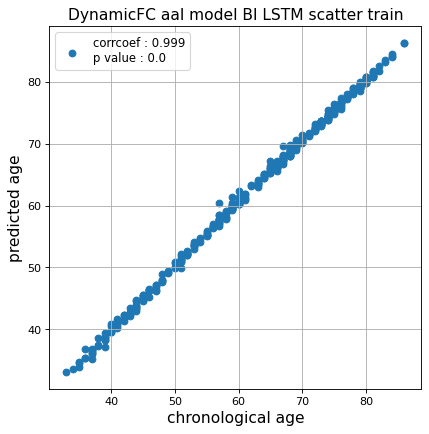

r^2 train data:  0.9971420943402867


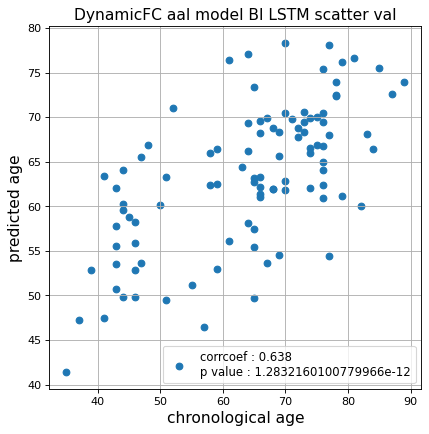

r^2 val data:  0.40410363450375886


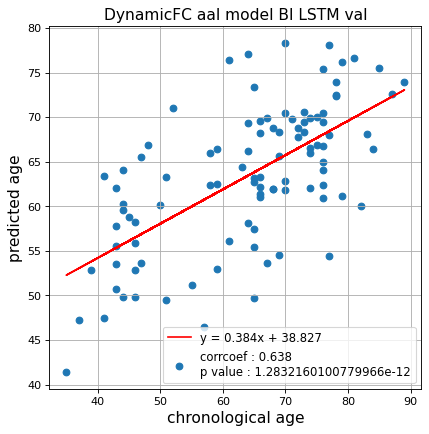

切片: 38.82706945161352
傾き: 0.38443066677902765
Kfold: 3 ::: epoch: 100, loss: 0.015621910659739604, val loss: 0.8278182595968246
Kfold: 3 ::: epoch: 200, loss: 0.007386180178190653, val loss: 0.9191208183765411
Kfold: 3 ::: epoch: 300, loss: 0.005729537976619143, val loss: 0.9562851786613464
Kfold: 3 ::: epoch: 400, loss: 0.004570213110687641, val loss: 0.9365090429782867
early stopping
save_epochs:247
best val loss:0.8875419795513153


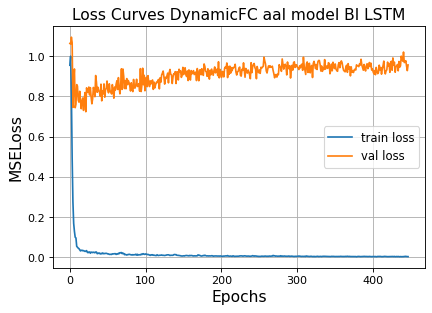

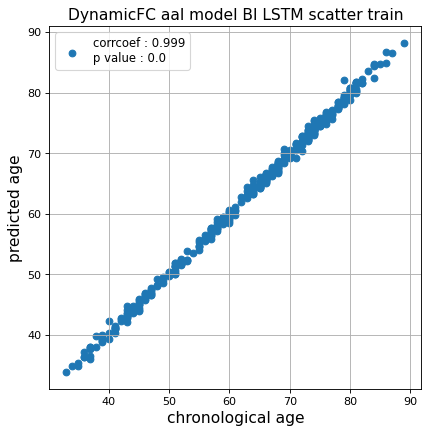

r^2 train data:  0.9977860739015562


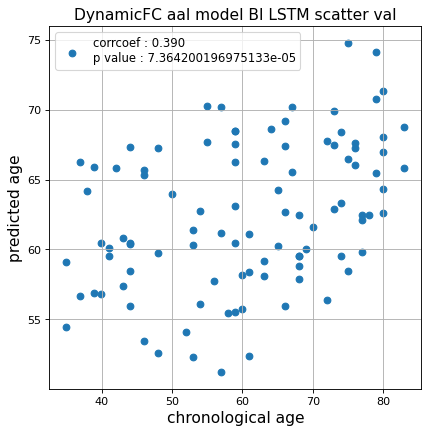

r^2 val data:  0.13344665243406062


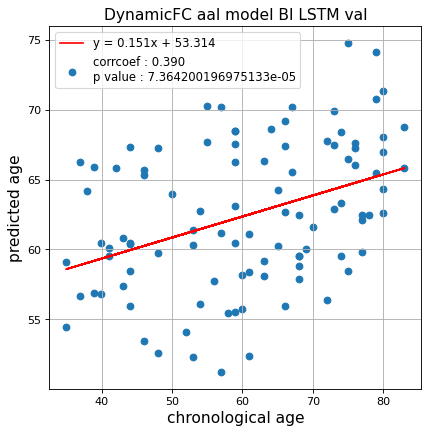

切片: 53.314425618148405
傾き: 0.15077709421045396
Kfold: 4 ::: epoch: 100, loss: 0.012792644341691183, val loss: 1.0023983716964722
Kfold: 4 ::: epoch: 200, loss: 0.008191495238301845, val loss: 1.0552321076393127
Kfold: 4 ::: epoch: 300, loss: 0.005469765102204222, val loss: 0.9672365784645081
Kfold: 4 ::: epoch: 400, loss: 0.003745011788291427, val loss: 0.9551558792591095
Kfold: 4 ::: epoch: 500, loss: 0.0038150156346651223, val loss: 0.9447287619113922
Kfold: 4 ::: epoch: 600, loss: 0.0030989337605066025, val loss: 0.9685661196708679
Kfold: 4 ::: epoch: 700, loss: 0.0038334891880647494, val loss: 0.9944919049739838
save_epochs:510
best val loss:0.8974516987800598


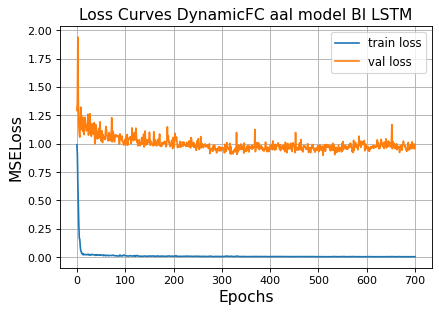

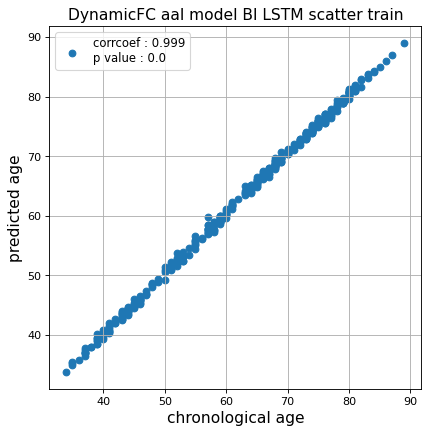

r^2 train data:  0.9975155484756787


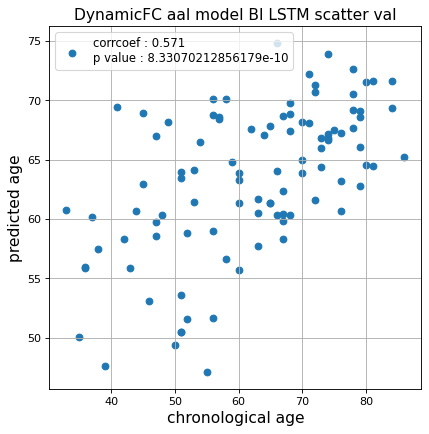

r^2 val data:  0.305353253459303


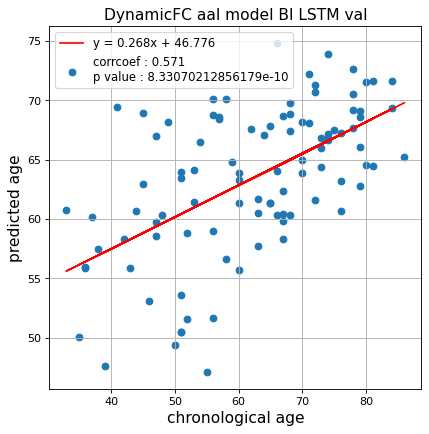

切片: 46.77578491190063
傾き: 0.26771864645679017
Kfold: 5 ::: epoch: 100, loss: 0.012327240206874333, val loss: 0.6292518079280853
Kfold: 5 ::: epoch: 200, loss: 0.0060563415575485965, val loss: 0.6752075105905533
Kfold: 5 ::: epoch: 300, loss: 0.0040197682638580985, val loss: 0.6354905813932419
Kfold: 5 ::: epoch: 400, loss: 0.004048016423789354, val loss: 0.6489782780408859
early stopping
save_epochs:281
best val loss:0.6028423011302948


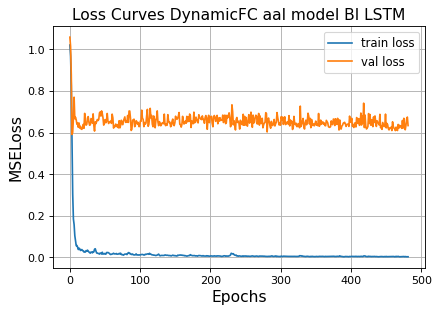

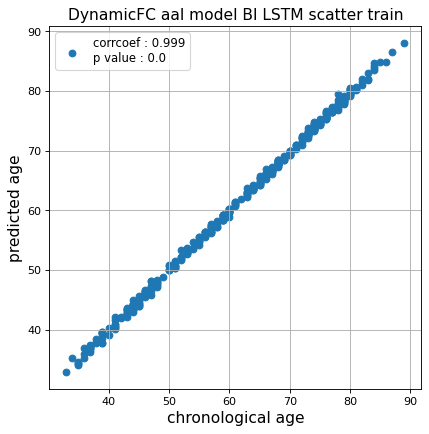

r^2 train data:  0.998647911760557


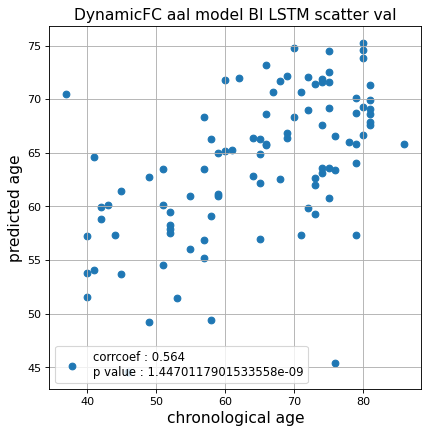

r^2 val data:  0.3141718392751556


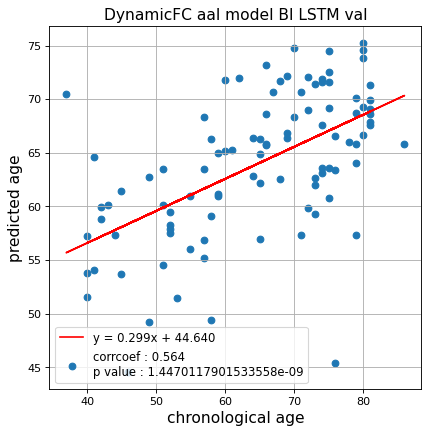

切片: 44.63970027624449
傾き: 0.2987407090549082
Nested Kfold ::: 3
Kfold: 1 ::: epoch: 100, loss: 0.02081130989469015, val loss: 0.6871774643659592
Kfold: 1 ::: epoch: 200, loss: 0.0054218232309302455, val loss: 0.6787267178297043
Kfold: 1 ::: epoch: 300, loss: 0.003446885196563716, val loss: 0.6566496640443802
Kfold: 1 ::: epoch: 400, loss: 0.0037680478730740454, val loss: 0.6796567142009735
early stopping
save_epochs:225
best val loss:0.6303411573171616


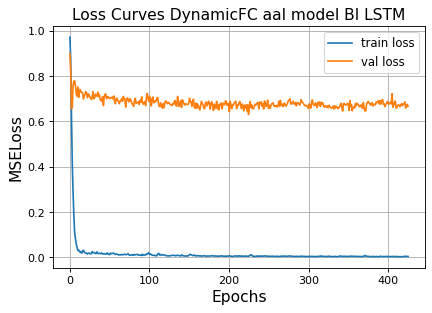

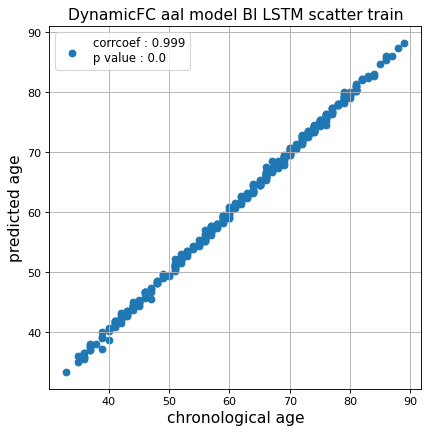

r^2 train data:  0.9986633688369827


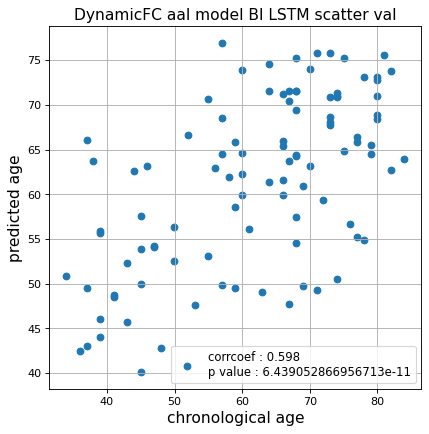

r^2 val data:  0.3469696596806212


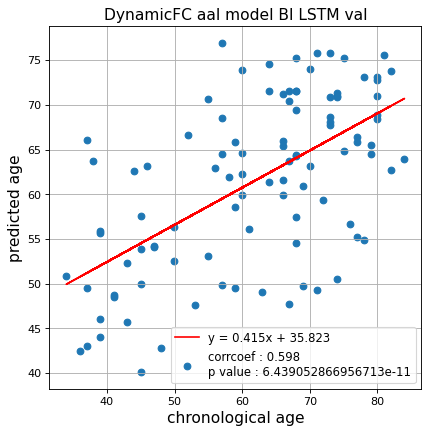

切片: 35.823092213709316
傾き: 0.41527993873012314
Kfold: 2 ::: epoch: 100, loss: 0.01608924836350175, val loss: 0.661383792757988
Kfold: 2 ::: epoch: 200, loss: 0.009651902382476972, val loss: 0.632424695417285
Kfold: 2 ::: epoch: 300, loss: 0.006487664157667985, val loss: 0.6348288357257843
Kfold: 2 ::: epoch: 400, loss: 0.006239259651360603, val loss: 0.6355662606656551
Kfold: 2 ::: epoch: 500, loss: 0.0046327374517344515, val loss: 0.6448197904974222
early stopping
save_epochs:346
best val loss:0.6231364663690329


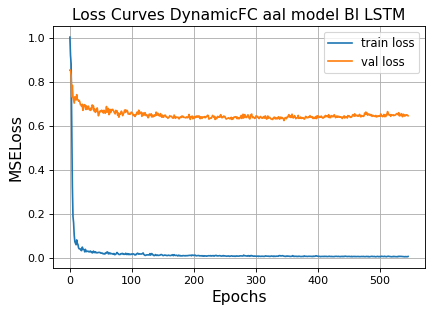

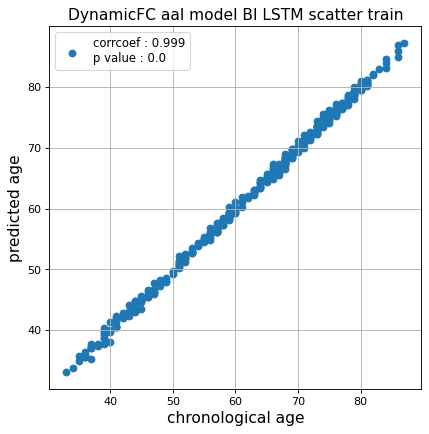

r^2 train data:  0.9982147168900998


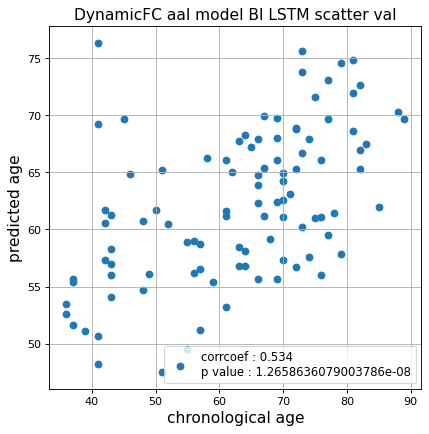

r^2 val data:  0.27986664428469965


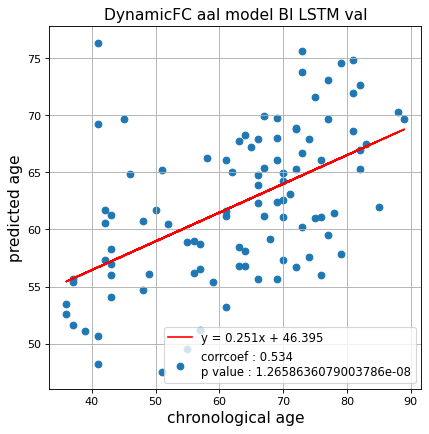

切片: 46.39505064555138
傾き: 0.25147659213470724
Kfold: 3 ::: epoch: 100, loss: 0.011818997060450224, val loss: 0.8738476932048798
Kfold: 3 ::: epoch: 200, loss: 0.008318327295665558, val loss: 0.9577389359474182
Kfold: 3 ::: epoch: 300, loss: 0.006502099263553436, val loss: 0.8504698276519775
Kfold: 3 ::: epoch: 400, loss: 0.003977218732381096, val loss: 0.8112660497426987
Kfold: 3 ::: epoch: 500, loss: 0.0028098512512560072, val loss: 0.9148493111133575
Kfold: 3 ::: epoch: 600, loss: 0.0035528547417085906, val loss: 0.8967412263154984
Kfold: 3 ::: epoch: 700, loss: 0.0022951541737151835, val loss: 0.9431972950696945
save_epochs:555
best val loss:0.7823715731501579


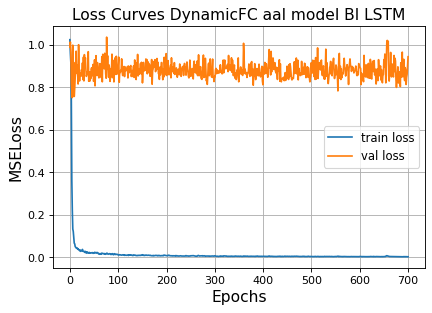

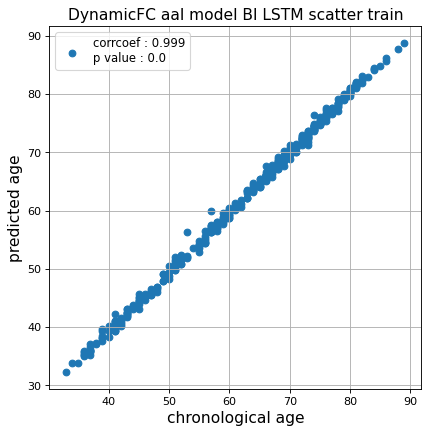

r^2 train data:  0.9968930995527424


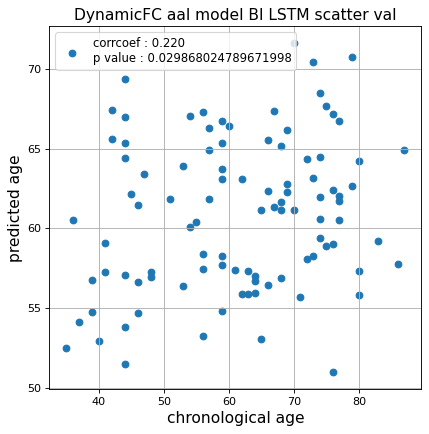

r^2 val data:  0.027354809253984924


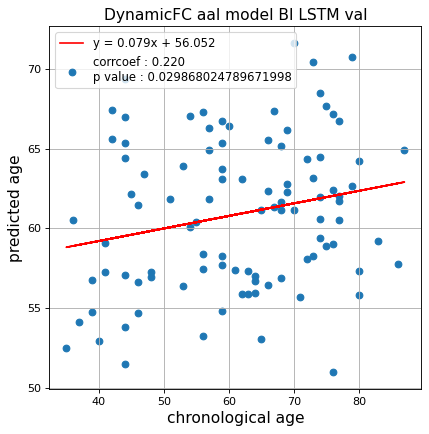

切片: 56.05234326832124
傾き: 0.07864594540624333
Kfold: 4 ::: epoch: 100, loss: 0.010897054229504786, val loss: 1.0328028500080109
Kfold: 4 ::: epoch: 200, loss: 0.008118215017020702, val loss: 1.0554298907518387
Kfold: 4 ::: epoch: 300, loss: 0.006110841730752816, val loss: 1.0534275323152542
Kfold: 4 ::: epoch: 400, loss: 0.005407043983443425, val loss: 1.0569103062152863
early stopping
save_epochs:207
best val loss:1.0144542902708054


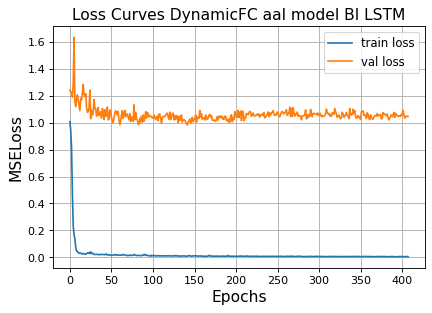

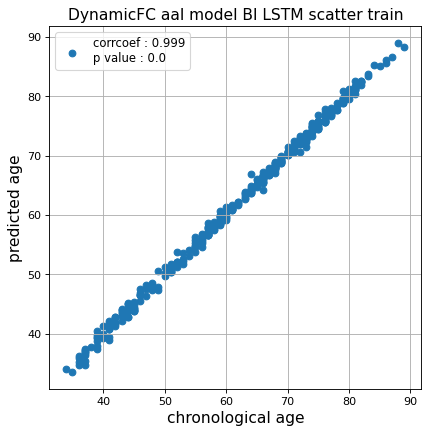

r^2 train data:  0.9972496901986881


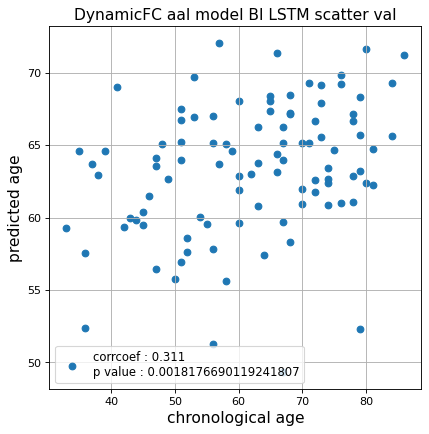

r^2 val data:  0.08535639555723429


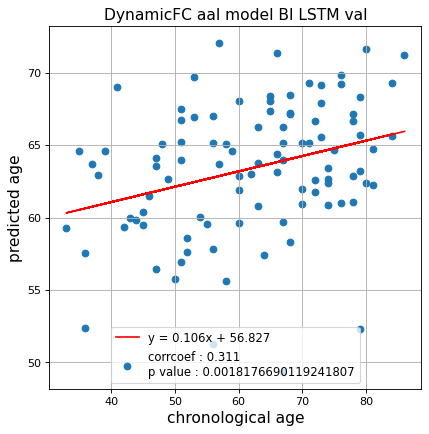

切片: 56.82692212093686
傾き: 0.10608577909588061
Kfold: 5 ::: epoch: 100, loss: 0.015245584699396904, val loss: 1.0191929936408997
Kfold: 5 ::: epoch: 200, loss: 0.007007836220929256, val loss: 0.9969300627708435
Kfold: 5 ::: epoch: 300, loss: 0.007704853904075348, val loss: 0.9729604721069336
Kfold: 5 ::: epoch: 400, loss: 0.005071080701712232, val loss: 1.0304442048072815
Kfold: 5 ::: epoch: 500, loss: 0.0049790870398283005, val loss: 1.0309125930070877
early stopping
save_epochs:318
best val loss:0.949633777141571


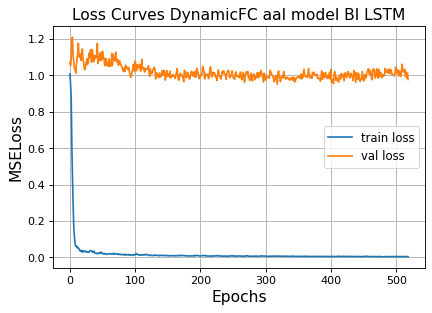

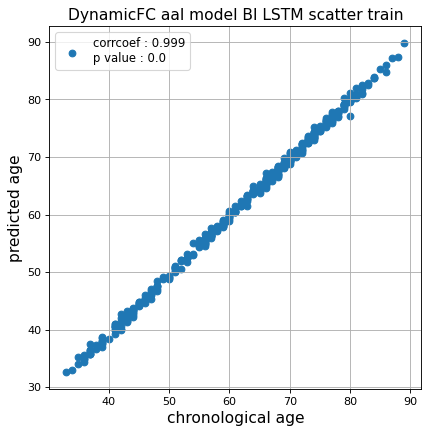

r^2 train data:  0.9973617292889573


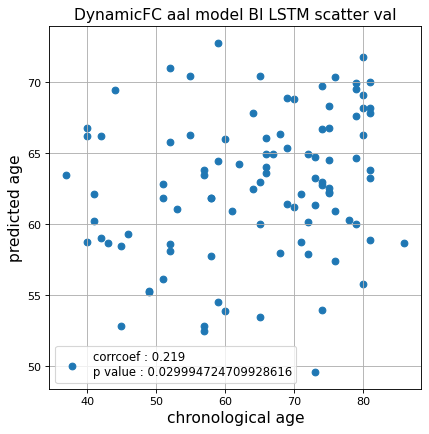

r^2 val data:  -0.002368192507510747


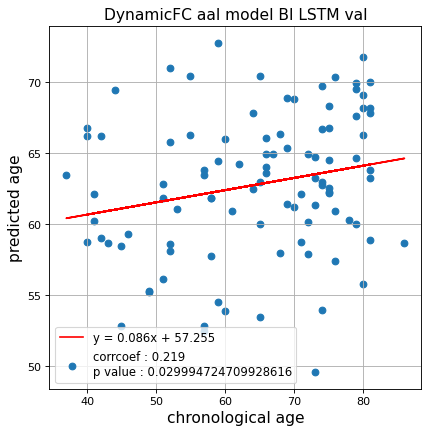

切片: 57.25470204364196
傾き: 0.08599674247226487
Nested Kfold ::: 4
Kfold: 1 ::: epoch: 100, loss: 0.02980337678813017, val loss: 0.6525620222091675
Kfold: 1 ::: epoch: 200, loss: 0.005126274208753155, val loss: 0.616672620177269
Kfold: 1 ::: epoch: 300, loss: 0.0035344219515816523, val loss: 0.5896781086921692
Kfold: 1 ::: epoch: 400, loss: 0.004315759897088775, val loss: 0.6001588553190231
Kfold: 1 ::: epoch: 500, loss: 0.002539007727486583, val loss: 0.6031232327222824
Kfold: 1 ::: epoch: 600, loss: 0.0024418551116608656, val loss: 0.5952820032835007
Kfold: 1 ::: epoch: 700, loss: 0.002289496944285929, val loss: 0.5908087939023972
save_epochs:554
best val loss:0.5531399473547935


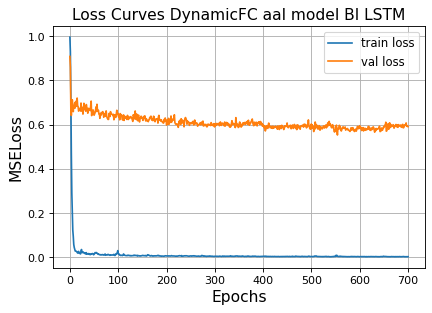

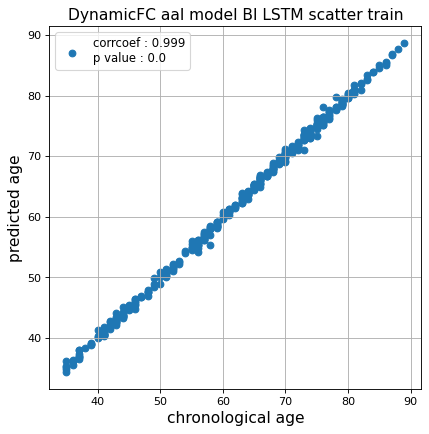

r^2 train data:  0.9984227021082722


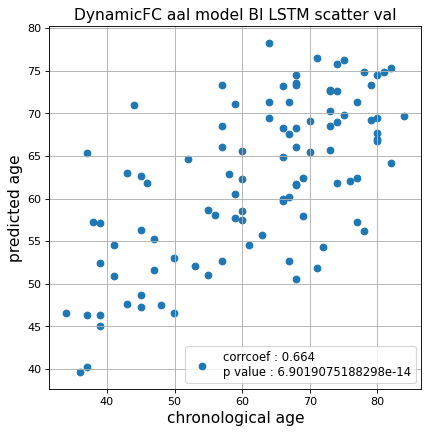

r^2 val data:  0.4403702358149698


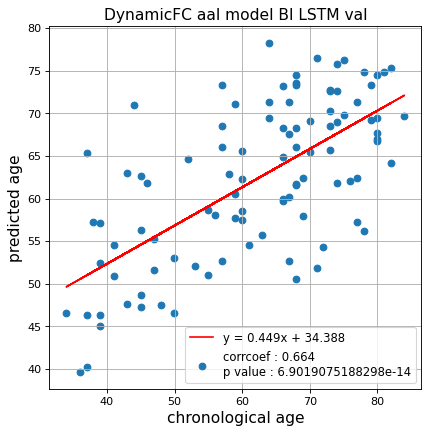

切片: 34.38818905730597
傾き: 0.44885218455110343
Kfold: 2 ::: epoch: 100, loss: 0.010717709154750291, val loss: 0.9306914433836937
Kfold: 2 ::: epoch: 200, loss: 0.009710215497761965, val loss: 0.9211603589355946
Kfold: 2 ::: epoch: 300, loss: 0.005243117222562432, val loss: 0.9056876413524151
Kfold: 2 ::: epoch: 400, loss: 0.004657986609695049, val loss: 0.9317599646747112
Kfold: 2 ::: epoch: 500, loss: 0.003939148647567401, val loss: 0.9080718569457531
early stopping
save_epochs:303
best val loss:0.8865467421710491


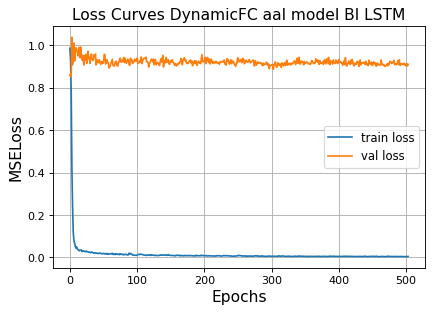

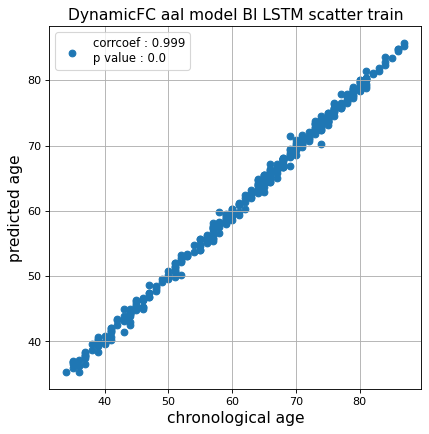

r^2 train data:  0.9956451627090951


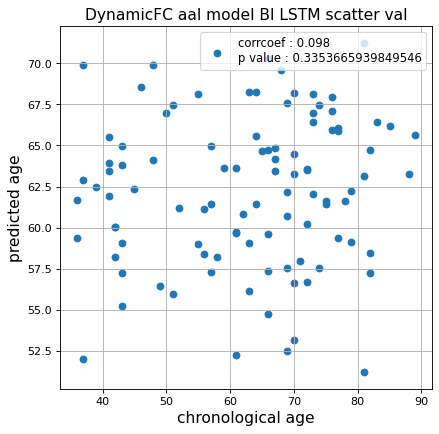

r^2 val data:  -0.04128170190620928


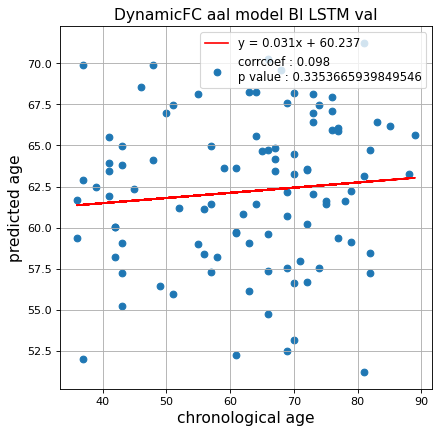

切片: 60.236506756931746
傾き: 0.031426430690879484
Kfold: 3 ::: epoch: 100, loss: 0.011402321979403496, val loss: 0.6410237848758698
Kfold: 3 ::: epoch: 200, loss: 0.007777247148064466, val loss: 0.5725854337215424
Kfold: 3 ::: epoch: 300, loss: 0.006782678439496801, val loss: 0.5697942972183228
Kfold: 3 ::: epoch: 400, loss: 0.004048722608086581, val loss: 0.6030236259102821
Kfold: 3 ::: epoch: 500, loss: 0.0031487329307800303, val loss: 0.5429108813405037
early stopping
save_epochs:299
best val loss:0.4989875666797161


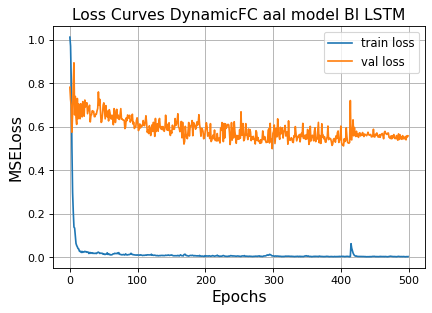

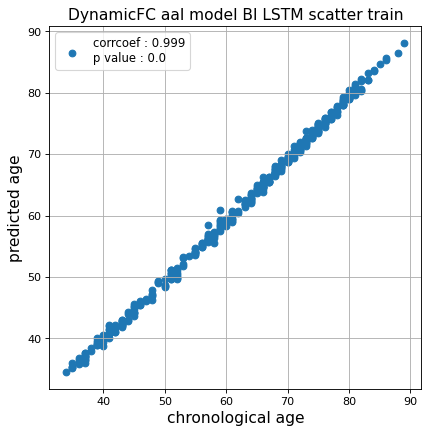

r^2 train data:  0.9955128415919133


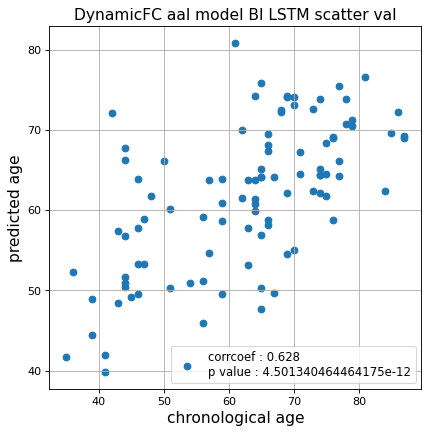

r^2 val data:  0.38788921541721944


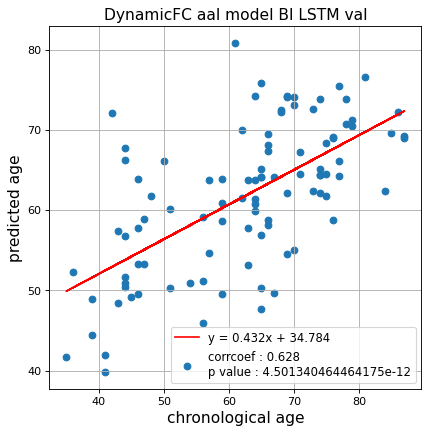

切片: 34.78371570462115
傾き: 0.4316234706459341
Kfold: 4 ::: epoch: 100, loss: 0.01150370084752257, val loss: 1.0532378256320953
Kfold: 4 ::: epoch: 200, loss: 0.006687475547481041, val loss: 1.0212827622890472
Kfold: 4 ::: epoch: 300, loss: 0.005434051603795244, val loss: 0.9930449426174164
Kfold: 4 ::: epoch: 400, loss: 0.004528938506085139, val loss: 0.9466820135712624
Kfold: 4 ::: epoch: 500, loss: 0.0049033551835096795, val loss: 0.9811578094959259
Kfold: 4 ::: epoch: 600, loss: 0.0032345161844904604, val loss: 0.9348795339465141
Kfold: 4 ::: epoch: 700, loss: 0.024885554439746417, val loss: 1.0162559747695923
save_epochs:644
best val loss:0.823790118098259


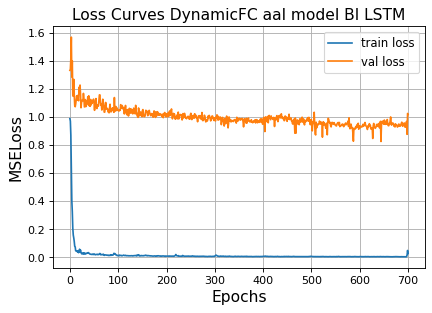

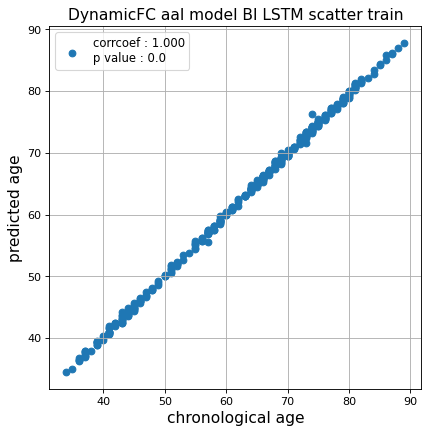

r^2 train data:  0.9990229753413726


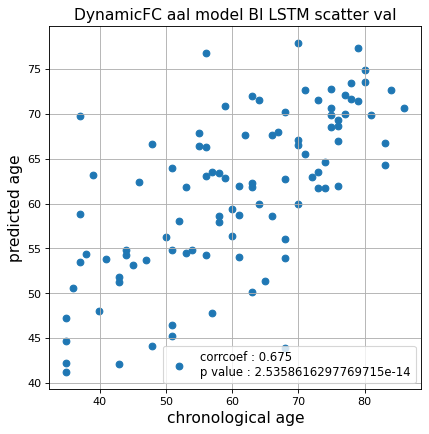

r^2 val data:  0.4527871305532859


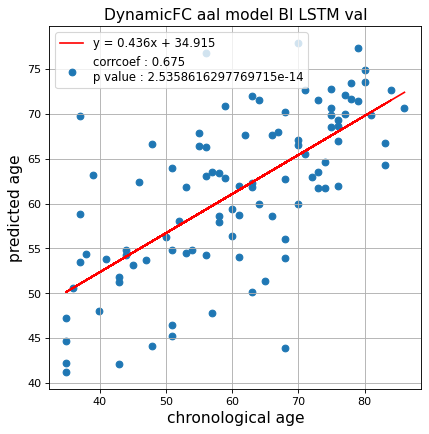

切片: 34.914795671665175
傾き: 0.4357922647750785
Kfold: 5 ::: epoch: 100, loss: 0.008365280603846679, val loss: 0.9721225053071976
Kfold: 5 ::: epoch: 200, loss: 0.007358466597417226, val loss: 0.9848770499229431
Kfold: 5 ::: epoch: 300, loss: 0.005964457809638519, val loss: 0.9813543409109116
Kfold: 5 ::: epoch: 400, loss: 0.004186917651587954, val loss: 1.0031434297561646
Kfold: 5 ::: epoch: 500, loss: 0.0038425525686202142, val loss: 1.0303920209407806
Kfold: 5 ::: epoch: 600, loss: 0.0038323608549455036, val loss: 1.0029195547103882
early stopping
save_epochs:411
best val loss:0.9554685205221176


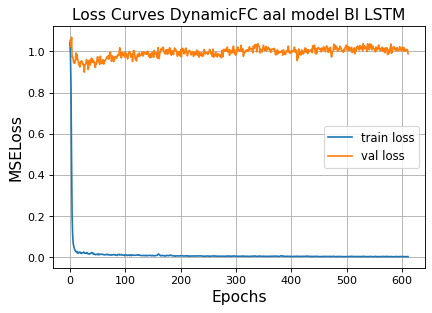

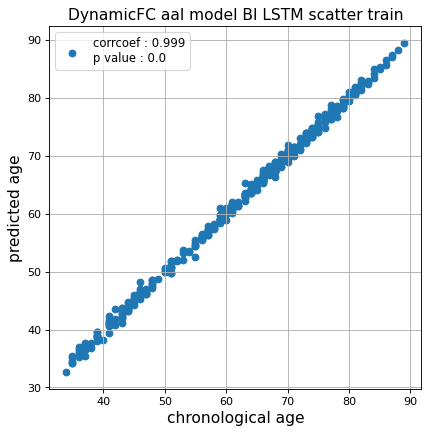

r^2 train data:  0.9977252052640828


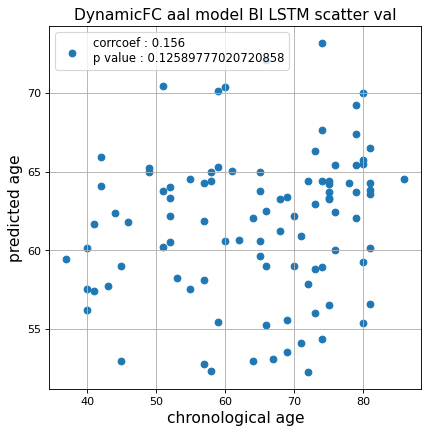

r^2 val data:  -0.07285841913098001


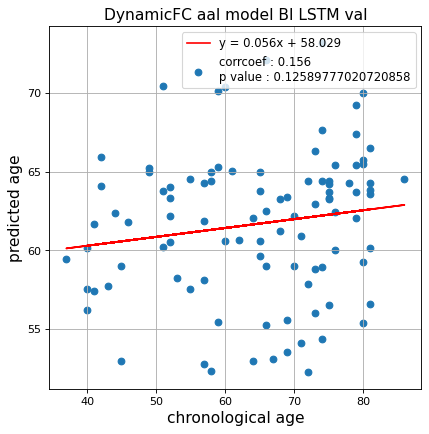

切片: 58.02901031741146
傾き: 0.05637091909694415
Nested Kfold ::: 5
Kfold: 1 ::: epoch: 100, loss: 0.00769540320078914, val loss: 0.7152715921401978
Kfold: 1 ::: epoch: 200, loss: 0.004861839402180452, val loss: 0.6978919506072998
Kfold: 1 ::: epoch: 300, loss: 0.003333744091483263, val loss: 0.7070217430591583
Kfold: 1 ::: epoch: 400, loss: 0.002699662698432803, val loss: 0.7091964334249496
Kfold: 1 ::: epoch: 500, loss: 0.002388631119034611, val loss: 0.713580533862114
Kfold: 1 ::: epoch: 600, loss: 0.002417298051743553, val loss: 0.7008140683174133
Kfold: 1 ::: epoch: 700, loss: 0.0022347111998197553, val loss: 0.7028853744268417
save_epochs:532
best val loss:0.6229905486106873


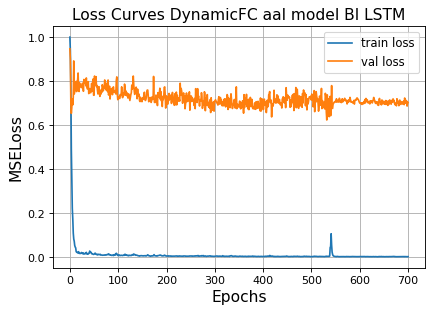

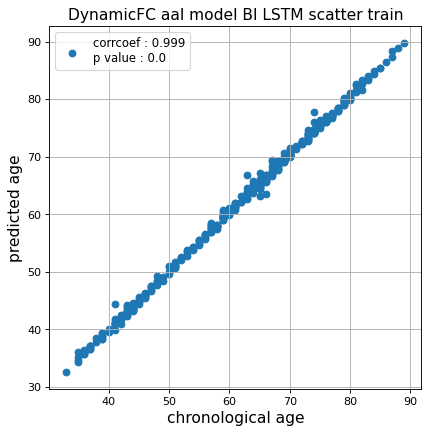

r^2 train data:  0.9970478430926613


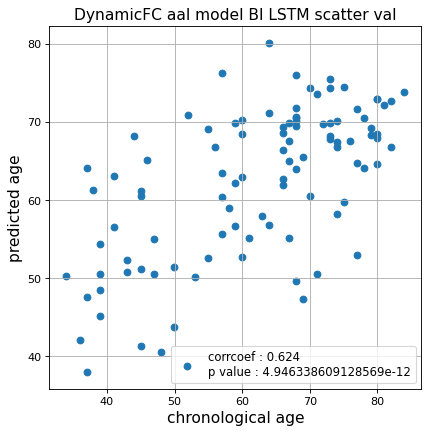

r^2 val data:  0.3841876516671773


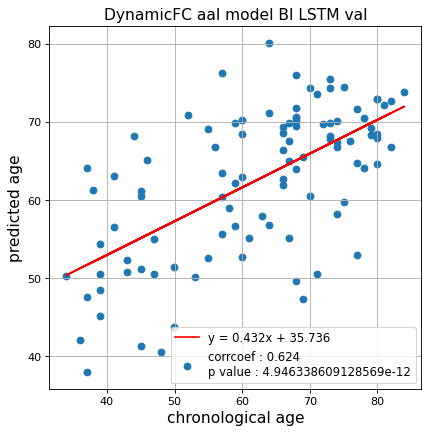

切片: 35.73609028095099
傾き: 0.43179570229290426
Kfold: 2 ::: epoch: 100, loss: 0.010348852043255018, val loss: 1.0274549275636673
Kfold: 2 ::: epoch: 200, loss: 0.007897221142999254, val loss: 1.0254656188189983
Kfold: 2 ::: epoch: 300, loss: 0.005225378840875167, val loss: 1.0257557593286037
Kfold: 2 ::: epoch: 400, loss: 0.00543574530344743, val loss: 1.0081662759184837
Kfold: 2 ::: epoch: 500, loss: 0.0036361204155792412, val loss: 0.9994870163500309
Kfold: 2 ::: epoch: 600, loss: 0.004497505634879837, val loss: 0.9840919636189938
Kfold: 2 ::: epoch: 700, loss: 0.002850564895197749, val loss: 0.9536190032958984
save_epochs:642
best val loss:0.9535317905247211


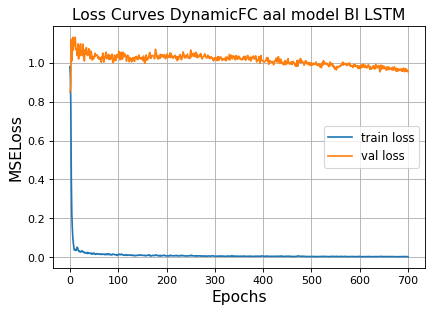

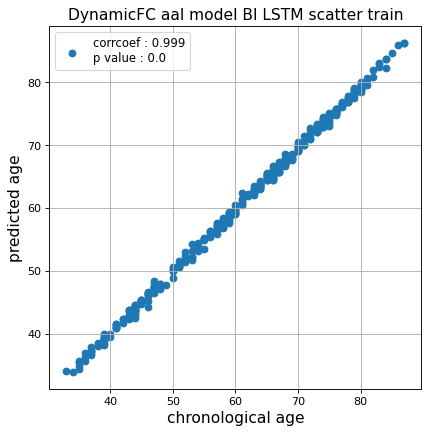

r^2 train data:  0.9976163809909357


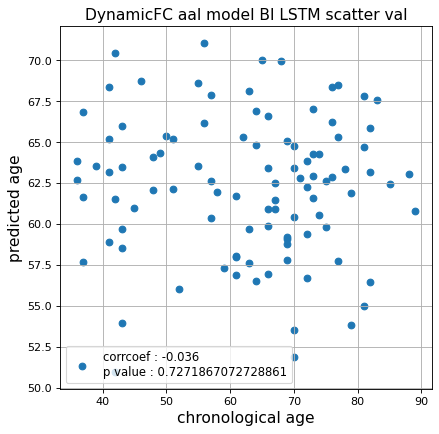

r^2 val data:  -0.11365100702334474


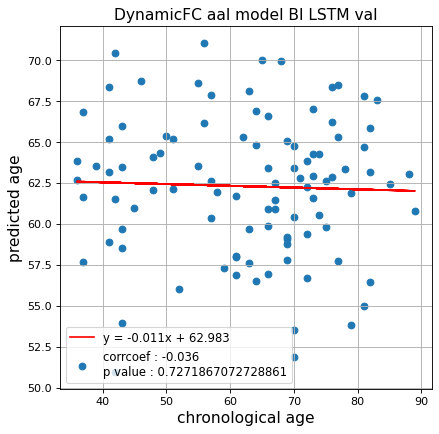

切片: 62.98259639414409
傾き: -0.010745977382886041
Kfold: 3 ::: epoch: 100, loss: 0.012990014949956765, val loss: 0.43615222349762917
Kfold: 3 ::: epoch: 200, loss: 0.006842564540700271, val loss: 0.434865839779377
Kfold: 3 ::: epoch: 300, loss: 0.005635741041400111, val loss: 0.44043662399053574
Kfold: 3 ::: epoch: 400, loss: 0.0032124197325454308, val loss: 0.4517234303057194
early stopping
save_epochs:277
best val loss:0.4227856546640396


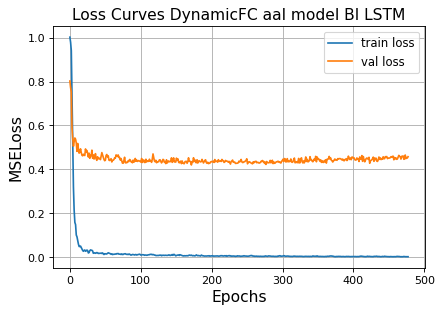

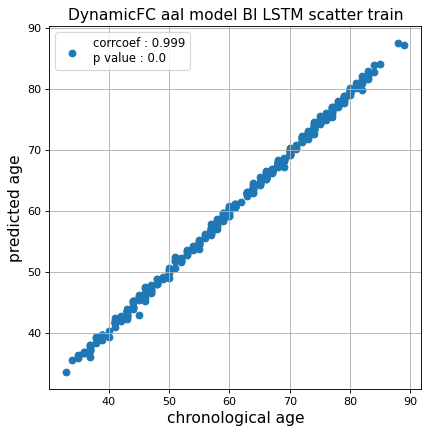

r^2 train data:  0.9980317450510464


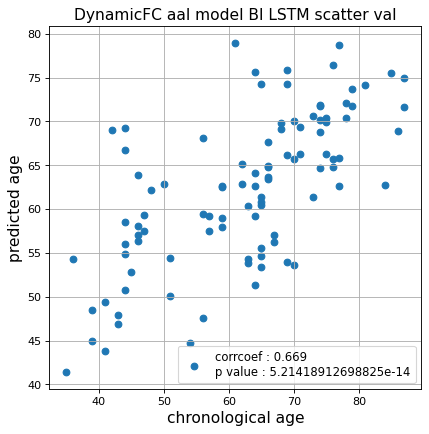

r^2 val data:  0.447127837371157


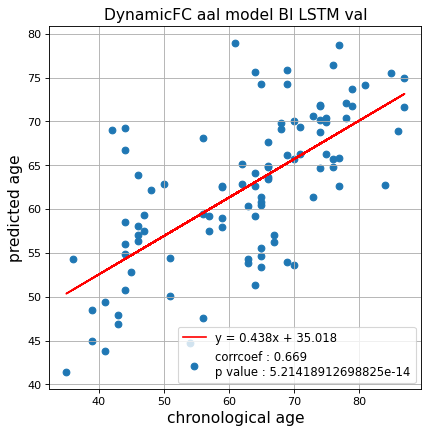

切片: 35.0183536092362
傾き: 0.43819290083131646
Kfold: 4 ::: epoch: 100, loss: 0.012975488789379597, val loss: 0.611000582575798
Kfold: 4 ::: epoch: 200, loss: 0.006895694165275647, val loss: 0.5802531391382217
Kfold: 4 ::: epoch: 300, loss: 0.004582152289983172, val loss: 0.5386711210012436
Kfold: 4 ::: epoch: 400, loss: 0.0046153521308532125, val loss: 0.5159632638096809
Kfold: 4 ::: epoch: 500, loss: 0.0032349790965851685, val loss: 0.5320134460926056
Kfold: 4 ::: epoch: 600, loss: 0.003295433009043336, val loss: 0.4672669917345047
Kfold: 4 ::: epoch: 700, loss: 0.0037214885053869625, val loss: 0.4614400118589401
save_epochs:641
best val loss:0.4455230198800564


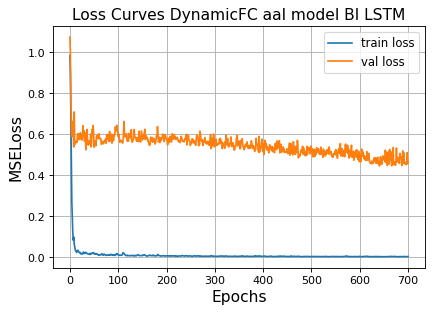

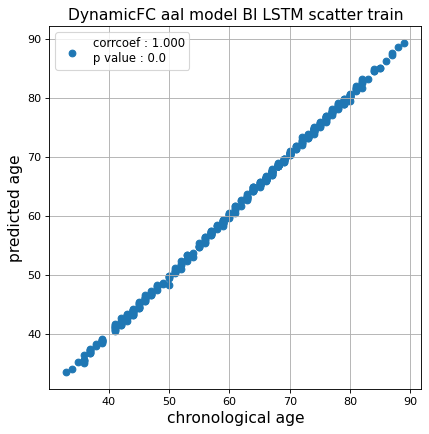

r^2 train data:  0.9987869442637871


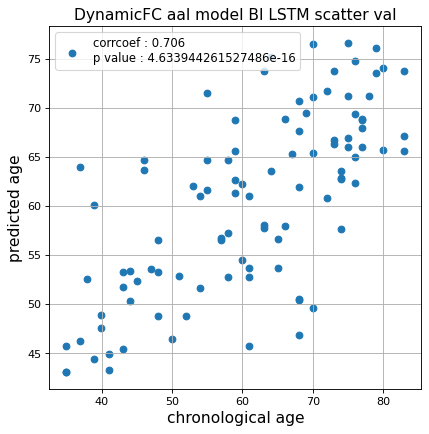

r^2 val data:  0.49489735779904753


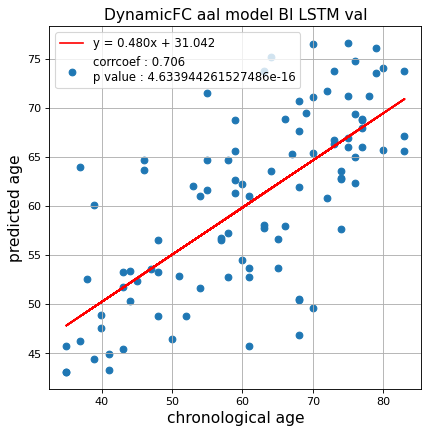

切片: 31.04184074291538
傾き: 0.47984637547793685
Kfold: 5 ::: epoch: 100, loss: 0.01168428690960774, val loss: 1.1354852616786957
Kfold: 5 ::: epoch: 200, loss: 0.008243752088254461, val loss: 1.188618540763855
Kfold: 5 ::: epoch: 300, loss: 0.005617038597567723, val loss: 1.1198920905590057
Kfold: 5 ::: epoch: 400, loss: 0.003711377467530278, val loss: 1.0749439150094986
Kfold: 5 ::: epoch: 500, loss: 0.003956733862511241, val loss: 1.0489233136177063
Kfold: 5 ::: epoch: 600, loss: 0.0034463165435366905, val loss: 1.0309649407863617
Kfold: 5 ::: epoch: 700, loss: 0.002534462658401865, val loss: 1.0550067126750946
save_epochs:629
best val loss:0.9827183336019516


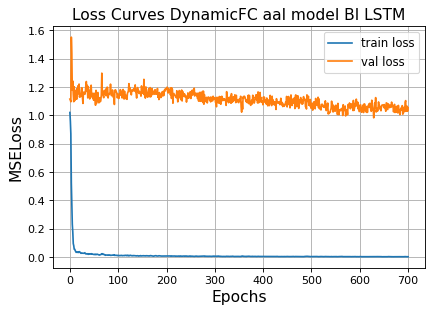

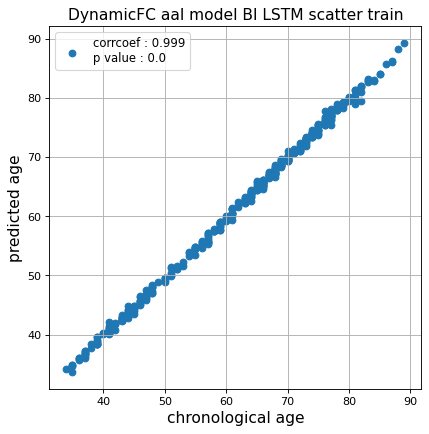

r^2 train data:  0.9980901234782037


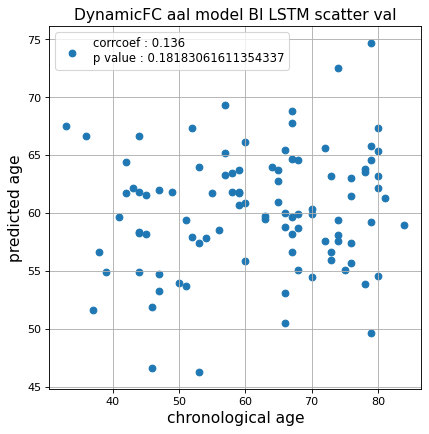

r^2 val data:  -0.05944771977530183


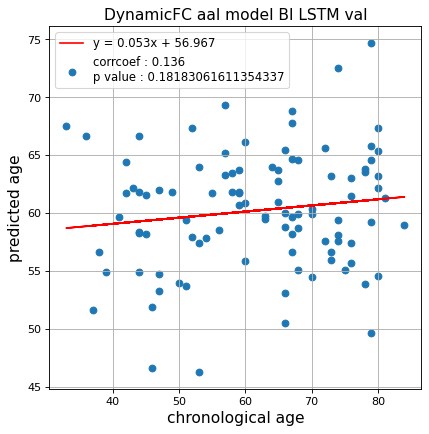

切片: 56.966950406151895
傾き: 0.05277103070811419
CPU times: user 1d 2h 18min 31s, sys: 7min 20s, total: 1d 2h 25min 51s
Wall time: 4h 45min 32s


In [20]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_aal_dynamic_2  = []
test_pred_aal_dynamic_corrected_2  = []
test_label_aal_dynamic_2 = []
test_idx_aal_dynamic_2   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_aal)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_dynamic_aal,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 700,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 128,
                                                           num_layers = 2,
                                                           fc_drop = 0.1,
                                                           bidirectional = True,
                                                           title = 'DynamicFC aal model BI LSTM'
                                                          )
    
    test_pred_aal_dynamic_2.append(test_pred)
    test_pred_aal_dynamic_corrected_2.append(test_pred_corrected)
    test_label_aal_dynamic_2.append(test_label)
    test_idx_aal_dynamic_2.append(test_idx)

### データ保存

In [ ]:
!python GPU.py LSTM_dFC_AAL

In [46]:
test_pred_aal_dynamic_1 = np.array(test_pred_aal_dynamic_1, dtype=object)
test_pred_aal_dynamic_corrected_1 = np.array(test_pred_aal_dynamic_corrected_1, dtype=object)

test_pred_aal_dynamic_2 = np.array(test_pred_aal_dynamic_2, dtype=object)
test_pred_aal_dynamic_corrected_2 = np.array(test_pred_aal_dynamic_corrected_2, dtype=object)

In [47]:
np.savez('../02_data_analysis/temp/dynamic_aal_lstm',
         test_pred_aal_dynamic_1,
         test_pred_aal_dynamic_corrected_1,
         test_label_aal_dynamic_1,
         test_idx_aal_dynamic_1)
np.savez('../02_data_analysis/temp/dynamic_aal_lstm_bi',
         test_pred_aal_dynamic_2,
         test_pred_aal_dynamic_corrected_2,
         test_label_aal_dynamic_2,
         test_idx_aal_dynamic_2)

## 学習(Harvard-Oxford)

### ROI 1

Nested Kfold ::: 1
Kfold: 1 ::: epoch: 100, loss: 0.027050456748558924, val loss: 0.8419681936502457
Kfold: 1 ::: epoch: 200, loss: 0.014612766340948068, val loss: 0.8185858726501465
Kfold: 1 ::: epoch: 300, loss: 0.012015926651656628, val loss: 0.7914802581071854
Kfold: 1 ::: epoch: 400, loss: 0.007596211400456154, val loss: 0.7715249806642532
Kfold: 1 ::: epoch: 500, loss: 0.007609231469149773, val loss: 0.730316236615181
Kfold: 1 ::: epoch: 600, loss: 0.006022592934851463, val loss: 0.7187646925449371
Kfold: 1 ::: epoch: 700, loss: 0.005263935962620263, val loss: 0.7155328541994095
Kfold: 1 ::: epoch: 800, loss: 0.004285589720194156, val loss: 0.6942413002252579
Kfold: 1 ::: epoch: 900, loss: 0.004647888601399385, val loss: 0.6845266744494438
Kfold: 1 ::: epoch: 1000, loss: 0.003797841455357579, val loss: 0.6756222099065781
save_epochs:972
best val loss:0.6703385934233665


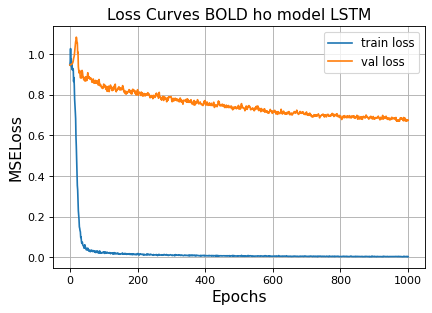

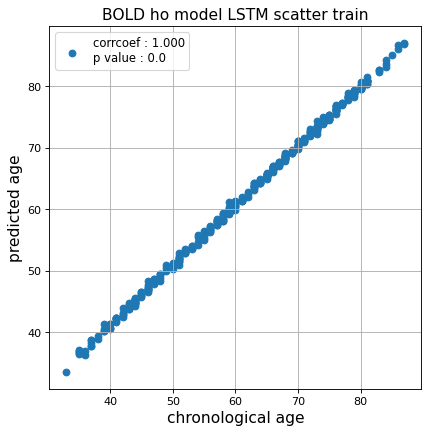

r^2 train data:  0.9958612606805654


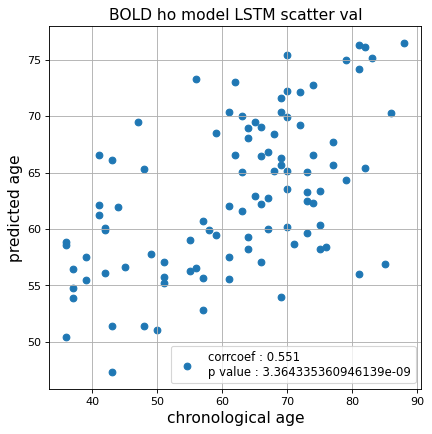

r^2 val data:  0.2939818296403687


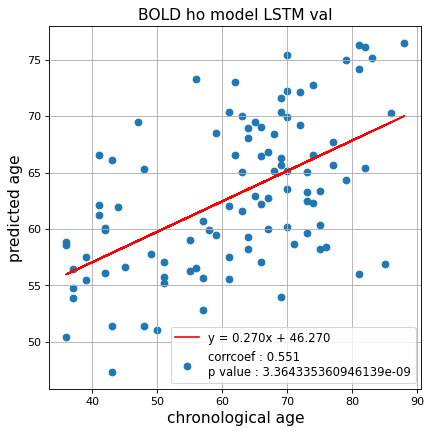

切片: 46.270178047056085
傾き: 0.26977542679537997
Kfold: 2 ::: epoch: 100, loss: 0.010137337474868847, val loss: 0.6562361270189285
Kfold: 2 ::: epoch: 200, loss: 0.006703799411367912, val loss: 0.6043456345796585
Kfold: 2 ::: epoch: 300, loss: 0.006986939258730182, val loss: 0.6031423881649971
Kfold: 2 ::: epoch: 400, loss: 0.00429862870190006, val loss: 0.5546622425317764
Kfold: 2 ::: epoch: 500, loss: 0.0037848358042538166, val loss: 0.556425467133522
Kfold: 2 ::: epoch: 600, loss: 0.0033088828562400662, val loss: 0.5394365042448044
Kfold: 2 ::: epoch: 700, loss: 0.004747140794419325, val loss: 0.5413591489195824
Kfold: 2 ::: epoch: 800, loss: 0.0022383728243697146, val loss: 0.5329794436693192
Kfold: 2 ::: epoch: 900, loss: 0.0040963354448859506, val loss: 0.5222984850406647
Kfold: 2 ::: epoch: 1000, loss: 0.0033205209228281793, val loss: 0.5148679167032242
save_epochs:953
best val loss:0.5057290121912956


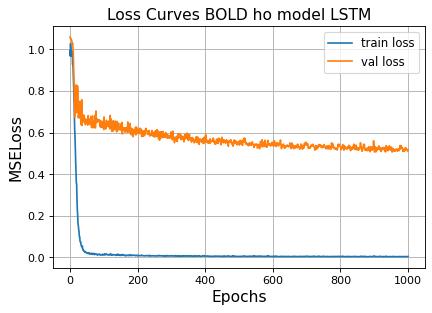

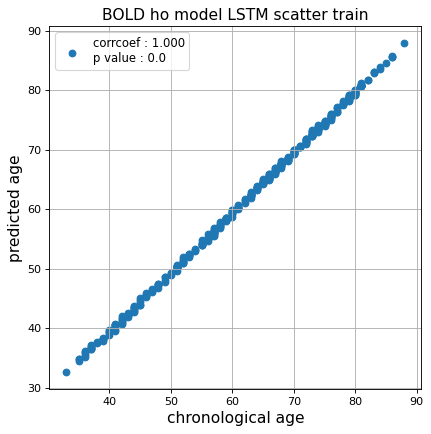

r^2 train data:  0.9978115569475398


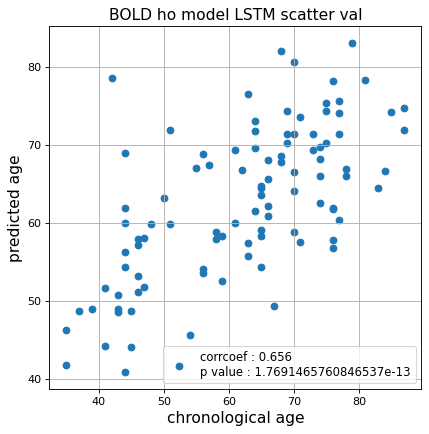

r^2 val data:  0.423107955522006


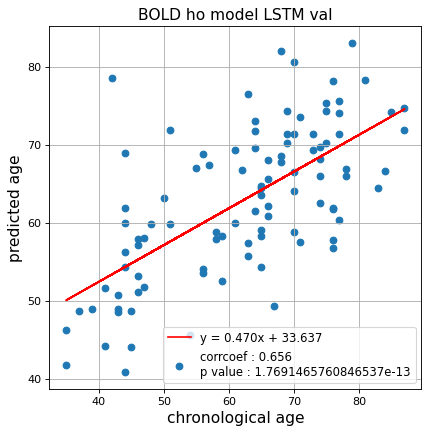

切片: 33.637379965472064
傾き: 0.4703174866233174
Kfold: 3 ::: epoch: 100, loss: 0.0151966568798973, val loss: 0.7728251516819
Kfold: 3 ::: epoch: 200, loss: 0.008719541383190798, val loss: 0.7216096073389053
Kfold: 3 ::: epoch: 300, loss: 0.007439239667012141, val loss: 0.6961270123720169
Kfold: 3 ::: epoch: 400, loss: 0.005187465504814799, val loss: 0.6563162505626678
Kfold: 3 ::: epoch: 500, loss: 0.004640057826271424, val loss: 0.6425407081842422
Kfold: 3 ::: epoch: 600, loss: 0.0033154601249127435, val loss: 0.6223790198564529
Kfold: 3 ::: epoch: 700, loss: 0.004390022323395197, val loss: 0.5978020578622818
Kfold: 3 ::: epoch: 800, loss: 0.0036055578205447933, val loss: 0.589364543557167
Kfold: 3 ::: epoch: 900, loss: 0.0037973114074422764, val loss: 0.5732488483190536
Kfold: 3 ::: epoch: 1000, loss: 0.003136831586464093, val loss: 0.5648353695869446
save_epochs:949
best val loss:0.5605114102363586


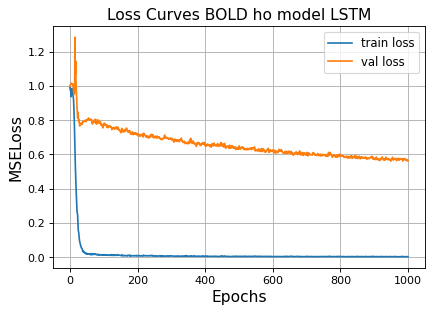

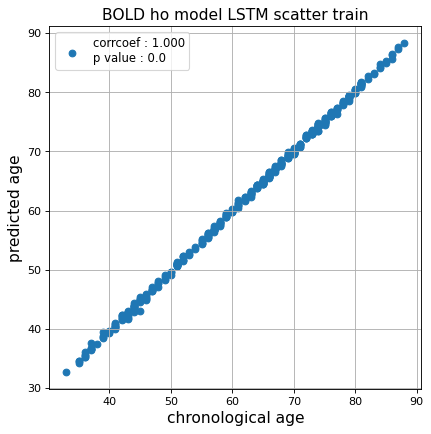

r^2 train data:  0.9991124394150249


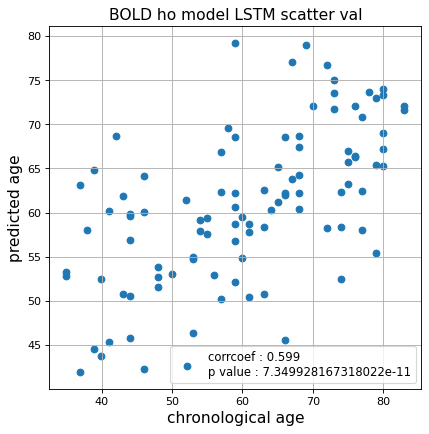

r^2 val data:  0.356358351014716


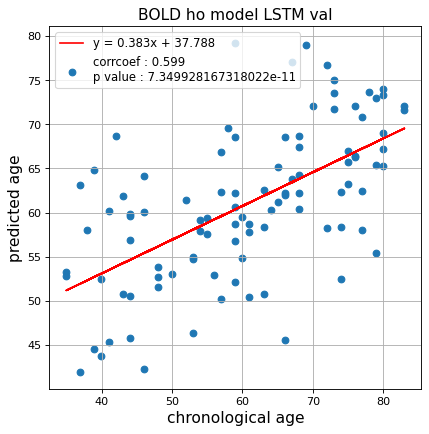

切片: 37.78803480298489
傾き: 0.3825189036995499
Kfold: 4 ::: epoch: 100, loss: 0.01757023297250271, val loss: 1.3737878650426865
Kfold: 4 ::: epoch: 200, loss: 0.011771424852598172, val loss: 1.3262422531843185
Kfold: 4 ::: epoch: 300, loss: 0.00754108433969892, val loss: 1.2114561051130295
Kfold: 4 ::: epoch: 400, loss: 0.006145221718515341, val loss: 1.1934021711349487
Kfold: 4 ::: epoch: 500, loss: 0.006107664147678476, val loss: 1.1022762954235077
Kfold: 4 ::: epoch: 600, loss: 0.004582314662492046, val loss: 1.0936576873064041
Kfold: 4 ::: epoch: 700, loss: 0.004496107298809175, val loss: 1.0703432112932205
Kfold: 4 ::: epoch: 800, loss: 0.00352839610646837, val loss: 1.0443164855241776
Kfold: 4 ::: epoch: 900, loss: 0.004310098225967242, val loss: 1.0019297152757645
Kfold: 4 ::: epoch: 1000, loss: 0.0032211183570325375, val loss: 0.9867291748523712
save_epochs:975
best val loss:0.9692124724388123


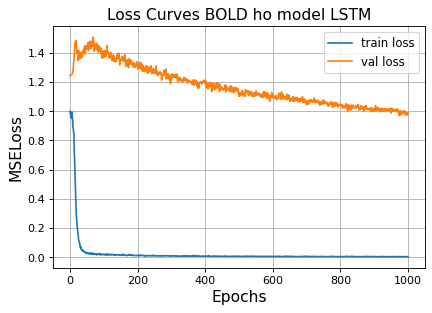

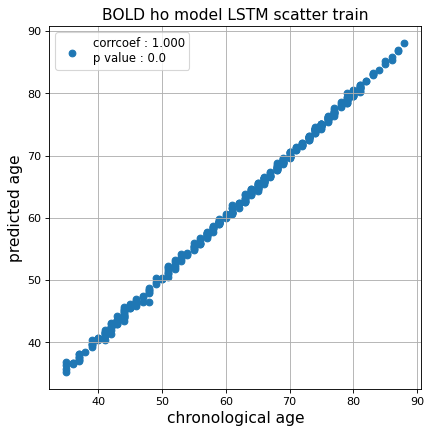

r^2 train data:  0.9986985068461783


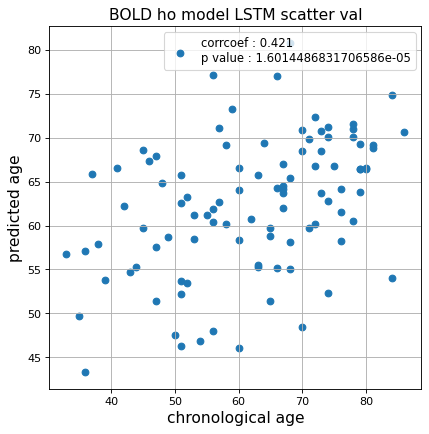

r^2 val data:  0.15379535782015785


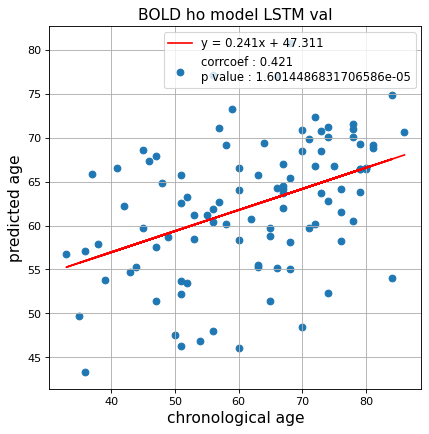

切片: 47.311388299401514
傾き: 0.2408914962156434
Kfold: 5 ::: epoch: 100, loss: 0.017450442895866357, val loss: 0.7915930896997452
Kfold: 5 ::: epoch: 200, loss: 0.010088732179540854, val loss: 0.7633464336395264
Kfold: 5 ::: epoch: 300, loss: 0.007498207645347485, val loss: 0.7435279190540314
Kfold: 5 ::: epoch: 400, loss: 0.006307465866064796, val loss: 0.7598544061183929
early stopping
save_epochs:229
best val loss:0.7386658936738968


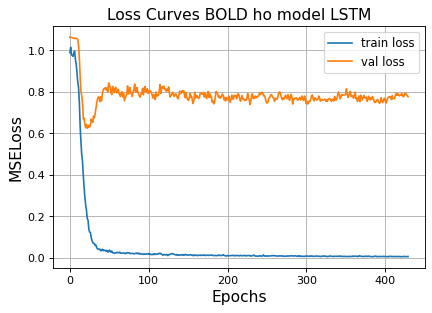

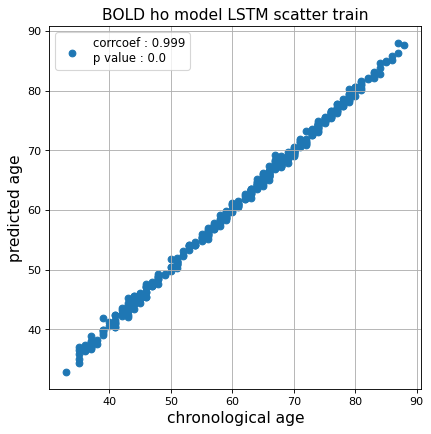

r^2 train data:  0.9976208984859328


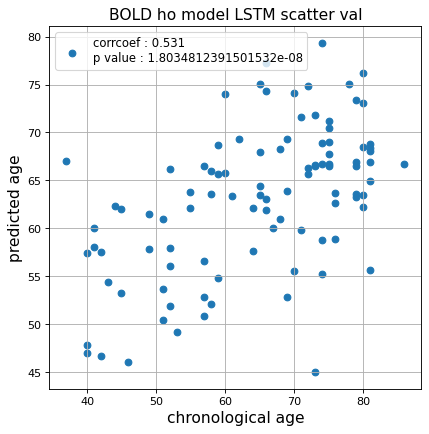

r^2 val data:  0.2629433291735601


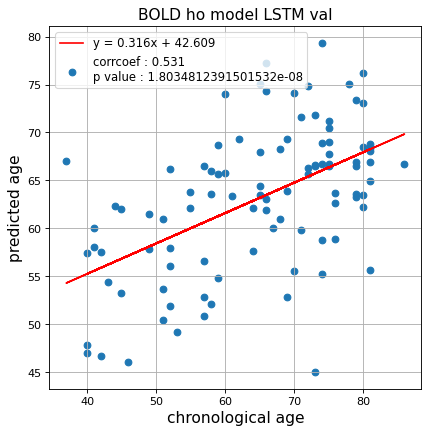

切片: 42.609147263296066
傾き: 0.3164716168610971
Nested Kfold ::: 2
Kfold: 1 ::: epoch: 100, loss: 0.026972206309437752, val loss: 0.8839370012283325
Kfold: 1 ::: epoch: 200, loss: 0.014233372030923, val loss: 0.7841949015855789
Kfold: 1 ::: epoch: 300, loss: 0.009534878620448021, val loss: 0.7374821901321411
Kfold: 1 ::: epoch: 400, loss: 0.007326285247332775, val loss: 0.6983523592352867
Kfold: 1 ::: epoch: 500, loss: 0.0058886739962662644, val loss: 0.6556820534169674
Kfold: 1 ::: epoch: 600, loss: 0.004908703697415499, val loss: 0.6376075856387615
Kfold: 1 ::: epoch: 700, loss: 0.004951421565447862, val loss: 0.6233607269823551
Kfold: 1 ::: epoch: 800, loss: 0.0039987565519718025, val loss: 0.5996186211705208
Kfold: 1 ::: epoch: 900, loss: 0.0053167118010326074, val loss: 0.5814239531755447
Kfold: 1 ::: epoch: 1000, loss: 0.004009491190887415, val loss: 0.5835035182535648
save_epochs:989
best val loss:0.5673424880951643


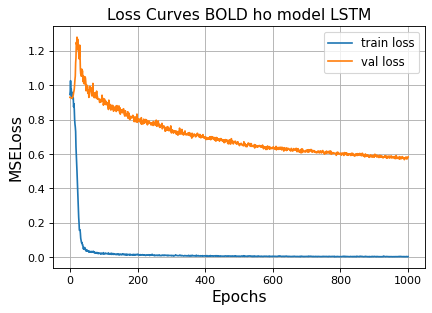

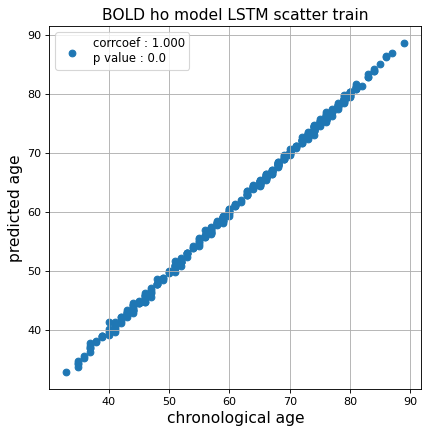

r^2 train data:  0.9991283455366586


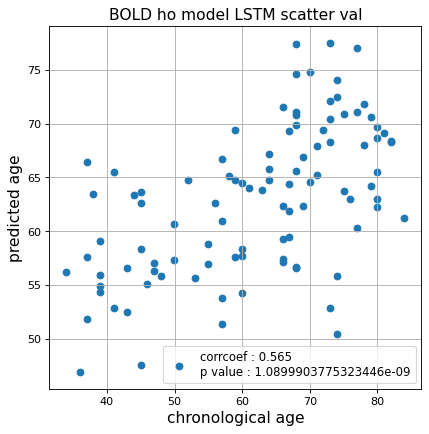

r^2 val data:  0.31089391208610406


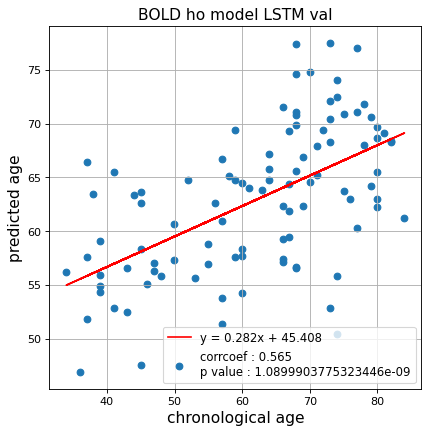

切片: 45.408327494475046
傾き: 0.28230811556228463
Kfold: 2 ::: epoch: 100, loss: 0.012112325200667748, val loss: 0.7390845268964767
Kfold: 2 ::: epoch: 200, loss: 0.008205651556356596, val loss: 0.6709410399198532
Kfold: 2 ::: epoch: 300, loss: 0.007170932045063147, val loss: 0.6367538049817085
Kfold: 2 ::: epoch: 400, loss: 0.00449534308595153, val loss: 0.5924876630306244
Kfold: 2 ::: epoch: 500, loss: 0.0035381042398512363, val loss: 0.5893186554312706
Kfold: 2 ::: epoch: 600, loss: 0.003895560709329752, val loss: 0.5748958140611649
Kfold: 2 ::: epoch: 700, loss: 0.0026725642562199095, val loss: 0.5625880658626556
Kfold: 2 ::: epoch: 800, loss: 0.002794124320364342, val loss: 0.5575959384441376
Kfold: 2 ::: epoch: 900, loss: 0.0029229067373447693, val loss: 0.5567194521427155
Kfold: 2 ::: epoch: 1000, loss: 0.0026465254799964335, val loss: 0.5510074198246002
save_epochs:963
best val loss:0.5423699282109737


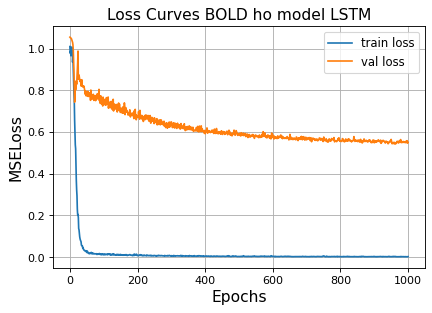

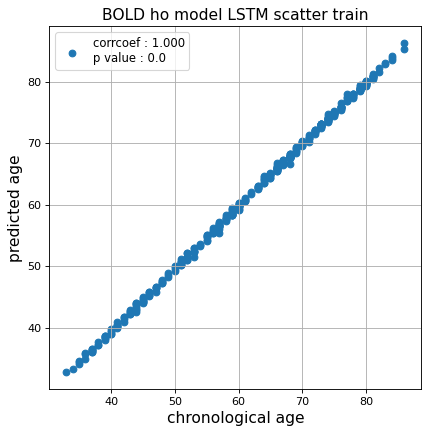

r^2 train data:  0.9988410833494541


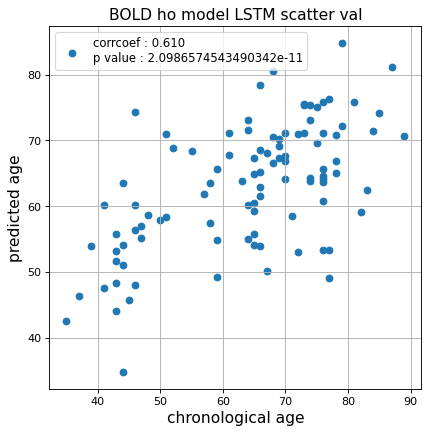

r^2 val data:  0.3574310450298942


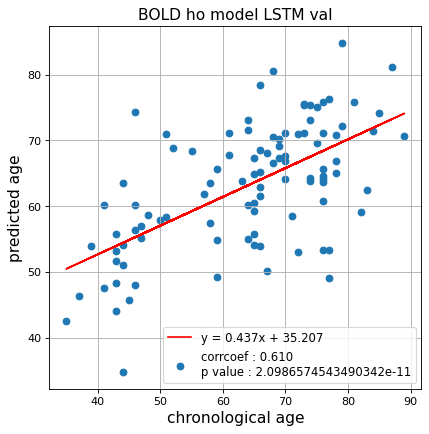

切片: 35.206660687943746
傾き: 0.43684206277788756
Kfold: 3 ::: epoch: 100, loss: 0.01419254016274443, val loss: 0.7861718833446503
Kfold: 3 ::: epoch: 200, loss: 0.009548537379417282, val loss: 0.7716465145349503
Kfold: 3 ::: epoch: 300, loss: 0.008118778861199435, val loss: 0.74471615254879
Kfold: 3 ::: epoch: 400, loss: 0.006088495218696503, val loss: 0.7384925782680511
Kfold: 3 ::: epoch: 500, loss: 0.006845413814657009, val loss: 0.7115325480699539
Kfold: 3 ::: epoch: 600, loss: 0.003790634361883769, val loss: 0.7055271118879318
Kfold: 3 ::: epoch: 700, loss: 0.0037461181816000203, val loss: 0.6763575524091721
Kfold: 3 ::: epoch: 800, loss: 0.0035149426772617376, val loss: 0.6979990005493164
Kfold: 3 ::: epoch: 900, loss: 0.004234764456319122, val loss: 0.6712275594472885
Kfold: 3 ::: epoch: 1000, loss: 0.0037286425224290444, val loss: 0.6688947081565857
save_epochs:986
best val loss:0.6583694964647293


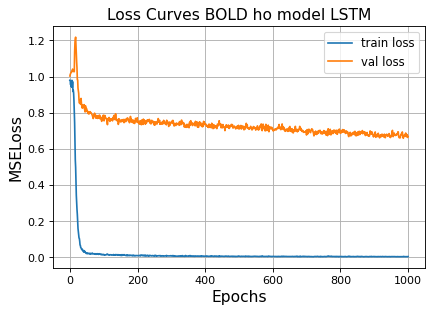

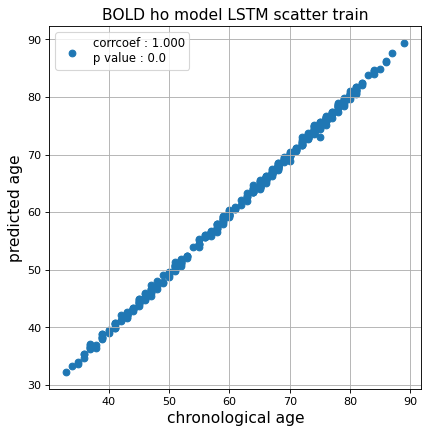

r^2 train data:  0.9981766597293054


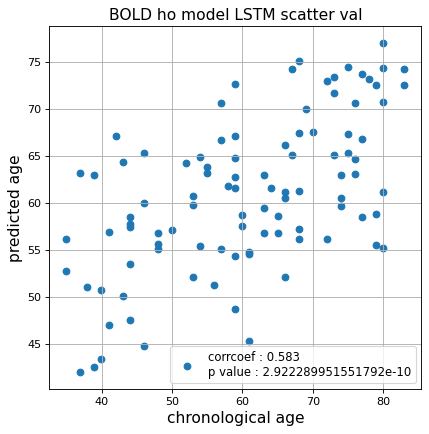

r^2 val data:  0.33936625391948827


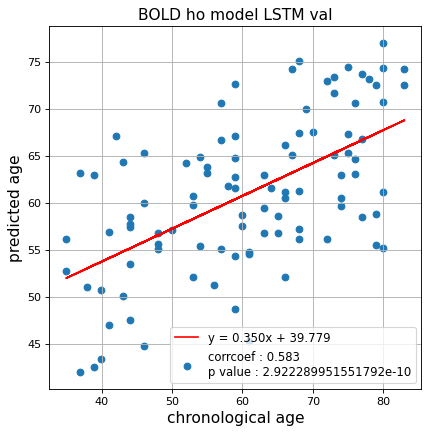

切片: 39.778816142351715
傾き: 0.34952389322100064
Kfold: 4 ::: epoch: 100, loss: 0.012807685308731519, val loss: 1.2492130100727081
Kfold: 4 ::: epoch: 200, loss: 0.01019103921806583, val loss: 1.0820442140102386
Kfold: 4 ::: epoch: 300, loss: 0.006549706467642234, val loss: 0.9753239899873734
Kfold: 4 ::: epoch: 400, loss: 0.0061072441391073744, val loss: 0.9213011562824249
Kfold: 4 ::: epoch: 500, loss: 0.005215564044192433, val loss: 0.8643446117639542
Kfold: 4 ::: epoch: 600, loss: 0.0055610309713161905, val loss: 0.8436872214078903
Kfold: 4 ::: epoch: 700, loss: 0.0037469165936972085, val loss: 0.8127664923667908
Kfold: 4 ::: epoch: 800, loss: 0.00308355875313282, val loss: 0.7792609333992004
Kfold: 4 ::: epoch: 900, loss: 0.0033931560599460052, val loss: 0.760764017701149
Kfold: 4 ::: epoch: 1000, loss: 0.00288581487033158, val loss: 0.7633156329393387
save_epochs:981
best val loss:0.7414520829916


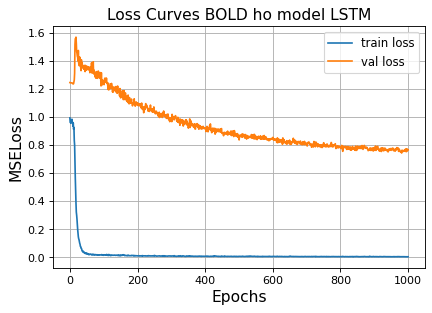

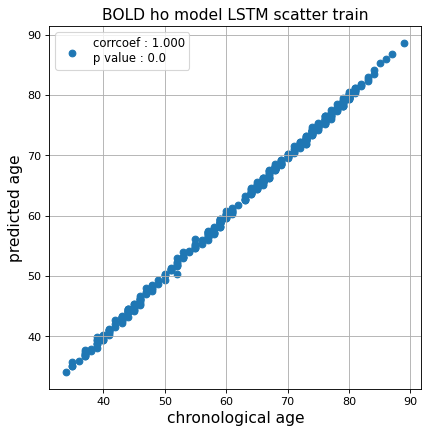

r^2 train data:  0.9990373964359037


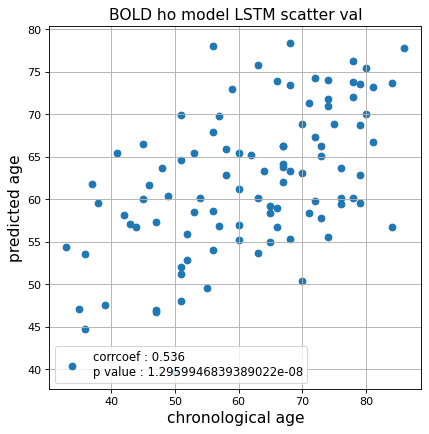

r^2 val data:  0.27881089486110466


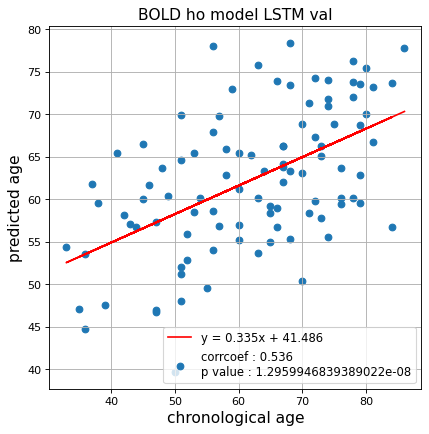

切片: 41.48620457219924
傾き: 0.33527655438503584
Kfold: 5 ::: epoch: 100, loss: 0.014487061004799146, val loss: 0.6852810904383659
Kfold: 5 ::: epoch: 200, loss: 0.008083240881275672, val loss: 0.6679605841636658
Kfold: 5 ::: epoch: 300, loss: 0.007522431023132343, val loss: 0.659269243478775
Kfold: 5 ::: epoch: 400, loss: 0.007413932802872016, val loss: 0.6353034153580666
Kfold: 5 ::: epoch: 500, loss: 0.004018834577156947, val loss: 0.6702645942568779
Kfold: 5 ::: epoch: 600, loss: 0.00408931400698538, val loss: 0.664771243929863
early stopping
save_epochs:400
best val loss:0.6353034153580666


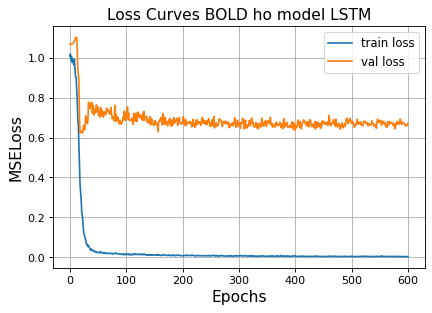

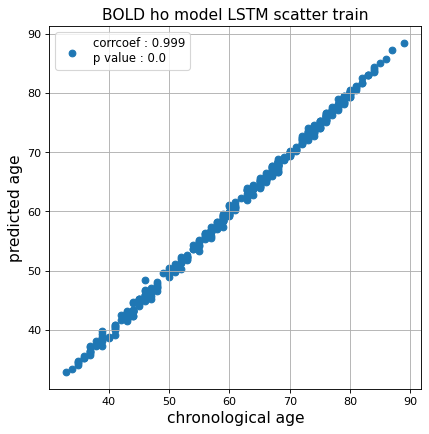

r^2 train data:  0.9980754244638053


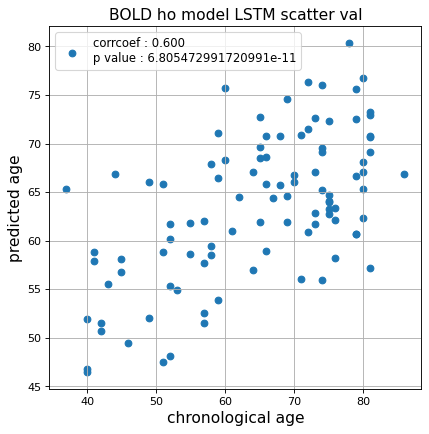

r^2 val data:  0.3510400178610569


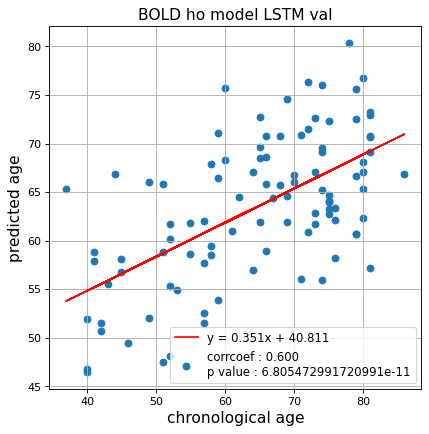

切片: 40.810697067803005
傾き: 0.3506719242401872
Nested Kfold ::: 3
Kfold: 1 ::: epoch: 100, loss: 0.025591652553815108, val loss: 0.7797632329165936
Kfold: 1 ::: epoch: 200, loss: 0.011434713378548622, val loss: 0.7135459817945957
Kfold: 1 ::: epoch: 300, loss: 0.009021454025059938, val loss: 0.6717611607164145
Kfold: 1 ::: epoch: 400, loss: 0.007508285164546508, val loss: 0.6552933119237423
Kfold: 1 ::: epoch: 500, loss: 0.005713970436213108, val loss: 0.6473815347999334
Kfold: 1 ::: epoch: 600, loss: 0.004576941468538, val loss: 0.6278469637036324
Kfold: 1 ::: epoch: 700, loss: 0.005674979631574108, val loss: 0.6198069900274277
Kfold: 1 ::: epoch: 800, loss: 0.004104588521071351, val loss: 0.6252418756484985
Kfold: 1 ::: epoch: 900, loss: 0.003072356035073216, val loss: 0.6234790980815887
Kfold: 1 ::: epoch: 1000, loss: 0.00374810856122237, val loss: 0.6124519407749176
save_epochs:903
best val loss:0.6036355011165142


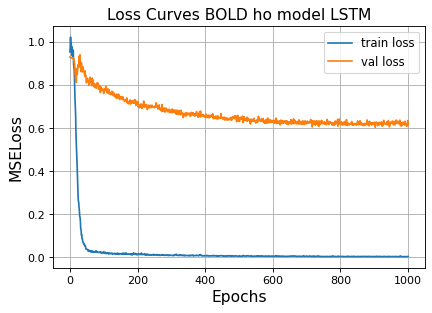

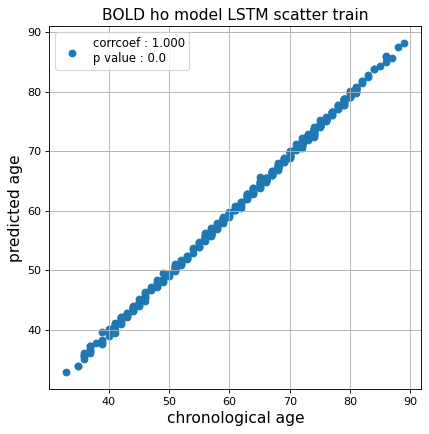

r^2 train data:  0.9974182771882387


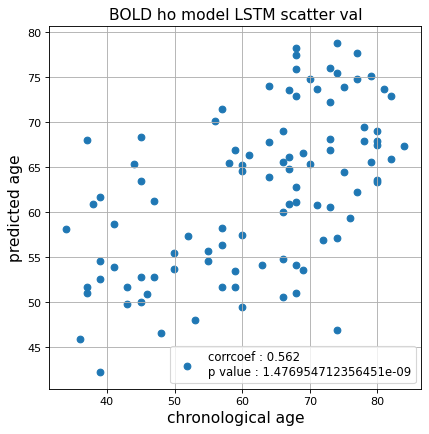

r^2 val data:  0.30800433066943045


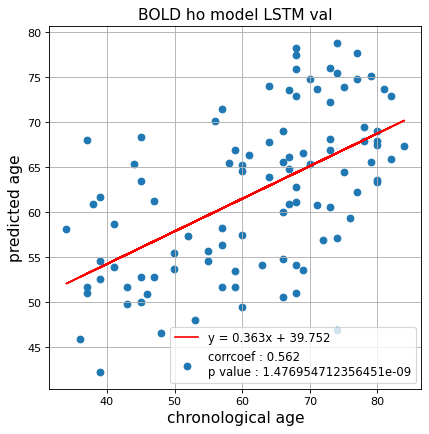

切片: 39.751986416421246
傾き: 0.3625984595546313
Kfold: 2 ::: epoch: 100, loss: 0.014559358716584168, val loss: 0.7078647292219102
Kfold: 2 ::: epoch: 200, loss: 0.007254583223794515, val loss: 0.6531626433134079
Kfold: 2 ::: epoch: 300, loss: 0.00894738259152151, val loss: 0.6425896994769573
Kfold: 2 ::: epoch: 400, loss: 0.004650671178331742, val loss: 0.6659809127449989
Kfold: 2 ::: epoch: 500, loss: 0.003853600525941986, val loss: 0.6692322120070457
Kfold: 2 ::: epoch: 600, loss: 0.005199648618984681, val loss: 0.6678759902715683
early stopping
save_epochs:409
best val loss:0.63944261521101


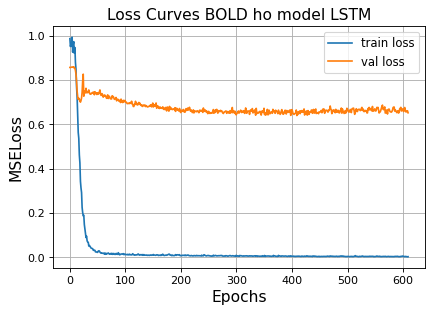

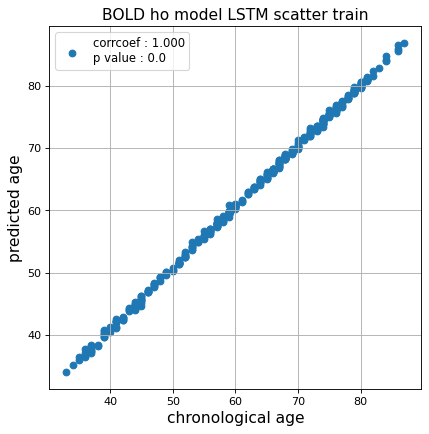

r^2 train data:  0.9971867448576268


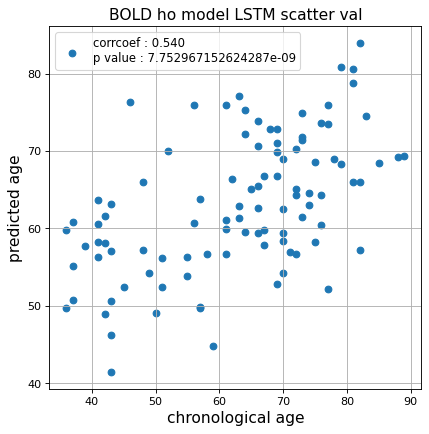

r^2 val data:  0.28364474506012494


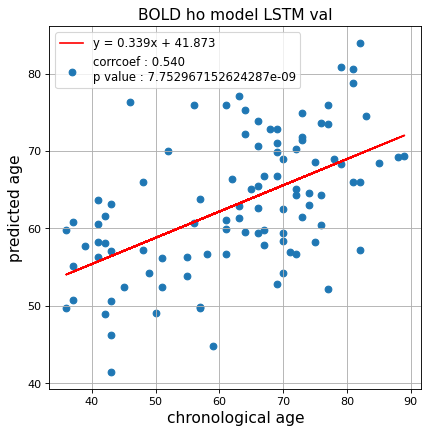

切片: 41.87321686415778
傾き: 0.3385871235157784
Kfold: 3 ::: epoch: 100, loss: 0.010872622629484305, val loss: 0.9897352457046509
Kfold: 3 ::: epoch: 200, loss: 0.006922413845761464, val loss: 0.882628545165062
Kfold: 3 ::: epoch: 300, loss: 0.0048284824901761916, val loss: 0.8665658980607986
Kfold: 3 ::: epoch: 400, loss: 0.0038964727517360677, val loss: 0.8799856156110764
Kfold: 3 ::: epoch: 500, loss: 0.00505116035660299, val loss: 0.8391571044921875
Kfold: 3 ::: epoch: 600, loss: 0.002832334040879057, val loss: 0.8396774381399155
Kfold: 3 ::: epoch: 700, loss: 0.0027365871937945485, val loss: 0.8247046321630478
Kfold: 3 ::: epoch: 800, loss: 0.002649215703758483, val loss: 0.8027855008840561
Kfold: 3 ::: epoch: 900, loss: 0.00258373178075999, val loss: 0.7939080148935318
Kfold: 3 ::: epoch: 1000, loss: 0.002061884903993744, val loss: 0.7693685442209244
save_epochs:976
best val loss:0.7419563084840775


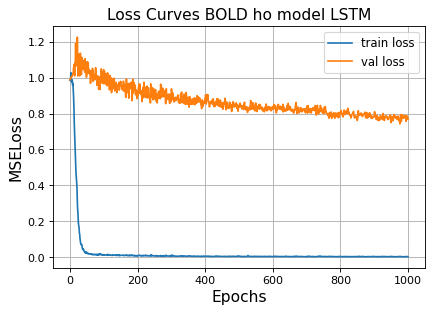

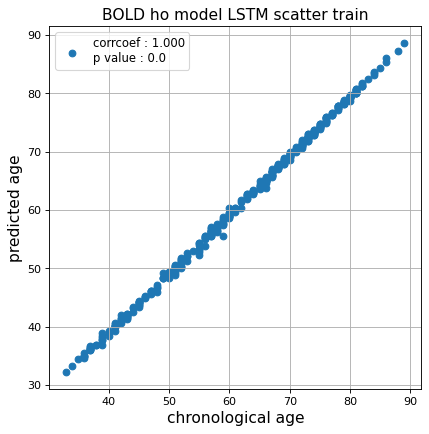

r^2 train data:  0.9956971241285243


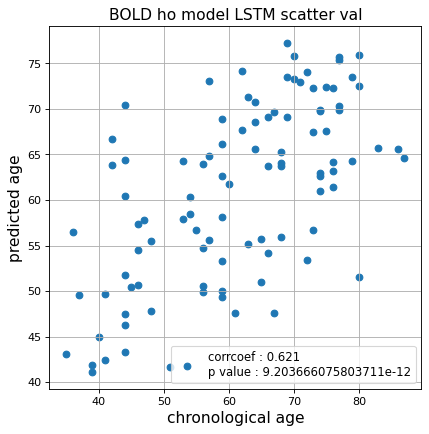

r^2 val data:  0.3722241905038578


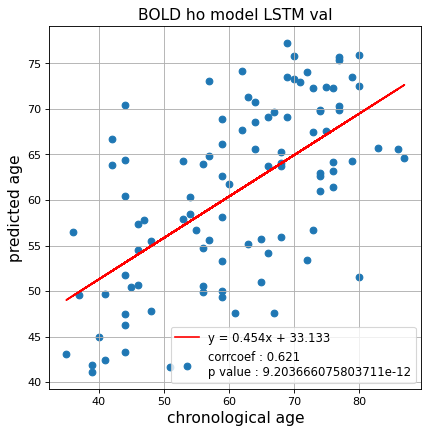

切片: 33.1333233896308
傾き: 0.45405046056956866
Kfold: 4 ::: epoch: 100, loss: 0.013487883771841343, val loss: 0.8959527015686035
Kfold: 4 ::: epoch: 200, loss: 0.009701721835881472, val loss: 0.8405340611934662
Kfold: 4 ::: epoch: 300, loss: 0.007725062386061137, val loss: 0.7853423804044724
Kfold: 4 ::: epoch: 400, loss: 0.006643008189992263, val loss: 0.7516728490591049
Kfold: 4 ::: epoch: 500, loss: 0.004373813952462604, val loss: 0.7548710107803345
Kfold: 4 ::: epoch: 600, loss: 0.004107304651720019, val loss: 0.7518434971570969
Kfold: 4 ::: epoch: 700, loss: 0.002829360954750043, val loss: 0.7521812915802002
Kfold: 4 ::: epoch: 800, loss: 0.0028252405329392506, val loss: 0.7457484751939774
early stopping
save_epochs:662
best val loss:0.7230405211448669


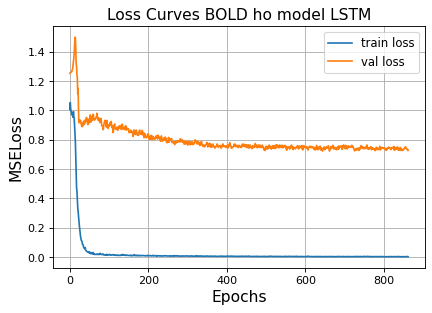

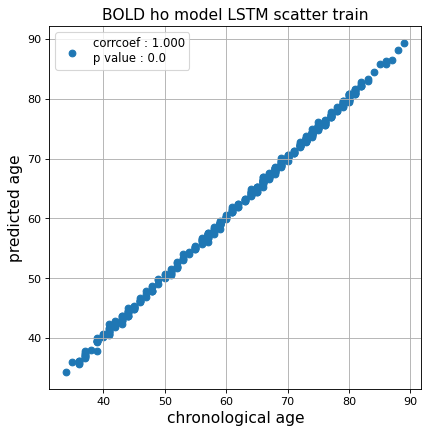

r^2 train data:  0.9991463709277956


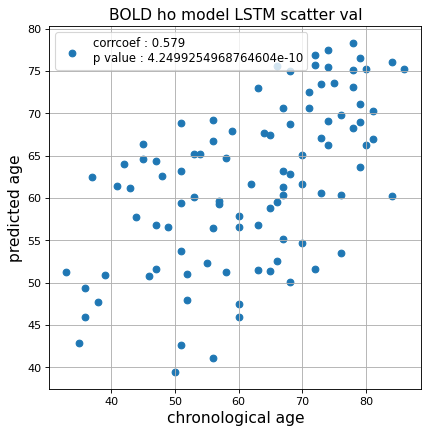

r^2 val data:  0.3177769086856448


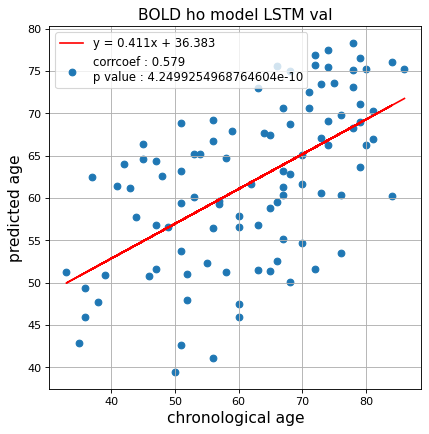

切片: 36.38288558421799
傾き: 0.41132090783643127
Kfold: 5 ::: epoch: 100, loss: 0.011780413727347668, val loss: 1.0597817152738571
Kfold: 5 ::: epoch: 200, loss: 0.009224021914773263, val loss: 0.9778948128223419
Kfold: 5 ::: epoch: 300, loss: 0.006388421242053692, val loss: 0.9391734302043915
Kfold: 5 ::: epoch: 400, loss: 0.004702450385173926, val loss: 0.9061132669448853
Kfold: 5 ::: epoch: 500, loss: 0.005592943581107717, val loss: 0.8658941984176636
Kfold: 5 ::: epoch: 600, loss: 0.003085936401755764, val loss: 0.8419268578290939
Kfold: 5 ::: epoch: 700, loss: 0.006353601858091469, val loss: 0.8346830159425735
Kfold: 5 ::: epoch: 800, loss: 0.002709105288466582, val loss: 0.8084829300642014
Kfold: 5 ::: epoch: 900, loss: 0.0035212104960989496, val loss: 0.7907005697488785
Kfold: 5 ::: epoch: 1000, loss: 0.0029864465423788014, val loss: 0.7811356335878372
save_epochs:891
best val loss:0.775776207447052


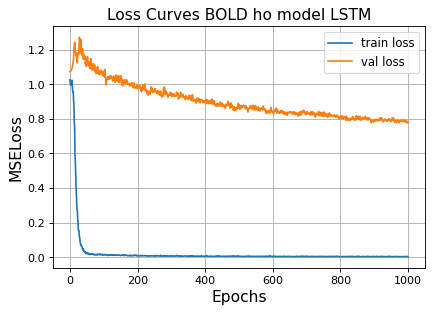

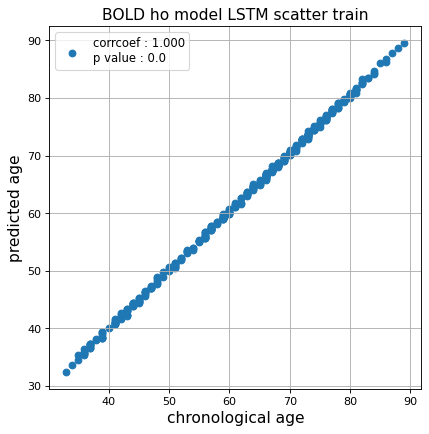

r^2 train data:  0.9985493151076258


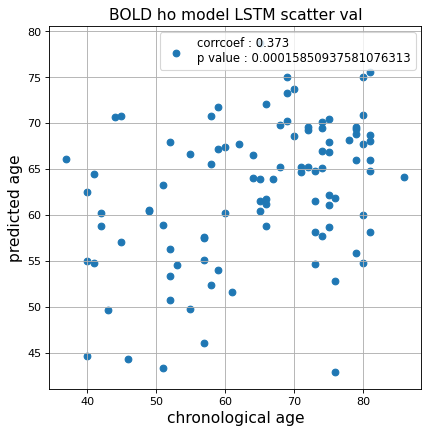

r^2 val data:  0.06165647844625022


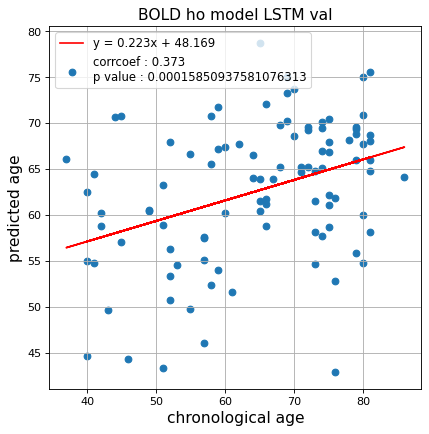

切片: 48.169209201864106
傾き: 0.22340277307124318
Nested Kfold ::: 4
Kfold: 1 ::: epoch: 100, loss: 0.02221436669620184, val loss: 0.8121602237224579
Kfold: 1 ::: epoch: 200, loss: 0.015431197718358956, val loss: 0.7143143862485886
Kfold: 1 ::: epoch: 300, loss: 0.013160909454409894, val loss: 0.666314423084259
Kfold: 1 ::: epoch: 400, loss: 0.007354102885493865, val loss: 0.6335628442466259
Kfold: 1 ::: epoch: 500, loss: 0.006326439253126199, val loss: 0.6161550581455231
Kfold: 1 ::: epoch: 600, loss: 0.0055679918016092135, val loss: 0.6043473593890667
Kfold: 1 ::: epoch: 700, loss: 0.004757688389732861, val loss: 0.5838909596204758
Kfold: 1 ::: epoch: 800, loss: 0.004204079455051284, val loss: 0.5758903846144676
Kfold: 1 ::: epoch: 900, loss: 0.003809969245384519, val loss: 0.565761661157012
Kfold: 1 ::: epoch: 1000, loss: 0.003993726836947294, val loss: 0.5571975521743298
save_epochs:987
best val loss:0.5463246218860149


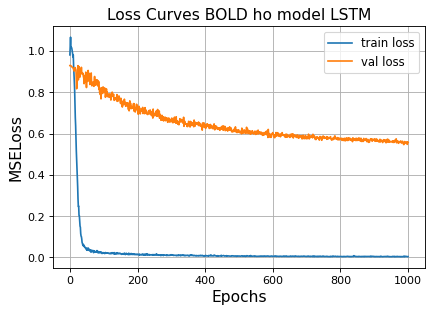

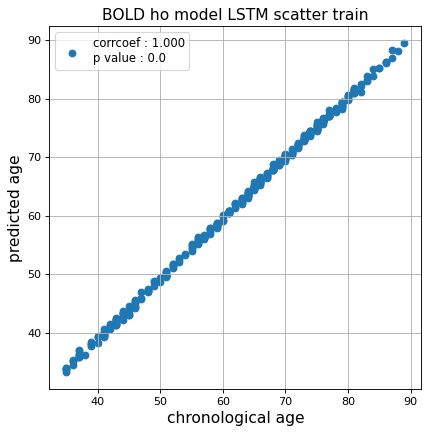

r^2 train data:  0.9975547941212984


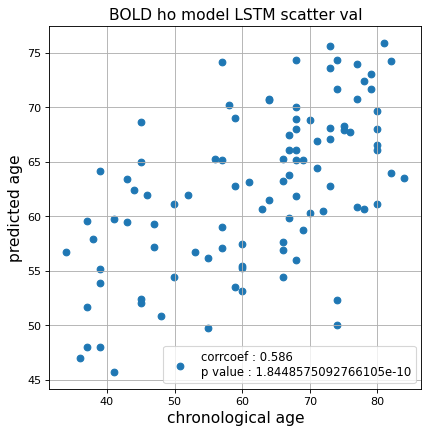

r^2 val data:  0.33914550774904406


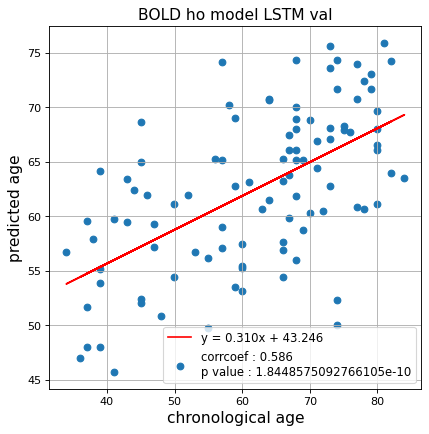

切片: 43.24556402456366
傾き: 0.3102732634742407
Kfold: 2 ::: epoch: 100, loss: 0.013089803692239981, val loss: 0.7031058296561241
Kfold: 2 ::: epoch: 200, loss: 0.00663626494889076, val loss: 0.6931012570858002
Kfold: 2 ::: epoch: 300, loss: 0.006702062100745165, val loss: 0.6997271925210953
Kfold: 2 ::: epoch: 400, loss: 0.0047079314334461326, val loss: 0.7164179235696793
early stopping
save_epochs:218
best val loss:0.6873039305210114


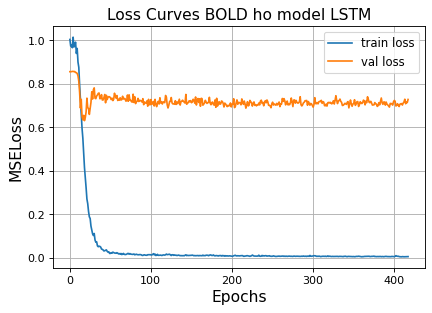

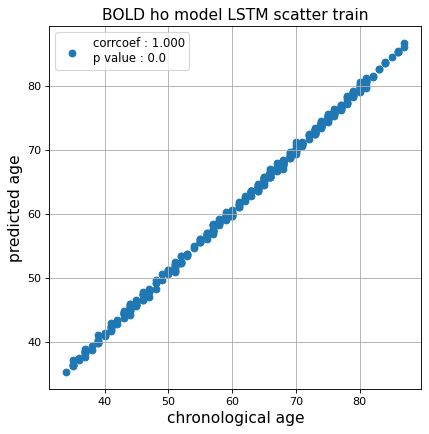

r^2 train data:  0.9968565621547869


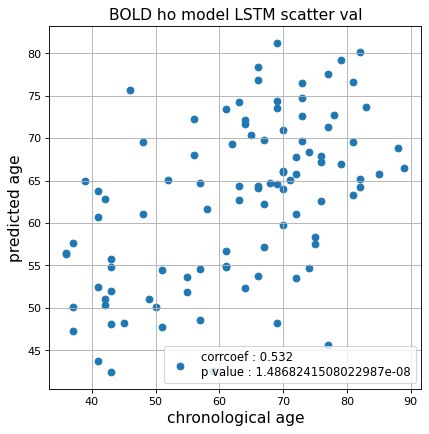

r^2 val data:  0.26126718710428976


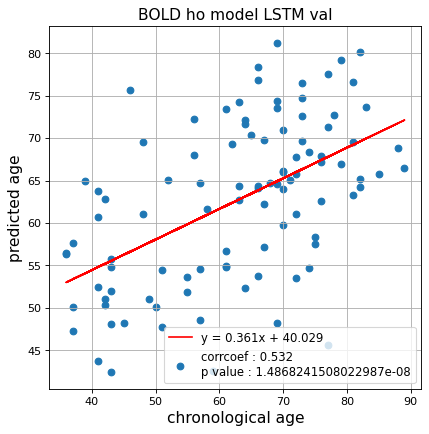

切片: 40.0291271221782
傾き: 0.3605842682990025
Kfold: 3 ::: epoch: 100, loss: 0.013354987013511933, val loss: 0.7448355779051781
Kfold: 3 ::: epoch: 200, loss: 0.009049462942549815, val loss: 0.7449912577867508
Kfold: 3 ::: epoch: 300, loss: 0.006870531853145132, val loss: 0.7567383199930191
Kfold: 3 ::: epoch: 400, loss: 0.006625985117772451, val loss: 0.7250934988260269
early stopping
save_epochs:286
best val loss:0.6847323104739189


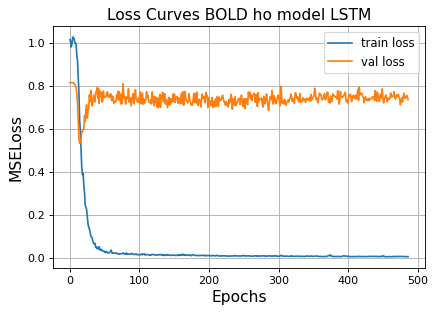

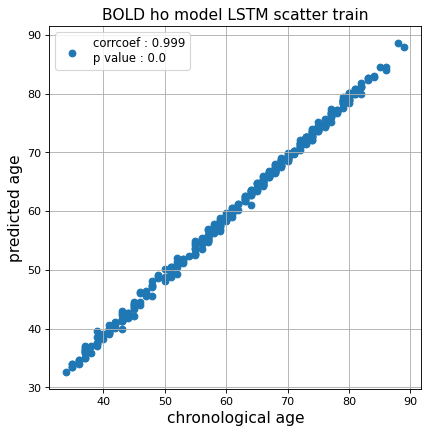

r^2 train data:  0.9928840464901156


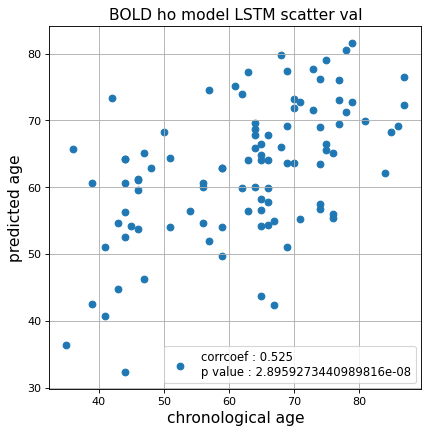

r^2 val data:  0.21826430288527465


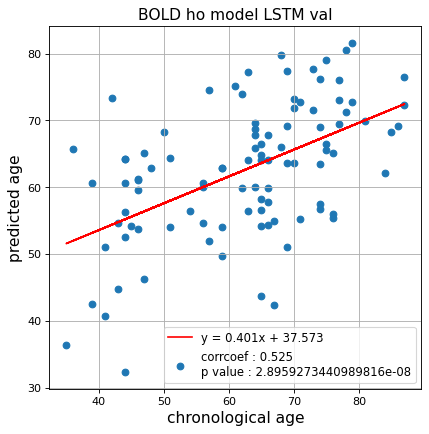

切片: 37.57291244478748
傾き: 0.40080642823914353
Kfold: 4 ::: epoch: 100, loss: 0.017270864847187813, val loss: 1.1748044937849045
Kfold: 4 ::: epoch: 200, loss: 0.010478642088576006, val loss: 1.082262858748436
Kfold: 4 ::: epoch: 300, loss: 0.009078200297573438, val loss: 1.0117137432098389
Kfold: 4 ::: epoch: 400, loss: 0.006937243474217562, val loss: 0.9516899287700653
Kfold: 4 ::: epoch: 500, loss: 0.005749108413091073, val loss: 0.9279865473508835
Kfold: 4 ::: epoch: 600, loss: 0.004026472747612458, val loss: 0.9034822285175323
Kfold: 4 ::: epoch: 700, loss: 0.003829668992413924, val loss: 0.8646667748689651
Kfold: 4 ::: epoch: 800, loss: 0.0034025518420653846, val loss: 0.8248126953840256
Kfold: 4 ::: epoch: 900, loss: 0.0028195716798878633, val loss: 0.8127527087926865
Kfold: 4 ::: epoch: 1000, loss: 0.00288789129207054, val loss: 0.7900210618972778
save_epochs:958
best val loss:0.7832520306110382


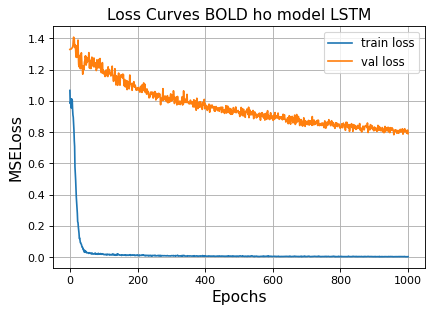

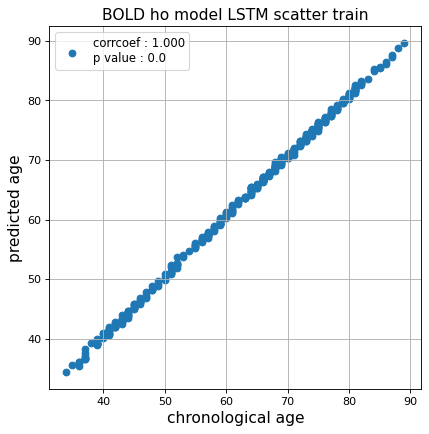

r^2 train data:  0.9969725934828172


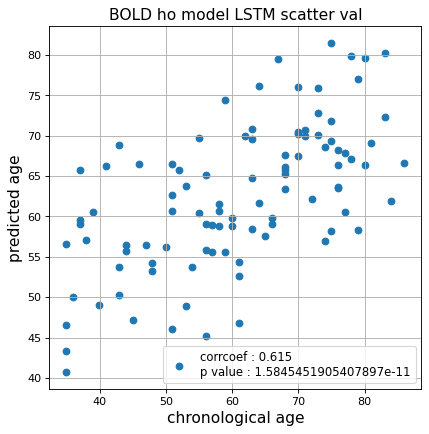

r^2 val data:  0.3627032974643448


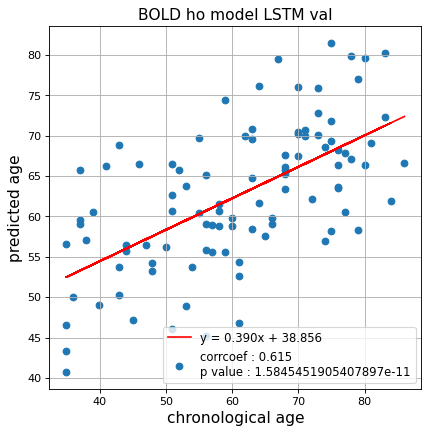

切片: 38.855525187746046
傾き: 0.3896253759652472
Kfold: 5 ::: epoch: 100, loss: 0.03143297923872104, val loss: 0.8944921940565109
Kfold: 5 ::: epoch: 200, loss: 0.014441771862598566, val loss: 0.844818577170372
Kfold: 5 ::: epoch: 300, loss: 0.010421651558807263, val loss: 0.8306933492422104
Kfold: 5 ::: epoch: 400, loss: 0.008432499956912719, val loss: 0.8024531155824661
Kfold: 5 ::: epoch: 500, loss: 0.007193441180369029, val loss: 0.7860763967037201
Kfold: 5 ::: epoch: 600, loss: 0.005184630558897669, val loss: 0.7658712714910507
Kfold: 5 ::: epoch: 700, loss: 0.004895884704847748, val loss: 0.7504976093769073
Kfold: 5 ::: epoch: 800, loss: 0.004303272598637984, val loss: 0.746129497885704
Kfold: 5 ::: epoch: 900, loss: 0.00392531524770535, val loss: 0.7469057589769363
Kfold: 5 ::: epoch: 1000, loss: 0.003400314527635391, val loss: 0.7307372838258743
save_epochs:977
best val loss:0.716409370303154


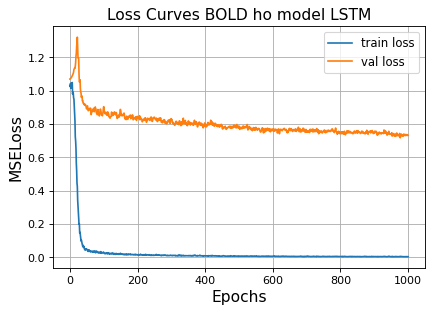

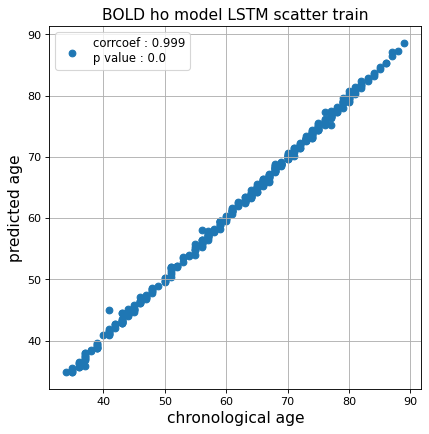

r^2 train data:  0.9986391607008404


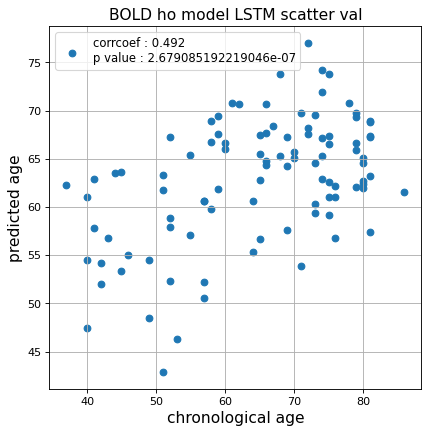

r^2 val data:  0.2206233974373505


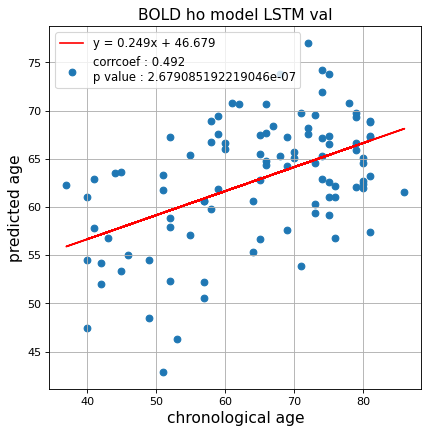

切片: 46.679223597172836
傾き: 0.24922877599019547
Nested Kfold ::: 5
Kfold: 1 ::: epoch: 100, loss: 0.020115250148452245, val loss: 0.7113256379961967
Kfold: 1 ::: epoch: 200, loss: 0.012739553904304137, val loss: 0.6349406316876411
Kfold: 1 ::: epoch: 300, loss: 0.008531010960443662, val loss: 0.5935940779745579
Kfold: 1 ::: epoch: 400, loss: 0.006475007448058862, val loss: 0.5744672697037458
Kfold: 1 ::: epoch: 500, loss: 0.00611792286284841, val loss: 0.5600031986832619
Kfold: 1 ::: epoch: 600, loss: 0.0036683829250530554, val loss: 0.5561012849211693
Kfold: 1 ::: epoch: 700, loss: 0.0034981200364060127, val loss: 0.535518130287528
Kfold: 1 ::: epoch: 800, loss: 0.0033359566989999553, val loss: 0.5313919894397259
Kfold: 1 ::: epoch: 900, loss: 0.004384879604913294, val loss: 0.5378616563975811
Kfold: 1 ::: epoch: 1000, loss: 0.0036414220141103635, val loss: 0.5263815335929394
save_epochs:998
best val loss:0.5192277282476425


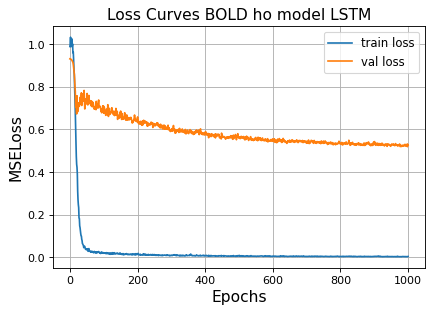

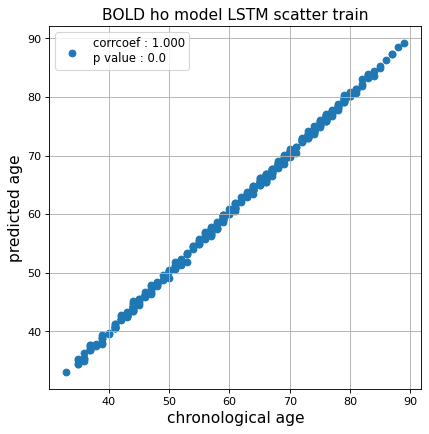

r^2 train data:  0.9986308179817842


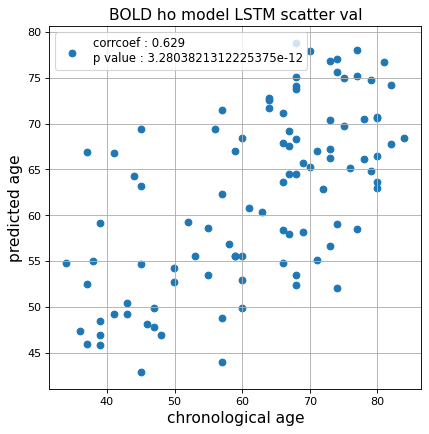

r^2 val data:  0.3911152282908388


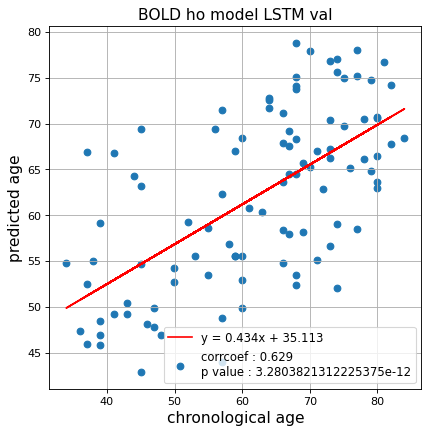

切片: 35.11306753277182
傾き: 0.434454475913987
Kfold: 2 ::: epoch: 100, loss: 0.013409120317261953, val loss: 0.6508625000715256
Kfold: 2 ::: epoch: 200, loss: 0.00663243757131008, val loss: 0.6265367716550827
Kfold: 2 ::: epoch: 300, loss: 0.006737941374572424, val loss: 0.6203490123152733
Kfold: 2 ::: epoch: 400, loss: 0.004793673180616819, val loss: 0.6091972887516022
Kfold: 2 ::: epoch: 500, loss: 0.0037760503249816024, val loss: 0.6086702197790146
Kfold: 2 ::: epoch: 600, loss: 0.0034004497395541807, val loss: 0.6031728088855743
Kfold: 2 ::: epoch: 700, loss: 0.004126732658523207, val loss: 0.5960425287485123
Kfold: 2 ::: epoch: 800, loss: 0.004683408348892744, val loss: 0.615058496594429
Kfold: 2 ::: epoch: 900, loss: 0.0020369646730474555, val loss: 0.574867270886898
Kfold: 2 ::: epoch: 1000, loss: 0.0032003826121441447, val loss: 0.5754866003990173
save_epochs:994
best val loss:0.5638992115855217


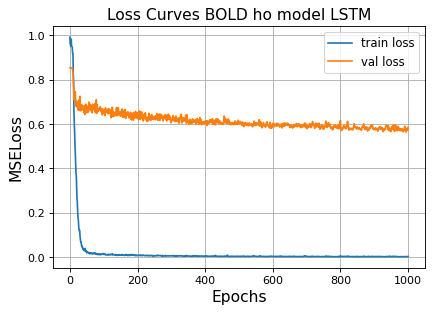

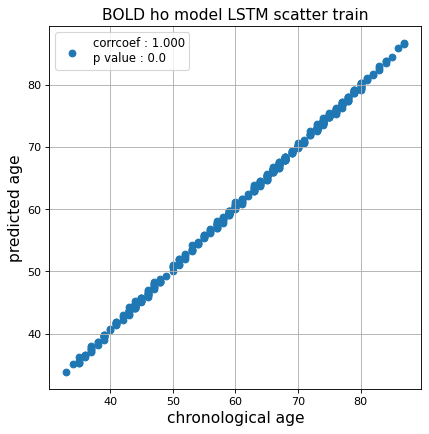

r^2 train data:  0.9987918958327355


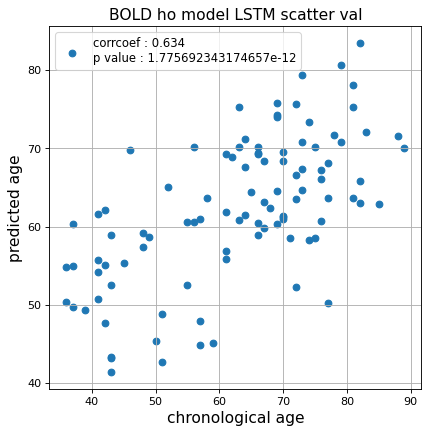

r^2 val data:  0.4009332730850248


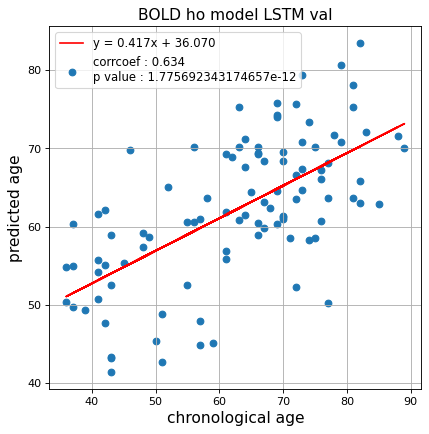

切片: 36.069847636730515
傾き: 0.4166256396880045
Kfold: 3 ::: epoch: 100, loss: 0.013453381709181346, val loss: 0.6800706908106804
Kfold: 3 ::: epoch: 200, loss: 0.008272073840579161, val loss: 0.6855388879776001
Kfold: 3 ::: epoch: 300, loss: 0.007101042840916377, val loss: 0.6621827334165573
Kfold: 3 ::: epoch: 400, loss: 0.007682893890887499, val loss: 0.6509176194667816
Kfold: 3 ::: epoch: 500, loss: 0.004744310899136158, val loss: 0.6556773632764816
Kfold: 3 ::: epoch: 600, loss: 0.004190594495202486, val loss: 0.6434705704450607
Kfold: 3 ::: epoch: 700, loss: 0.003913158210567557, val loss: 0.6376178413629532
Kfold: 3 ::: epoch: 800, loss: 0.004041446605697274, val loss: 0.6360894590616226
Kfold: 3 ::: epoch: 900, loss: 0.0030409263876768258, val loss: 0.636190801858902
Kfold: 3 ::: epoch: 1000, loss: 0.002761956931163485, val loss: 0.6531301140785217
save_epochs:958
best val loss:0.614948146045208


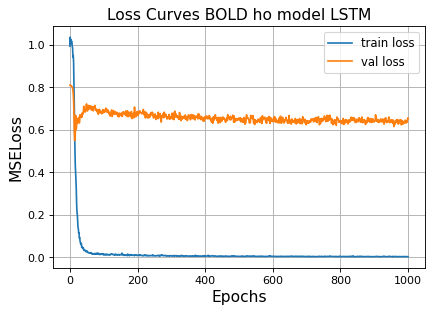

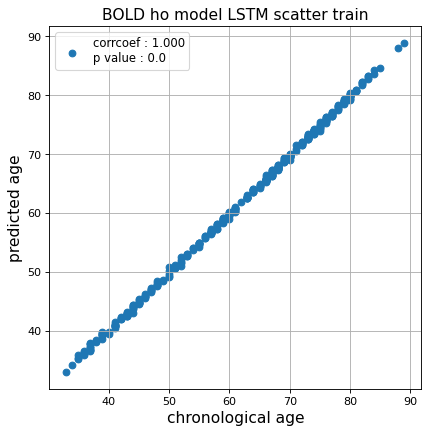

r^2 train data:  0.9993591903384724


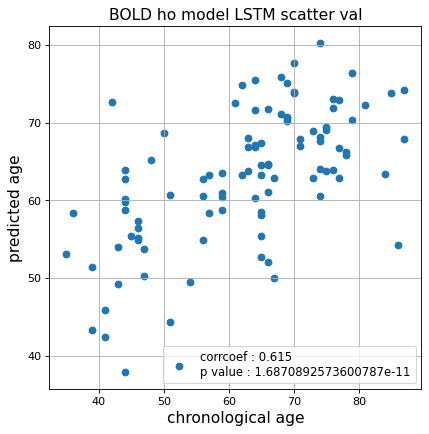

r^2 val data:  0.3730572077018942


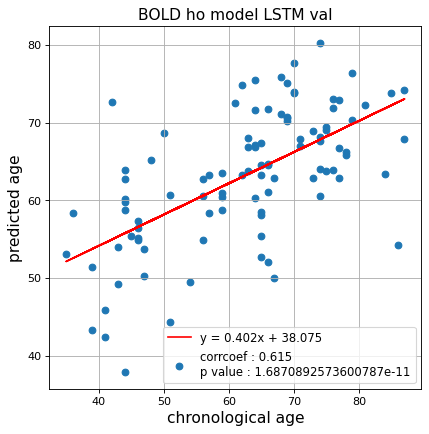

切片: 38.074998934010445
傾き: 0.4018398046324174
Kfold: 4 ::: epoch: 100, loss: 0.017295981470782023, val loss: 0.7165837362408638
Kfold: 4 ::: epoch: 200, loss: 0.012797760562254833, val loss: 0.6629327833652496
Kfold: 4 ::: epoch: 300, loss: 0.00679862298644506, val loss: 0.5994966104626656
Kfold: 4 ::: epoch: 400, loss: 0.007647813584368963, val loss: 0.5803647413849831
Kfold: 4 ::: epoch: 500, loss: 0.004689451754809572, val loss: 0.5505807101726532
Kfold: 4 ::: epoch: 600, loss: 0.004309715147918234, val loss: 0.5301371142268181
Kfold: 4 ::: epoch: 700, loss: 0.0033293771020208415, val loss: 0.5212778076529503
Kfold: 4 ::: epoch: 800, loss: 0.0032312572987463614, val loss: 0.5134391412138939
Kfold: 4 ::: epoch: 900, loss: 0.003417500097734424, val loss: 0.5089754834771156
Kfold: 4 ::: epoch: 1000, loss: 0.004472419359864524, val loss: 0.5198197588324547
save_epochs:994
best val loss:0.5000844448804855


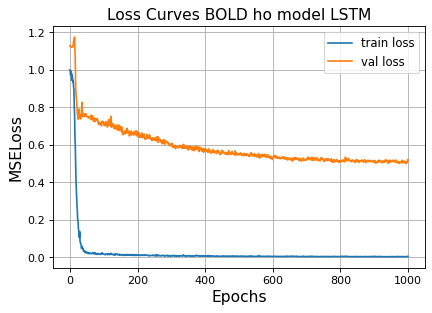

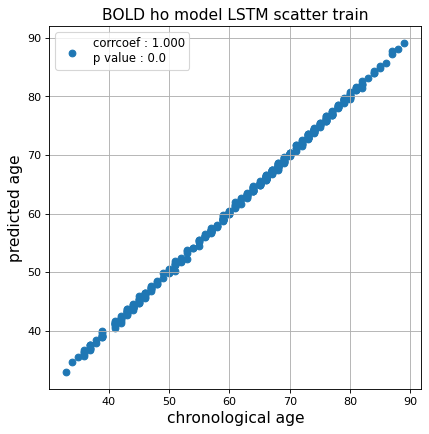

r^2 train data:  0.999342584355629


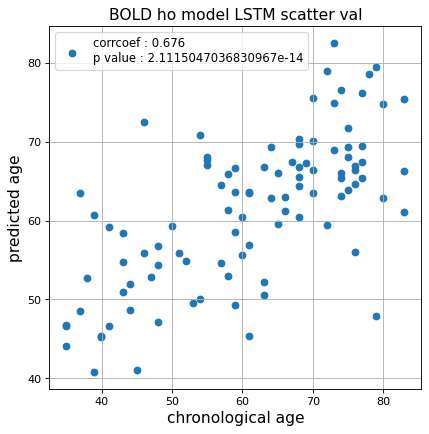

r^2 val data:  0.45662787526915694


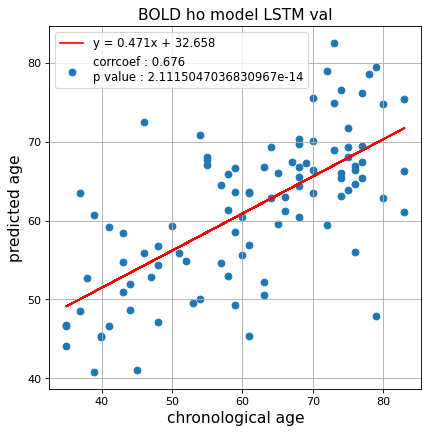

切片: 32.65839204936393
傾き: 0.47058007953673886
Kfold: 5 ::: epoch: 100, loss: 0.014645083664128413, val loss: 1.4135535806417465
Kfold: 5 ::: epoch: 200, loss: 0.008990514701089034, val loss: 1.2875005155801773
Kfold: 5 ::: epoch: 300, loss: 0.0066787718723599725, val loss: 1.2897905856370926
Kfold: 5 ::: epoch: 400, loss: 0.005249062767968728, val loss: 1.2709690481424332
Kfold: 5 ::: epoch: 500, loss: 0.0033612947445362806, val loss: 1.197018951177597
Kfold: 5 ::: epoch: 600, loss: 0.004463698553781097, val loss: 1.165697142481804
Kfold: 5 ::: epoch: 700, loss: 0.003193325157134006, val loss: 1.1514187902212143
Kfold: 5 ::: epoch: 800, loss: 0.0030863225871983627, val loss: 1.1019293665885925
Kfold: 5 ::: epoch: 900, loss: 0.003661829181230412, val loss: 1.0647889971733093
Kfold: 5 ::: epoch: 1000, loss: 0.002772328766206136, val loss: 1.0654993653297424
save_epochs:969
best val loss:1.038238912820816


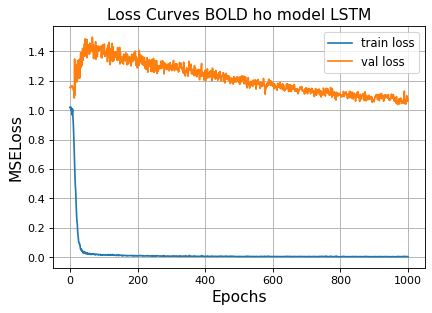

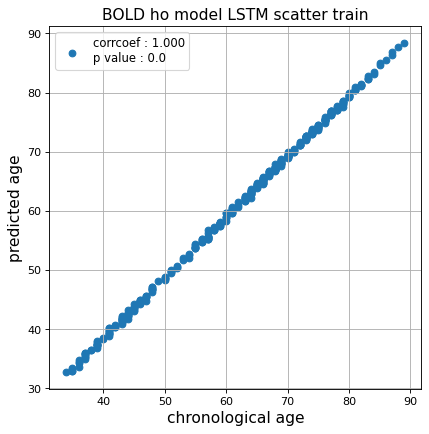

r^2 train data:  0.9939443303371878


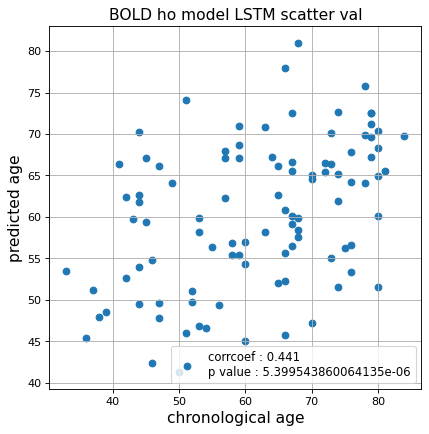

r^2 val data:  0.13137174109567917


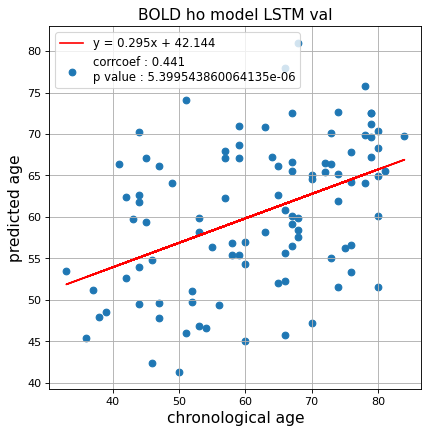

切片: 42.14423359392973
傾き: 0.2946838159771345
CPU times: user 1h 17min 23s, sys: 1min 34s, total: 1h 18min 58s
Wall time: 1h 19min 5s


In [22]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_ho_1  = []
test_pred_ho_corrected_1  = []
test_label_ho_1 = []
test_idx_ho_1   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_ho)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_ho,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1000,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 128,
                                                           num_layers = 2,
                                                           fc_drop = 0.1,
                                                           bidirectional = False,
                                                           title = 'ROI ho model LSTM'
                                                          )
    
    test_pred_ho_1.append(test_pred)
    test_pred_ho_corrected_1.append(test_pred_corrected)
    test_label_ho_1.append(test_label)
    test_idx_ho_1.append(test_idx)

### ROI 2

Nested Kfold ::: 1
Kfold: 1 ::: epoch: 100, loss: 0.017087779509333465, val loss: 0.7844646722078323
Kfold: 1 ::: epoch: 200, loss: 0.008635600536273649, val loss: 0.7086620181798935
Kfold: 1 ::: epoch: 300, loss: 0.009201087379971376, val loss: 0.661228597164154
Kfold: 1 ::: epoch: 400, loss: 0.00907796979523622, val loss: 0.61781095713377
Kfold: 1 ::: epoch: 500, loss: 0.0055960789681054075, val loss: 0.604255348443985
Kfold: 1 ::: epoch: 600, loss: 0.003903562525430551, val loss: 0.5957681015133858
Kfold: 1 ::: epoch: 700, loss: 0.0031294168259661933, val loss: 0.5777213275432587
Kfold: 1 ::: epoch: 800, loss: 0.002639660772939141, val loss: 0.5606012120842934
Kfold: 1 ::: epoch: 900, loss: 0.002908321222863518, val loss: 0.5570088475942612
Kfold: 1 ::: epoch: 1000, loss: 0.002349928970663593, val loss: 0.5457411929965019
save_epochs:997
best val loss:0.5386910438537598


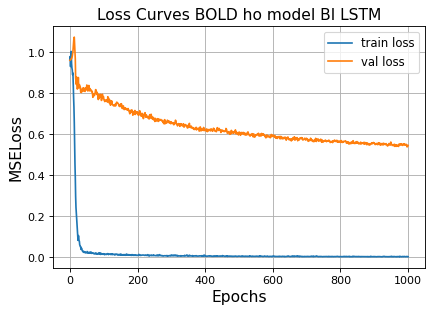

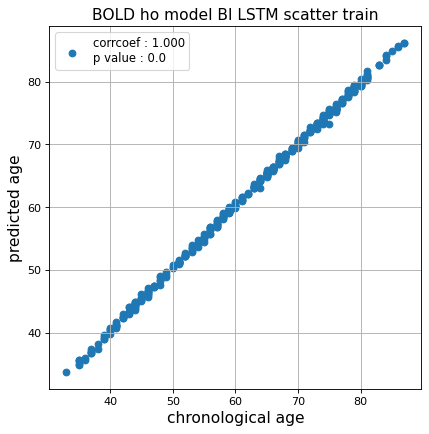

r^2 train data:  0.9988786847265129


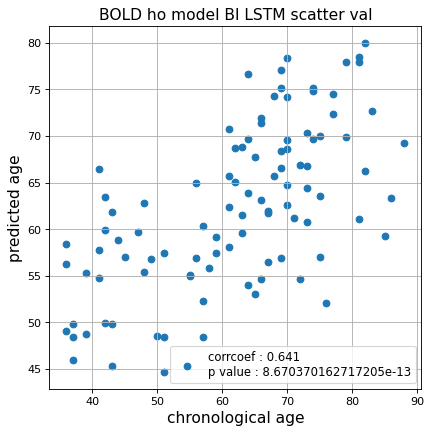

r^2 val data:  0.40985686004759114


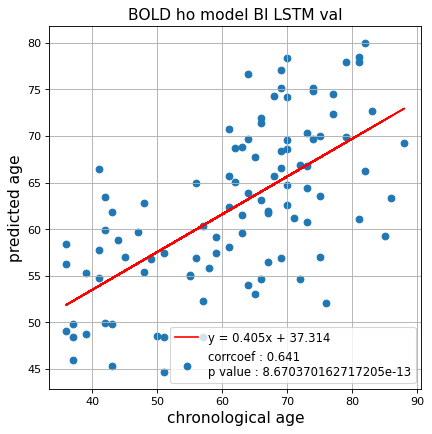

切片: 37.31426485811925
傾き: 0.40499649087847756
Kfold: 2 ::: epoch: 100, loss: 0.024004419907354392, val loss: 1.645404502749443
Kfold: 2 ::: epoch: 200, loss: 0.013836355163500859, val loss: 1.5375741571187973
Kfold: 2 ::: epoch: 300, loss: 0.009192908684221597, val loss: 1.4249464571475983
Kfold: 2 ::: epoch: 400, loss: 0.009200756832097586, val loss: 1.3734645545482635
Kfold: 2 ::: epoch: 500, loss: 0.007118982764390798, val loss: 1.3311070650815964
Kfold: 2 ::: epoch: 600, loss: 0.006296420648980599, val loss: 1.2786048352718353
Kfold: 2 ::: epoch: 700, loss: 0.0058633476997224186, val loss: 1.2390447109937668
Kfold: 2 ::: epoch: 800, loss: 0.004056597504621515, val loss: 1.2255386114120483
Kfold: 2 ::: epoch: 900, loss: 0.004212058686579649, val loss: 1.1910552680492401
Kfold: 2 ::: epoch: 1000, loss: 0.004156726788586149, val loss: 1.1712137758731842
save_epochs:997
best val loss:1.1669226735830307


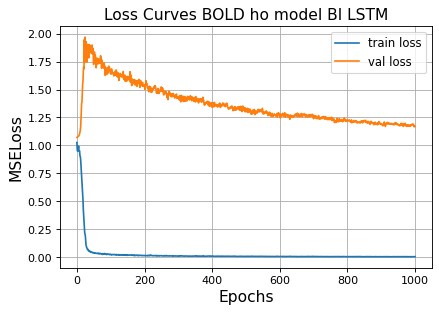

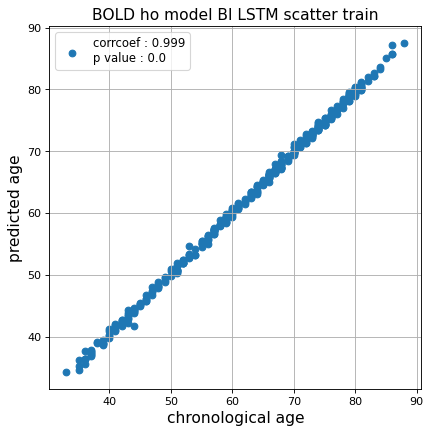

r^2 train data:  0.9985842937995112


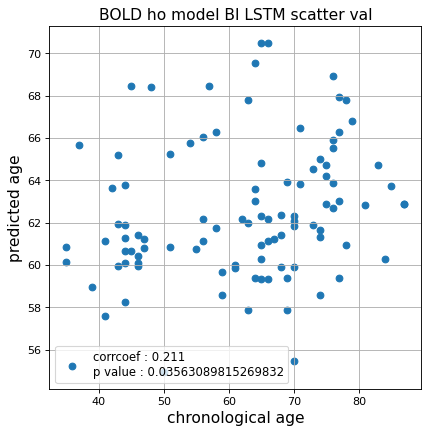

r^2 val data:  0.04320395733470894


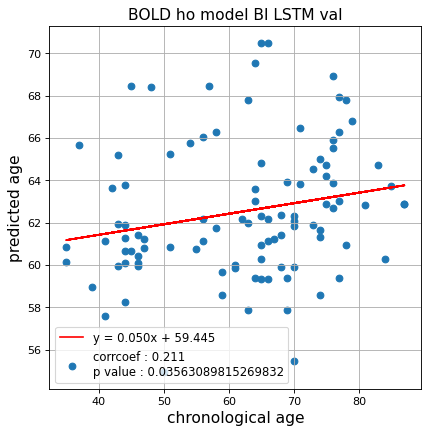

切片: 59.445163012681455
傾き: 0.049646229596569294
Kfold: 3 ::: epoch: 100, loss: 0.014498857064889027, val loss: 0.6937197670340538
Kfold: 3 ::: epoch: 200, loss: 0.00809659375450932, val loss: 0.6624816283583641
Kfold: 3 ::: epoch: 300, loss: 0.006769954316461315, val loss: 0.634529173374176
Kfold: 3 ::: epoch: 400, loss: 0.006096635837681019, val loss: 0.6038067415356636
Kfold: 3 ::: epoch: 500, loss: 0.004567293414416222, val loss: 0.5891161635518074
Kfold: 3 ::: epoch: 600, loss: 0.003402967838785396, val loss: 0.5827290266752243
Kfold: 3 ::: epoch: 700, loss: 0.0032277743672378934, val loss: 0.5659951120615005
Kfold: 3 ::: epoch: 800, loss: 0.003167435795498582, val loss: 0.5644580200314522
Kfold: 3 ::: epoch: 900, loss: 0.0027114872556502144, val loss: 0.5574380084872246
Kfold: 3 ::: epoch: 1000, loss: 0.002358516982684915, val loss: 0.5395824164152145
save_epochs:963
best val loss:0.5355940088629723


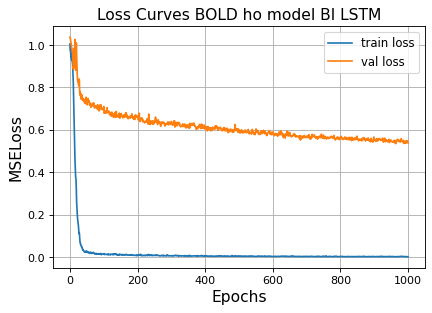

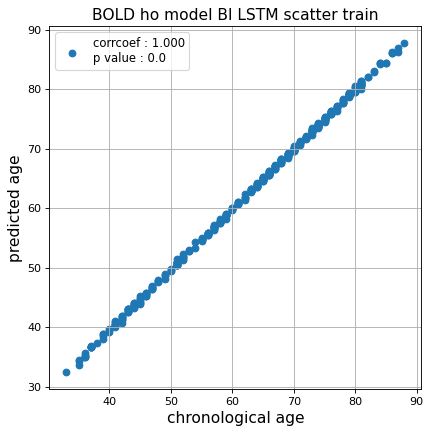

r^2 train data:  0.9993081121774403


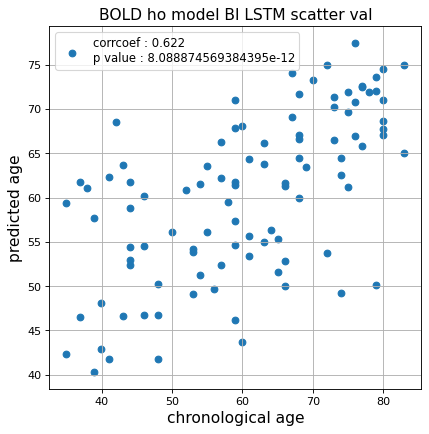

r^2 val data:  0.3825726053912054


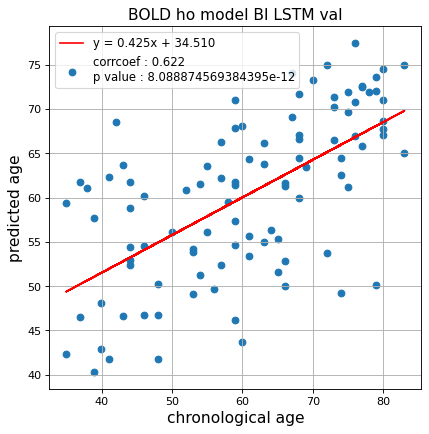

切片: 34.510368124779916
傾き: 0.42537410747889715
Kfold: 4 ::: epoch: 100, loss: 0.01684872734432037, val loss: 0.9617961347103119
Kfold: 4 ::: epoch: 200, loss: 0.010057988827331709, val loss: 0.9405013471841812
Kfold: 4 ::: epoch: 300, loss: 0.008142542380553026, val loss: 0.888398289680481
Kfold: 4 ::: epoch: 400, loss: 0.0050990256803253526, val loss: 0.9133142828941345
Kfold: 4 ::: epoch: 500, loss: 0.005090159561055211, val loss: 0.924766018986702
early stopping
save_epochs:300
best val loss:0.888398289680481


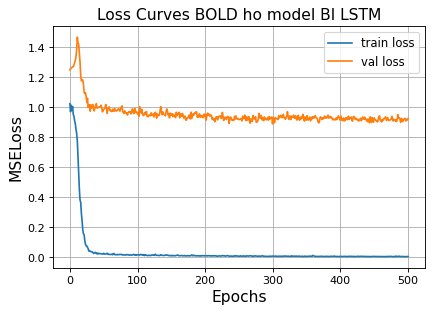

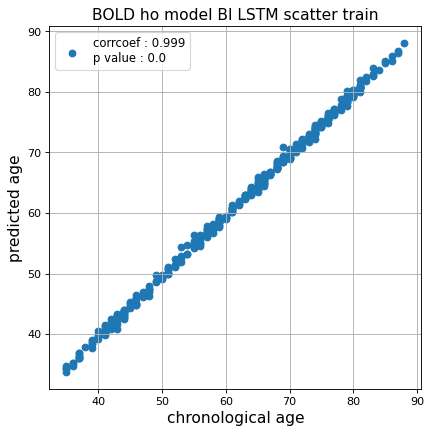

r^2 train data:  0.9978425968816419


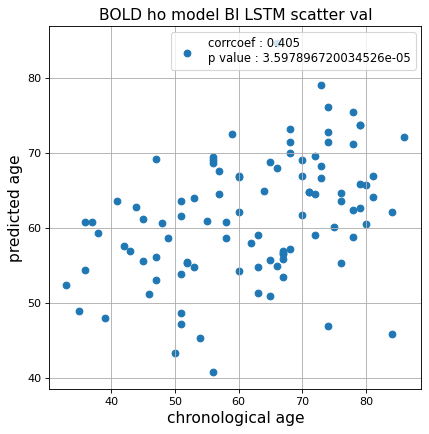

r^2 val data:  0.11493114806757565


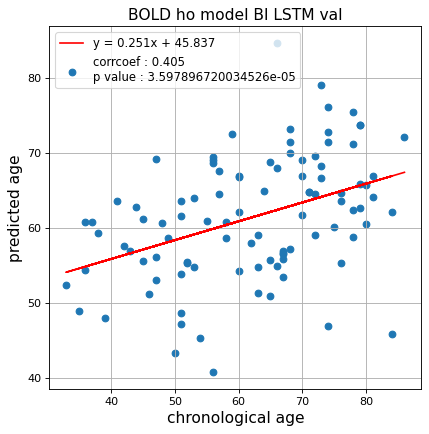

切片: 45.837229071327044
傾き: 0.25089446133237836
Kfold: 5 ::: epoch: 100, loss: 0.01727660924482804, val loss: 1.0702560395002365
Kfold: 5 ::: epoch: 200, loss: 0.010106079352016632, val loss: 1.0371398776769638
Kfold: 5 ::: epoch: 300, loss: 0.00805162308880916, val loss: 0.9758338034152985
Kfold: 5 ::: epoch: 400, loss: 0.004861087018910509, val loss: 0.9512116312980652
Kfold: 5 ::: epoch: 500, loss: 0.00586670668473324, val loss: 0.9298684448003769
Kfold: 5 ::: epoch: 600, loss: 0.0038782992901710365, val loss: 0.9253847897052765
Kfold: 5 ::: epoch: 700, loss: 0.0031990518954654154, val loss: 0.9083124995231628
Kfold: 5 ::: epoch: 800, loss: 0.003108388806979817, val loss: 0.9025121331214905
Kfold: 5 ::: epoch: 900, loss: 0.002258186604684362, val loss: 0.907312661409378
Kfold: 5 ::: epoch: 1000, loss: 0.0023453324997367766, val loss: 0.887827068567276
save_epochs:830
best val loss:0.8623000979423523


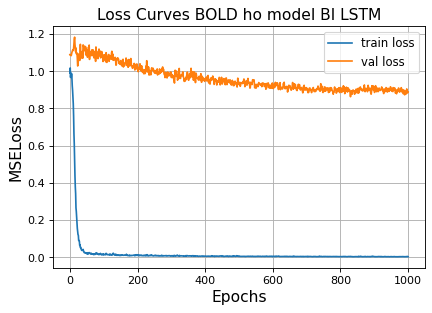

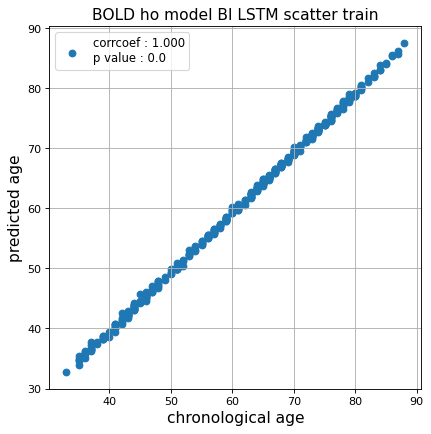

r^2 train data:  0.9966648079744748


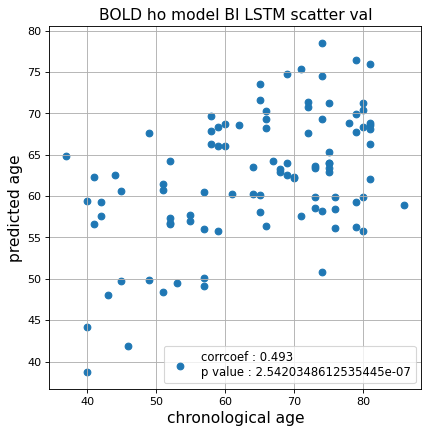

r^2 val data:  0.19884454985878475


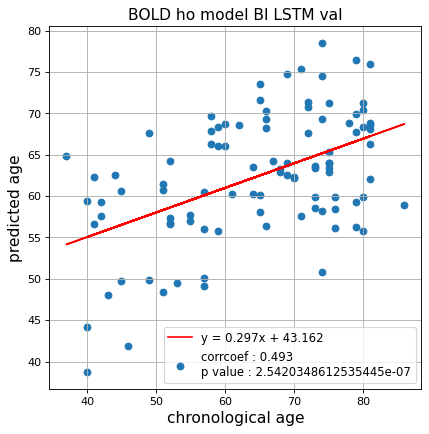

切片: 43.16162841703047
傾き: 0.2971742410135919
Nested Kfold ::: 2
Kfold: 1 ::: epoch: 100, loss: 0.017032554373145103, val loss: 0.7999216914176941
Kfold: 1 ::: epoch: 200, loss: 0.010760659781786112, val loss: 0.7826375216245651
Kfold: 1 ::: epoch: 300, loss: 0.008617548630214654, val loss: 0.7105534225702286
Kfold: 1 ::: epoch: 400, loss: 0.00894186574106033, val loss: 0.6817221194505692
Kfold: 1 ::: epoch: 500, loss: 0.006280276978101868, val loss: 0.650946818292141
Kfold: 1 ::: epoch: 600, loss: 0.0036506448120165328, val loss: 0.6488657742738724
Kfold: 1 ::: epoch: 700, loss: 0.003365718132744615, val loss: 0.6295656934380531
Kfold: 1 ::: epoch: 800, loss: 0.0028853110091474196, val loss: 0.620760902762413
Kfold: 1 ::: epoch: 900, loss: 0.002575452529037228, val loss: 0.6118838861584663
Kfold: 1 ::: epoch: 1000, loss: 0.0025126996199385477, val loss: 0.6016750931739807
save_epochs:988
best val loss:0.5836121290922165


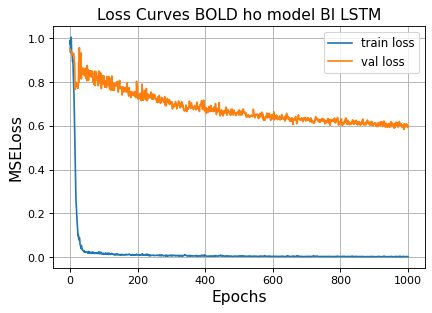

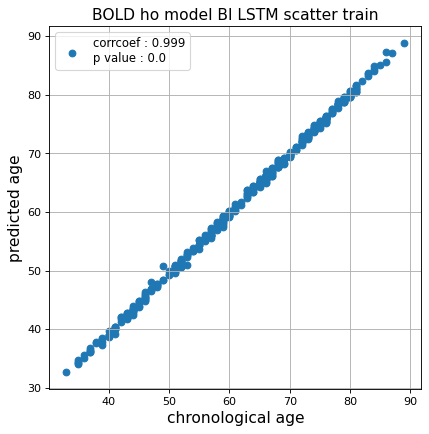

r^2 train data:  0.9981818753778603


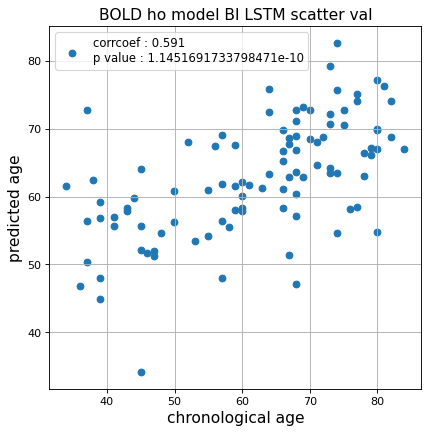

r^2 val data:  0.3458340725413862


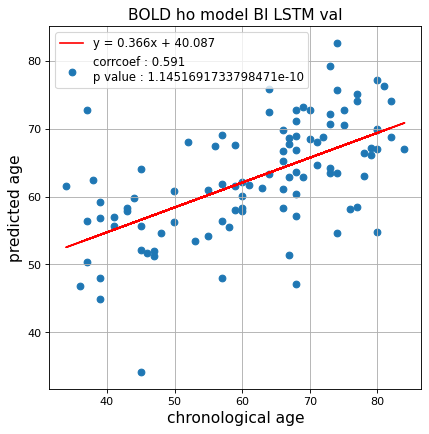

切片: 40.08727029808948
傾き: 0.366210748133619
Kfold: 2 ::: epoch: 100, loss: 0.0207805445131201, val loss: 1.5073702037334442
Kfold: 2 ::: epoch: 200, loss: 0.013713197854275886, val loss: 1.3829224705696106
Kfold: 2 ::: epoch: 300, loss: 0.0087980401630585, val loss: 1.277848720550537
Kfold: 2 ::: epoch: 400, loss: 0.008663123222784353, val loss: 1.280520498752594
Kfold: 2 ::: epoch: 500, loss: 0.0066014251206070185, val loss: 1.2378590255975723
Kfold: 2 ::: epoch: 600, loss: 0.006172494371779836, val loss: 1.2235040962696075
Kfold: 2 ::: epoch: 700, loss: 0.004700015979604079, val loss: 1.2108755111694336
early stopping
save_epochs:590
best val loss:1.1970218122005463


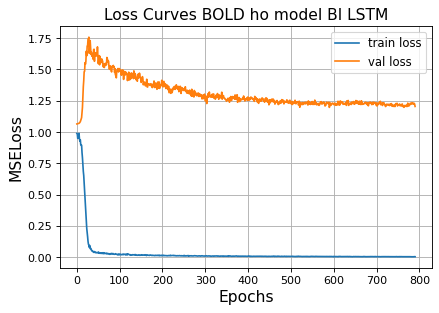

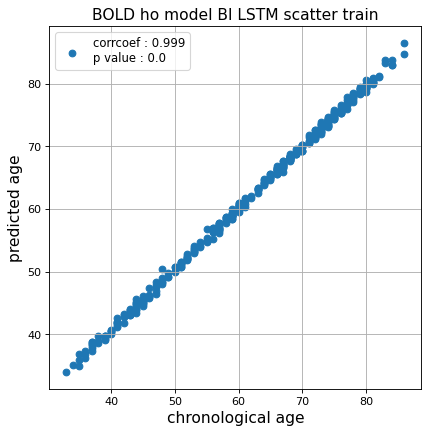

r^2 train data:  0.9979753206814982


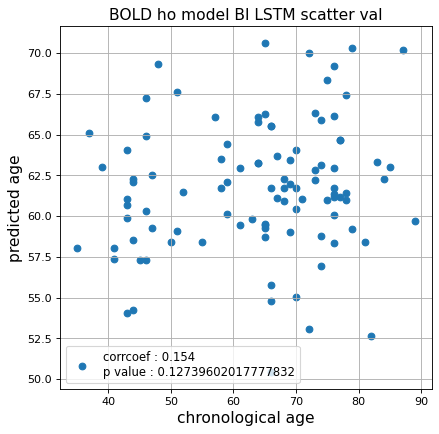

r^2 val data:  -0.021435719306211798


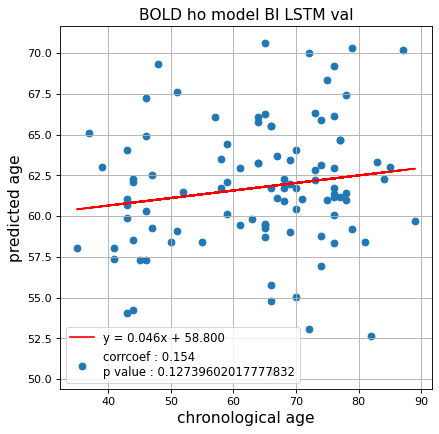

切片: 58.80013538568332
傾き: 0.04619856482947789
Kfold: 3 ::: epoch: 100, loss: 0.014629951248375269, val loss: 1.3583912700414658
Kfold: 3 ::: epoch: 200, loss: 0.010905179051825633, val loss: 1.2499243319034576
Kfold: 3 ::: epoch: 300, loss: 0.007264992150549705, val loss: 1.2958817183971405
Kfold: 3 ::: epoch: 400, loss: 0.00888949722194901, val loss: 1.290441706776619
early stopping
save_epochs:294
best val loss:1.1688487231731415


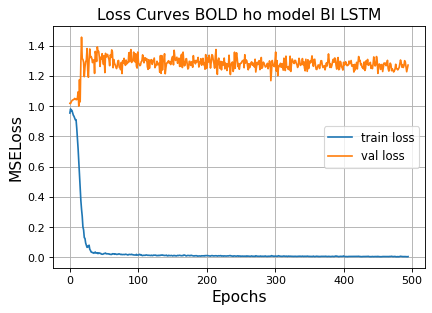

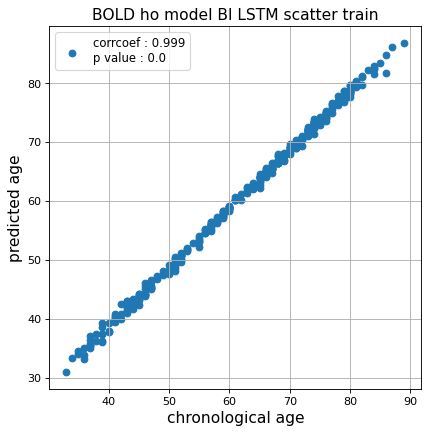

r^2 train data:  0.9892464091643525


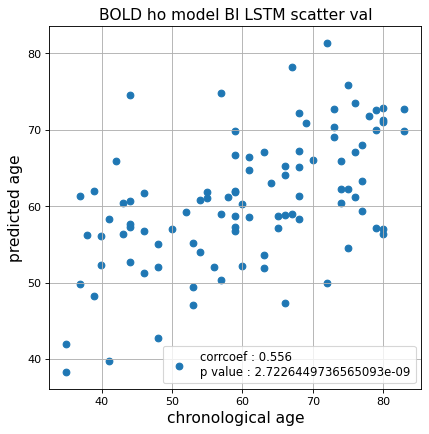

r^2 val data:  0.30411655426632045


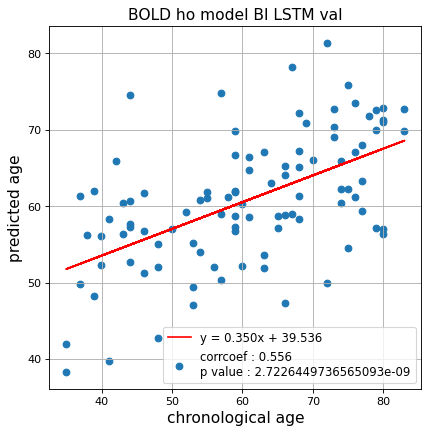

切片: 39.53552909368544
傾き: 0.3499718139253374
Kfold: 4 ::: epoch: 100, loss: 0.019722808797198992, val loss: 1.6260555684566498
Kfold: 4 ::: epoch: 200, loss: 0.01371447376620311, val loss: 1.5054525136947632
Kfold: 4 ::: epoch: 300, loss: 0.009349423245741771, val loss: 1.4211140275001526
Kfold: 4 ::: epoch: 400, loss: 0.007226416142657399, val loss: 1.3654773384332657
Kfold: 4 ::: epoch: 500, loss: 0.007145364052401139, val loss: 1.3111931383609772
Kfold: 4 ::: epoch: 600, loss: 0.006336252670735121, val loss: 1.2491168975830078
Kfold: 4 ::: epoch: 700, loss: 0.004733856086834119, val loss: 1.2317103743553162
Kfold: 4 ::: epoch: 800, loss: 0.004184434494863336, val loss: 1.2293904721736908
Kfold: 4 ::: epoch: 900, loss: 0.0042787170968949795, val loss: 1.1983714699745178
Kfold: 4 ::: epoch: 1000, loss: 0.004220599129509468, val loss: 1.1763670444488525
save_epochs:980
best val loss:1.1633899807929993


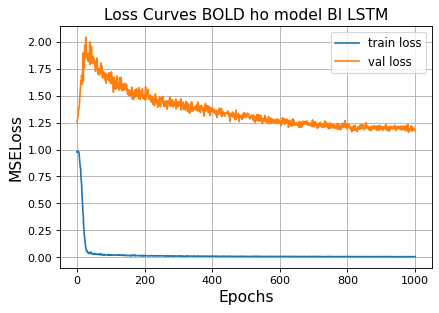

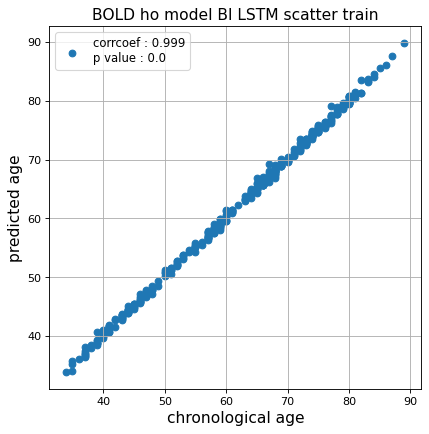

r^2 train data:  0.998505178773896


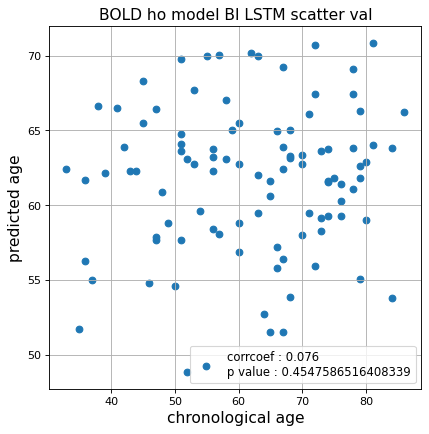

r^2 val data:  -0.07478583115673443


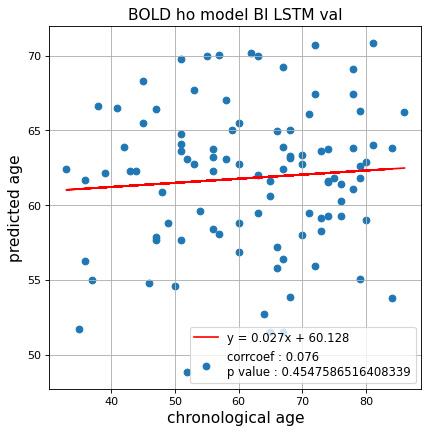

切片: 60.1277497618957
傾き: 0.02748779503989243
Kfold: 5 ::: epoch: 100, loss: 0.01690114765929488, val loss: 1.0690937489271164
Kfold: 5 ::: epoch: 200, loss: 0.009127812209324194, val loss: 1.0070587247610092
Kfold: 5 ::: epoch: 300, loss: 0.006443750417719667, val loss: 1.0097119957208633
Kfold: 5 ::: epoch: 400, loss: 0.005650520879918566, val loss: 0.9739663898944855
Kfold: 5 ::: epoch: 500, loss: 0.004045021021738648, val loss: 0.9651918411254883
Kfold: 5 ::: epoch: 600, loss: 0.004112254075992566, val loss: 0.9689814150333405
early stopping
save_epochs:469
best val loss:0.9241064041852951


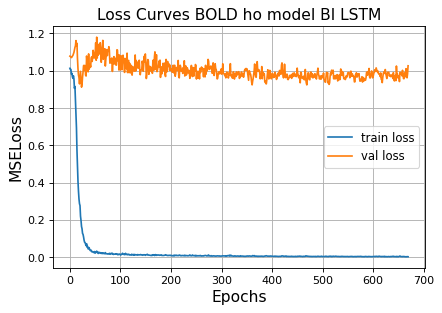

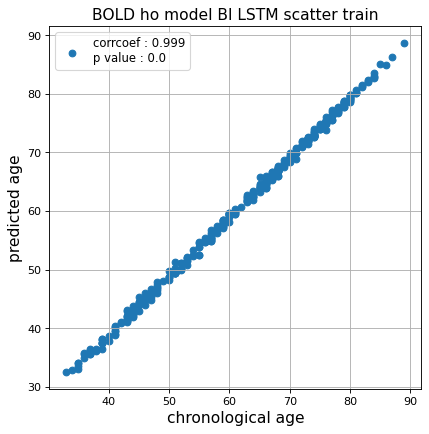

r^2 train data:  0.9931342873902888


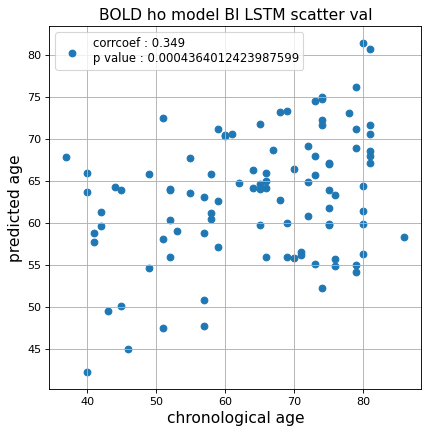

r^2 val data:  0.050726268828704124


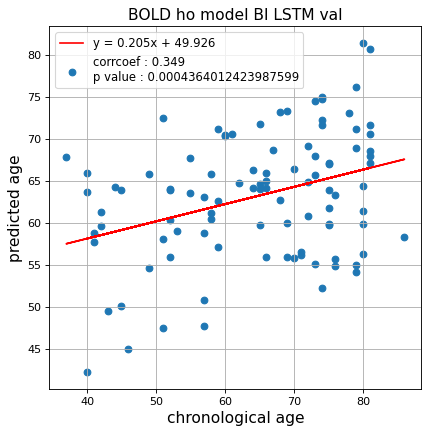

切片: 49.9264717783872
傾き: 0.20534374070211603
Nested Kfold ::: 3
Kfold: 1 ::: epoch: 100, loss: 0.01409399899869011, val loss: 0.646915853023529
Kfold: 1 ::: epoch: 200, loss: 0.008299308470808543, val loss: 0.6251155659556389
Kfold: 1 ::: epoch: 300, loss: 0.008620962500572205, val loss: 0.6087970063090324
Kfold: 1 ::: epoch: 400, loss: 0.006571019193730676, val loss: 0.589268684387207
Kfold: 1 ::: epoch: 500, loss: 0.0044910864223941015, val loss: 0.5848160982131958
Kfold: 1 ::: epoch: 600, loss: 0.0034715835040865037, val loss: 0.5921812802553177
early stopping
save_epochs:404
best val loss:0.5773445144295692


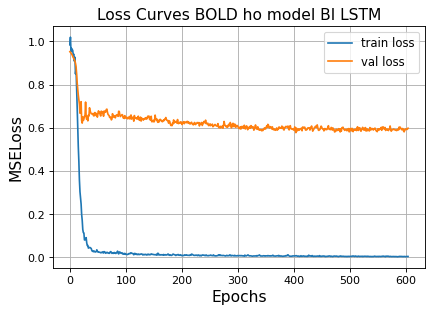

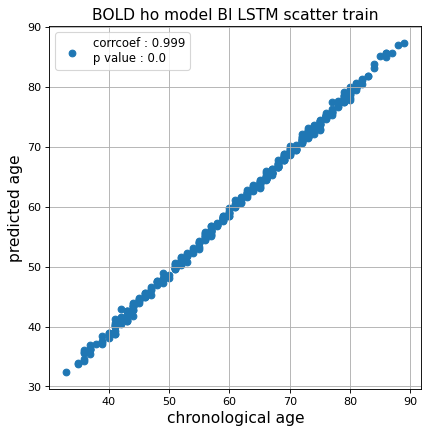

r^2 train data:  0.9934697701332363


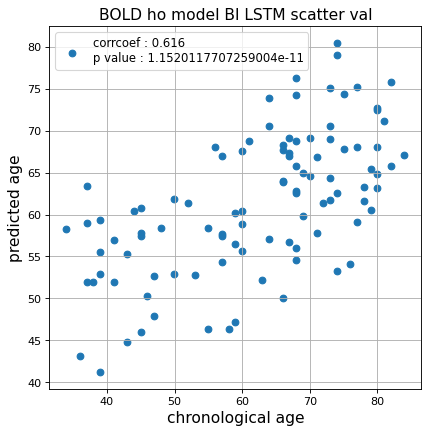

r^2 val data:  0.37728419654020817


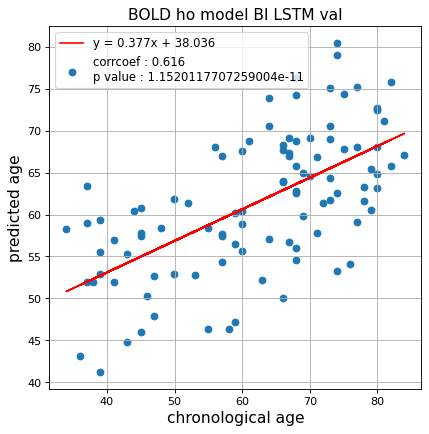

切片: 38.036195904484416
傾き: 0.3765557063375715
Kfold: 2 ::: epoch: 100, loss: 0.01756570764029255, val loss: 0.8334035351872444
Kfold: 2 ::: epoch: 200, loss: 0.009990136354015423, val loss: 0.7365100085735321
Kfold: 2 ::: epoch: 300, loss: 0.007788172206626489, val loss: 0.6992019228637218
Kfold: 2 ::: epoch: 400, loss: 0.006080545341739288, val loss: 0.6694891415536404
Kfold: 2 ::: epoch: 500, loss: 0.007030610693618655, val loss: 0.6422084979712963
Kfold: 2 ::: epoch: 600, loss: 0.004505261151979749, val loss: 0.6278452575206757
Kfold: 2 ::: epoch: 700, loss: 0.005420588261376207, val loss: 0.6149737741798162
Kfold: 2 ::: epoch: 800, loss: 0.003065600812148589, val loss: 0.6022317223250866
Kfold: 2 ::: epoch: 900, loss: 0.002911023320988394, val loss: 0.5926084816455841
Kfold: 2 ::: epoch: 1000, loss: 0.003620995459361718, val loss: 0.5809039957821369
save_epochs:964
best val loss:0.5791775286197662


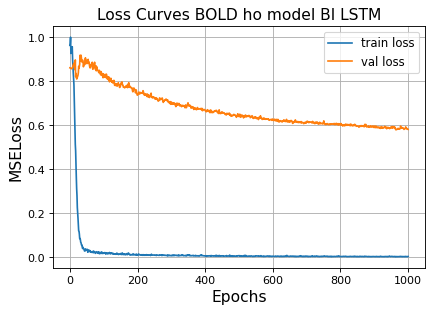

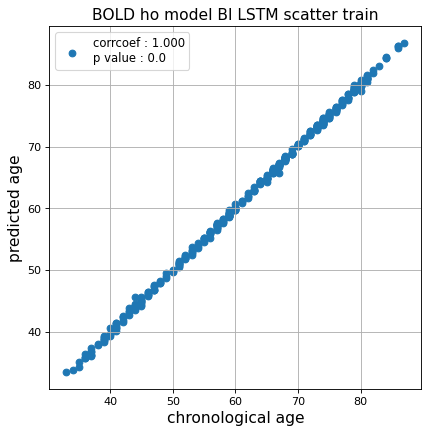

r^2 train data:  0.9993865821861276


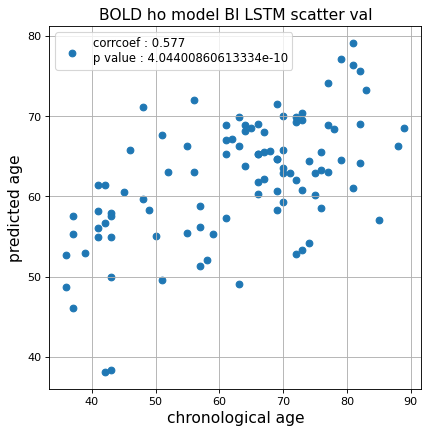

r^2 val data:  0.3306285913909238


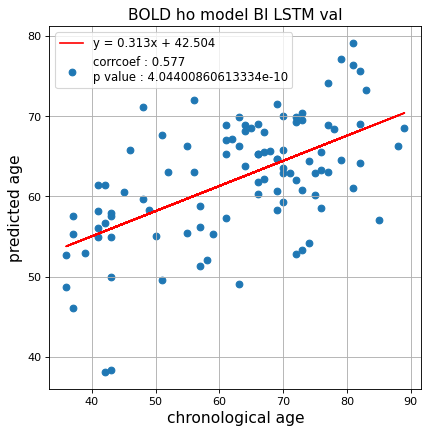

切片: 42.50365506712859
傾き: 0.31347692093977947
Kfold: 3 ::: epoch: 100, loss: 0.0192389850003215, val loss: 1.1100541055202484
Kfold: 3 ::: epoch: 200, loss: 0.00898585540170853, val loss: 1.0089619904756546
Kfold: 3 ::: epoch: 300, loss: 0.00824868750686829, val loss: 0.9882022738456726
Kfold: 3 ::: epoch: 400, loss: 0.006372404678796346, val loss: 0.9251412004232407
Kfold: 3 ::: epoch: 500, loss: 0.0045745677063958, val loss: 0.8990090191364288
Kfold: 3 ::: epoch: 600, loss: 0.004556119907647371, val loss: 0.8921483755111694
Kfold: 3 ::: epoch: 700, loss: 0.003465214574064773, val loss: 0.8853823691606522
Kfold: 3 ::: epoch: 800, loss: 0.003412462305277586, val loss: 0.8757149577140808
Kfold: 3 ::: epoch: 900, loss: 0.00390185947673252, val loss: 0.8374663591384888
Kfold: 3 ::: epoch: 1000, loss: 0.002604629172800252, val loss: 0.8634213805198669
save_epochs:861
best val loss:0.8121757507324219


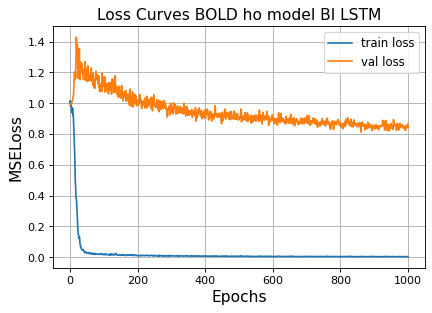

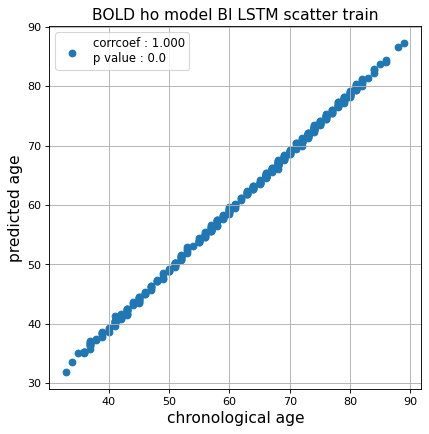

r^2 train data:  0.9934498199983912


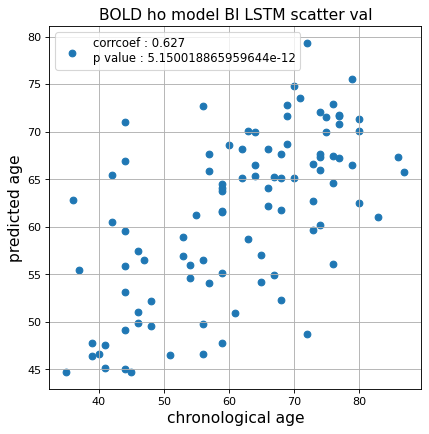

r^2 val data:  0.3917531254469788


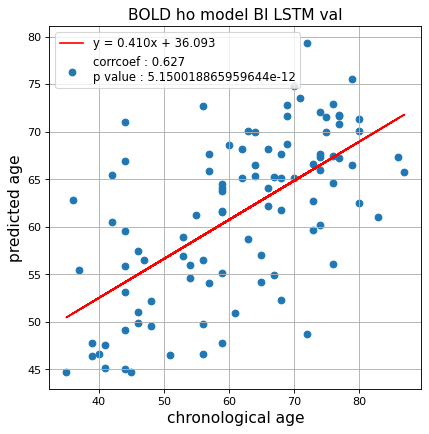

切片: 36.092943330058894
傾き: 0.4104217456074126
Kfold: 4 ::: epoch: 100, loss: 0.0176759074227168, val loss: 1.3540029525756836
Kfold: 4 ::: epoch: 200, loss: 0.015486238882518731, val loss: 1.2258922755718231
Kfold: 4 ::: epoch: 300, loss: 0.008744810278025957, val loss: 1.1113985478878021
Kfold: 4 ::: epoch: 400, loss: 0.005447306777708805, val loss: 1.0369219928979874
Kfold: 4 ::: epoch: 500, loss: 0.005072950994452605, val loss: 0.9944750219583511
Kfold: 4 ::: epoch: 600, loss: 0.0034104288609411856, val loss: 0.9775124043226242
Kfold: 4 ::: epoch: 700, loss: 0.0034521469452346745, val loss: 0.931434765458107
Kfold: 4 ::: epoch: 800, loss: 0.003903126245579467, val loss: 0.9243770837783813
Kfold: 4 ::: epoch: 900, loss: 0.002781497395167557, val loss: 0.9022581428289413
Kfold: 4 ::: epoch: 1000, loss: 0.003230096038001088, val loss: 0.8676474690437317
save_epochs:967
best val loss:0.8585340082645416


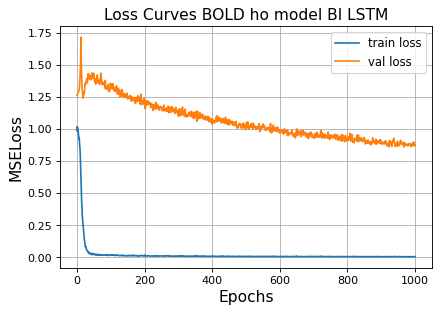

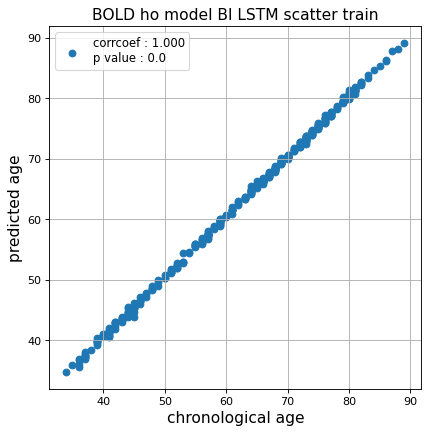

r^2 train data:  0.9981425288080318


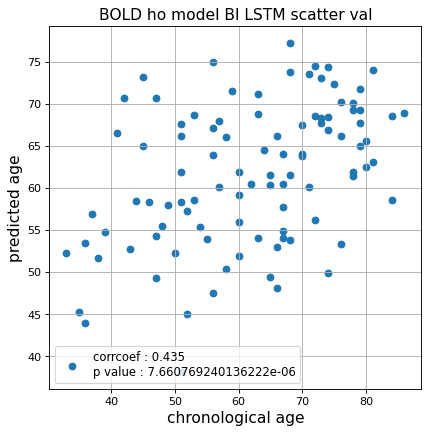

r^2 val data:  0.15342150405218058


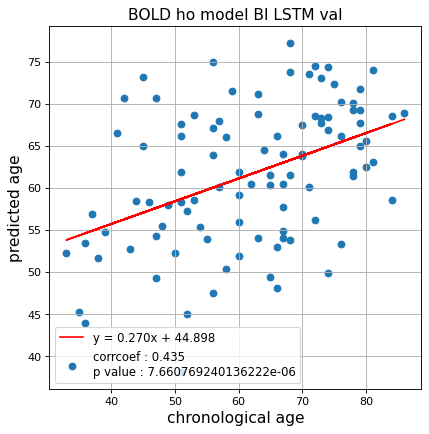

切片: 44.89848405325803
傾き: 0.2703688746133049
Kfold: 5 ::: epoch: 100, loss: 0.010581903016337981, val loss: 0.8303806185722351
Kfold: 5 ::: epoch: 200, loss: 0.006167593806122358, val loss: 0.7895194441080093
Kfold: 5 ::: epoch: 300, loss: 0.005490146899739137, val loss: 0.7467247620224953
Kfold: 5 ::: epoch: 400, loss: 0.00481030185563633, val loss: 0.7445921748876572
Kfold: 5 ::: epoch: 500, loss: 0.0037513933448980632, val loss: 0.714068315923214
Kfold: 5 ::: epoch: 600, loss: 0.003463716389468083, val loss: 0.6976604461669922
Kfold: 5 ::: epoch: 700, loss: 0.0034995389063484394, val loss: 0.6864106729626656
Kfold: 5 ::: epoch: 800, loss: 0.002279756939969957, val loss: 0.6908357664942741
Kfold: 5 ::: epoch: 900, loss: 0.0029781391539682564, val loss: 0.6810450404882431
Kfold: 5 ::: epoch: 1000, loss: 0.0029369956240631067, val loss: 0.6883194521069527
save_epochs:987
best val loss:0.6684633791446686


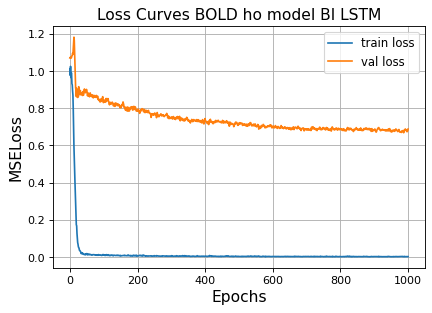

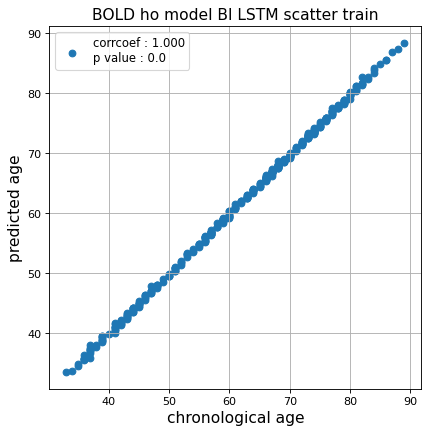

r^2 train data:  0.99930630684989


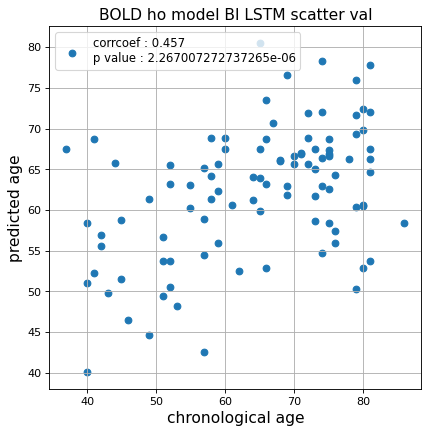

r^2 val data:  0.14509455424818696


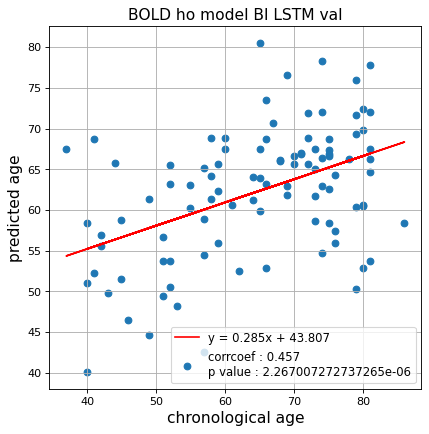

切片: 43.807070639930984
傾き: 0.28521752184768484
Nested Kfold ::: 4
Kfold: 1 ::: epoch: 100, loss: 0.018056492679394208, val loss: 0.7878800556063652
Kfold: 1 ::: epoch: 200, loss: 0.009965379471675707, val loss: 0.7137675359845161
Kfold: 1 ::: epoch: 300, loss: 0.008814153762964102, val loss: 0.6631945967674255
Kfold: 1 ::: epoch: 400, loss: 0.008635767538530322, val loss: 0.6319730281829834
Kfold: 1 ::: epoch: 500, loss: 0.0056552867799137645, val loss: 0.6100980937480927
Kfold: 1 ::: epoch: 600, loss: 0.005375980202538462, val loss: 0.6025065556168556
Kfold: 1 ::: epoch: 700, loss: 0.0040821596048772335, val loss: 0.6010370999574661
Kfold: 1 ::: epoch: 800, loss: 0.0044117101933807135, val loss: 0.5754385888576508
Kfold: 1 ::: epoch: 900, loss: 0.003190813326420119, val loss: 0.5719680786132812
Kfold: 1 ::: epoch: 1000, loss: 0.003055625630972477, val loss: 0.5758521556854248
save_epochs:970
best val loss:0.5505447834730148


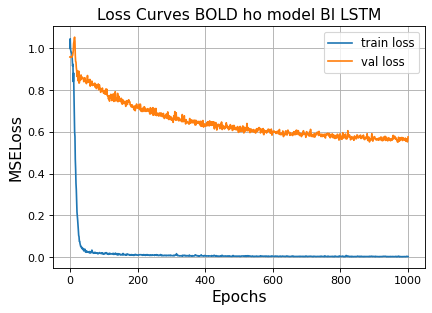

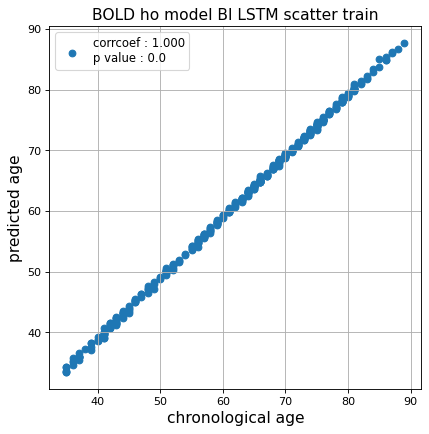

r^2 train data:  0.9942789522680072


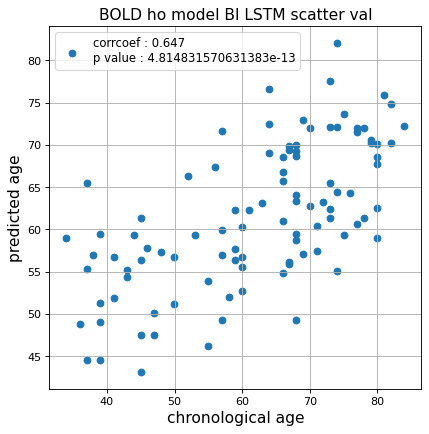

r^2 val data:  0.41608706097879056


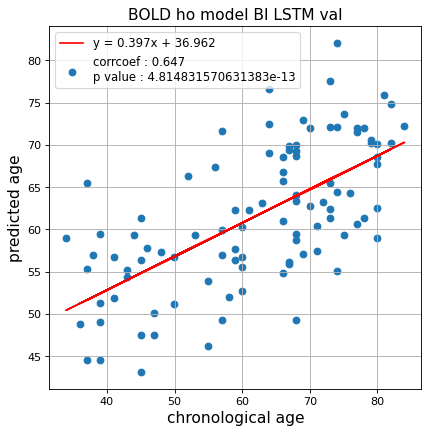

切片: 36.96188954209266
傾き: 0.3969586680523596
Kfold: 2 ::: epoch: 100, loss: 0.018913629106604136, val loss: 0.9690384045243263
Kfold: 2 ::: epoch: 200, loss: 0.012339456096434822, val loss: 0.8932950161397457
Kfold: 2 ::: epoch: 300, loss: 0.008131614689213725, val loss: 0.8738244008272886
Kfold: 2 ::: epoch: 400, loss: 0.007183352592759407, val loss: 0.8652052534744143
Kfold: 2 ::: epoch: 500, loss: 0.0056473563711803695, val loss: 0.8572797263041139
early stopping
save_epochs:365
best val loss:0.8471583346836269


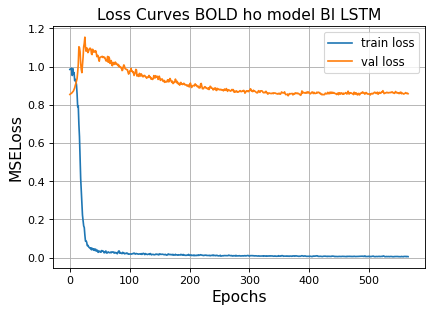

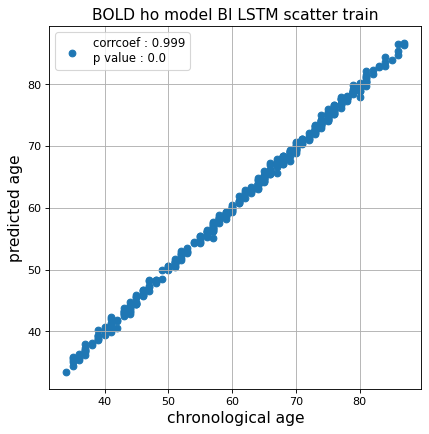

r^2 train data:  0.9984402683584482


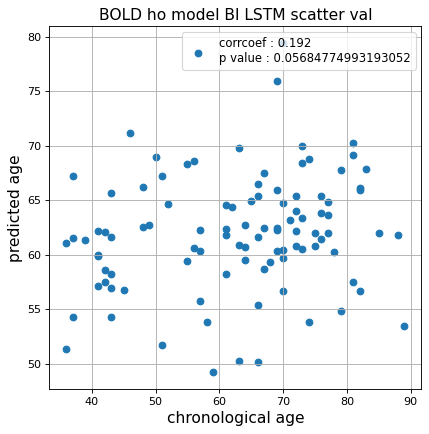

r^2 val data:  -9.276189361195897e-05


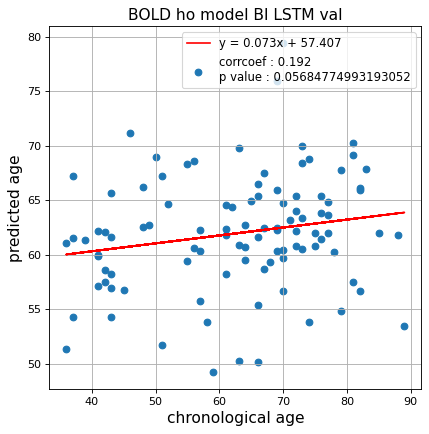

切片: 57.406851153103375
傾き: 0.07262797301025962
Kfold: 3 ::: epoch: 100, loss: 0.02100141468242957, val loss: 1.2016770839691162
Kfold: 3 ::: epoch: 200, loss: 0.011650751631420393, val loss: 1.0469468384981155
Kfold: 3 ::: epoch: 300, loss: 0.009248240027003564, val loss: 0.9643104523420334
Kfold: 3 ::: epoch: 400, loss: 0.00819936477077695, val loss: 0.9148878455162048
Kfold: 3 ::: epoch: 500, loss: 0.004644843588511531, val loss: 0.886688694357872
Kfold: 3 ::: epoch: 600, loss: 0.004535803768353967, val loss: 0.8626607358455658
Kfold: 3 ::: epoch: 700, loss: 0.005271539486084993, val loss: 0.8575432896614075
Kfold: 3 ::: epoch: 800, loss: 0.0036378779018727634, val loss: 0.8077214360237122
Kfold: 3 ::: epoch: 900, loss: 0.003752545131227145, val loss: 0.7993701845407486
Kfold: 3 ::: epoch: 1000, loss: 0.003436279295083995, val loss: 0.8360068798065186
save_epochs:985
best val loss:0.774060845375061


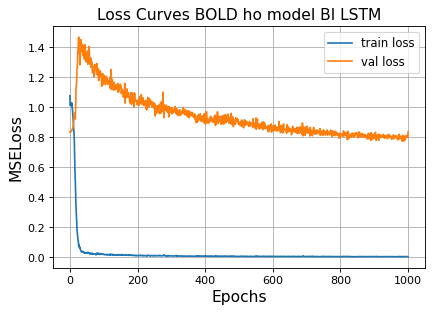

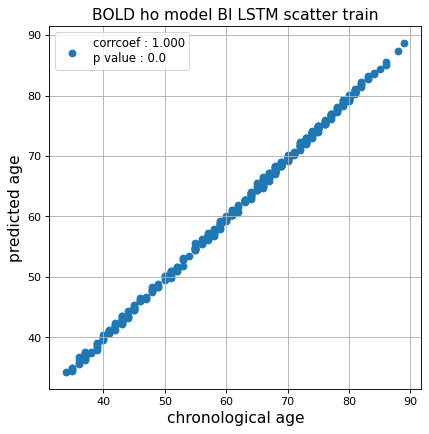

r^2 train data:  0.9987727484676227


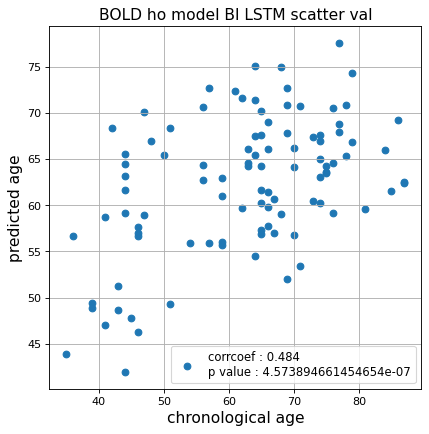

r^2 val data:  0.22807521678482756


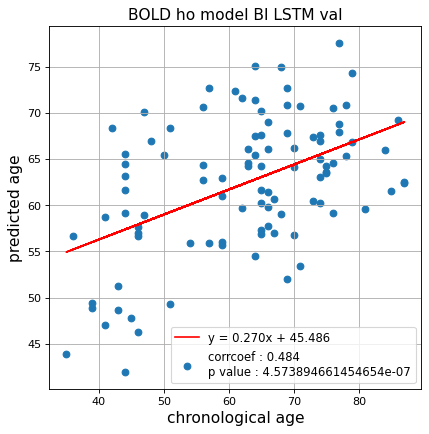

切片: 45.485981999452534
傾き: 0.27025471143032403
Kfold: 4 ::: epoch: 100, loss: 0.013858424284710335, val loss: 1.447215050458908
Kfold: 4 ::: epoch: 200, loss: 0.009523426863149954, val loss: 1.3404795825481415
Kfold: 4 ::: epoch: 300, loss: 0.006838586682883592, val loss: 1.3016068637371063
Kfold: 4 ::: epoch: 400, loss: 0.004946136417297216, val loss: 1.2971060425043106
Kfold: 4 ::: epoch: 500, loss: 0.007219847972289874, val loss: 1.2554609328508377
Kfold: 4 ::: epoch: 600, loss: 0.0045407165486652116, val loss: 1.228091061115265
Kfold: 4 ::: epoch: 700, loss: 0.003628589606915529, val loss: 1.194226548075676
Kfold: 4 ::: epoch: 800, loss: 0.0039343660733161066, val loss: 1.1941912174224854
Kfold: 4 ::: epoch: 900, loss: 0.003546584899035784, val loss: 1.1709796041250229
Kfold: 4 ::: epoch: 1000, loss: 0.002645531996117475, val loss: 1.1172930747270584
save_epochs:980
best val loss:1.1058769524097443


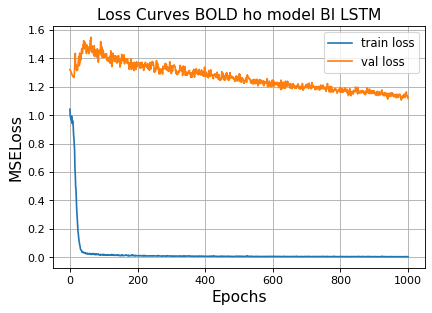

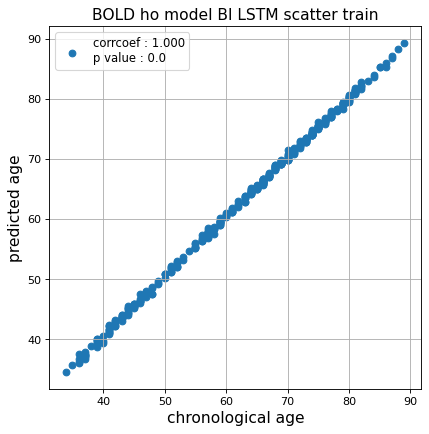

r^2 train data:  0.9982695341645279


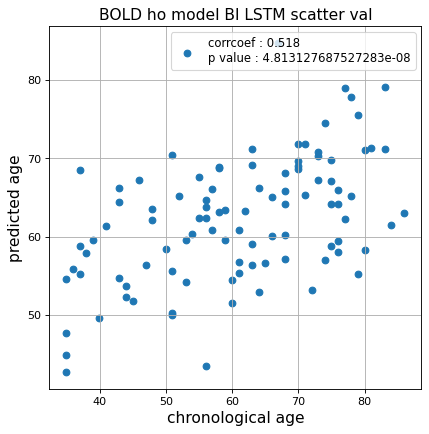

r^2 val data:  0.2561592236871182


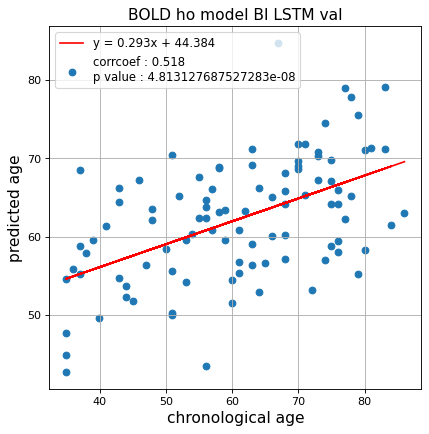

切片: 44.38439268952069
傾き: 0.29261532014214875
Kfold: 5 ::: epoch: 100, loss: 0.016616759750132378, val loss: 0.8088597506284714
Kfold: 5 ::: epoch: 200, loss: 0.010001770113236629, val loss: 0.7264799028635025
Kfold: 5 ::: epoch: 300, loss: 0.008450915499661978, val loss: 0.6919027268886566
Kfold: 5 ::: epoch: 400, loss: 0.0055791833617079714, val loss: 0.668340727686882
Kfold: 5 ::: epoch: 500, loss: 0.006776826724839898, val loss: 0.6774634271860123
Kfold: 5 ::: epoch: 600, loss: 0.004776183372506728, val loss: 0.6654271706938744
Kfold: 5 ::: epoch: 700, loss: 0.004024486379841199, val loss: 0.640171617269516
Kfold: 5 ::: epoch: 800, loss: 0.0032668961749340478, val loss: 0.6412085890769958
Kfold: 5 ::: epoch: 900, loss: 0.002845296564583595, val loss: 0.6348595172166824
Kfold: 5 ::: epoch: 1000, loss: 0.002982839261396573, val loss: 0.6418977230787277
save_epochs:932
best val loss:0.6234975531697273


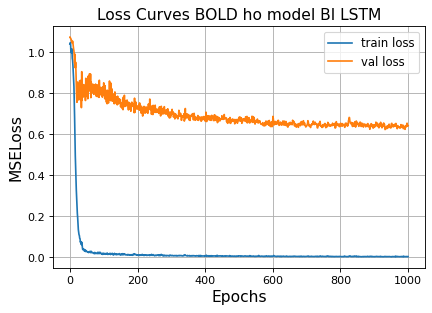

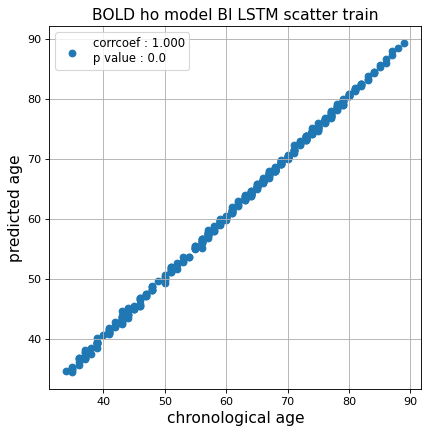

r^2 train data:  0.9987329843781514


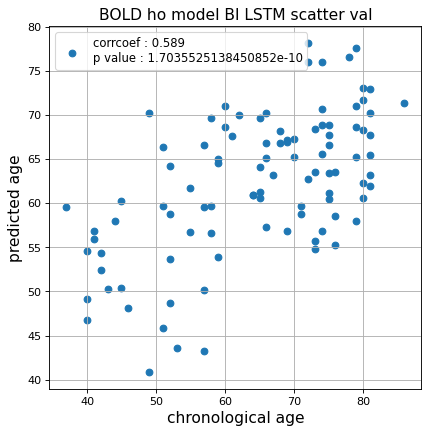

r^2 val data:  0.3102951191787484


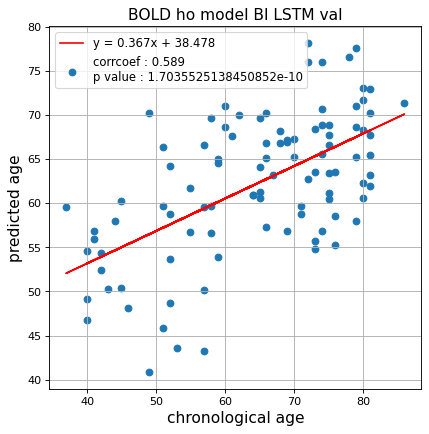

切片: 38.47761211996706
傾き: 0.3673732905692283
Nested Kfold ::: 5
Kfold: 1 ::: epoch: 100, loss: 0.014567415731457563, val loss: 0.6559489145874977
Kfold: 1 ::: epoch: 200, loss: 0.01002600147890357, val loss: 0.6201897263526917
Kfold: 1 ::: epoch: 300, loss: 0.007239361078693316, val loss: 0.6077094376087189
Kfold: 1 ::: epoch: 400, loss: 0.006663838401436806, val loss: 0.5899555385112762
Kfold: 1 ::: epoch: 500, loss: 0.004891112957221384, val loss: 0.5716548636555672
Kfold: 1 ::: epoch: 600, loss: 0.003963120926458102, val loss: 0.5633749440312386
Kfold: 1 ::: epoch: 700, loss: 0.0035977169262388577, val loss: 0.5614271983504295
Kfold: 1 ::: epoch: 800, loss: 0.0031911353580653667, val loss: 0.5522331446409225
Kfold: 1 ::: epoch: 900, loss: 0.0022473461352861845, val loss: 0.5539724677801132
Kfold: 1 ::: epoch: 1000, loss: 0.002760240834994385, val loss: 0.5447641760110855
save_epochs:980
best val loss:0.5392550453543663


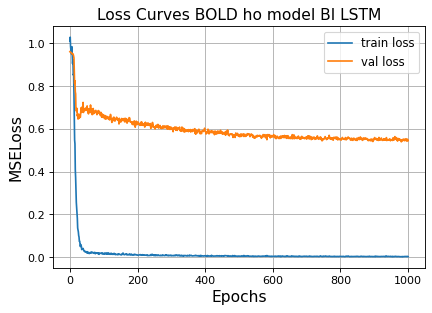

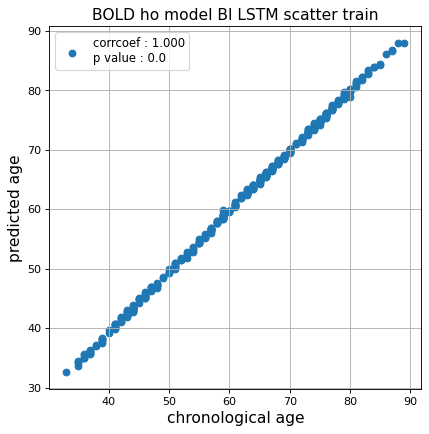

r^2 train data:  0.9987148093990618


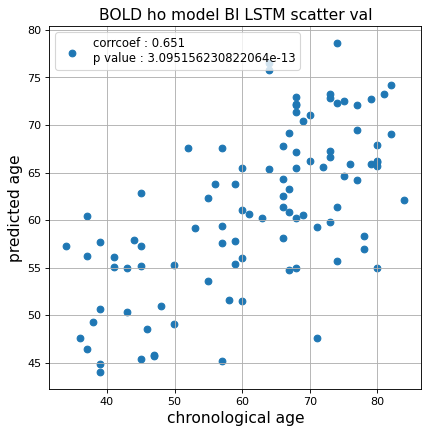

r^2 val data:  0.41772989327568444


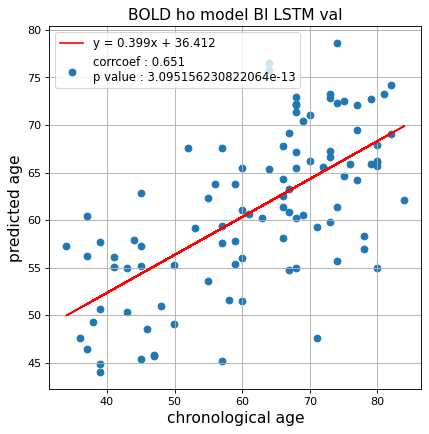

切片: 36.4119652988786
傾き: 0.39858025949764536
Kfold: 2 ::: epoch: 100, loss: 0.02093657199293375, val loss: 0.8303279727697372
Kfold: 2 ::: epoch: 200, loss: 0.013681717933370518, val loss: 0.7711894884705544
Kfold: 2 ::: epoch: 300, loss: 0.00960614589544443, val loss: 0.7364830374717712
Kfold: 2 ::: epoch: 400, loss: 0.009032829843748074, val loss: 0.729454755783081
Kfold: 2 ::: epoch: 500, loss: 0.007543421225049174, val loss: 0.7120553702116013
Kfold: 2 ::: epoch: 600, loss: 0.005358576828327317, val loss: 0.7095479071140289
Kfold: 2 ::: epoch: 700, loss: 0.005341473178794751, val loss: 0.6996665224432945
Kfold: 2 ::: epoch: 800, loss: 0.004594411306942885, val loss: 0.7061695158481598
Kfold: 2 ::: epoch: 900, loss: 0.003533233906357334, val loss: 0.6907864809036255
Kfold: 2 ::: epoch: 1000, loss: 0.003010096592613711, val loss: 0.6950231119990349
save_epochs:897
best val loss:0.680929608643055


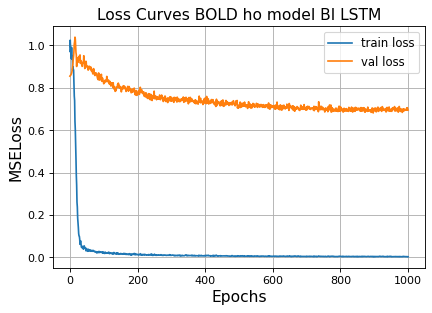

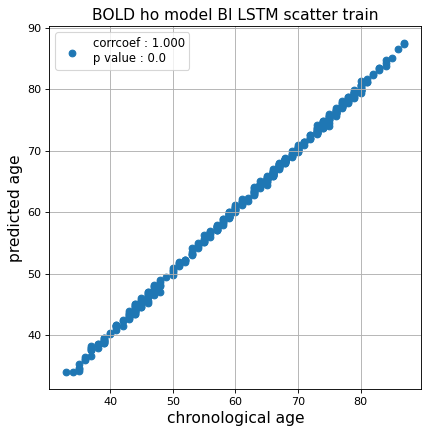

r^2 train data:  0.9985020778376225


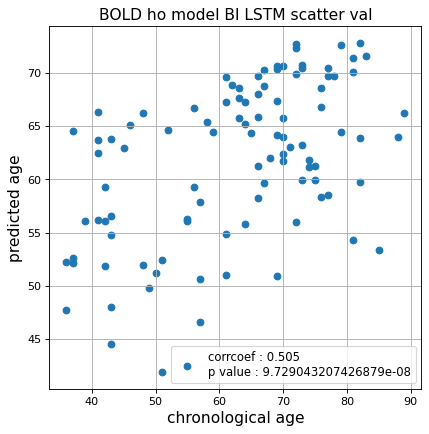

r^2 val data:  0.2520316684505902


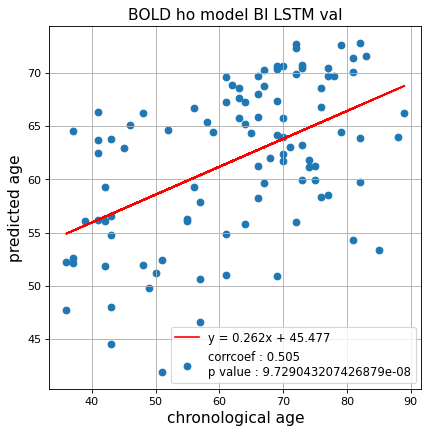

切片: 45.47735592131334
傾き: 0.2618427202897349
Kfold: 3 ::: epoch: 100, loss: 0.019540737239787213, val loss: 0.6647937148809433
Kfold: 3 ::: epoch: 200, loss: 0.009136475837574555, val loss: 0.6618977636098862
Kfold: 3 ::: epoch: 300, loss: 0.008019880534937749, val loss: 0.7107942551374435
Kfold: 3 ::: epoch: 400, loss: 0.005501998230241812, val loss: 0.6760327219963074
early stopping
save_epochs:211
best val loss:0.6324325650930405


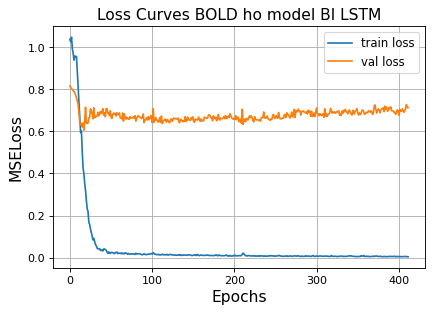

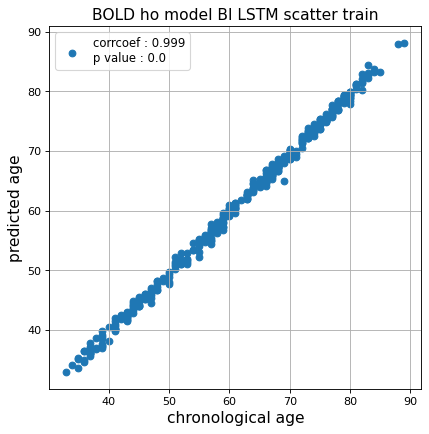

r^2 train data:  0.9961313311030339


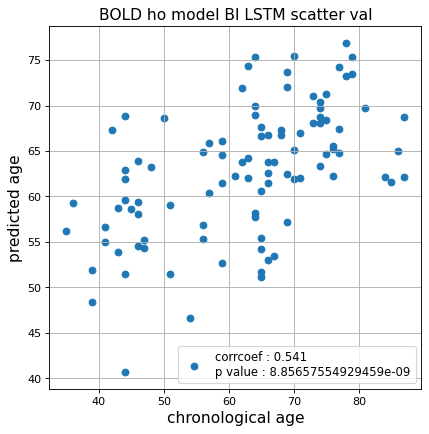

r^2 val data:  0.2917710231588554


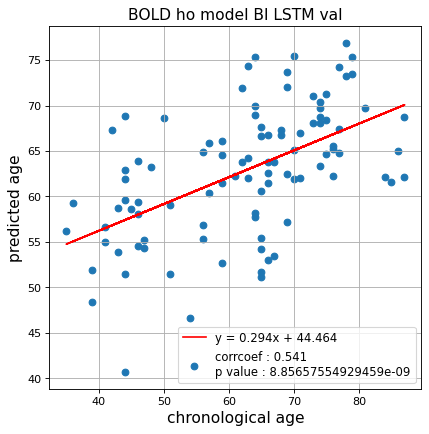

切片: 44.46429688047273
傾き: 0.2942575693844464
Kfold: 4 ::: epoch: 100, loss: 0.016011869033368733, val loss: 0.7047176659107208
Kfold: 4 ::: epoch: 200, loss: 0.007719076346032894, val loss: 0.6557488143444061
Kfold: 4 ::: epoch: 300, loss: 0.008319996977941347, val loss: 0.5987053140997887
Kfold: 4 ::: epoch: 400, loss: 0.005392126846485413, val loss: 0.5986723229289055
Kfold: 4 ::: epoch: 500, loss: 0.0037080670814388073, val loss: 0.5816133469343185
Kfold: 4 ::: epoch: 600, loss: 0.003904011960213001, val loss: 0.5702483057975769
Kfold: 4 ::: epoch: 700, loss: 0.0032485274938293374, val loss: 0.5409573614597321
Kfold: 4 ::: epoch: 800, loss: 0.0035119202310362686, val loss: 0.5493001043796539
Kfold: 4 ::: epoch: 900, loss: 0.002961842853647585, val loss: 0.5410861894488335
Kfold: 4 ::: epoch: 1000, loss: 0.0028157567945667184, val loss: 0.5386650413274765
save_epochs:890
best val loss:0.5240499079227448


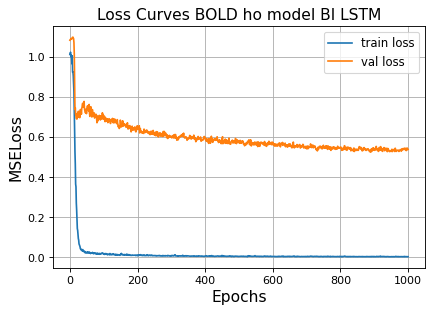

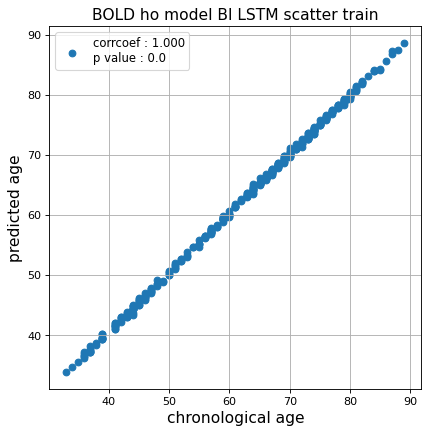

r^2 train data:  0.9987920834989449


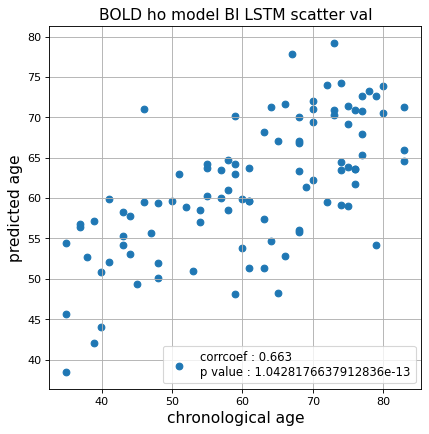

r^2 val data:  0.4356760243477077


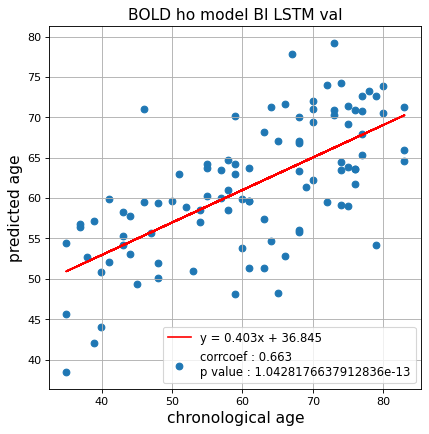

切片: 36.8450687222014
傾き: 0.4025619152805395
Kfold: 5 ::: epoch: 100, loss: 0.012635814348379007, val loss: 0.7509980350732803
Kfold: 5 ::: epoch: 200, loss: 0.008745491576309387, val loss: 0.7342718690633774
Kfold: 5 ::: epoch: 300, loss: 0.005694505400382555, val loss: 0.775094598531723
Kfold: 5 ::: epoch: 400, loss: 0.004031635408934493, val loss: 0.7792200148105621
early stopping
save_epochs:212
best val loss:0.7141497284173965


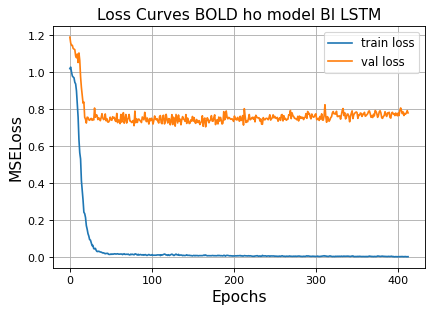

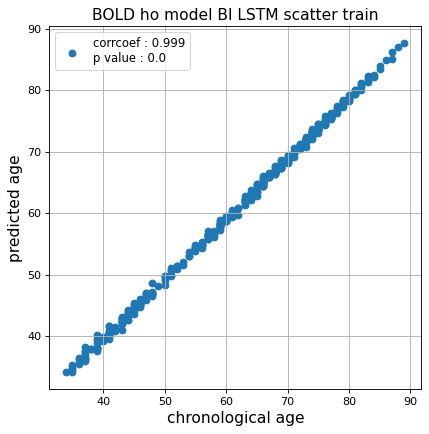

r^2 train data:  0.9937023124662127


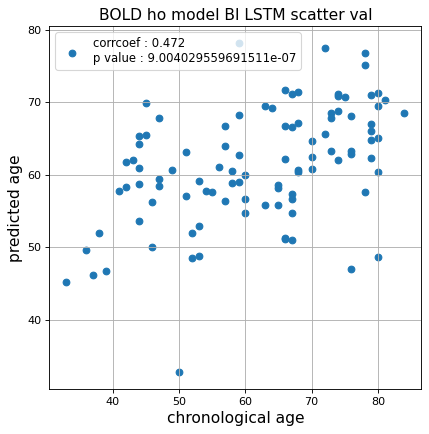

r^2 val data:  0.2034571669913373


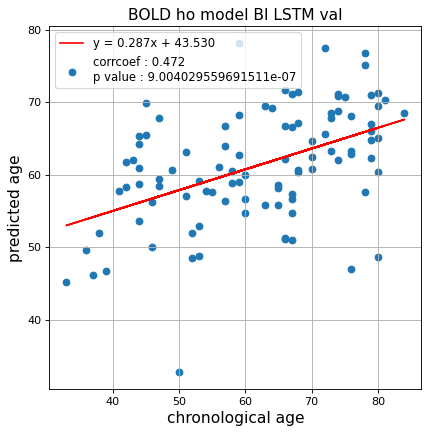

切片: 43.52985669700317
傾き: 0.2865431446799313
CPU times: user 2h 18min 17s, sys: 6min 5s, total: 2h 24min 22s
Wall time: 2h 24min 34s


In [23]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_ho_2  = []
test_pred_ho_corrected_2  = []
test_label_ho_2 = []
test_idx_ho_2   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_ho)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_ho,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1000,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 128,
                                                           num_layers = 2,
                                                           fc_drop = 0.1,
                                                           bidirectional = True,
                                                           title = 'ROI ho model BI LSTM'
                                                          )
    
    test_pred_ho_2.append(test_pred)
    test_pred_ho_corrected_2.append(test_pred_corrected)
    test_label_ho_2.append(test_label)
    test_idx_ho_2.append(test_idx)

### データ保存

In [ ]:
!python GPU.py LSTM_ROI_HO

In [ ]:
test_pred_ho_1 = np.array(test_pred_ho_1, dtype=object)
test_pred_ho_corrected_1 = np.array(test_pred_ho_corrected_1, dtype=object)

test_pred_ho_2 = np.array(test_pred_ho_2, dtype=object)
test_pred_ho_corrected_2 = np.array(test_pred_ho_corrected_2, dtype=object)

In [43]:
np.savez('../02_data_analysis/temp/ho_lstm',
         test_pred_ho_1,
         test_pred_ho_corrected_1,
         test_label_ho_1,
         test_idx_ho_1)
np.savez('../02_data_analysis/temp/ho_lstm_bi',
         test_pred_ho_2,
         test_pred_ho_corrected_2,
         test_label_ho_2,
         test_idx_ho_2)

### Data定義(dynamic FC)

In [15]:
%%time
df_dynamic_ho = pd.read_csv('../02_data_analysis/dynamic_FC/dynamic_ho.csv')
data_dynamic_ho = make_data(df_dynamic_ho)
print(data_dynamic_ho.shape)

(615, 123, 5995)
CPU times: user 2min 48s, sys: 4.88 s, total: 2min 53s
Wall time: 2min 53s


### Dynamic FC 1

Nested Kfold ::: 1
Kfold: 1 ::: epoch: 100, loss: 0.012302679439576773, val loss: 0.47535036131739616
Kfold: 1 ::: epoch: 200, loss: 0.005583821061568765, val loss: 0.4823570065200329
Kfold: 1 ::: epoch: 300, loss: 0.0046240983781619715, val loss: 0.4708394408226013
Kfold: 1 ::: epoch: 400, loss: 0.003246831018119477, val loss: 0.46131238527595997
Kfold: 1 ::: epoch: 500, loss: 0.0028203354181291964, val loss: 0.4579750495031476
Kfold: 1 ::: epoch: 600, loss: 0.0024393151487367083, val loss: 0.46610631234943867
early stopping
save_epochs:490
best val loss:0.44152194634079933


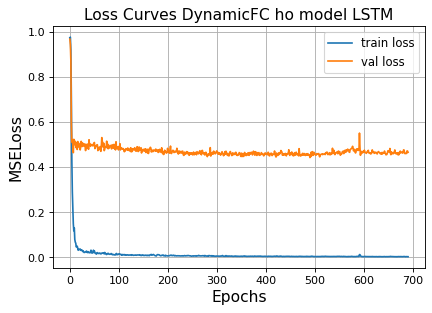

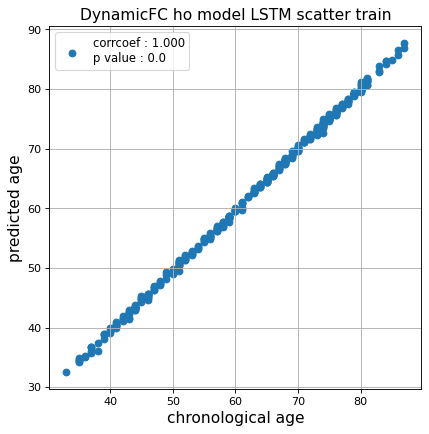

r^2 train data:  0.9986197963795479


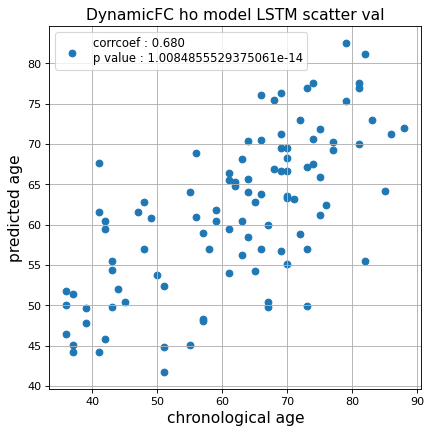

r^2 val data:  0.46132625706644337


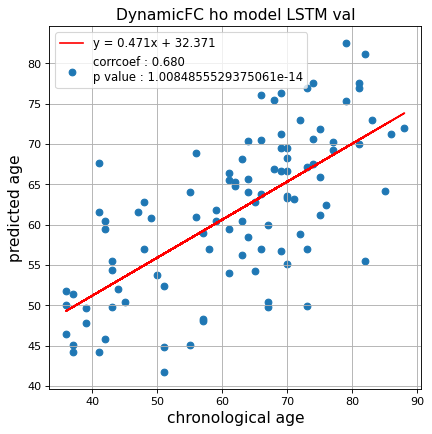

切片: 32.37077450120751
傾き: 0.4709696215948603
Kfold: 2 ::: epoch: 100, loss: 0.01260245512597836, val loss: 0.9102888107299805
Kfold: 2 ::: epoch: 200, loss: 0.007434213892198526, val loss: 0.9158775508403778
Kfold: 2 ::: epoch: 300, loss: 0.004220833267586736, val loss: 0.8929499089717865
Kfold: 2 ::: epoch: 400, loss: 0.00405744722005553, val loss: 0.8962378650903702
Kfold: 2 ::: epoch: 500, loss: 0.0033022604452875946, val loss: 0.9567225426435471
early stopping
save_epochs:391
best val loss:0.8348129689693451


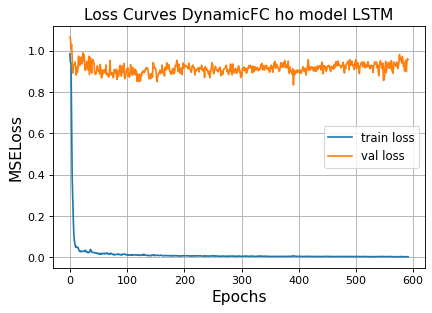

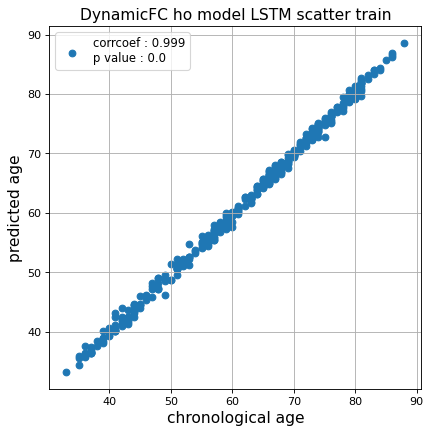

r^2 train data:  0.9968738806537698


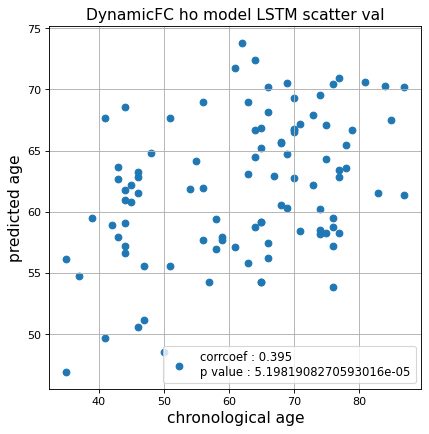

r^2 val data:  0.15517947838159185


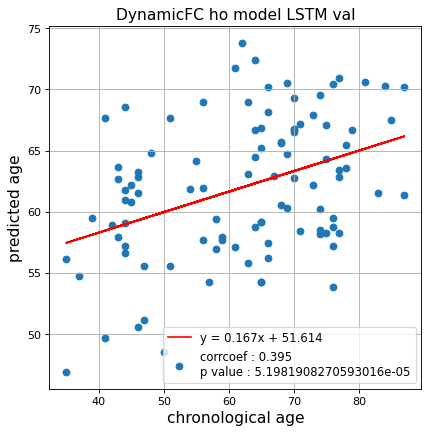

切片: 51.61435818020628
傾き: 0.16735669974439094
Kfold: 3 ::: epoch: 100, loss: 0.012690259322810631, val loss: 0.6113620400428772
Kfold: 3 ::: epoch: 200, loss: 0.008152197330043865, val loss: 0.6026643216609955
Kfold: 3 ::: epoch: 300, loss: 0.004794027486171287, val loss: 0.5935498028993607
Kfold: 3 ::: epoch: 400, loss: 0.0036645547952502966, val loss: 0.5771625339984894
Kfold: 3 ::: epoch: 500, loss: 0.0046436738652678635, val loss: 0.5704274624586105
Kfold: 3 ::: epoch: 600, loss: 0.002891355946373481, val loss: 0.5707387179136276
Kfold: 3 ::: epoch: 700, loss: 0.002218583643508072, val loss: 0.5839151442050934
save_epochs:639
best val loss:0.5278491973876953


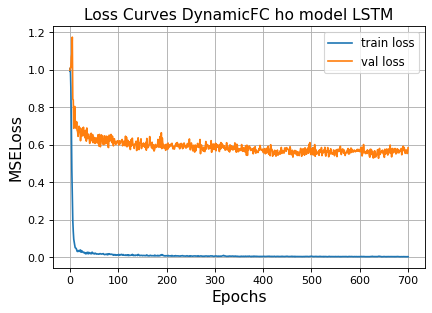

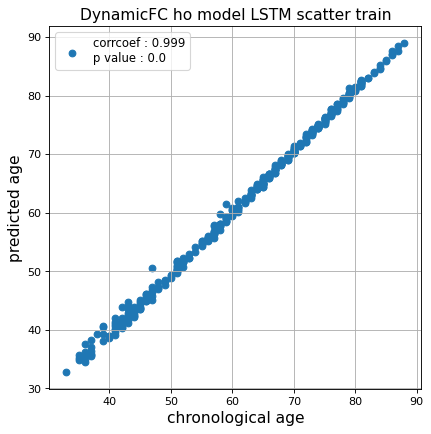

r^2 train data:  0.9958556908393759


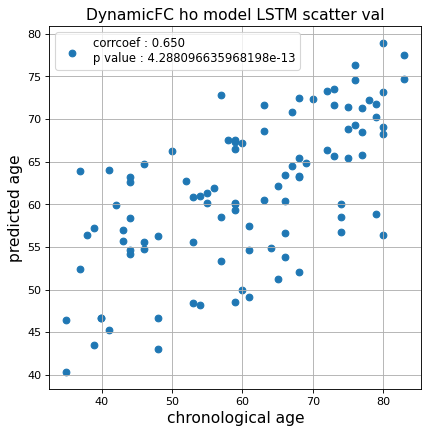

r^2 val data:  0.419638334863627


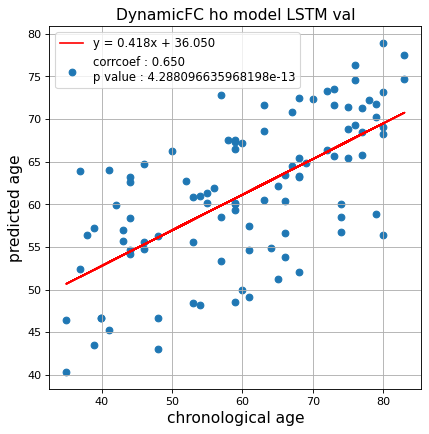

切片: 36.05000187931189
傾き: 0.4179488193090179
Kfold: 4 ::: epoch: 100, loss: 0.013533555938360782, val loss: 1.3986124396324158
Kfold: 4 ::: epoch: 200, loss: 0.007451294151206429, val loss: 1.5137650519609451
Kfold: 4 ::: epoch: 300, loss: 0.005368973307598095, val loss: 1.4834297895431519
Kfold: 4 ::: epoch: 400, loss: 0.0043715809722645925, val loss: 1.4472811371088028
Kfold: 4 ::: epoch: 500, loss: 0.0034612395908110417, val loss: 1.3947193175554276
early stopping
save_epochs:299
best val loss:1.3930061757564545


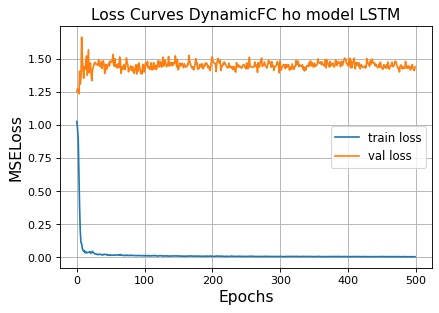

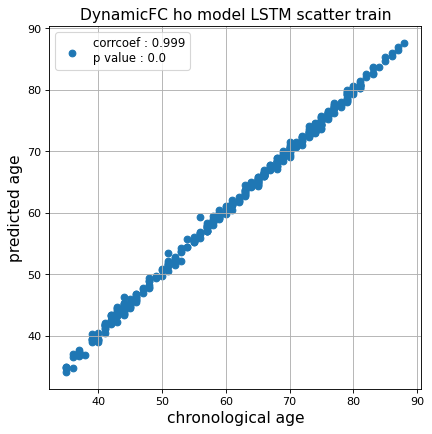

r^2 train data:  0.9975642645450747


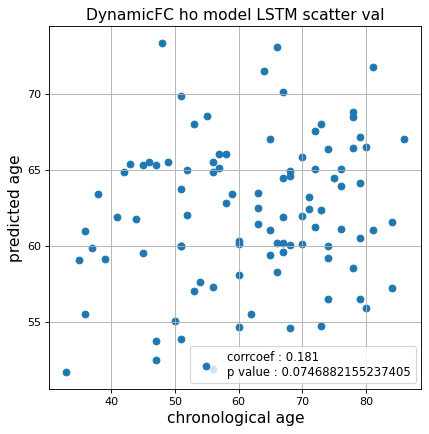

r^2 val data:  0.002357270374601761


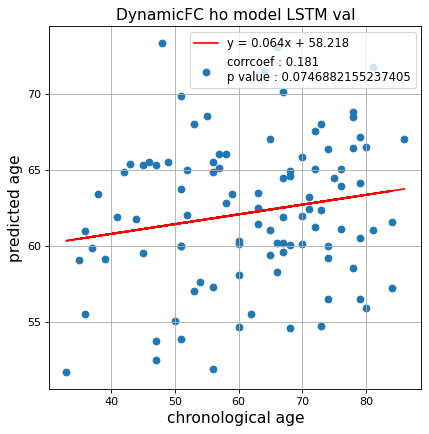

切片: 58.21762643784743
傾き: 0.06416115412865615
Kfold: 5 ::: epoch: 100, loss: 0.010741700704854269, val loss: 0.7075433731079102
Kfold: 5 ::: epoch: 200, loss: 0.006016859014590199, val loss: 0.6930382251739502
Kfold: 5 ::: epoch: 300, loss: 0.004363845192039242, val loss: 0.6789301335811615
Kfold: 5 ::: epoch: 400, loss: 0.004151169765883913, val loss: 0.6449158564209938
Kfold: 5 ::: epoch: 500, loss: 0.0029010567993212203, val loss: 0.670292928814888
Kfold: 5 ::: epoch: 600, loss: 0.0030069537819004976, val loss: 0.6384683549404144
Kfold: 5 ::: epoch: 700, loss: 0.0027349469287750814, val loss: 0.6727362722158432
save_epochs:626
best val loss:0.6215363517403603


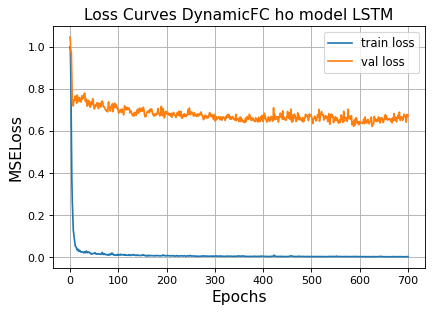

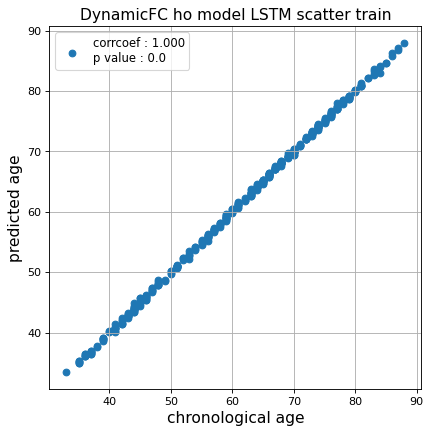

r^2 train data:  0.9995254230299053


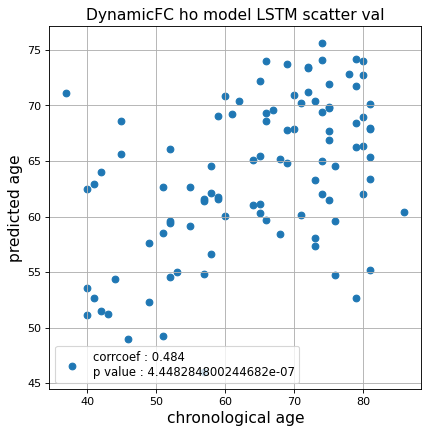

r^2 val data:  0.22645463431357327


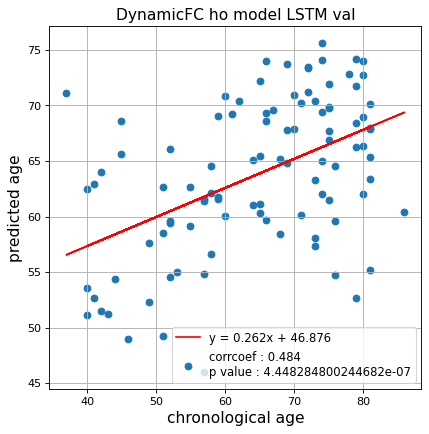

切片: 46.87627887184945
傾き: 0.26150863205963126
Nested Kfold ::: 2
Kfold: 1 ::: epoch: 100, loss: 0.013513424039746706, val loss: 0.49611610919237137
Kfold: 1 ::: epoch: 200, loss: 0.009053049429964561, val loss: 0.4822278320789337
Kfold: 1 ::: epoch: 300, loss: 0.005429840449673625, val loss: 0.4753258228302002
Kfold: 1 ::: epoch: 400, loss: 0.0037142042822849294, val loss: 0.4607373997569084
Kfold: 1 ::: epoch: 500, loss: 0.0027891623232370387, val loss: 0.4640066623687744
Kfold: 1 ::: epoch: 600, loss: 0.0028558536164032724, val loss: 0.4632270596921444
Kfold: 1 ::: epoch: 700, loss: 0.0023660207740389383, val loss: 0.46262627467513084
save_epochs:667
best val loss:0.4275102838873863


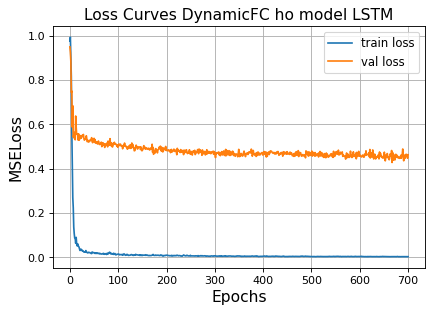

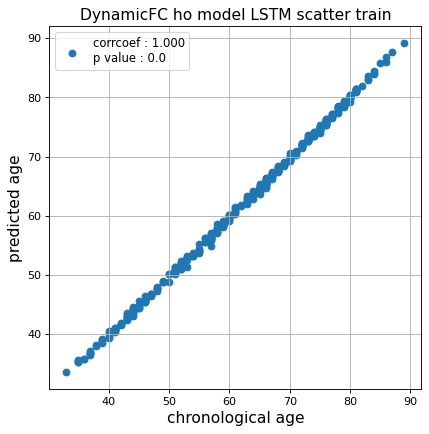

r^2 train data:  0.9988708643895831


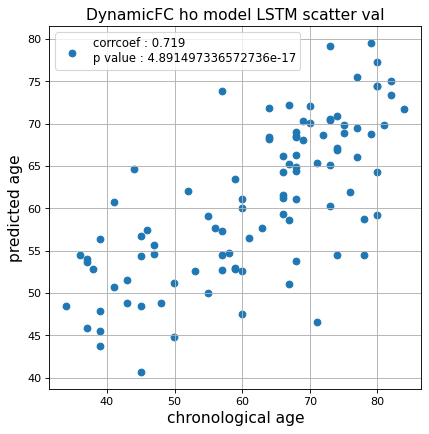

r^2 val data:  0.5083089463356693


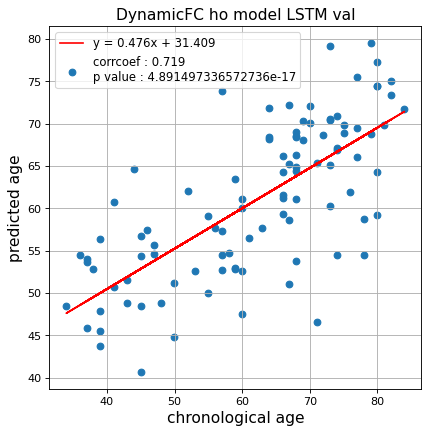

切片: 31.40856721613424
傾き: 0.4764101143807438
Kfold: 2 ::: epoch: 100, loss: 0.011886395191630492, val loss: 0.7956207543611526
Kfold: 2 ::: epoch: 200, loss: 0.005424013988186534, val loss: 0.8110467046499252
Kfold: 2 ::: epoch: 300, loss: 0.007683087283602128, val loss: 0.8361216336488724
Kfold: 2 ::: epoch: 400, loss: 0.0033346116721916655, val loss: 0.8248360604047775
early stopping
save_epochs:297
best val loss:0.7677900195121765


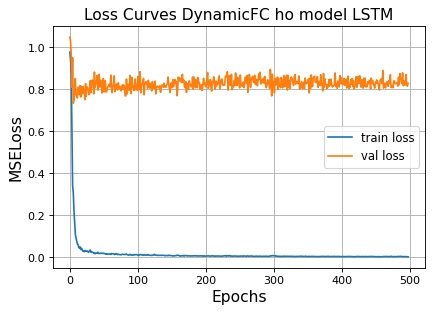

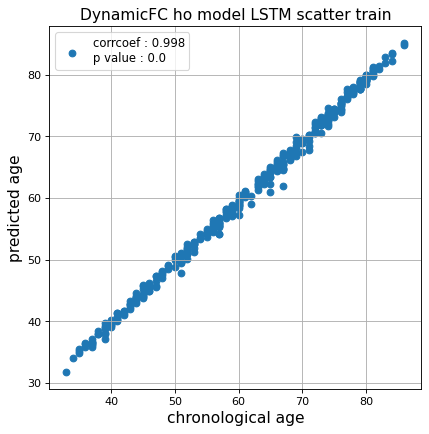

r^2 train data:  0.9936753792246091


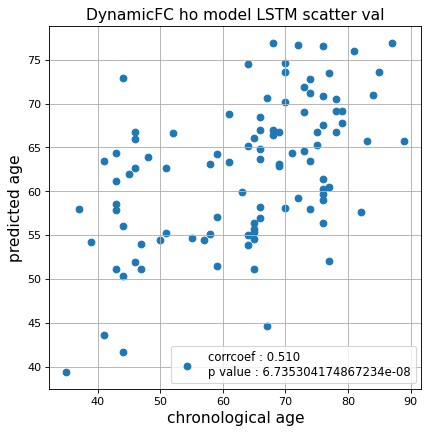

r^2 val data:  0.2396910200489193


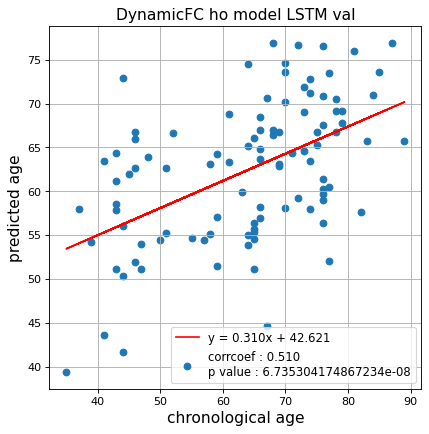

切片: 42.620808909553055
傾き: 0.3095573631533431
Kfold: 3 ::: epoch: 100, loss: 0.011674701379468808, val loss: 0.6001715511083603
Kfold: 3 ::: epoch: 200, loss: 0.007369741367606016, val loss: 0.5378684997558594
Kfold: 3 ::: epoch: 300, loss: 0.00514780910900579, val loss: 0.5543709397315979
Kfold: 3 ::: epoch: 400, loss: 0.0038487276044459296, val loss: 0.5622573047876358
Kfold: 3 ::: epoch: 500, loss: 0.003307568348156145, val loss: 0.5694348588585854
early stopping
save_epochs:356
best val loss:0.47050686925649643


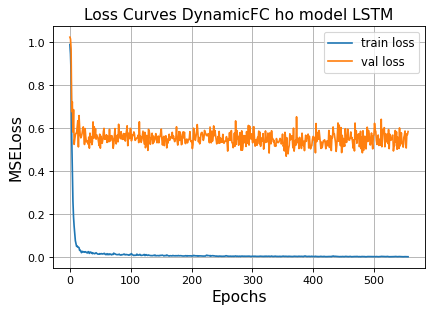

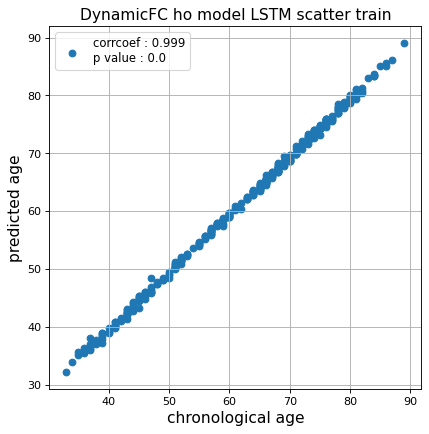

r^2 train data:  0.9969333518734179


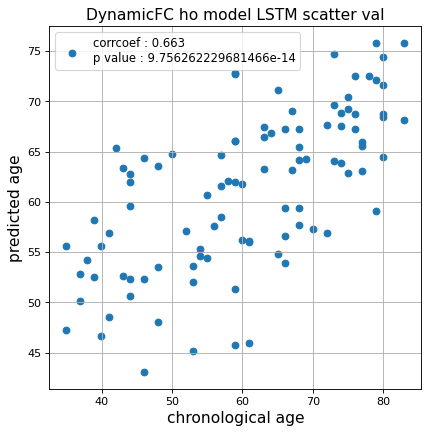

r^2 val data:  0.4315279967794122


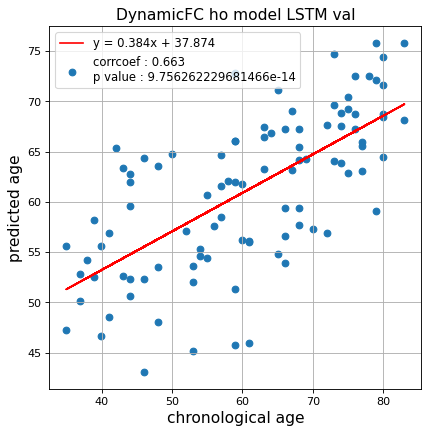

切片: 37.87358744968682
傾き: 0.3835217182863107
Kfold: 4 ::: epoch: 100, loss: 0.014376422032140769, val loss: 1.1906489878892899
Kfold: 4 ::: epoch: 200, loss: 0.009578644405477323, val loss: 1.1801215708255768
Kfold: 4 ::: epoch: 300, loss: 0.005699291861114593, val loss: 1.1956533789634705
Kfold: 4 ::: epoch: 400, loss: 0.004366712465595741, val loss: 1.2548332512378693
Kfold: 4 ::: epoch: 500, loss: 0.0034638971018676576, val loss: 1.1781145632266998
Kfold: 4 ::: epoch: 600, loss: 0.0030646539436509977, val loss: 1.164733573794365
Kfold: 4 ::: epoch: 700, loss: 0.0027915284825632204, val loss: 1.1416726261377335
save_epochs:597
best val loss:1.0664656460285187


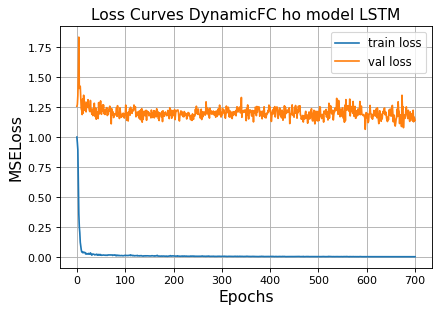

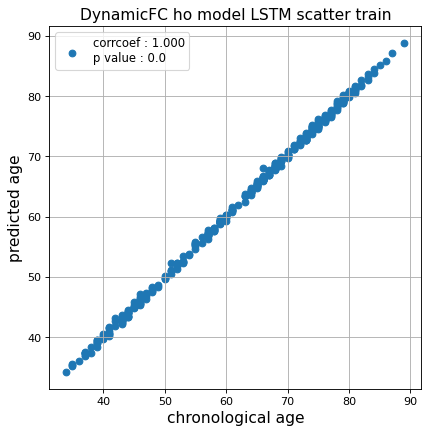

r^2 train data:  0.9988714764540044


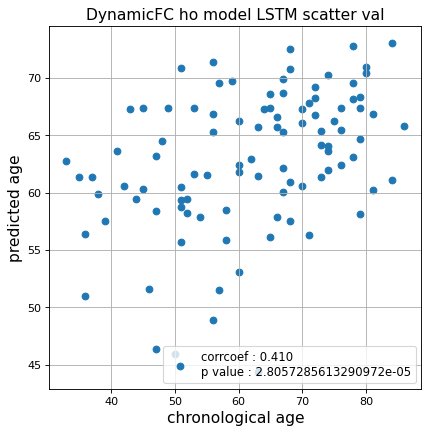

r^2 val data:  0.16154153918109493


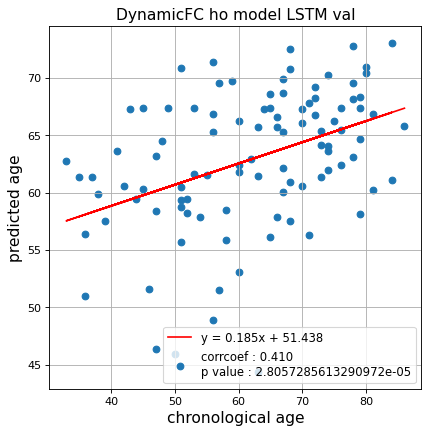

切片: 51.437812325974164
傾き: 0.18523271343118522
Kfold: 5 ::: epoch: 100, loss: 0.010690755067536464, val loss: 0.8185305297374725
Kfold: 5 ::: epoch: 200, loss: 0.008097421700278154, val loss: 0.7858337312936783
Kfold: 5 ::: epoch: 300, loss: 0.005227343197195576, val loss: 0.7762586027383804
Kfold: 5 ::: epoch: 400, loss: 0.004652447174661434, val loss: 0.8056025356054306
Kfold: 5 ::: epoch: 500, loss: 0.0035528649146167133, val loss: 0.8024592399597168
Kfold: 5 ::: epoch: 600, loss: 0.0032719390359348976, val loss: 0.7657206952571869
early stopping
save_epochs:446
best val loss:0.7388585954904556


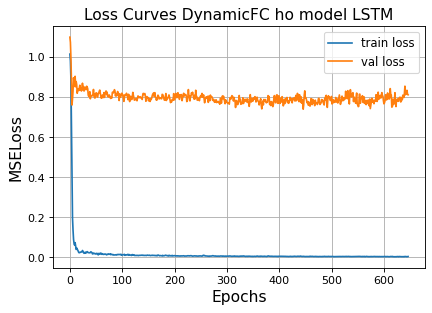

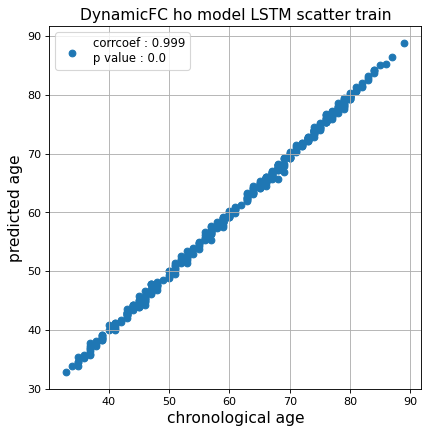

r^2 train data:  0.9980628134031122


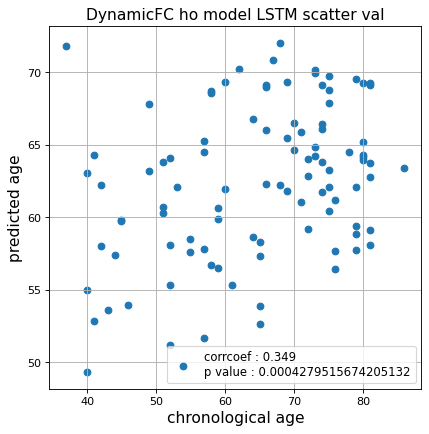

r^2 val data:  0.08859494482670249


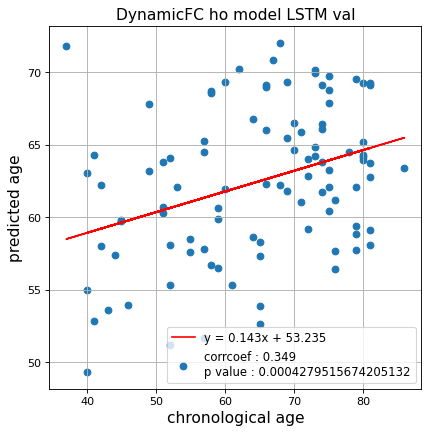

切片: 53.2349009608217
傾き: 0.14255629335678577
Nested Kfold ::: 3
Kfold: 1 ::: epoch: 100, loss: 0.014343696216551157, val loss: 0.563428521156311
Kfold: 1 ::: epoch: 200, loss: 0.010885007715282531, val loss: 0.5590258613228798
Kfold: 1 ::: epoch: 300, loss: 0.004588863704926693, val loss: 0.5116586461663246
Kfold: 1 ::: epoch: 400, loss: 0.0036748617242735168, val loss: 0.502252995967865
Kfold: 1 ::: epoch: 500, loss: 0.0030086810628955182, val loss: 0.5002535581588745
Kfold: 1 ::: epoch: 600, loss: 0.002519023524095806, val loss: 0.49259336292743683
Kfold: 1 ::: epoch: 700, loss: 0.0023916010529949116, val loss: 0.4912940263748169
save_epochs:674
best val loss:0.45727915316820145


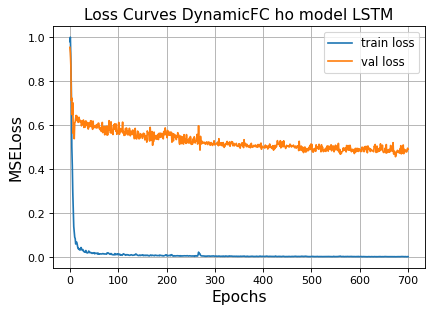

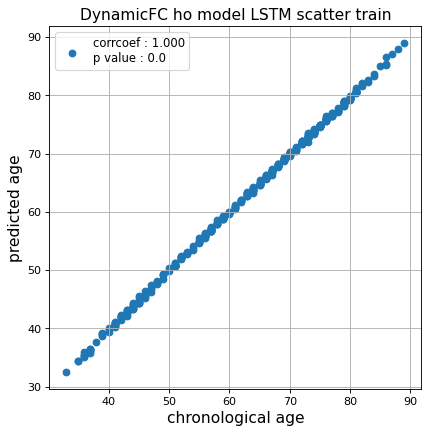

r^2 train data:  0.9993845835694781


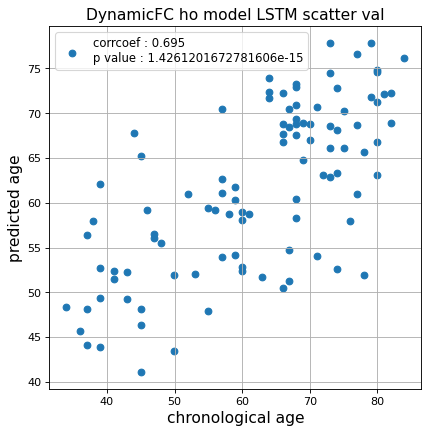

r^2 val data:  0.48219107697449326


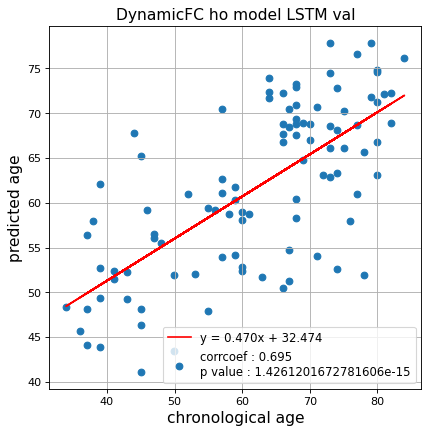

切片: 32.47425756463413
傾き: 0.47041271330177226
Kfold: 2 ::: epoch: 100, loss: 0.013213091314985203, val loss: 0.5547094941139221
Kfold: 2 ::: epoch: 200, loss: 0.006338712651855671, val loss: 0.5730719119310379
Kfold: 2 ::: epoch: 300, loss: 0.004623589105904102, val loss: 0.5850996673107147
Kfold: 2 ::: epoch: 400, loss: 0.0048781100015800735, val loss: 0.541528906673193
Kfold: 2 ::: epoch: 500, loss: 0.0027664383479322377, val loss: 0.5393451359122992
Kfold: 2 ::: epoch: 600, loss: 0.002350489841774106, val loss: 0.5552257858216763
Kfold: 2 ::: epoch: 700, loss: 0.0019884505085288906, val loss: 0.5497605912387371
save_epochs:577
best val loss:0.5309567712247372


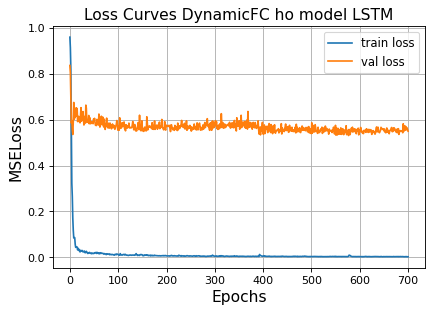

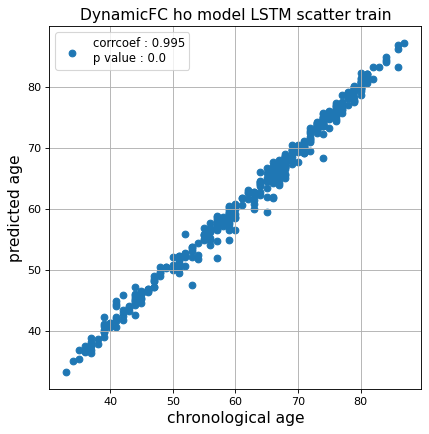

r^2 train data:  0.9902005593026305


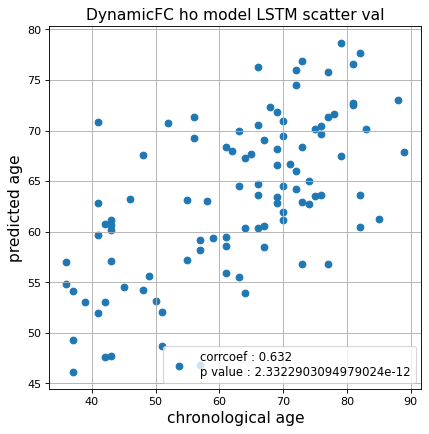

r^2 val data:  0.3889376346846585


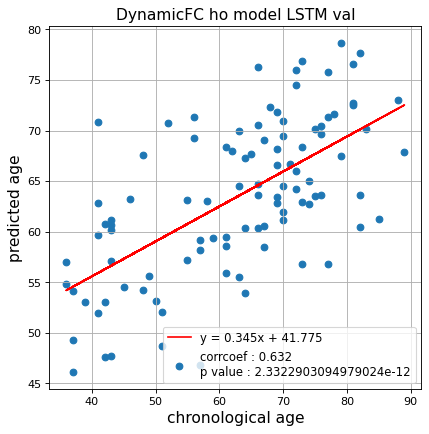

切片: 41.774863337591654
傾き: 0.3454115601138086
Kfold: 3 ::: epoch: 100, loss: 0.010969894866530713, val loss: 0.7215485274791718
Kfold: 3 ::: epoch: 200, loss: 0.008061344717414333, val loss: 0.6594994738698006
Kfold: 3 ::: epoch: 300, loss: 0.005689427668515306, val loss: 0.669307067990303
Kfold: 3 ::: epoch: 400, loss: 0.003925956302107527, val loss: 0.6927721947431564
early stopping
save_epochs:218
best val loss:0.6226533055305481


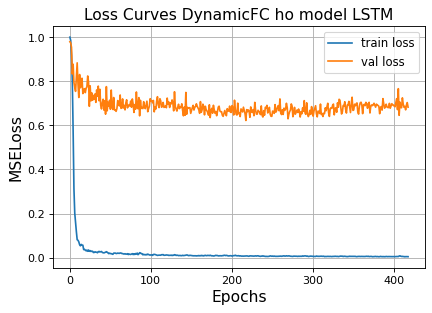

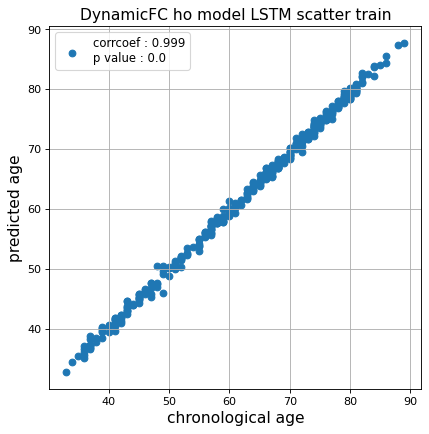

r^2 train data:  0.9965867245842058


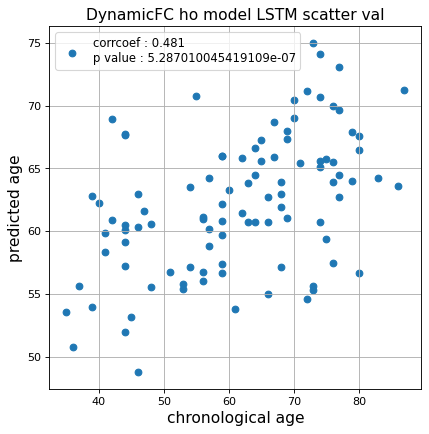

r^2 val data:  0.22327417548451


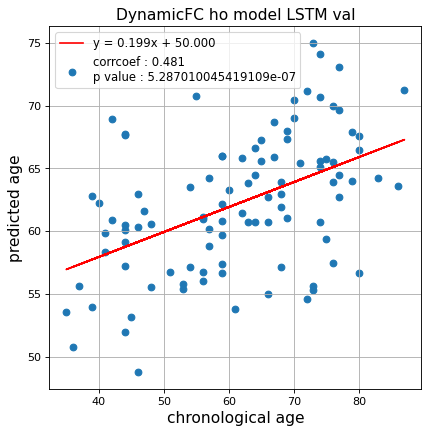

切片: 50.0004582950929
傾き: 0.19865975485360074
Kfold: 4 ::: epoch: 100, loss: 0.014064941340341018, val loss: 1.302079290151596
Kfold: 4 ::: epoch: 200, loss: 0.00835337763867126, val loss: 1.1872456967830658
Kfold: 4 ::: epoch: 300, loss: 0.005249846923666505, val loss: 1.1579022631049156
Kfold: 4 ::: epoch: 400, loss: 0.0043991806093030255, val loss: 1.2103993743658066
Kfold: 4 ::: epoch: 500, loss: 0.0037626159699776997, val loss: 1.2022377699613571
Kfold: 4 ::: epoch: 600, loss: 0.003960218495474412, val loss: 1.1508074253797531
Kfold: 4 ::: epoch: 700, loss: 0.003634773409710481, val loss: 1.1017068177461624
save_epochs:625
best val loss:1.083783581852913


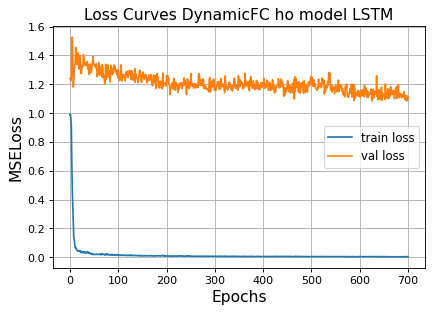

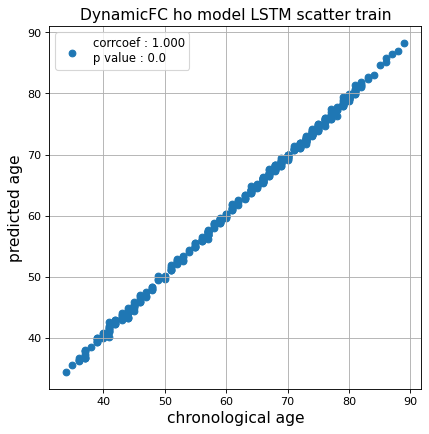

r^2 train data:  0.9983892918888115


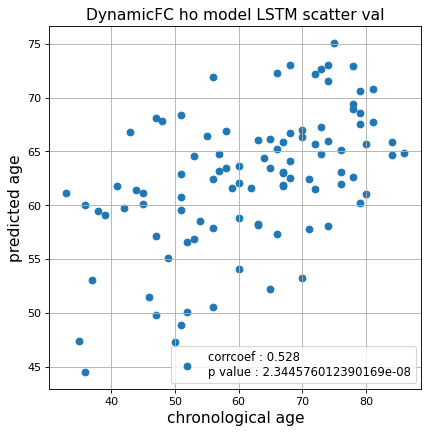

r^2 val data:  0.2745789223627332


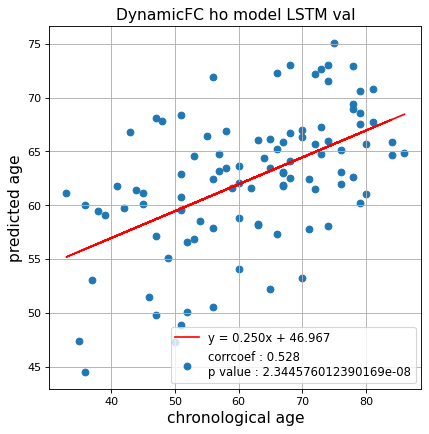

切片: 46.96689622345371
傾き: 0.24973664477137936
Kfold: 5 ::: epoch: 100, loss: 0.00830403740446155, val loss: 0.9975453317165375
Kfold: 5 ::: epoch: 200, loss: 0.005085691702193939, val loss: 0.9992681294679642
Kfold: 5 ::: epoch: 300, loss: 0.004243302750042998, val loss: 1.0503288358449936
Kfold: 5 ::: epoch: 400, loss: 0.0034903644297558526, val loss: 1.0423003733158112
early stopping
save_epochs:209
best val loss:0.9514942020177841


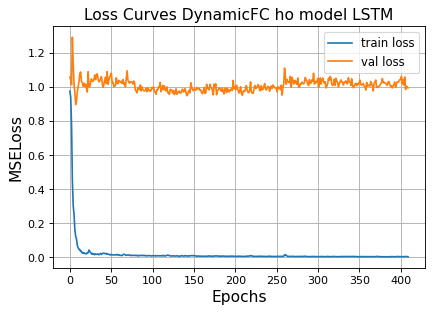

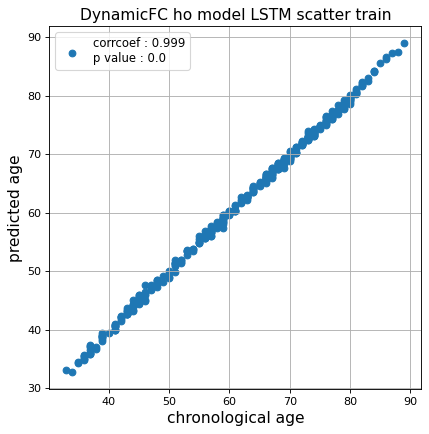

r^2 train data:  0.9985226267964455


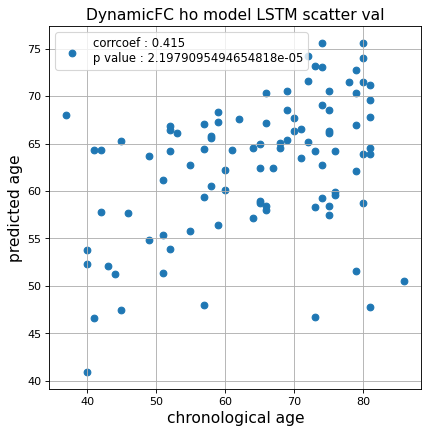

r^2 val data:  0.12510405296530713


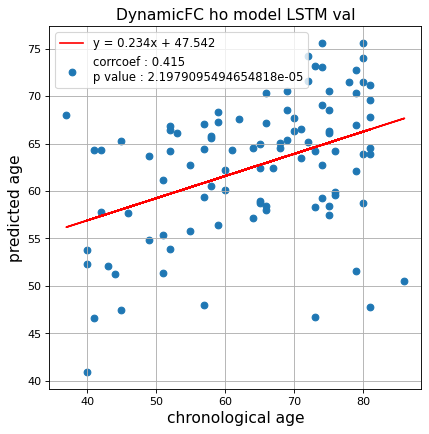

切片: 47.541664756357534
傾き: 0.2337720433455517
Nested Kfold ::: 4
Kfold: 1 ::: epoch: 100, loss: 0.014600794834013168, val loss: 0.5198532789945602
Kfold: 1 ::: epoch: 200, loss: 0.009272449542410098, val loss: 0.4839571937918663
Kfold: 1 ::: epoch: 300, loss: 0.00470532698986622, val loss: 0.46104946732521057
Kfold: 1 ::: epoch: 400, loss: 0.0037070086154227075, val loss: 0.453070305287838
Kfold: 1 ::: epoch: 500, loss: 0.0029837997504868186, val loss: 0.48400554060935974
Kfold: 1 ::: epoch: 600, loss: 0.0022656229378368994, val loss: 0.4564308747649193
early stopping
save_epochs:478
best val loss:0.43710486590862274


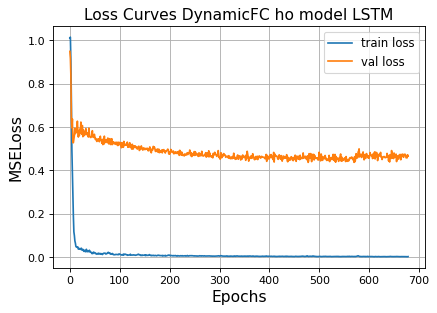

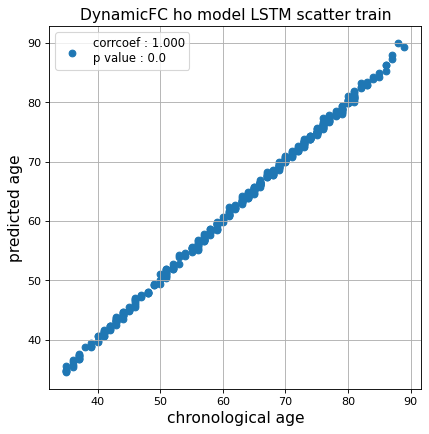

r^2 train data:  0.9988299728245035


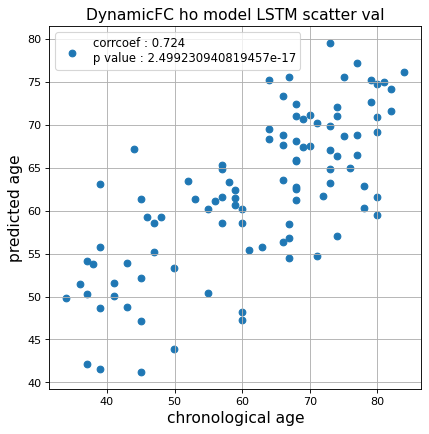

r^2 val data:  0.5180971408829778


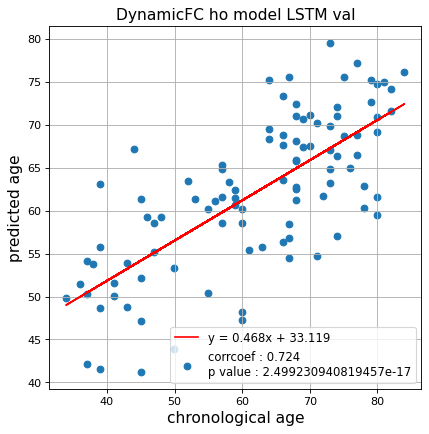

切片: 33.11900577884941
傾き: 0.46789634174671707
Kfold: 2 ::: epoch: 100, loss: 0.015478387045172544, val loss: 0.7318326383829117
Kfold: 2 ::: epoch: 200, loss: 0.00918851108648456, val loss: 0.7029168531298637
Kfold: 2 ::: epoch: 300, loss: 0.005638115340843797, val loss: 0.6766865998506546
Kfold: 2 ::: epoch: 400, loss: 0.005762389950597515, val loss: 0.7012399062514305
Kfold: 2 ::: epoch: 500, loss: 0.004355390717347081, val loss: 0.6708444356918335
Kfold: 2 ::: epoch: 600, loss: 0.004112776494226777, val loss: 0.6344079747796059
Kfold: 2 ::: epoch: 700, loss: 0.0024856540481918133, val loss: 0.6332033760845661
save_epochs:694
best val loss:0.6139283087104559


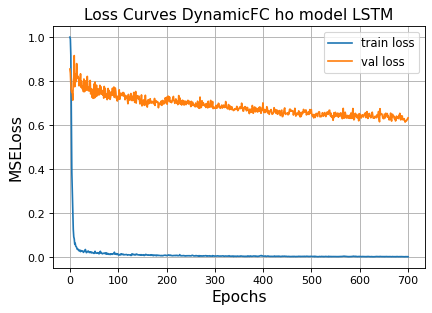

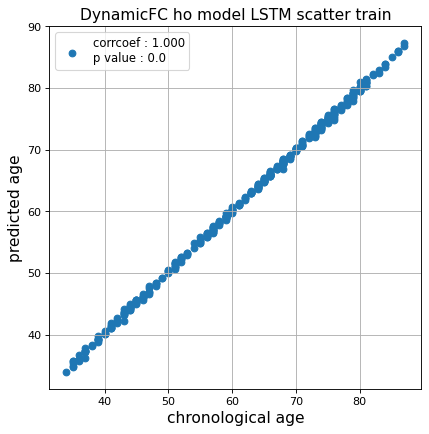

r^2 train data:  0.9992549896426324


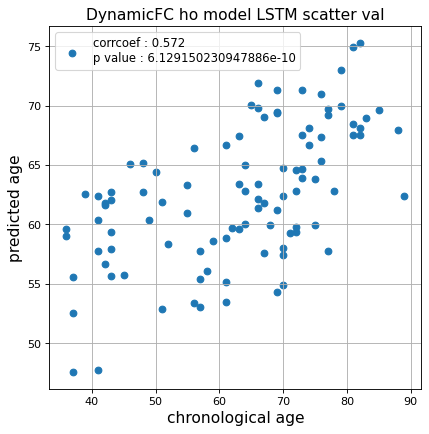

r^2 val data:  0.30024375240778


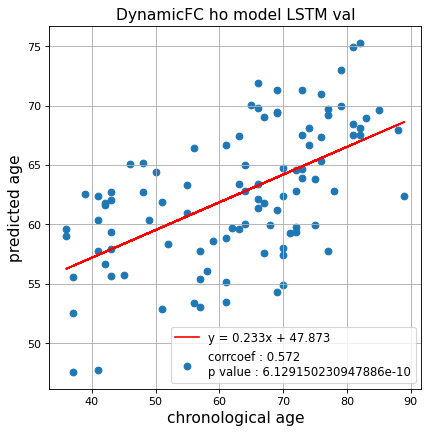

切片: 47.873357059651
傾き: 0.23330328230620184
Kfold: 3 ::: epoch: 100, loss: 0.010746343312068628, val loss: 0.6285786330699921
Kfold: 3 ::: epoch: 200, loss: 0.007182262300585325, val loss: 0.6116999834775925
Kfold: 3 ::: epoch: 300, loss: 0.004124271880405454, val loss: 0.613104909658432
Kfold: 3 ::: epoch: 400, loss: 0.0038008102072546114, val loss: 0.6264436691999435
Kfold: 3 ::: epoch: 500, loss: 0.003084532388199407, val loss: 0.6143717616796494
Kfold: 3 ::: epoch: 600, loss: 0.0026166173450362226, val loss: 0.6639731526374817
Kfold: 3 ::: epoch: 700, loss: 0.002418180641073447, val loss: 0.6686161905527115
save_epochs:587
best val loss:0.5579287260770798


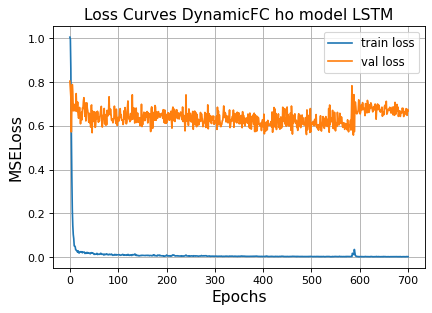

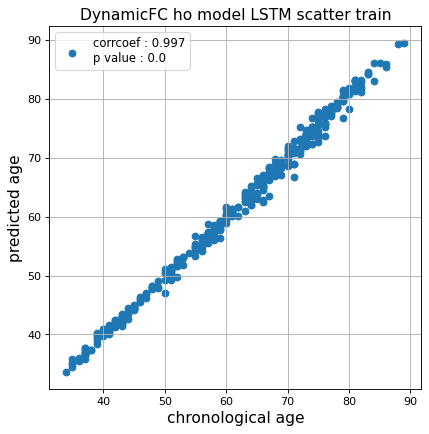

r^2 train data:  0.993726398957888


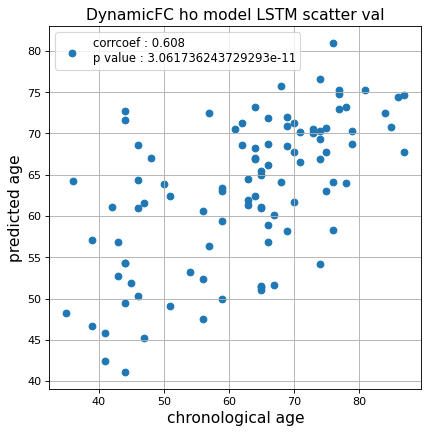

r^2 val data:  0.3632995397576554


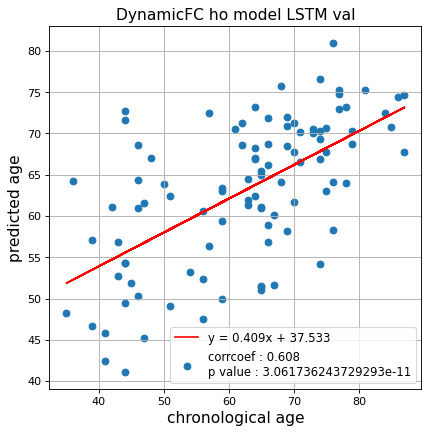

切片: 37.53290319714209
傾き: 0.40944123494451395
Kfold: 4 ::: epoch: 100, loss: 0.012456832381968316, val loss: 1.2644131779670715
Kfold: 4 ::: epoch: 200, loss: 0.008292652021806974, val loss: 1.286031886935234
Kfold: 4 ::: epoch: 300, loss: 0.005137275008914562, val loss: 1.1449057161808014
Kfold: 4 ::: epoch: 400, loss: 0.004340765227635319, val loss: 1.16977097094059
Kfold: 4 ::: epoch: 500, loss: 0.00396331693403996, val loss: 1.1374766379594803
Kfold: 4 ::: epoch: 600, loss: 0.0031090832870596876, val loss: 1.0522705018520355
Kfold: 4 ::: epoch: 700, loss: 0.0035291902649287996, val loss: 1.114665299654007
save_epochs:676
best val loss:1.0176819860935211


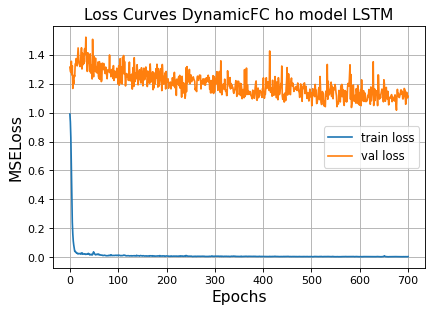

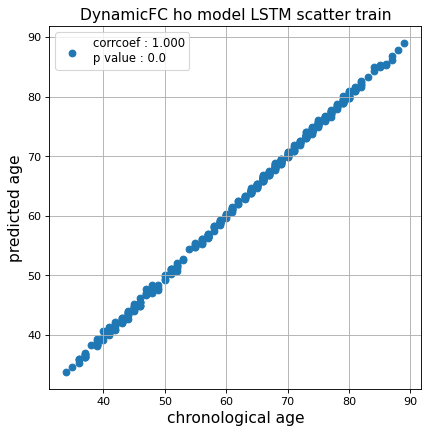

r^2 train data:  0.9988895538071902


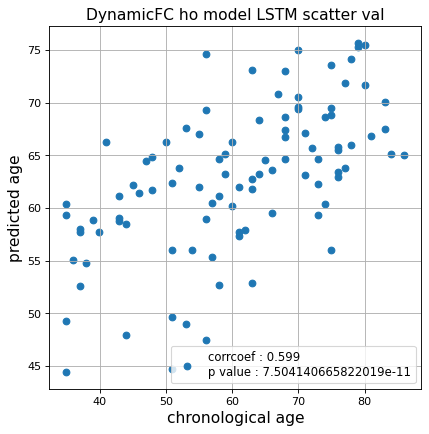

r^2 val data:  0.32586239368058045


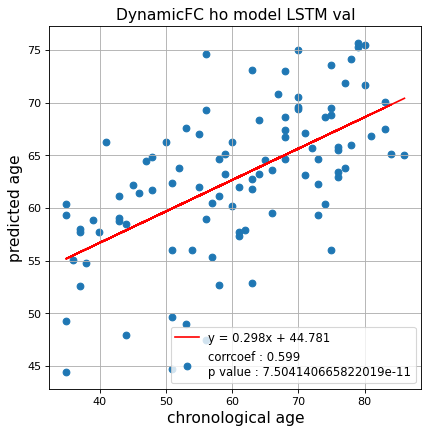

切片: 44.781250896099664
傾き: 0.29794908913079804
Kfold: 5 ::: epoch: 100, loss: 0.01228839409752534, val loss: 0.8477441519498825
Kfold: 5 ::: epoch: 200, loss: 0.008644946349354891, val loss: 0.8090453892946243
Kfold: 5 ::: epoch: 300, loss: 0.006196072450480782, val loss: 0.7816190272569656
Kfold: 5 ::: epoch: 400, loss: 0.004484247971469393, val loss: 0.736043319106102
Kfold: 5 ::: epoch: 500, loss: 0.0032004446256905794, val loss: 0.7252688407897949
Kfold: 5 ::: epoch: 600, loss: 0.003306783870077477, val loss: 0.7073926627635956
Kfold: 5 ::: epoch: 700, loss: 0.002571838782527126, val loss: 0.6540199816226959
save_epochs:700
best val loss:0.6540199816226959


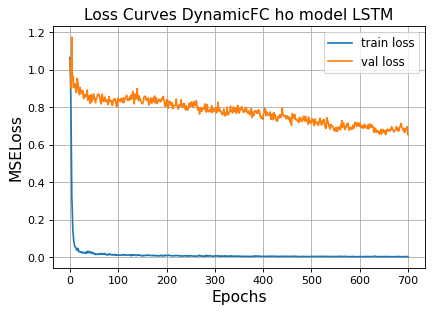

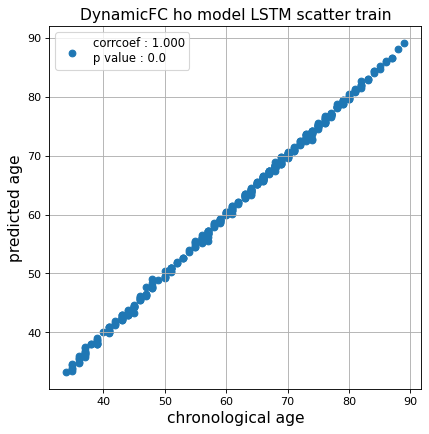

r^2 train data:  0.9989977890026723


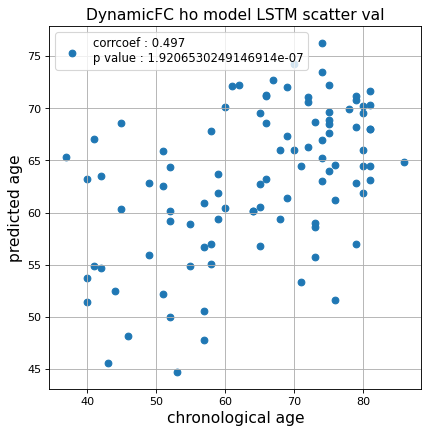

r^2 val data:  0.22945553165415677


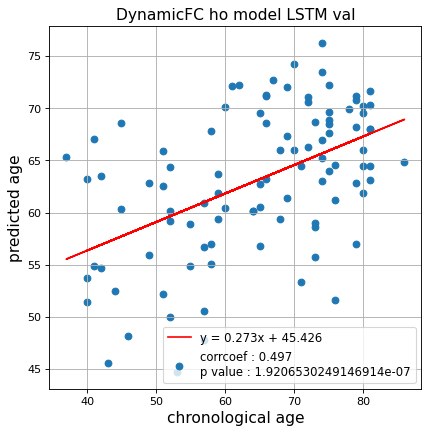

切片: 45.4263398080044
傾き: 0.27324176629223557
Nested Kfold ::: 5
Kfold: 1 ::: epoch: 100, loss: 0.015201427794706363, val loss: 0.5554535686969757
Kfold: 1 ::: epoch: 200, loss: 0.007785208702373963, val loss: 0.5268875062465668
Kfold: 1 ::: epoch: 300, loss: 0.004495676463613143, val loss: 0.5159301981329918
Kfold: 1 ::: epoch: 400, loss: 0.0041778972014211695, val loss: 0.48302797973155975
Kfold: 1 ::: epoch: 500, loss: 0.002829781975238942, val loss: 0.48071569949388504
Kfold: 1 ::: epoch: 600, loss: 0.0019438749071783745, val loss: 0.4502706602215767
Kfold: 1 ::: epoch: 700, loss: 0.0026093585004743477, val loss: 0.4377518519759178
save_epochs:698
best val loss:0.40086647868156433


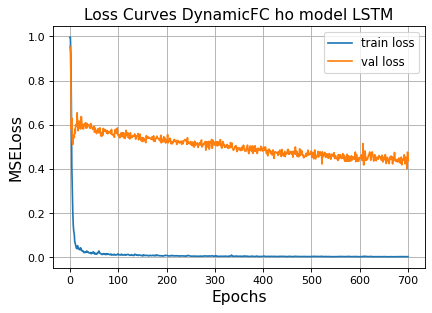

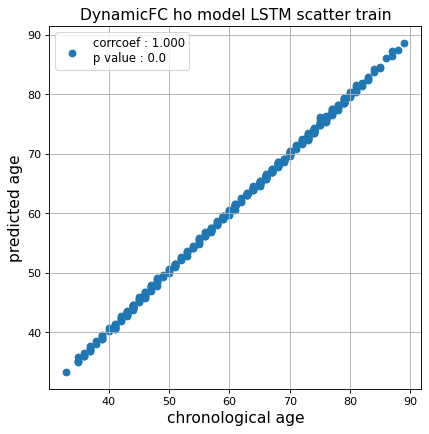

r^2 train data:  0.9992737093661463


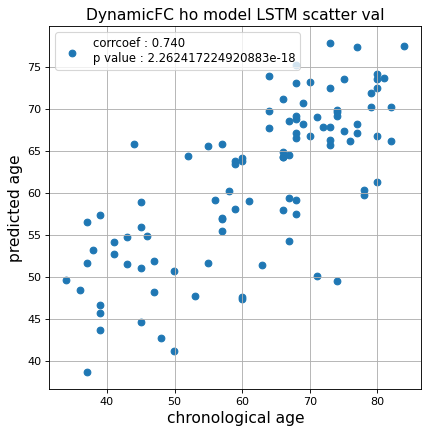

r^2 val data:  0.5421390283823411


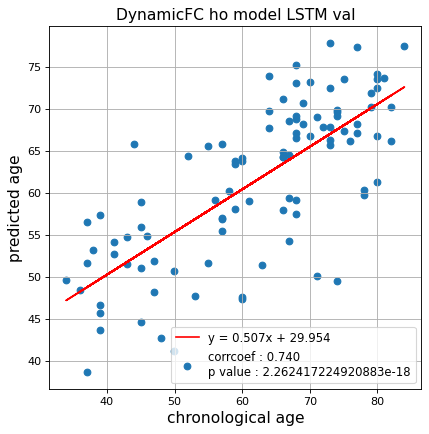

切片: 29.954465692172498
傾き: 0.5071953492554303
Kfold: 2 ::: epoch: 100, loss: 0.011608636938035488, val loss: 0.5724684558808804
Kfold: 2 ::: epoch: 200, loss: 0.005261095527272958, val loss: 0.5813088938593864
Kfold: 2 ::: epoch: 300, loss: 0.004204706575434942, val loss: 0.5817546844482422
Kfold: 2 ::: epoch: 400, loss: 0.004458359084450281, val loss: 0.5489071533083916
Kfold: 2 ::: epoch: 500, loss: 0.010490276062717805, val loss: 0.5570760481059551
Kfold: 2 ::: epoch: 600, loss: 0.0022939335142907044, val loss: 0.5335224494338036
Kfold: 2 ::: epoch: 700, loss: 0.002025702099602383, val loss: 0.5300711393356323
save_epochs:689
best val loss:0.5171437859535217


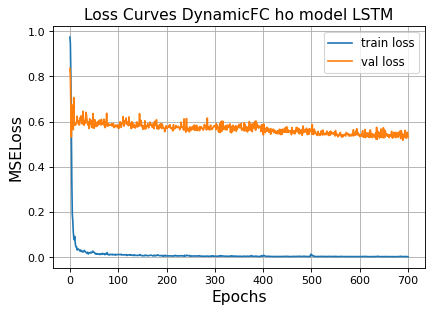

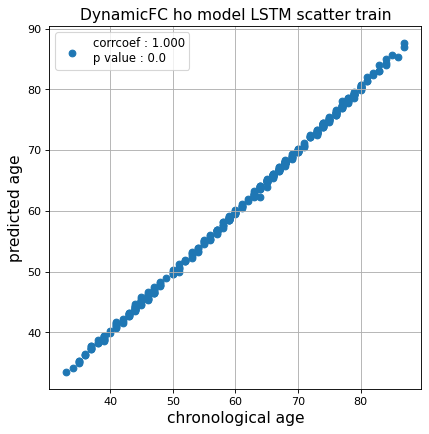

r^2 train data:  0.9993293485073347


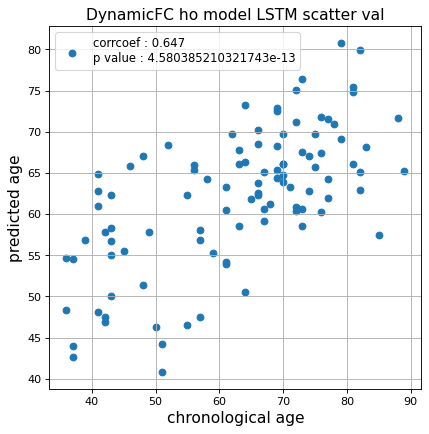

r^2 val data:  0.41504338531459073


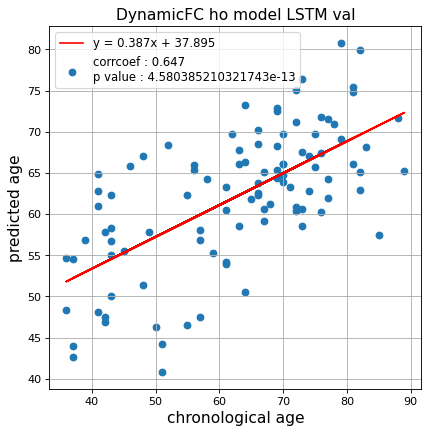

切片: 37.89539807784256
傾き: 0.3868816984323874
Kfold: 3 ::: epoch: 100, loss: 0.012748331440469393, val loss: 0.8025369346141815
Kfold: 3 ::: epoch: 200, loss: 0.00843066181271122, val loss: 0.8335685431957245
Kfold: 3 ::: epoch: 300, loss: 0.006450425331982283, val loss: 0.8171545565128326
Kfold: 3 ::: epoch: 400, loss: 0.0041603036403942565, val loss: 0.7793039530515671
early stopping
save_epochs:211
best val loss:0.7653017789125443


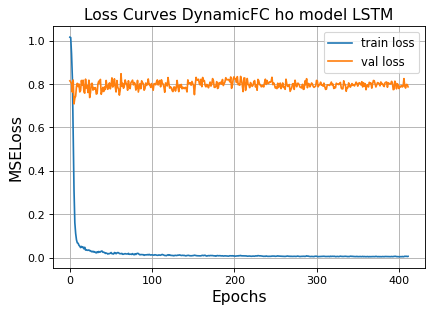

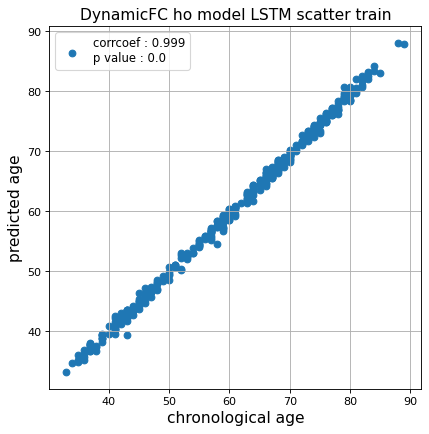

r^2 train data:  0.9965745012380829


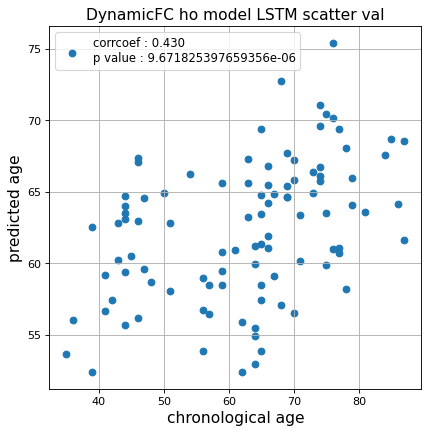

r^2 val data:  0.18153015494614577


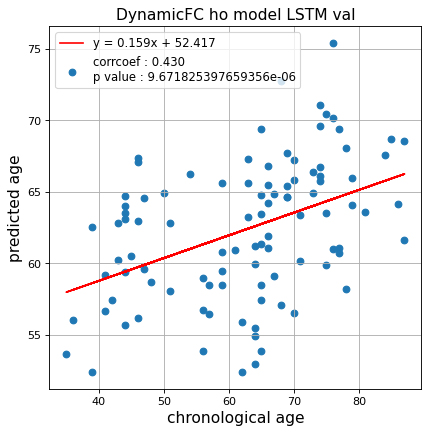

切片: 52.41708938533485
傾き: 0.15900780730897285
Kfold: 4 ::: epoch: 100, loss: 0.008280836260662628, val loss: 0.4712202697992325
Kfold: 4 ::: epoch: 200, loss: 0.006835536422351232, val loss: 0.4550960212945938
Kfold: 4 ::: epoch: 300, loss: 0.004282070628295724, val loss: 0.4878278002142906
Kfold: 4 ::: epoch: 400, loss: 0.003133872291073203, val loss: 0.4412876218557358
Kfold: 4 ::: epoch: 500, loss: 0.0028797451209706757, val loss: 0.42075346782803535
Kfold: 4 ::: epoch: 600, loss: 0.0018373936092337738, val loss: 0.45367856323719025
Kfold: 4 ::: epoch: 700, loss: 0.001962070192138736, val loss: 0.4336317107081413
save_epochs:520
best val loss:0.40997815132141113


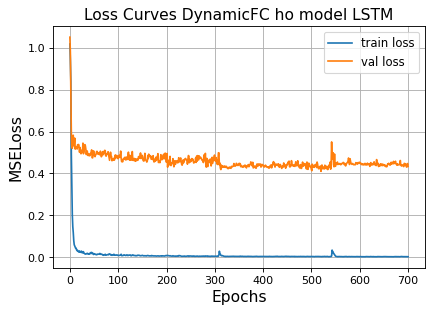

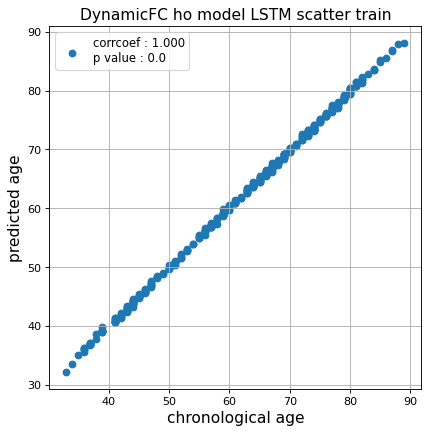

r^2 train data:  0.9994817026393168


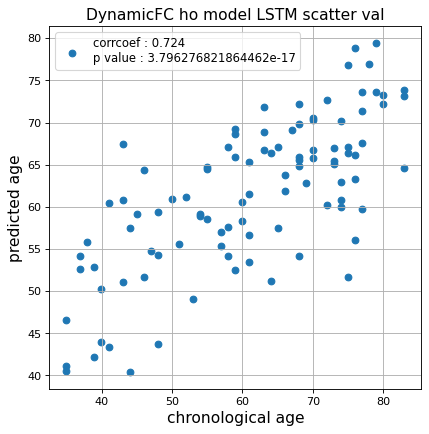

r^2 val data:  0.5185275530398652


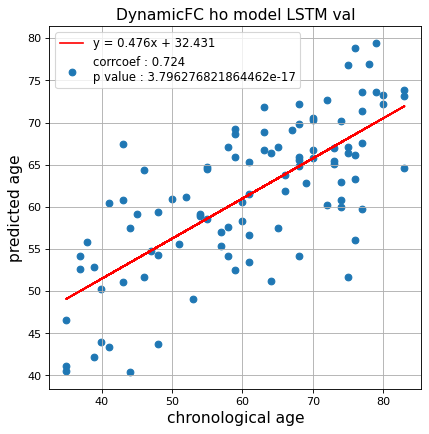

切片: 32.431054439249834
傾き: 0.47587923974034785
Kfold: 5 ::: epoch: 100, loss: 0.016291569990034286, val loss: 0.9427386075258255
Kfold: 5 ::: epoch: 200, loss: 0.005849399236747279, val loss: 0.9644395485520363
Kfold: 5 ::: epoch: 300, loss: 0.006232814397662878, val loss: 0.9127460718154907
Kfold: 5 ::: epoch: 400, loss: 0.004381252291540687, val loss: 0.9169421195983887
Kfold: 5 ::: epoch: 500, loss: 0.00291352690412448, val loss: 0.8922932147979736
Kfold: 5 ::: epoch: 600, loss: 0.0037775788492021654, val loss: 0.9099074155092239
Kfold: 5 ::: epoch: 700, loss: 0.003303630268559433, val loss: 0.8728618770837784
save_epochs:649
best val loss:0.7665356695652008


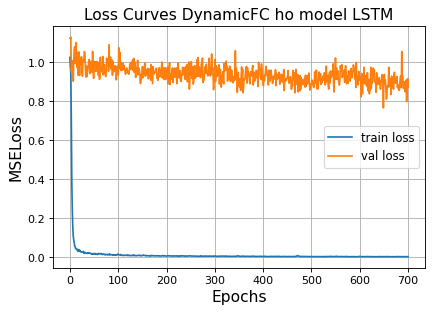

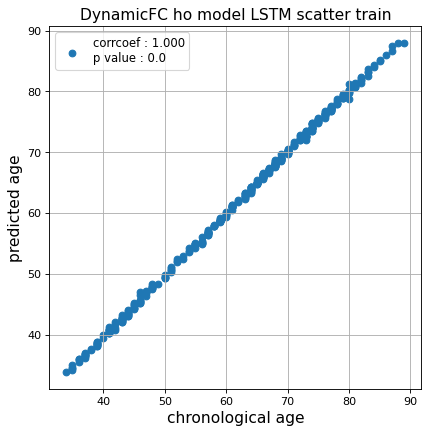

r^2 train data:  0.9991557774314997


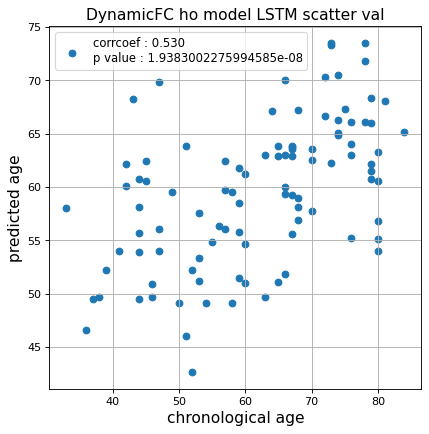

r^2 val data:  0.2519298090309826


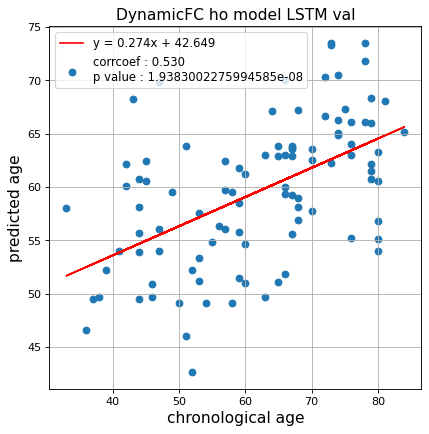

切片: 42.64875343643568
傾き: 0.2736149606190487
CPU times: user 1d 1h 2min 1s, sys: 3min 39s, total: 1d 1h 5min 41s
Wall time: 3h 52min 48s


In [16]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_ho_dynamic_1  = []
test_pred_ho_dynamic_corrected_1  = []
test_label_ho_dynamic_1 = []
test_idx_ho_dynamic_1   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_ho)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_dynamic_ho,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 700,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 128,
                                                           num_layers = 2,
                                                           fc_drop = 0.1,
                                                           bidirectional = False,
                                                           title = 'DynamicFC ho model LSTM'
                                                          )
    
    test_pred_ho_dynamic_1.append(test_pred)
    test_pred_ho_dynamic_corrected_1.append(test_pred_corrected)
    test_label_ho_dynamic_1.append(test_label)
    test_idx_ho_dynamic_1.append(test_idx)

### Dynamic FC 2

Nested Kfold ::: 1
Kfold: 1 ::: epoch: 100, loss: 0.012798971818903318, val loss: 0.5013948753476143
Kfold: 1 ::: epoch: 200, loss: 0.007341931574046612, val loss: 0.5002658851444721
Kfold: 1 ::: epoch: 300, loss: 0.004949291379979024, val loss: 0.5003445651382208
Kfold: 1 ::: epoch: 400, loss: 0.004885038020662391, val loss: 0.4842552151530981
Kfold: 1 ::: epoch: 500, loss: 0.004190992671423233, val loss: 0.4823815729469061
Kfold: 1 ::: epoch: 600, loss: 0.004365402596214643, val loss: 0.4728754349052906
Kfold: 1 ::: epoch: 700, loss: 0.0036691166997815552, val loss: 0.4795323833823204
save_epochs:593
best val loss:0.4485335163772106


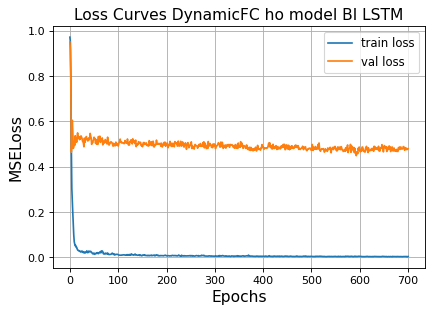

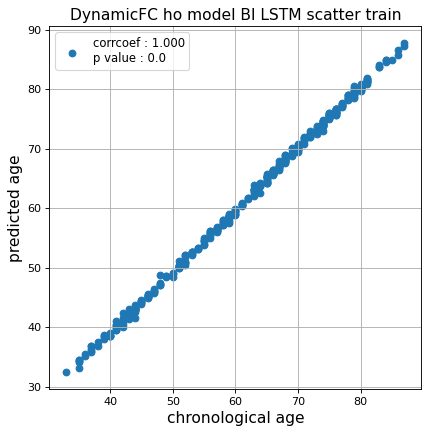

r^2 train data:  0.9975086022220954


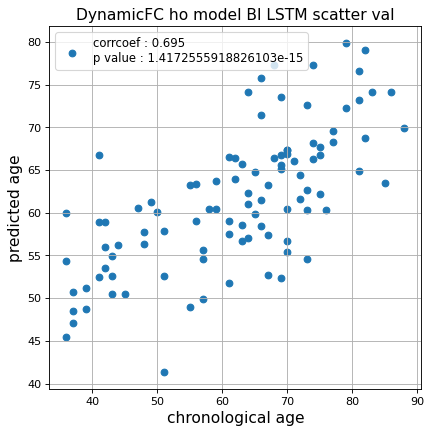

r^2 val data:  0.47111388523736397


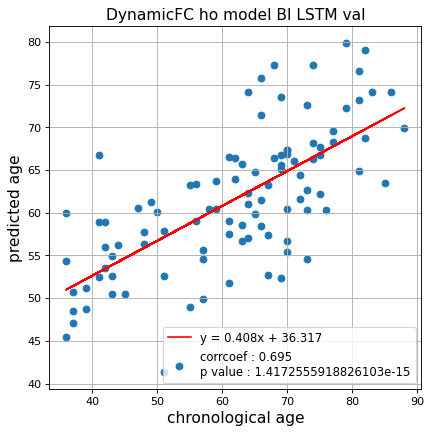

切片: 36.316863765547225
傾き: 0.4081699277800487
Kfold: 2 ::: epoch: 100, loss: 0.008939949079201771, val loss: 0.6639153808355331
Kfold: 2 ::: epoch: 200, loss: 0.006198638835205481, val loss: 0.7135235518217087
Kfold: 2 ::: epoch: 300, loss: 0.005147122545167804, val loss: 0.6821701675653458
Kfold: 2 ::: epoch: 400, loss: 0.003852013364219322, val loss: 0.7075210511684418
Kfold: 2 ::: epoch: 500, loss: 0.0030916212663914147, val loss: 0.6413380205631256
Kfold: 2 ::: epoch: 600, loss: 0.003185168983271489, val loss: 0.6483001410961151
Kfold: 2 ::: epoch: 700, loss: 0.0025988565936971167, val loss: 0.640134260058403
save_epochs:533
best val loss:0.615777000784874


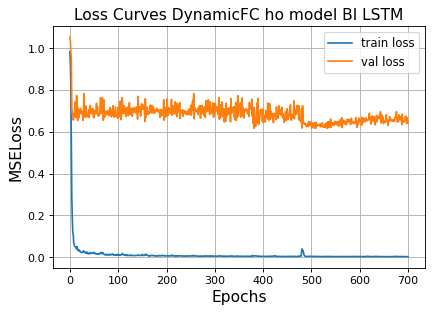

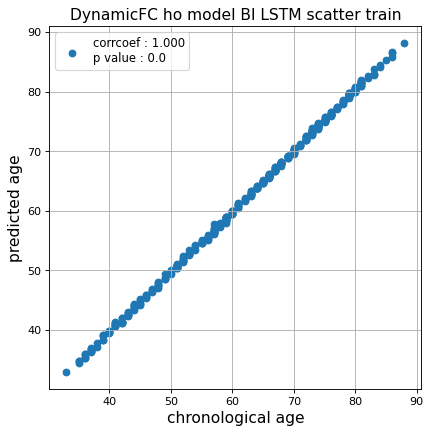

r^2 train data:  0.9992168729908492


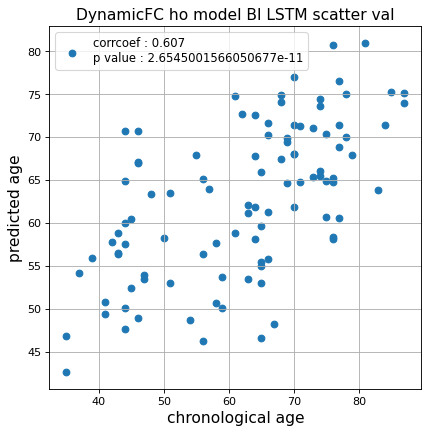

r^2 val data:  0.3640343978513646


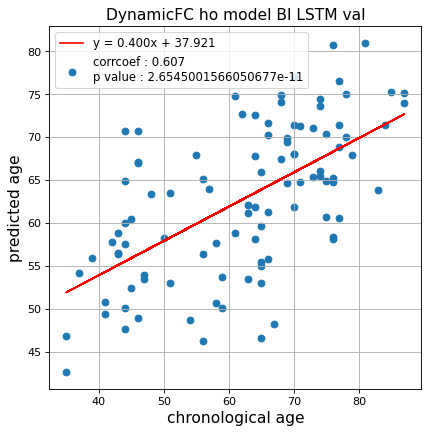

切片: 37.92139583983588
傾き: 0.39964083045577853
Kfold: 3 ::: epoch: 100, loss: 0.013061068808803191, val loss: 0.7640981525182724
Kfold: 3 ::: epoch: 200, loss: 0.005905754864215851, val loss: 0.6473818719387054
Kfold: 3 ::: epoch: 300, loss: 0.005468887062026904, val loss: 0.5960944443941116
Kfold: 3 ::: epoch: 400, loss: 0.0037693348534118673, val loss: 0.5164620876312256
Kfold: 3 ::: epoch: 500, loss: 0.0035470314144801637, val loss: 0.482608862221241
Kfold: 3 ::: epoch: 600, loss: 0.0026198144500645306, val loss: 0.49281155318021774
Kfold: 3 ::: epoch: 700, loss: 0.003011801056205653, val loss: 0.4466905891895294
save_epochs:692
best val loss:0.43740618601441383


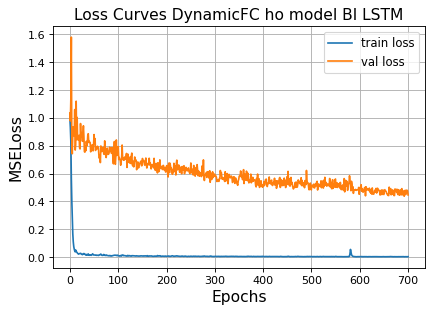

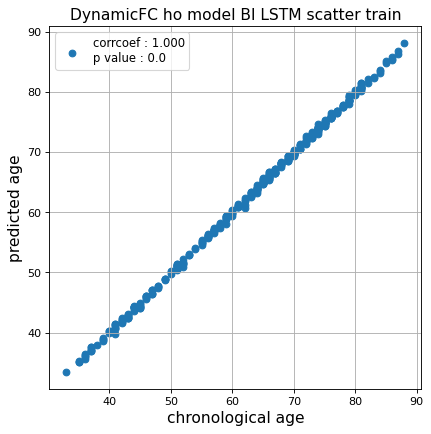

r^2 train data:  0.9992858562561825


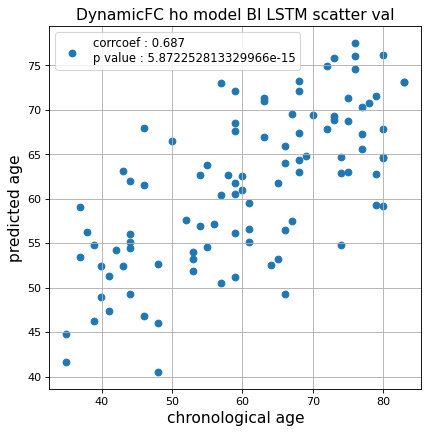

r^2 val data:  0.467028526713571


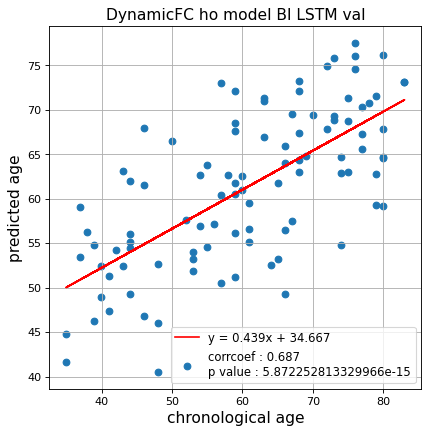

切片: 34.6671668543931
傾き: 0.43903755427726743
Kfold: 4 ::: epoch: 100, loss: 0.009086217659597214, val loss: 1.1355580762028694
Kfold: 4 ::: epoch: 200, loss: 0.006868262202120745, val loss: 1.1596090644598007
Kfold: 4 ::: epoch: 300, loss: 0.005978768404859763, val loss: 1.096144586801529
Kfold: 4 ::: epoch: 400, loss: 0.003502849955111742, val loss: 1.1126057729125023
early stopping
save_epochs:258
best val loss:1.026663325726986


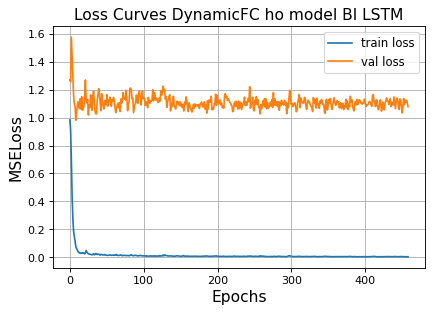

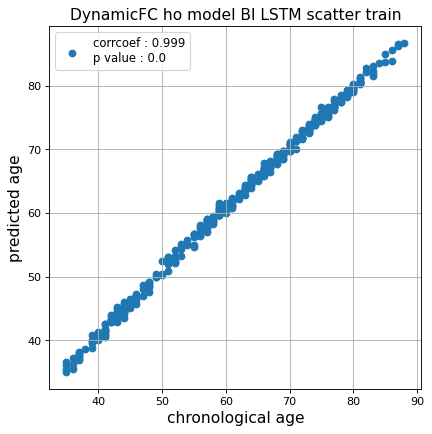

r^2 train data:  0.9953512287637073


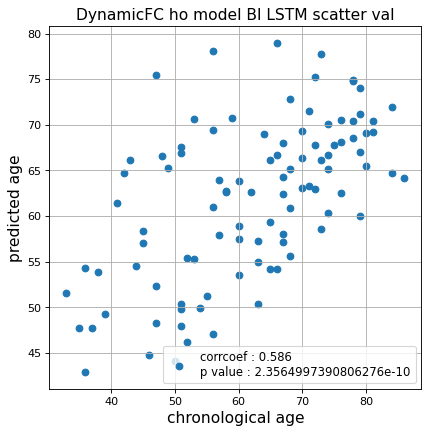

r^2 val data:  0.3395951038578744


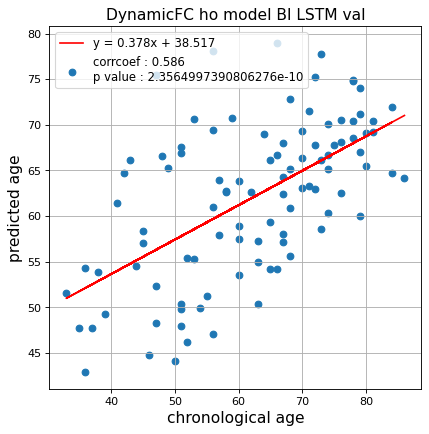

切片: 38.51743973860874
傾き: 0.3778924304111308
Kfold: 5 ::: epoch: 100, loss: 0.013415264897048473, val loss: 1.0756536573171616
Kfold: 5 ::: epoch: 200, loss: 0.00960273460413401, val loss: 1.0071185231208801
Kfold: 5 ::: epoch: 300, loss: 0.006295871097021378, val loss: 0.9844465404748917
Kfold: 5 ::: epoch: 400, loss: 0.004752437951258169, val loss: 1.001898154616356
Kfold: 5 ::: epoch: 500, loss: 0.003986497803662832, val loss: 1.0051123350858688
early stopping
save_epochs:358
best val loss:0.9403666108846664


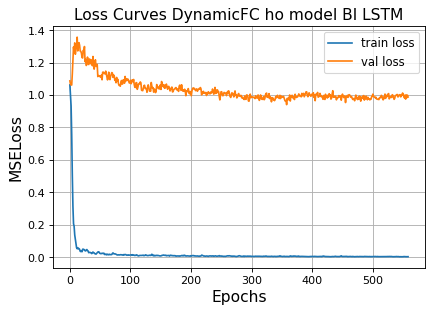

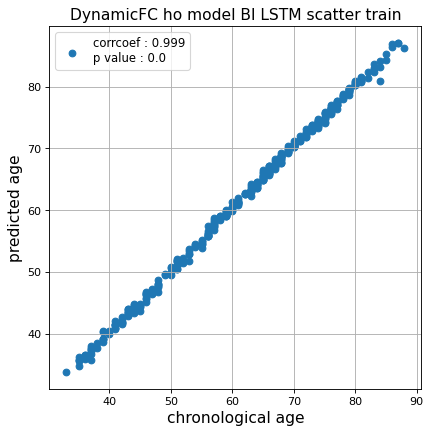

r^2 train data:  0.9979854613958659


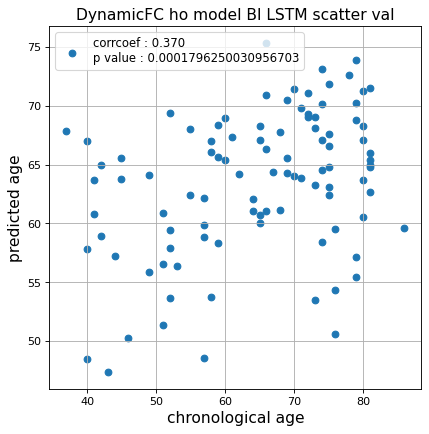

r^2 val data:  0.11670003202667123


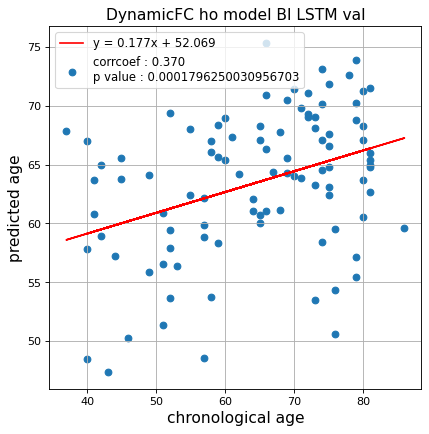

切片: 52.06858296062265
傾き: 0.17668642741198906
Nested Kfold ::: 2
Kfold: 1 ::: epoch: 100, loss: 0.012745739354823645, val loss: 0.573677271604538
Kfold: 1 ::: epoch: 200, loss: 0.0073455114347430375, val loss: 0.5606071278452873
Kfold: 1 ::: epoch: 300, loss: 0.0052098380939032025, val loss: 0.5362781882286072
Kfold: 1 ::: epoch: 400, loss: 0.0051198943267361475, val loss: 0.5099350363016129
Kfold: 1 ::: epoch: 500, loss: 0.004029710472633059, val loss: 0.4996982514858246
Kfold: 1 ::: epoch: 600, loss: 0.0037825860333843874, val loss: 0.4997762218117714
Kfold: 1 ::: epoch: 700, loss: 0.0030560735165356444, val loss: 0.47206010669469833
save_epochs:699
best val loss:0.46802887320518494


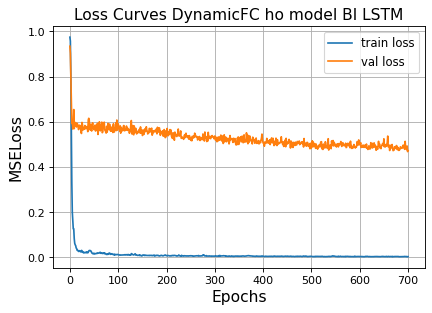

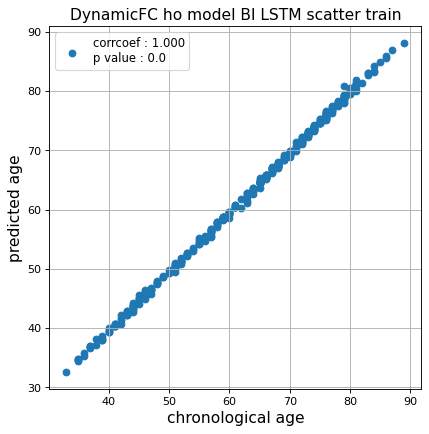

r^2 train data:  0.9982620039511678


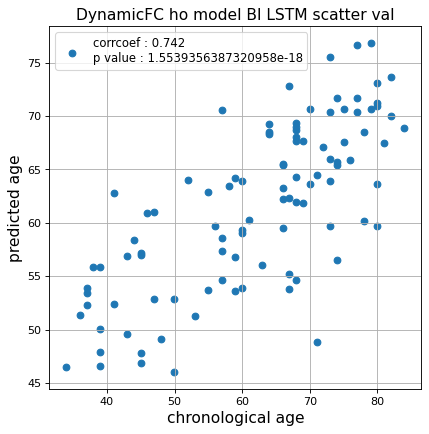

r^2 val data:  0.5195336948981133


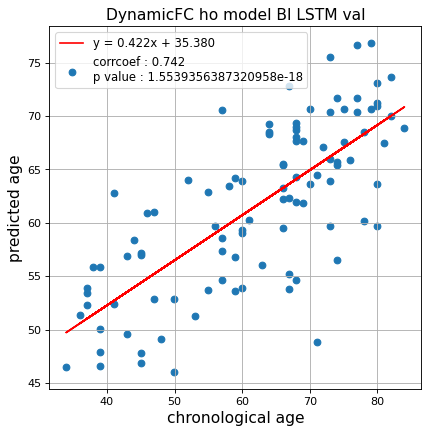

切片: 35.38041024019627
傾き: 0.42226101285854317
Kfold: 2 ::: epoch: 100, loss: 0.008068544073746754, val loss: 0.7775923013687134
Kfold: 2 ::: epoch: 200, loss: 0.005834055563005118, val loss: 0.8131951838731766
Kfold: 2 ::: epoch: 300, loss: 0.0051579850976570295, val loss: 0.8026449978351593
Kfold: 2 ::: epoch: 400, loss: 0.004034351754503755, val loss: 0.8002520799636841
early stopping
save_epochs:221
best val loss:0.7631121724843979


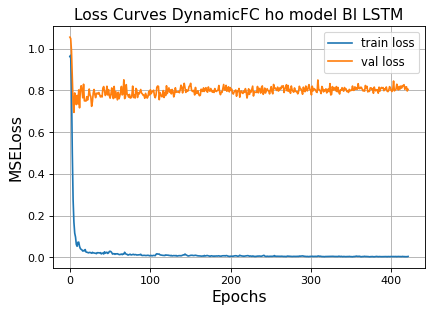

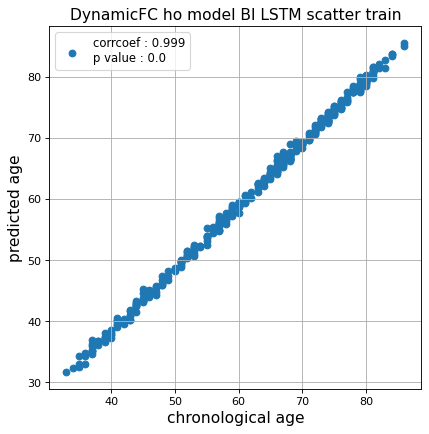

r^2 train data:  0.9924370883225531


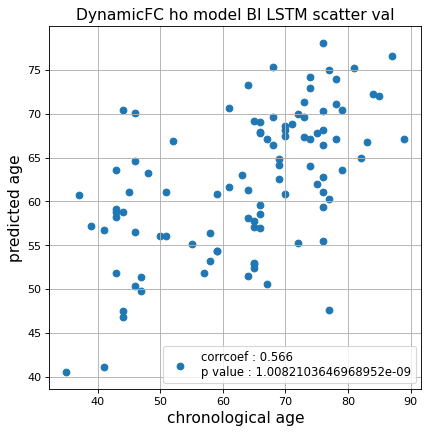

r^2 val data:  0.3064824352320955


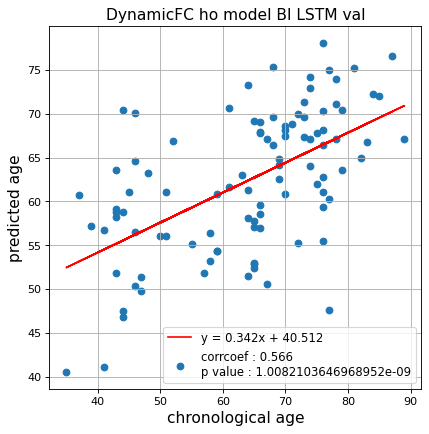

切片: 40.51195825305716
傾き: 0.34163035100701533
Kfold: 3 ::: epoch: 100, loss: 0.01268416761349027, val loss: 0.4955522380769253
Kfold: 3 ::: epoch: 200, loss: 0.007098120959618917, val loss: 0.5080680996179581
Kfold: 3 ::: epoch: 300, loss: 0.005339686884186589, val loss: 0.4979398548603058
Kfold: 3 ::: epoch: 400, loss: 0.003982924301033983, val loss: 0.4996034801006317
Kfold: 3 ::: epoch: 500, loss: 0.0034204161940858914, val loss: 0.5162186622619629
Kfold: 3 ::: epoch: 600, loss: 0.0028159160014743414, val loss: 0.5041451752185822
Kfold: 3 ::: epoch: 700, loss: 0.0030626647281818665, val loss: 0.4494808614253998
save_epochs:592
best val loss:0.4265222046524286


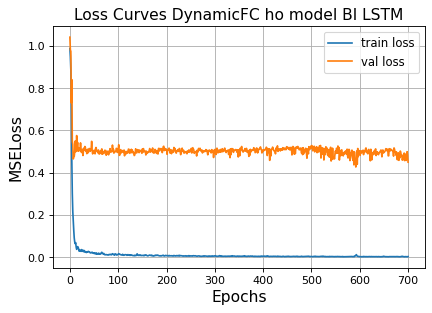

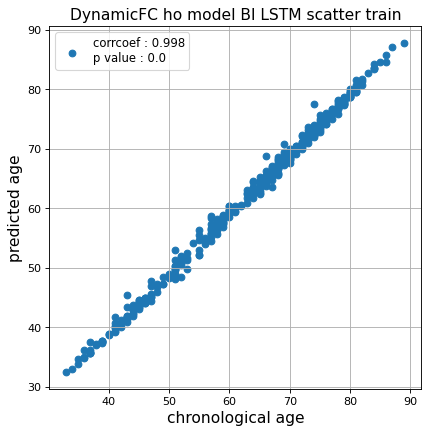

r^2 train data:  0.9909991844729289


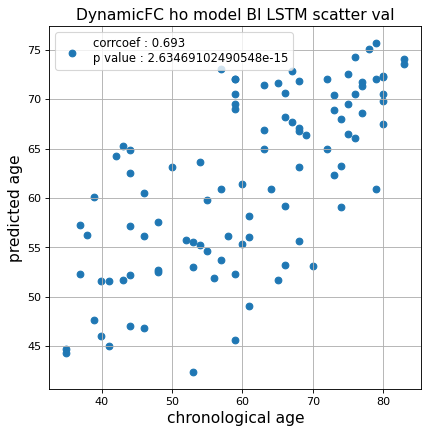

r^2 val data:  0.4728654938635545


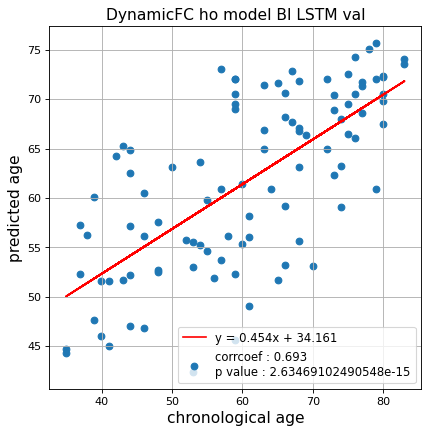

切片: 34.16125414020316
傾き: 0.4537698780535704
Kfold: 4 ::: epoch: 100, loss: 0.012835742332614385, val loss: 1.3599862456321716
Kfold: 4 ::: epoch: 200, loss: 0.007643334030245359, val loss: 1.3728960305452347
Kfold: 4 ::: epoch: 300, loss: 0.00594331814835851, val loss: 1.3776547610759735
Kfold: 4 ::: epoch: 400, loss: 0.005242852655311043, val loss: 1.3215865641832352
Kfold: 4 ::: epoch: 500, loss: 0.004122596520643968, val loss: 1.3127591758966446
Kfold: 4 ::: epoch: 600, loss: 0.0040248960722237825, val loss: 1.332852154970169
early stopping
save_epochs:422
best val loss:1.289057344198227


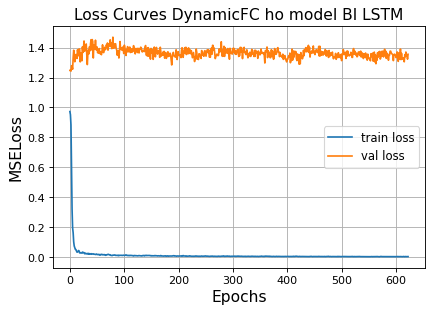

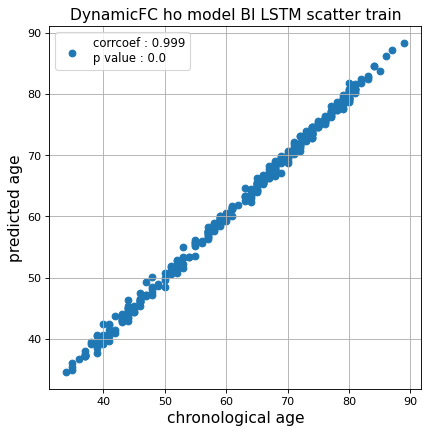

r^2 train data:  0.9974382174745562


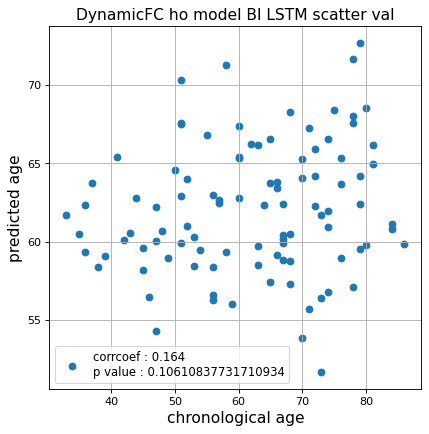

r^2 val data:  0.006295384144179739


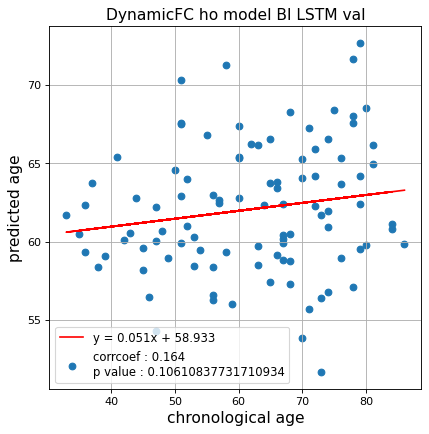

切片: 58.93285502039697
傾き: 0.05058398083073769
Kfold: 5 ::: epoch: 100, loss: 0.00944855254000196, val loss: 1.0233456939458847
Kfold: 5 ::: epoch: 200, loss: 0.005884122049722534, val loss: 0.9837213754653931
Kfold: 5 ::: epoch: 300, loss: 0.005516606383025646, val loss: 0.9724123775959015
Kfold: 5 ::: epoch: 400, loss: 0.003471793159126089, val loss: 0.9461093544960022
Kfold: 5 ::: epoch: 500, loss: 0.0032931126904888796, val loss: 0.9820986539125443
early stopping
save_epochs:330
best val loss:0.9148470014333725


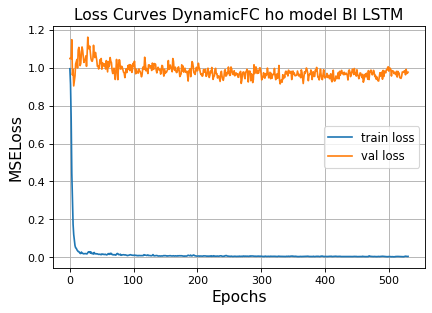

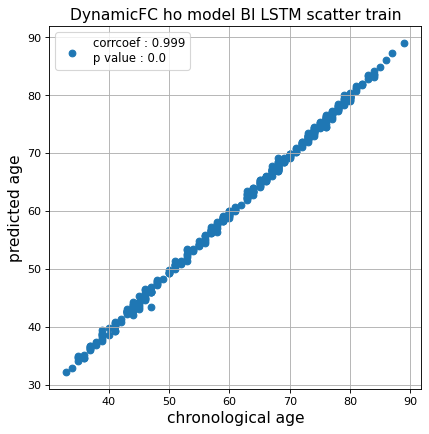

r^2 train data:  0.997741175745276


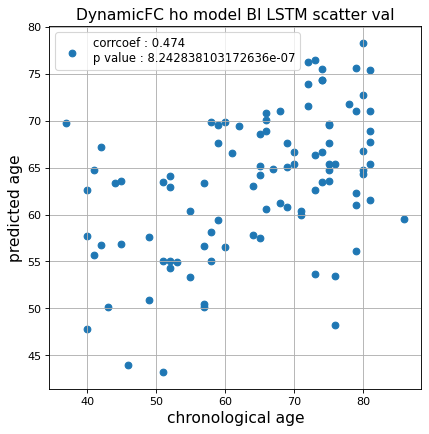

r^2 val data:  0.20058267386968276


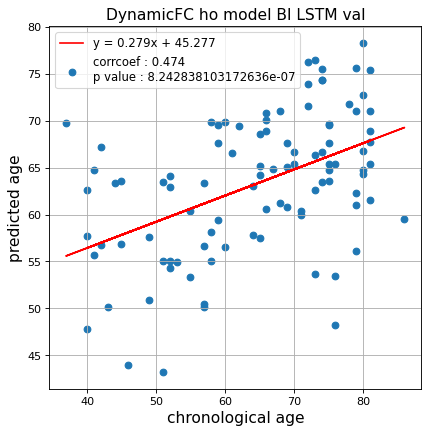

切片: 45.27656947974701
傾き: 0.2790843737757565
Nested Kfold ::: 3
Kfold: 1 ::: epoch: 100, loss: 0.01118496898561716, val loss: 0.6791483908891678
Kfold: 1 ::: epoch: 200, loss: 0.00600843674216706, val loss: 0.6654305756092072
Kfold: 1 ::: epoch: 300, loss: 0.005276087116306791, val loss: 0.6355387419462204
Kfold: 1 ::: epoch: 400, loss: 0.005205841717095329, val loss: 0.6063547432422638
Kfold: 1 ::: epoch: 500, loss: 0.00359990166571851, val loss: 0.5830152332782745
Kfold: 1 ::: epoch: 600, loss: 0.003580596521854974, val loss: 0.5709400027990341
Kfold: 1 ::: epoch: 700, loss: 0.003010854205618111, val loss: 0.5810818895697594
save_epochs:651
best val loss:0.5481556877493858


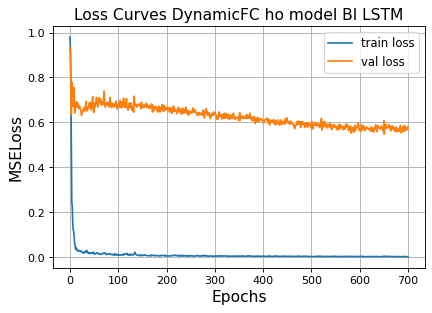

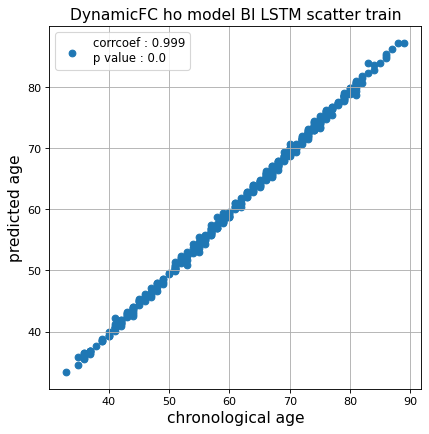

r^2 train data:  0.9971288665873772


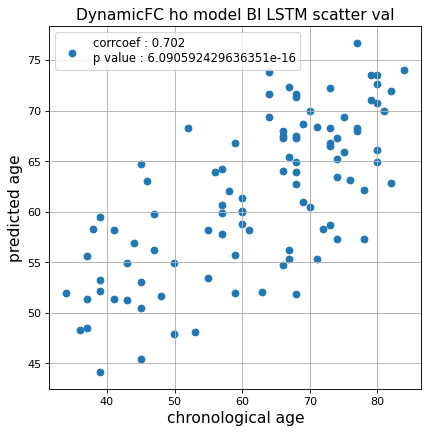

r^2 val data:  0.4697291747663648


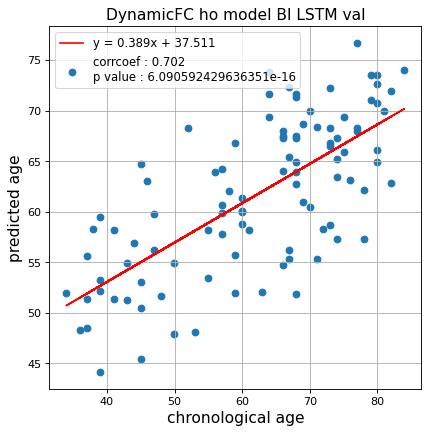

切片: 37.51133986058669
傾き: 0.3889624132725648
Kfold: 2 ::: epoch: 100, loss: 0.009067383791821508, val loss: 0.5327868908643723
Kfold: 2 ::: epoch: 200, loss: 0.00607166038109706, val loss: 0.5063583292067051
Kfold: 2 ::: epoch: 300, loss: 0.004800628745355285, val loss: 0.4855315536260605
Kfold: 2 ::: epoch: 400, loss: 0.004587480816273735, val loss: 0.4889959245920181
Kfold: 2 ::: epoch: 500, loss: 0.00364741687483799, val loss: 0.48701009526848793
Kfold: 2 ::: epoch: 600, loss: 0.003006366788982772, val loss: 0.4855813756585121
Kfold: 2 ::: epoch: 700, loss: 0.0028351285548594138, val loss: 0.47822994738817215
save_epochs:645
best val loss:0.46310494653880596


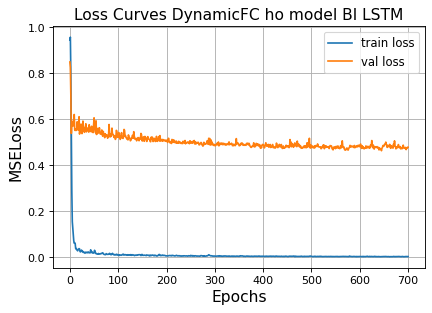

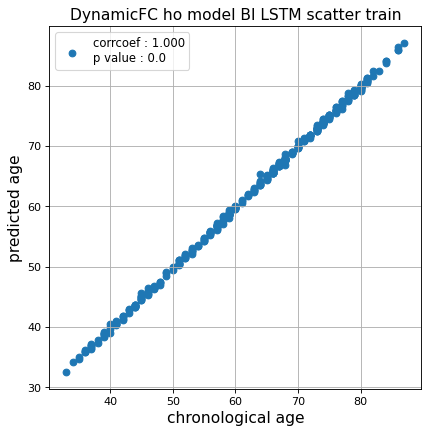

r^2 train data:  0.9992517692547648


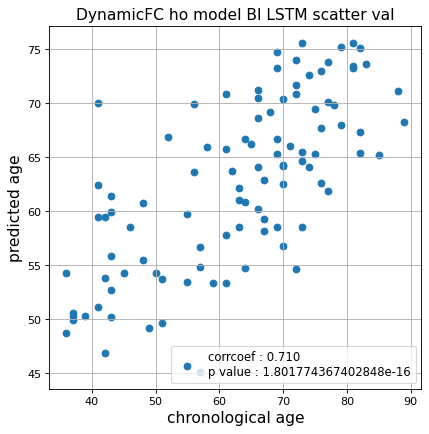

r^2 val data:  0.48114450101344564


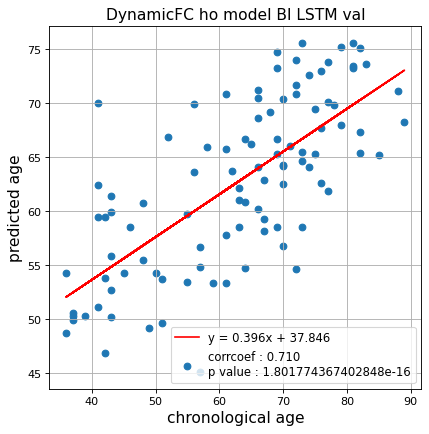

切片: 37.845906233127806
傾き: 0.39576111233059325
Kfold: 3 ::: epoch: 100, loss: 0.014054510276764631, val loss: 0.5947336256504059
Kfold: 3 ::: epoch: 200, loss: 0.006043742948140089, val loss: 0.5975170582532883
Kfold: 3 ::: epoch: 300, loss: 0.00702143249173577, val loss: 0.5736839920282364
Kfold: 3 ::: epoch: 400, loss: 0.0037734443680025064, val loss: 0.5379036888480186
Kfold: 3 ::: epoch: 500, loss: 0.0043524143178589065, val loss: 0.4758656397461891
Kfold: 3 ::: epoch: 600, loss: 0.0030148845622674204, val loss: 0.525306299328804
Kfold: 3 ::: epoch: 700, loss: 0.0024077910750817796, val loss: 0.5036004185676575
save_epochs:598
best val loss:0.42493519000709057


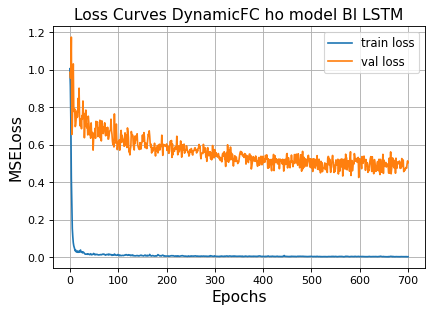

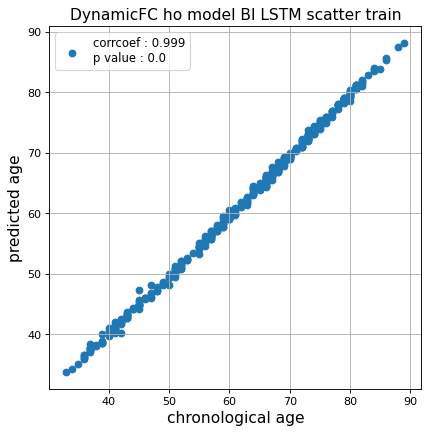

r^2 train data:  0.9979002085541825


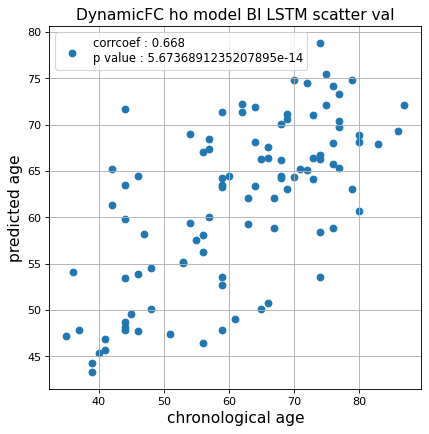

r^2 val data:  0.4461157963104687


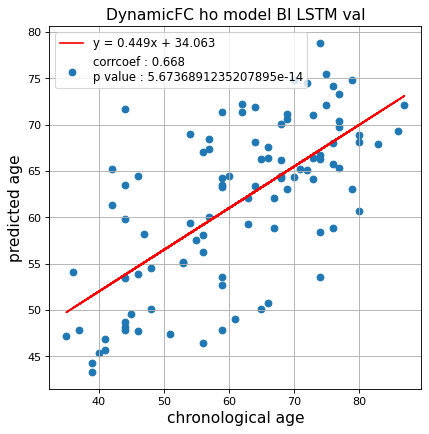

切片: 34.06348476636366
傾き: 0.4486625589634959
Kfold: 4 ::: epoch: 100, loss: 0.008147790401171032, val loss: 1.183073453605175
Kfold: 4 ::: epoch: 200, loss: 0.006108263023914053, val loss: 1.046043500304222
Kfold: 4 ::: epoch: 300, loss: 0.004249899504849544, val loss: 1.1100492179393768
Kfold: 4 ::: epoch: 400, loss: 0.0033288322424945924, val loss: 1.0947860777378082
Kfold: 4 ::: epoch: 500, loss: 0.002947602501640526, val loss: 0.9898729026317596
Kfold: 4 ::: epoch: 600, loss: 0.002762880874797702, val loss: 1.012529730796814
early stopping
save_epochs:485
best val loss:0.8749113976955414


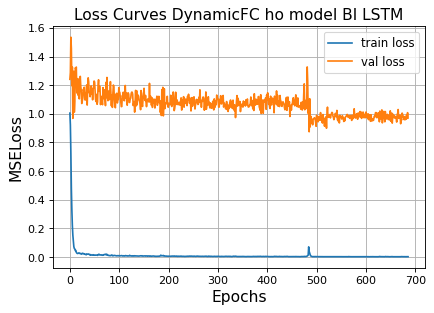

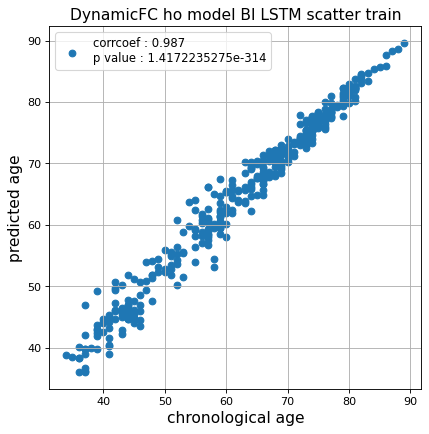

r^2 train data:  0.9422682451112055


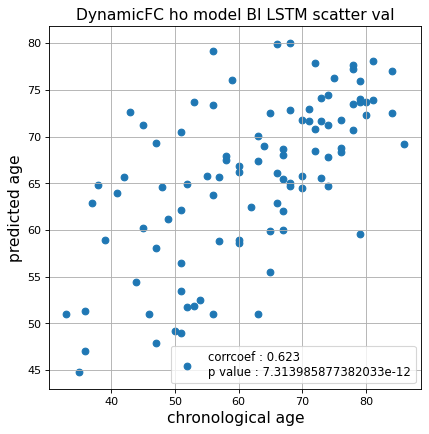

r^2 val data:  0.31262784763082807


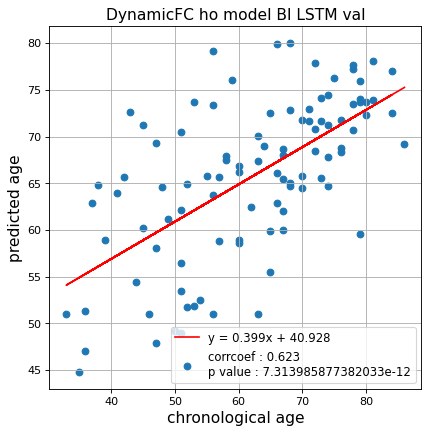

切片: 40.92798665010892
傾き: 0.3991577545609679
Kfold: 5 ::: epoch: 100, loss: 0.012075792639874496, val loss: 0.994360089302063
Kfold: 5 ::: epoch: 200, loss: 0.008382368761186417, val loss: 1.0563604086637497
Kfold: 5 ::: epoch: 300, loss: 0.007618265978705425, val loss: 1.062962532043457
Kfold: 5 ::: epoch: 400, loss: 0.005657762647248232, val loss: 1.0571184605360031
early stopping
save_epochs:218
best val loss:1.027099385857582


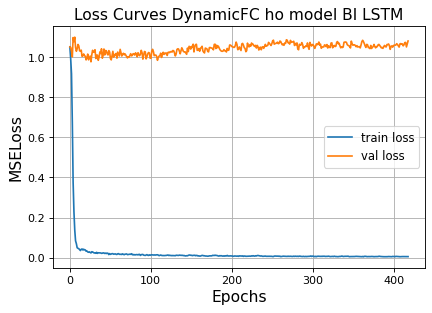

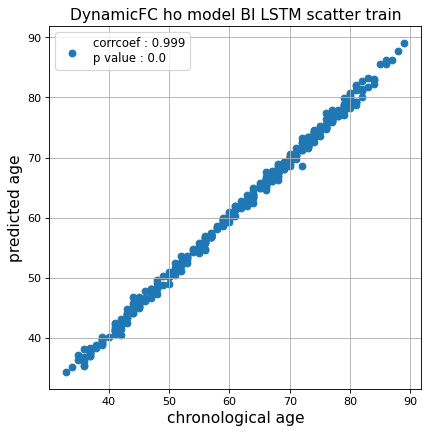

r^2 train data:  0.9966598462855314


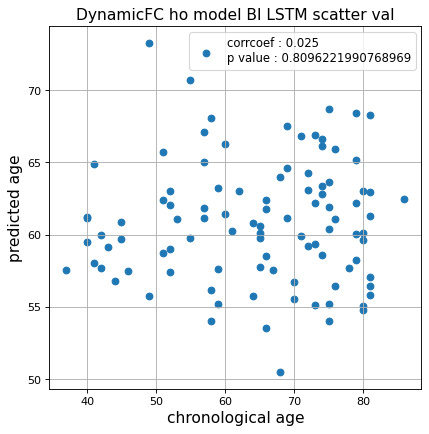

r^2 val data:  -0.17966653522145482


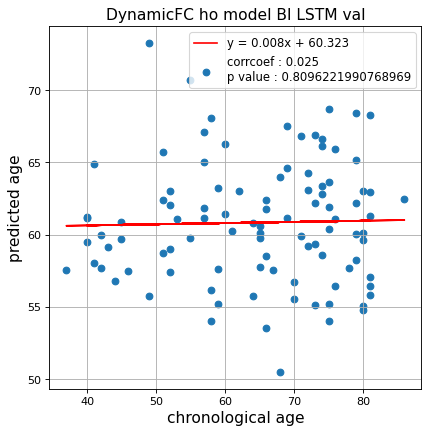

切片: 60.322696848323375
傾き: 0.00804982409041857
Nested Kfold ::: 4
Kfold: 1 ::: epoch: 100, loss: 0.012899249218977414, val loss: 0.5996461361646652
Kfold: 1 ::: epoch: 200, loss: 0.007194647243103156, val loss: 0.5733848959207535
Kfold: 1 ::: epoch: 300, loss: 0.004744484089314938, val loss: 0.5287775099277496
Kfold: 1 ::: epoch: 400, loss: 0.004614792388075819, val loss: 0.505859375
Kfold: 1 ::: epoch: 500, loss: 0.003602809989108489, val loss: 0.47626302391290665
Kfold: 1 ::: epoch: 600, loss: 0.002935815996562059, val loss: 0.47901177406311035
Kfold: 1 ::: epoch: 700, loss: 0.00347391410300938, val loss: 0.4635583236813545
save_epochs:694
best val loss:0.4588397666811943


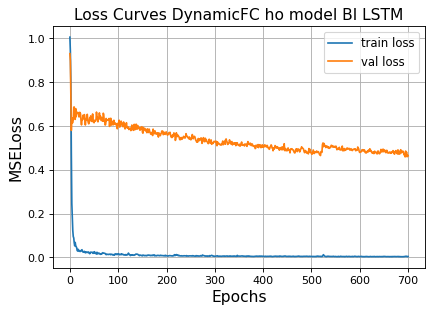

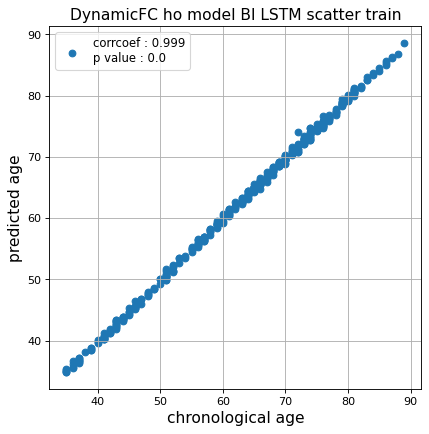

r^2 train data:  0.9985216721106579


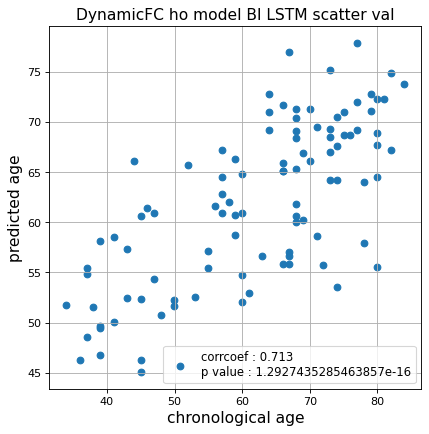

r^2 val data:  0.49119990065908437


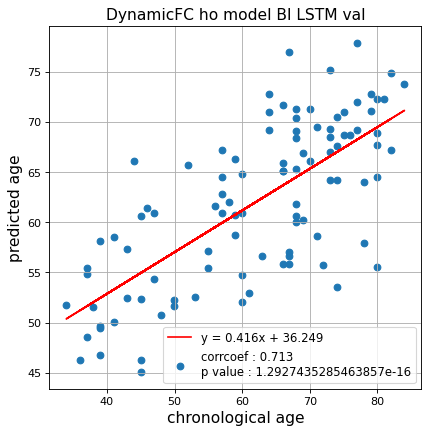

切片: 36.24864911289704
傾き: 0.41565510448638887
Kfold: 2 ::: epoch: 100, loss: 0.010096283701176826, val loss: 0.5260344743728638
Kfold: 2 ::: epoch: 200, loss: 0.006577812565060763, val loss: 0.4849923010915518
Kfold: 2 ::: epoch: 300, loss: 0.007664203500518432, val loss: 0.4801335986703634
Kfold: 2 ::: epoch: 400, loss: 0.004692478606907221, val loss: 0.47554241120815277
Kfold: 2 ::: epoch: 500, loss: 0.0042439257690253165, val loss: 0.47969087585806847
early stopping
save_epochs:388
best val loss:0.45863374695181847


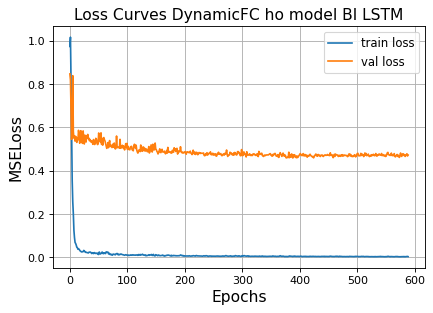

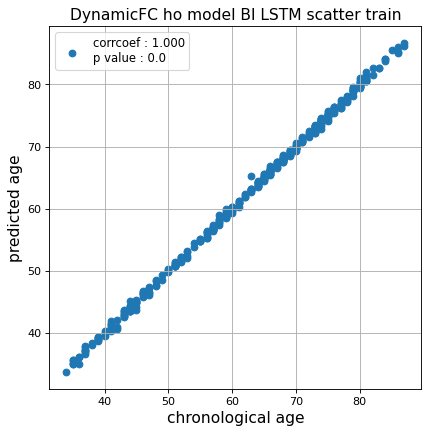

r^2 train data:  0.9990277490447708


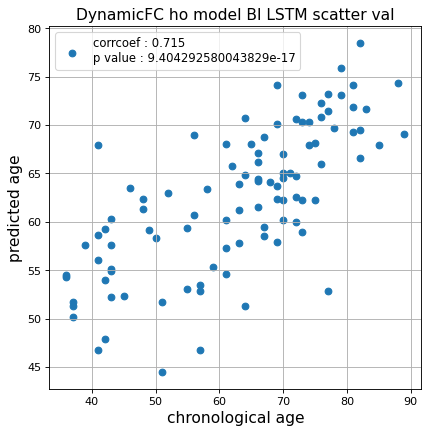

r^2 val data:  0.4764068030806411


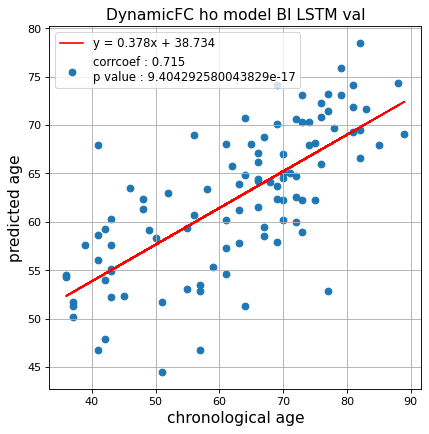

切片: 38.73359154998822
傾き: 0.378291142174515
Kfold: 3 ::: epoch: 100, loss: 0.01357760437979148, val loss: 0.6482387185096741
Kfold: 3 ::: epoch: 200, loss: 0.007680326485289977, val loss: 0.5981222093105316
Kfold: 3 ::: epoch: 300, loss: 0.006784118389567504, val loss: 0.5730943605303764
Kfold: 3 ::: epoch: 400, loss: 0.004141442047861906, val loss: 0.5761285498738289
Kfold: 3 ::: epoch: 500, loss: 0.0035898449221769204, val loss: 0.5940051674842834
Kfold: 3 ::: epoch: 600, loss: 0.0037795317923435224, val loss: 0.5935834646224976
early stopping
save_epochs:476
best val loss:0.5497827529907227


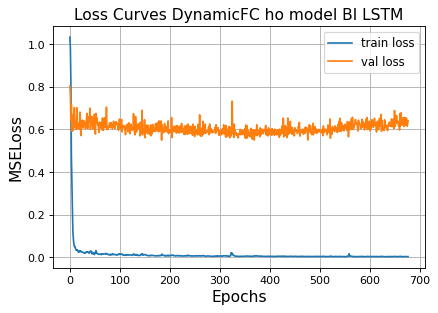

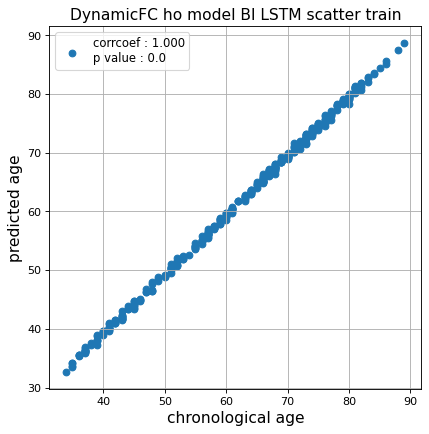

r^2 train data:  0.9970957154752103


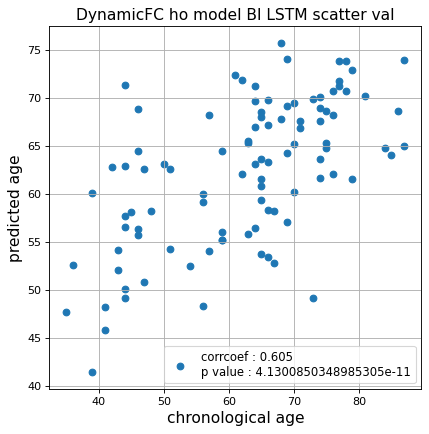

r^2 val data:  0.36522106980646674


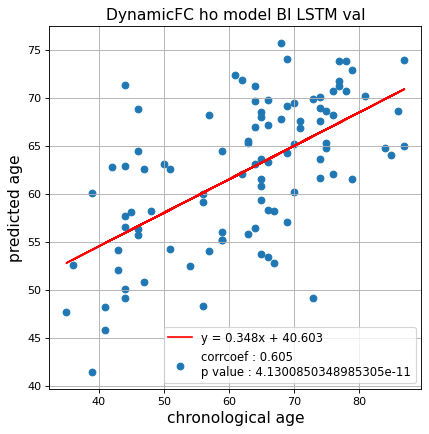

切片: 40.60335279375941
傾き: 0.34823691722950206
Kfold: 4 ::: epoch: 100, loss: 0.011184209312957067, val loss: 1.1792184859514236
Kfold: 4 ::: epoch: 200, loss: 0.007460590881796984, val loss: 1.1961715817451477
Kfold: 4 ::: epoch: 300, loss: 0.006340313272980543, val loss: 1.2439012229442596
Kfold: 4 ::: epoch: 400, loss: 0.004717836532598505, val loss: 1.268525555729866
early stopping
save_epochs:216
best val loss:1.177522897720337


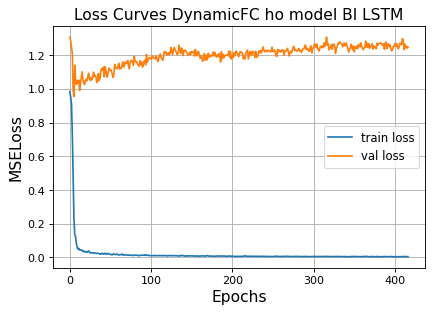

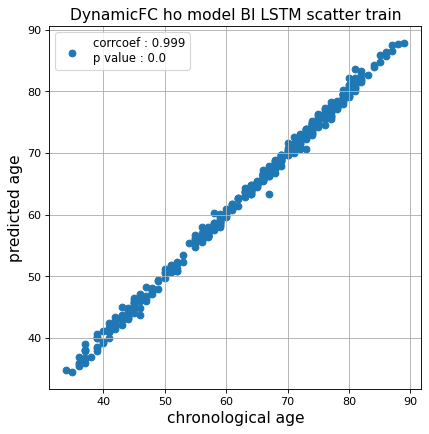

r^2 train data:  0.9969696226223679


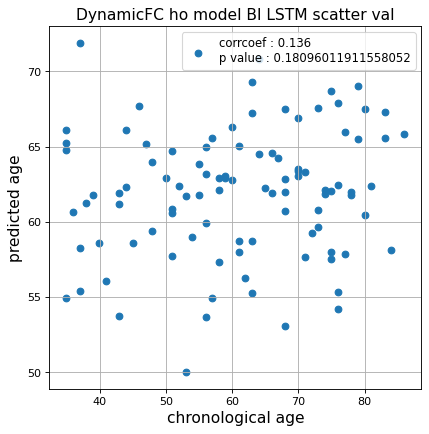

r^2 val data:  -0.015389386678305472


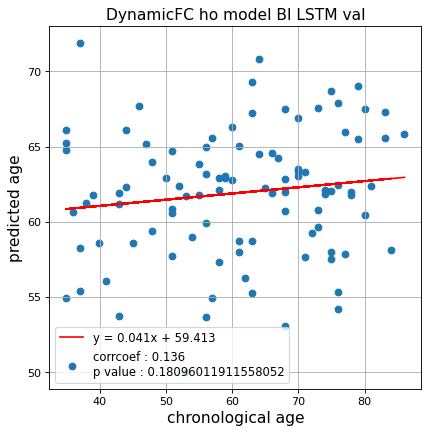

切片: 59.413317280051125
傾き: 0.041258166619720975
Kfold: 5 ::: epoch: 100, loss: 0.01433057739184453, val loss: 0.7561115026473999
Kfold: 5 ::: epoch: 200, loss: 0.009684383690070648, val loss: 0.7409601509571075


In [ ]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_ho_dynamic_2  = []
test_pred_ho_dynamic_corrected_2  = []
test_label_ho_dynamic_2 = []
test_idx_ho_dynamic_2   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_ho)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_dynamic_ho,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 700,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 128,
                                                           num_layers = 2,
                                                           fc_drop = 0.1,
                                                           bidirectional = True,
                                                           title = 'DynamicFC ho model BI LSTM'
                                                          )
    
    test_pred_ho_dynamic_2.append(test_pred)
    test_pred_ho_dynamic_corrected_2.append(test_pred_corrected)
    test_label_ho_dynamic_2.append(test_label)
    test_idx_ho_dynamic_2.append(test_idx)

### データ保存

In [ ]:
!python GPU.py LSTM_dFC_HO

In [ ]:
test_pred_ho_dynamic_1 = np.array(test_pred_ho_dynamic_1, dtype=object)
test_pred_ho_dynamic_corrected_1 = np.array(test_pred_ho_dynamic_corrected_1, dtype=object)

test_pred_ho_dynamic_2 = np.array(test_pred_ho_dynamic_2, dtype=object)
test_pred_ho_dynamic_corrected_2 = np.array(test_pred_ho_dynamic_corrected_2, dtype=object)

In [ ]:
np.savez('../02_data_analysis/temp/dynamic_ho_lstm',
         test_pred_ho_dynamic_1,
         test_pred_ho_dynamic_corrected_1,
         test_label_ho_dynamic_1,
         test_idx_ho_dynamic_1)
np.savez('../02_data_analysis/temp/dynamic_ho_lstm_bi',
         test_pred_ho_dynamic_2,
         test_pred_ho_dynamic_corrected_2,
         test_label_ho_dynamic_2,
         test_idx_ho_dynamic_2)